## GIVEN:
###  from the dataset we dont have the features known conceptually 
## End product:
### with this features given we have to predict the probability the datapoint belongs to one.


In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import re
import time
import warnings
import numpy as np
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import normalize
from sklearn.manifold import TSNE
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics.classification import accuracy_score, log_loss
from sklearn.linear_model import SGDClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from collections import Counter, defaultdict
from sklearn.calibration import CalibratedClassifierCV
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
import math
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as mat
from sklearn.metrics import normalized_mutual_info_score
from sklearn.ensemble import RandomForestClassifier
warnings.filterwarnings("ignore")
from scipy.linalg import eigh 
from mlxtend.classifier import StackingClassifier
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
import tensorflow as tf
from sklearn.ensemble import AdaBoostClassifier

In [2]:
#reading the dataset
data_set_train=pd.read_csv('ds_data/data_train.csv')
data_set_test=pd.read_csv('ds_data/data_test.csv')
#length of the dataset
print len(data_set_train)
print len(data_set_test)
#columns
print data_set_train.columns
#length of columns
print len(data_set_train.columns)

596000
892816
Index([u'id', u'num1', u'num2', u'num3', u'num4', u'num5', u'num6', u'num7',
       u'num8', u'num9', u'num10', u'num11', u'num12', u'num13', u'num14',
       u'num15', u'num16', u'num17', u'num18', u'num19', u'num20', u'num21',
       u'num22', u'num23', u'der1', u'der2', u'der3', u'der4', u'der5',
       u'der6', u'der7', u'der8', u'der9', u'der10', u'der11', u'der12',
       u'der13', u'der14', u'der15', u'der16', u'der17', u'der18', u'der19',
       u'cat1', u'cat2', u'cat3', u'cat4', u'cat5', u'cat6', u'cat7', u'cat8',
       u'cat9', u'cat10', u'cat11', u'cat12', u'cat13', u'cat14', u'target'],
      dtype='object')
58


In [3]:
#let us find the missing columns in the dataset
columns_missing_train=[]
columns_missing_test=[]
for x in data_set_train.columns:
    if sum(data_set_train[x].isnull())>0:
        columns_missing_train.append(x)
for x in data_set_test.columns:
    if sum(data_set_test[x].isnull())>0:
        columns_missing_test.append(x)
columns_missing=list(set(columns_missing_train+columns_missing_test))

## Discover discretness and randomness for initiating missing values

In [4]:
#let us group the random sets and distinct set columns
distinct_set_columns=[]
random_set_columns=[]
for x in columns_missing:
    print 'the column '+x+' has '+str(len(data_set_train[x].value_counts()))+' distinct values'+' the number of missing values is '+str((float(sum(data_set_train[x].isnull()))/float(len(data_set_train)))*100)+' percent'
    if len(data_set_train[x].value_counts()) >=849:
        random_set_columns.append(x)
    else:
        distinct_set_columns.append(x)       

the column cat1 has 4 distinct values the number of missing values is 0.0364093959732 percent
the column cat12 has 5 distinct values the number of missing values is 0.0956375838926 percent
the column cat10 has 2 distinct values the number of missing values is 1.93003355705 percent
the column num22 has 849 distinct values the number of missing values is 7.15889261745 percent
the column cat2 has 2 distinct values the number of missing values is 0.0139261744966 percent
the column num20 has 183 distinct values the number of missing values is 0.000167785234899 percent
the column cat4 has 12 distinct values the number of missing values is 0.0179530201342 percent
the column cat5 has 2 distinct values the number of missing values is 0.000838926174497 percent
the column cat6 has 2 distinct values the number of missing values is 69.0926174497 percent
the column cat8 has 2 distinct values the number of missing values is 44.7865771812 percent
the column cat3 has 7 distinct values the number of mis

### from the information above we can drop column cat6 since it has almost 70 percent of missing values

#### missing value approaches :
#### 1.) replace using mode , mean ,median .
#### 2.)mode , mean,median  imputation with respect to its class label.
#### 3.)additional missing feature column add on based on the 1st approach .
#### 4.)additional missing feature column add on based on the 2 nd approach.


In [5]:
data_set_train.drop('cat6',axis=1,inplace=True)
data_set_test.drop('cat6',axis=1,inplace=True)
columns_missing=[x for x in columns_missing if x!='cat6']
print columns_missing

['cat1', 'cat12', 'cat10', 'num22', 'cat2', 'num20', 'cat4', 'cat5', 'cat8', 'cat3', 'num18', 'num19']


In [6]:
#approch number 1 replace using mean and mode for random and distinct
data_set_train_approach_1_mode=data_set_train.copy()
data_set_test_approach_1_mode=data_set_test.copy()
data_set_train_approach_1_mean=data_set_train.copy()
data_set_test_approach_1_mean=data_set_test.copy()
data_set_train_approach_1_median=data_set_train.copy()
data_set_test_approach_1_median=data_set_test.copy()
for x in columns_missing:
    data_set_test_approach_1_mode[x]=data_set_test_approach_1_mode[x].fillna(data_set_test_approach_1_mode[x].mode()[0])
    data_set_train_approach_1_mode[x]=data_set_train_approach_1_mode[x].fillna(data_set_train_approach_1_mode[x].mode()[0])
    data_set_test_approach_1_mean[x]=data_set_test_approach_1_mean[x].fillna(data_set_test_approach_1_mean[x].mean())
    data_set_train_approach_1_mean[x]=data_set_train_approach_1_mean[x].fillna(data_set_train_approach_1_mean[x].mean())
    data_set_test_approach_1_median[x]=data_set_test_approach_1_median[x].fillna(data_set_test_approach_1_median[x].median())
    data_set_train_approach_1_median[x]=data_set_train_approach_1_median[x].fillna(data_set_train_approach_1_median[x].median())

In [7]:
#approch number 2 imputation for distinct and random we cant perform imputation to our test data as we dont have target values over there
data_set_train_approach_2_mode=data_set_train.copy()
data_set_test_approach_2_mode=data_set_test_approach_1_mode.copy()
data_set_train_approach_2_binary_1_mode=data_set_train_approach_2_mode[data_set_train_approach_2_mode['target']==1]
ds_approach_2_nan_b1_mode=data_set_train_approach_2_binary_1_mode.copy()
data_set_train_approach_2_binary_0_mode=data_set_train_approach_2_mode[data_set_train_approach_2_mode['target']==0]
ds_approach_2_nan_b0_mode=data_set_train_approach_2_binary_0_mode.copy()
ds_train_imputation_miss_mode=pd.concat([ds_approach_2_nan_b0_mode,ds_approach_2_nan_b1_mode])
for x in columns_missing:
    data_set_train_approach_2_binary_1_mode[x]=data_set_train_approach_2_binary_1_mode[x].fillna(data_set_train_approach_2_binary_1_mode[x].mode()[0])
    data_set_train_approach_2_binary_0_mode[x]=data_set_train_approach_2_binary_0_mode[x].fillna(data_set_train_approach_2_binary_0_mode[x].mode()[0])
data_set_train_approach_2_mode=(pd.concat([data_set_train_approach_2_binary_0_mode,data_set_train_approach_2_binary_1_mode]))
data_set_train_approach_2_mean=data_set_train.copy()
data_set_test_approach_2_mean=data_set_test_approach_1_mean.copy()
data_set_train_approach_2_binary_1_mean=data_set_train_approach_2_mean[data_set_train_approach_2_mean['target']==1]
ds_approach_2_nan_b1_mean=data_set_train_approach_2_binary_1_mean.copy()
data_set_train_approach_2_binary_0_mean=data_set_train_approach_2_mean[data_set_train_approach_2_mean['target']==0]
ds_approach_2_nan_b0_mean=data_set_train_approach_2_binary_0_mean.copy()
ds_train_imputation_miss_mean=pd.concat([ds_approach_2_nan_b0_mean,ds_approach_2_nan_b1_mean])
for x in columns_missing:
    data_set_train_approach_2_binary_1_mean[x]=data_set_train_approach_2_binary_1_mean[x].fillna(data_set_train_approach_2_binary_1_mean[x].mean())
    data_set_train_approach_2_binary_0_mean[x]=data_set_train_approach_2_binary_0_mean[x].fillna(data_set_train_approach_2_binary_0_mean[x].mean())
data_set_train_approach_2_mean=(pd.concat([data_set_train_approach_2_binary_0_mean,data_set_train_approach_2_binary_1_mean]))
data_set_train_approach_2_median=data_set_train.copy()
data_set_test_approach_2_median=data_set_test_approach_1_median.copy()
data_set_train_approach_2_binary_1_median=data_set_train_approach_2_median[data_set_train_approach_2_median['target']==1]
ds_approach_2_nan_b1_median=data_set_train_approach_2_binary_1_median.copy()
data_set_train_approach_2_binary_0_median=data_set_train_approach_2_median[data_set_train_approach_2_median['target']==0]
ds_approach_2_nan_b0_median=data_set_train_approach_2_binary_0_median.copy()
ds_train_imputation_miss_median=pd.concat([ds_approach_2_nan_b0_median,ds_approach_2_nan_b1_median])
for x in columns_missing:
    data_set_train_approach_2_binary_1_median[x]=data_set_train_approach_2_binary_1_median[x].fillna(data_set_train_approach_2_binary_1_median[x].median())
    data_set_train_approach_2_binary_0_median[x]=data_set_train_approach_2_binary_0_median[x].fillna(data_set_train_approach_2_binary_0_median[x].median())
data_set_train_approach_2_median=(pd.concat([data_set_train_approach_2_binary_0_median,data_set_train_approach_2_binary_1_median]))


In [8]:
#approach number 3 where we add add on features to our data matrix 
data_set_train_add_on_features_approach3_mean=data_set_train_approach_1_mean.copy()
data_set_train_add_on_features_approach3_median=data_set_train_approach_1_median.copy()
data_set_train_add_on_features_approach3_mode=data_set_train_approach_1_mode.copy()

data_set_test_add_on_features_approach3_mean=data_set_test_approach_1_mean.copy()
data_set_test_add_on_features_approach3_median=data_set_test_approach_1_median.copy()
data_set_test_add_on_features_approach3_mode=data_set_test_approach_1_mode.copy()

for x in data_set_train.columns:
    if x!='target' and x!='id':
        data_set_train_add_on_features_approach3_mean[x+'_']=np.array(data_set_train[x].isnull(),np.int32)
        data_set_test_add_on_features_approach3_mean[x+'_']=np.array(data_set_test[x].isnull(),np.int32)
        data_set_train_add_on_features_approach3_median[x+'_']=np.array(data_set_train[x].isnull(),np.int32)
        data_set_test_add_on_features_approach3_median[x+'_']=np.array(data_set_test[x].isnull(),np.int32)
        data_set_train_add_on_features_approach3_mode[x+'_']=np.array(data_set_train[x].isnull(),np.int32)
        data_set_test_add_on_features_approach3_mode[x+'_']=np.array(data_set_test[x].isnull(),np.int32)

In [9]:
#approach number 4 where we add add on features to our data matrix 
data_set_train_add_on_features_approach4_mean=data_set_train_approach_2_mean.copy()
data_set_train_add_on_features_approach4_median=data_set_train_approach_2_median.copy()
data_set_train_add_on_features_approach4_mode=data_set_train_approach_2_mode.copy()

data_set_test_add_on_features_approach4_mean=data_set_test_add_on_features_approach3_mean.copy()
data_set_test_add_on_features_approach4_median=data_set_test_add_on_features_approach3_median.copy()
data_set_test_add_on_features_approach4_mode=data_set_test_add_on_features_approach3_mode.copy()

for x in data_set_train.columns:
    if x!='target' and x!='id':
        data_set_train_add_on_features_approach4_mean[x+'_']=np.array(ds_train_imputation_miss_mean[x].isnull(),np.int32)
        data_set_train_add_on_features_approach4_median[x+'_']=np.array(ds_train_imputation_miss_median[x].isnull(),np.int32)
        data_set_train_add_on_features_approach4_mode[x+'_']=np.array(ds_train_imputation_miss_mode[x].isnull(),np.int32)

## we have filled in missing values based on the four criteria each has three formats so totally we have 12 datasets so lets go for it 


In [10]:
# sort all of them by the index values
data_set_train_approach_1_mean.sort_values(by='id',inplace=True)
data_set_test_approach_1_mean.sort_values(by='id',inplace=True)
data_set_train_approach_1_mode.sort_values(by='id',inplace=True)
data_set_test_approach_1_mode.sort_values(by='id',inplace=True)
data_set_train_approach_1_median.sort_values(by='id',inplace=True)
data_set_test_approach_1_median.sort_values(by='id',inplace=True)
data_set_train_approach_2_mean.sort_values(by='id',inplace=True)
data_set_test_approach_2_mean.sort_values(by='id',inplace=True)
data_set_train_approach_2_mode.sort_values(by='id',inplace=True)
data_set_test_approach_2_mode.sort_values(by='id',inplace=True)
data_set_train_approach_2_median.sort_values(by='id',inplace=True)
data_set_test_approach_2_median.sort_values(by='id',inplace=True)
data_set_train_add_on_features_approach3_mean.sort_values(by='id',inplace=True)
data_set_test_add_on_features_approach3_mean.sort_values(by='id',inplace=True)
data_set_train_add_on_features_approach3_mode.sort_values(by='id',inplace=True)
data_set_test_add_on_features_approach3_mode.sort_values(by='id',inplace=True)
data_set_train_add_on_features_approach3_median.sort_values(by='id',inplace=True)
data_set_test_add_on_features_approach3_median.sort_values(by='id',inplace=True)
data_set_train_add_on_features_approach4_mean.sort_values(by='id',inplace=True)
data_set_test_add_on_features_approach4_mean.sort_values(by='id',inplace=True)
data_set_train_add_on_features_approach4_mode.sort_values(by='id',inplace=True)
data_set_test_add_on_features_approach4_mode.sort_values(by='id',inplace=True)
data_set_train_add_on_features_approach4_median.sort_values(by='id',inplace=True)
data_set_test_add_on_features_approach4_median.sort_values(by='id',inplace=True)

In [11]:
data_set_target_train=data_set_train_approach_1_mean['target']

In [12]:
data_set_train_approach_1_mean.sort_values(by='id',inplace=True)

# Exploratory data analysis finding the distributions of features

Approach 1 mean median mode
num1
[ 0.40519847  0.3110652   0.17810594  0.11058437  0.          0.07242066
  0.13274569  0.03819823  0.03739573]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.31515436  0.55709396  0.69562081  0.78163087  0.78163087  0.83795805
  0.9412047   0.97091443  1.        ]


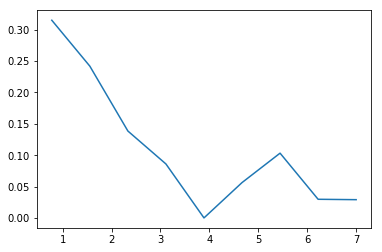

num2
[ 0.11478981  0.13208832  0.11269219  0.09240787  0.16936638  0.07197254
  0.05453264  0.03496492  0.03536714]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.14029866  0.30173993  0.43947483  0.55241779  0.75942114  0.84738758
  0.91403859  0.95677349  1.        ]


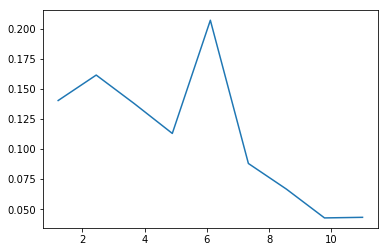

num3
[ 5.4563104  0.         0.         0.         0.         0.         0.         0.
  3.5436896]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.60625671  0.60625671  0.60625671  0.60625671  0.60625671  0.60625671
  0.60625671  0.60625671  1.        ]


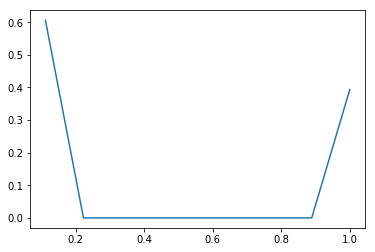

num4
[ 6.68686409  0.          0.          0.          0.          0.          0.
  0.          2.31313591]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.7429849  0.7429849  0.7429849  0.7429849  0.7429849  0.7429849
  0.7429849  0.7429849  1.       ]


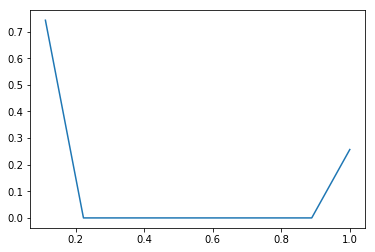

num5
[ 7.52460403  0.          0.          0.          0.          0.          0.
  0.          1.47539597]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.83606711  0.83606711  0.83606711  0.83606711  0.83606711  0.83606711
  0.83606711  0.83606711  1.        ]


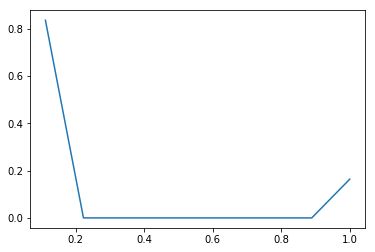

num6
[ 7.33222148  0.          0.          0.          0.          0.          0.
  0.          1.66777852]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.81469128  0.81469128  0.81469128  0.81469128  0.81469128  0.81469128
  0.81469128  0.81469128  1.        ]


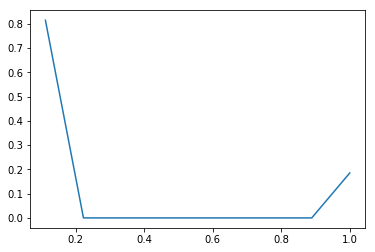

num7
[  8.99663255e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.36744966e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99962584  0.99962584  0.99962584  0.99962584  0.99962584  0.99962584
  0.99962584  0.99962584  1.        ]


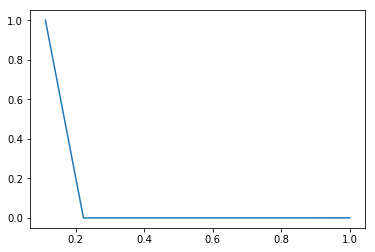

num8
[ 8.98476342  0.          0.          0.          0.          0.          0.
  0.          0.01523658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99830705  0.99830705  0.99830705  0.99830705  0.99830705  0.99830705
  0.99830705  0.99830705  1.        ]


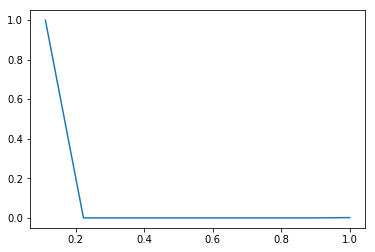

num9
[ 8.91508893  0.          0.          0.          0.          0.          0.
  0.          0.08491107]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99056544  0.99056544  0.99056544  0.99056544  0.99056544  0.99056544
  0.99056544  0.99056544  1.        ]


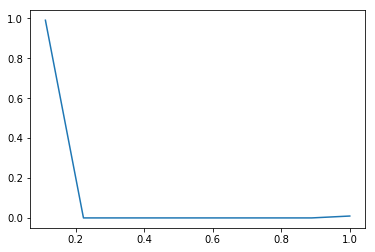

num10
[  8.99146812e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   8.53187919e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99905201  0.99905201  0.99905201  0.99905201  0.99905201  0.99905201
  0.99905201  0.99905201  1.        ]


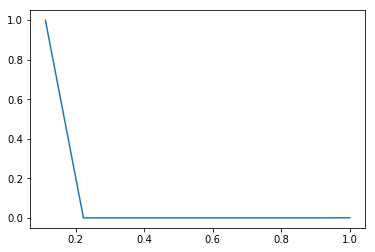

num11
[  2.22589178e+00   0.00000000e+00   2.07596477e-02   0.00000000e+00
   2.81250000e-03   0.00000000e+00   5.17197987e-04   0.00000000e+00
   1.88758389e-05]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.98928523  0.98928523  0.99851174  0.99851174  0.99976174  0.99976174
  0.99999161  0.99999161  1.        ]


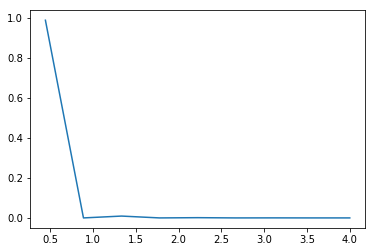

num12
[ 0.05052685  0.02172754  0.08610983  0.04949187  0.14395818  0.06931324
  0.11611371  0.06189068  0.09317579]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.07298322  0.10436745  0.22874832  0.30023658  0.50817617  0.6082953
  0.7760151   0.86541275  1.        ]


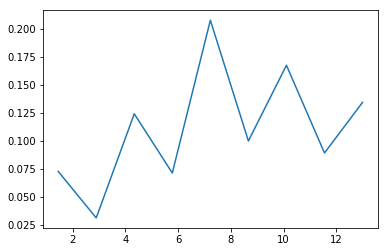

num13
[ 3.05244966  0.          0.          0.          0.          0.          0.
  0.          5.94755034]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.33916107  0.33916107  0.33916107  0.33916107  0.33916107  0.33916107
  0.33916107  0.33916107  1.        ]


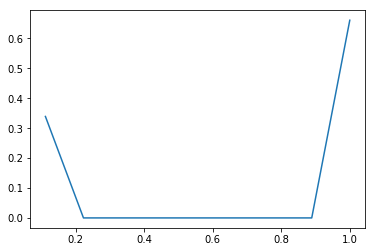

num14
[ 7.91039597  0.          0.          0.          0.          0.          0.
  0.          1.08960403]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87893289  0.87893289  0.87893289  0.87893289  0.87893289  0.87893289
  0.87893289  0.87893289  1.        ]


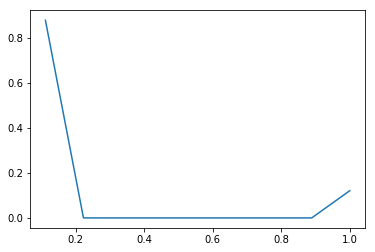

num15
[ 7.61901342  0.          0.          0.          0.          0.          0.
  0.          1.38098658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.84655705  0.84655705  0.84655705  0.84655705  0.84655705  0.84655705
  0.84655705  0.84655705  1.        ]


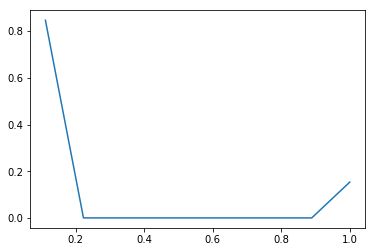

num16
[ 0.3642953   0.72557047  1.09874161  0.          0.9002349   1.48822148
  1.14088926  0.          4.28204698]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.03642953  0.10898658  0.21886074  0.21886074  0.30888423  0.45770638
  0.5717953   0.5717953   1.        ]


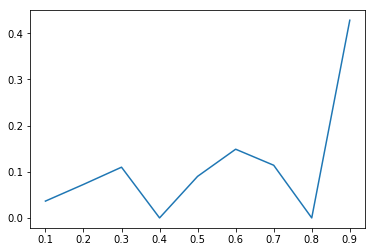

num17
[ 1.01735738  1.76348154  1.08987416  0.17823826  0.30828859  0.33372483
  0.1565604   0.04907718  0.10339765]
[ 0.   0.2  0.4  0.6  0.8  1.   1.2  1.4  1.6  1.8]
[ 0.20347148  0.55616779  0.77414262  0.80979027  0.87144799  0.93819295
  0.96950503  0.97932047  1.        ]


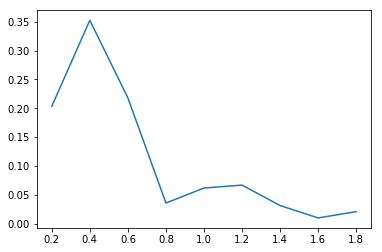

num18
[  1.11996963e-01   1.50383662e+00   4.51606660e-01   1.68504280e-01
   2.48911675e-02   2.12267927e-03   1.82269419e-04   2.27836773e-05
   1.51891182e-05]
[ 0.06123724  0.50309366  0.94495008  1.3868065   1.82866292  2.27051934
  2.71237576  3.15423218  3.5960886   4.03794502]
[ 0.04948658  0.71396644  0.91351174  0.98796644  0.99896477  0.99990268
  0.99998322  0.99999329  1.        ]


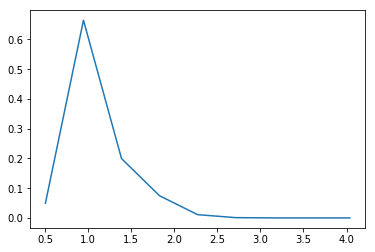

num19
[  1.30973154e-01   0.00000000e+00   0.00000000e+00   3.07192953e-01
   0.00000000e+00   0.00000000e+00   9.54352349e-01   2.51677852e-05
   1.60745638e+00]
[ 0.          0.33333333  0.66666667  1.          1.33333333  1.66666667
  2.          2.33333333  2.66666667  3.        ]
[ 0.04365772  0.04365772  0.04365772  0.14605537  0.14605537  0.14605537
  0.46417282  0.46418121  1.        ]


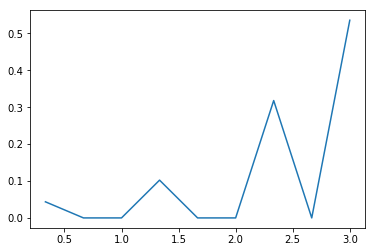

num20
[  7.77776344e-04   2.63714143e+00   4.73178387e+00   3.44140106e-01
   1.00851666e-02   1.49073799e-03   0.00000000e+00   0.00000000e+00
   4.92591684e-04]
[ 0.1         0.22943456  0.35886913  0.48830369  0.61773825  0.74717281
  0.87660738  1.00604194  1.1354765   1.26491106]
[  1.00671141e-04   3.41437919e-01   9.53894295e-01   9.98437919e-01
   9.99743289e-01   9.99936242e-01   9.99936242e-01   9.99936242e-01
   1.00000000e+00]


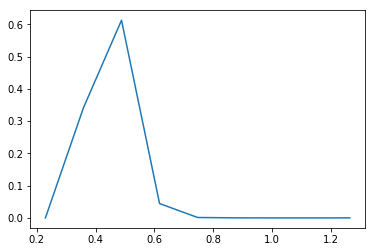

num21
[  4.62205815e-01   1.78143611e+00   2.84879902e-01   5.51630331e-02
   8.08558816e-03   1.47960171e-03   3.48141578e-04   3.48141578e-05
   2.17588487e-05]
[ 0.25061907  0.63617539  1.02173172  1.40728805  1.79284437  2.1784007
  2.56395702  2.94951335  3.33506968  3.720626  ]
[ 0.17820638  0.86505034  0.97488758  0.99615604  0.99927349  0.99984396
  0.99997819  0.99999161  1.        ]


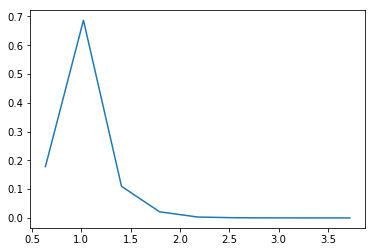

num22
[  2.26430562e-03   1.39584410e-02   1.52482353e-02   3.45842588e+00
   1.02410531e+01   2.74468236e+00   3.68422588e-01   2.36892227e-01
   1.66240159e-03]
[ 0.10954451  0.16808358  0.22662264  0.28516171  0.34370077  0.40223984
  0.46077891  0.51931797  0.57785704  0.6363961 ]
[  1.32550336e-04   9.49664430e-04   1.84228188e-03   2.04295302e-01
   8.03796980e-01   9.64468121e-01   9.86035235e-01   9.99902685e-01
   1.00000000e+00]


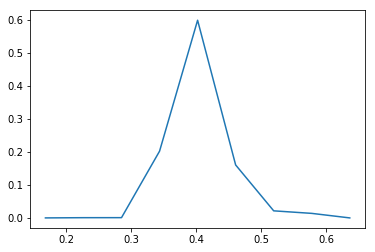

num23
[ 0.05734502  0.          0.0271167   0.02632164  0.09525352  0.1609971
  0.3195283   0.72976175  0.98902713]
[ 0.          0.41573971  0.83147942  1.24721913  1.66295884  2.07869855
  2.49443826  2.91017797  3.32591768  3.74165739]
[ 0.0238406   0.0238406   0.03511409  0.04605705  0.08565772  0.1525906
  0.28543121  0.58882215  1.        ]


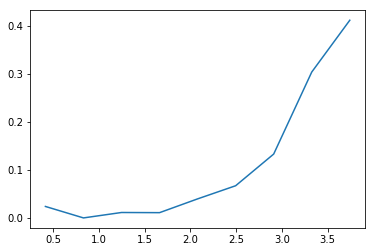

der1
[ 1.00446309  0.99966443  1.99724832  0.          0.99555369  2.00659396
  1.00062081  0.          1.9958557 ]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10044631  0.20041275  0.40013758  0.40013758  0.49969295  0.70035235
  0.80041443  0.80041443  1.        ]


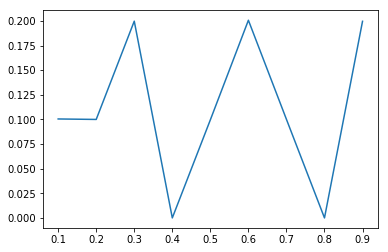

der2
[ 1.00177852  0.99781879  1.99901007  0.          1.00493289  2.00877517
  0.99964765  0.          1.98803691]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10017785  0.19995973  0.39986074  0.39986074  0.50035403  0.70123154
  0.80119631  0.80119631  1.        ]


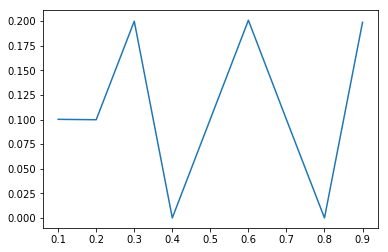

der3
[ 0.99666107  1.00894295  1.99874161  0.          0.99496644  2.005
  0.99758389  0.          1.99810403]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.09966611  0.2005604   0.40043456  0.40043456  0.49993121  0.70043121
  0.8001896   0.8001896   1.        ]


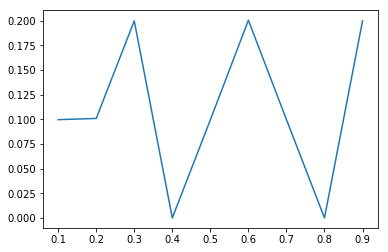

der4
[ 0.07228691  0.32664262  0.          0.58660369  0.          0.53074027
  0.          0.24079228  0.04293423]
[ 0.          0.55555556  1.11111111  1.66666667  2.22222222  2.77777778
  3.33333333  3.88888889  4.44444444  5.        ]
[ 0.0401594   0.22162752  0.22162752  0.54751846  0.54751846  0.84237416
  0.84237416  0.97614765  1.        ]


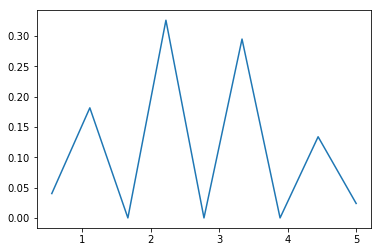

der5
[ 0.15430117  0.43060822  0.          0.49186661  0.30032215  0.
  0.10251091  0.01898406  0.00140688]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.10286745  0.3899396   0.3899396   0.71785067  0.91806544  0.91806544
  0.98640604  0.99906208  1.        ]


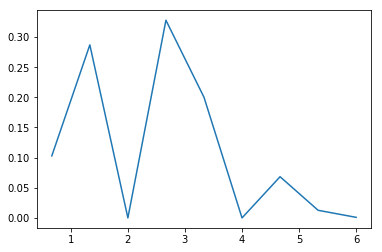

der6
[  1.05704698e-05   1.99328859e-04   1.81208054e-03   1.01431208e-02
   4.02372483e-02   1.11065436e-01   2.11320302e-01   2.64672483e-01
   2.60539430e-01]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[  1.17449664e-05   2.33221477e-04   2.24664430e-03   1.35167785e-02
   5.82248322e-02   1.81630872e-01   4.16431208e-01   7.10511745e-01
   1.00000000e+00]


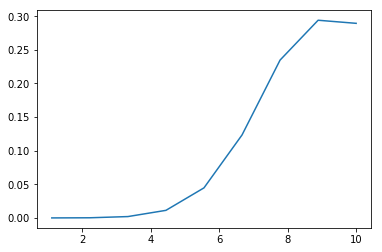

der7
[ 0.02568624  0.11643456  0.23373993  0.27285403  0.20502013  0.10366275
  0.03428356  0.00736074  0.00095805]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.02568624  0.14212081  0.37586074  0.64871477  0.8537349   0.95739765
  0.99168121  0.99904195  1.        ]


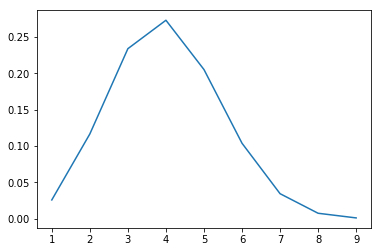

der8
[  1.52516779e-04   1.27147651e-03   6.75151007e-03   2.59716443e-02
   7.49340604e-02   1.55663758e-01   2.29471309e-01   2.28791779e-01
   1.76991946e-01]
[  2.           3.11111111   4.22222222   5.33333333   6.44444444
   7.55555556   8.66666667   9.77777778  10.88888889  12.        ]
[  1.69463087e-04   1.58221477e-03   9.08389262e-03   3.79412752e-02
   1.21201342e-01   2.94161074e-01   5.49129195e-01   8.03342282e-01
   1.00000000e+00]


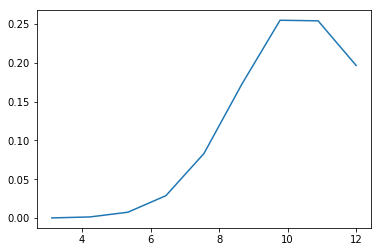

der9
[ 0.07450671  0.26219942  0.39428715  0.33013303  0.          0.16621956
  0.04962943  0.00816731  0.00057167]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.05794966  0.26188255  0.56855034  0.82532047  0.82532047  0.95460235
  0.99320302  0.99955537  1.        ]


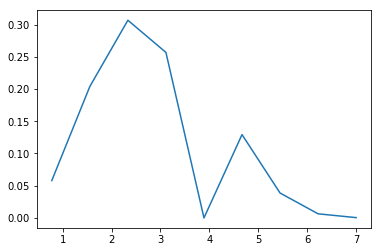

der10
[  3.51181208e-03   5.22344295e-02   1.35866779e-01   1.15905503e-01
   3.48499329e-02   1.54280537e-02   2.03496644e-03   1.61275168e-04
   7.24832215e-06]
[  0.           2.77777778   5.55555556   8.33333333  11.11111111
  13.88888889  16.66666667  19.44444444  22.22222222  25.        ]
[ 0.00975503  0.15485067  0.53225839  0.85421812  0.95102349  0.99387919
  0.99953188  0.99997987  1.        ]


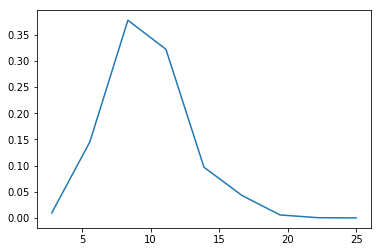

der11
[  4.36592194e-02   1.30036648e-01   1.55696662e-01   9.64893147e-02
   3.66580714e-02   9.15657012e-03   1.75565171e-03   2.05051219e-04
   2.70222536e-05]
[  0.           2.11111111   4.22222222   6.33333333   8.44444444
  10.55555556  12.66666667  14.77777778  16.88888889  19.        ]
[ 0.09216946  0.36669128  0.69538423  0.89908389  0.97647315  0.99580369
  0.99951007  0.99994295  1.        ]


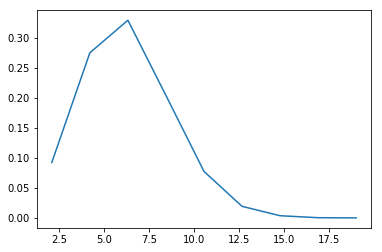

der12
[  5.20559396e-01   2.19741946e-01   1.06382718e-01   3.89808725e-02
   1.10234899e-02   2.60486577e-03   5.85906040e-04   9.96644295e-05
   2.11409396e-05]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[ 0.57839933  0.82255705  0.94076007  0.98407215  0.99632047  0.99921477
  0.99986577  0.99997651  1.        ]


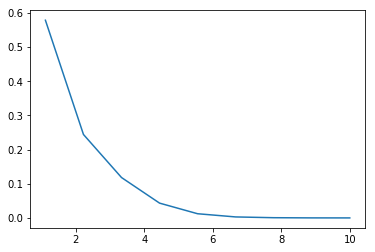

der13
[  1.51566598e-01   1.62077827e-01   2.65374548e-01   6.34588281e-02
   4.34295302e-02   4.51393908e-03   1.75632421e-03   1.02219928e-04
   2.78781621e-05]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.21892953  0.45304195  0.83636074  0.92802349  0.99075503  0.99727517
  0.99981208  0.99995973  1.        ]


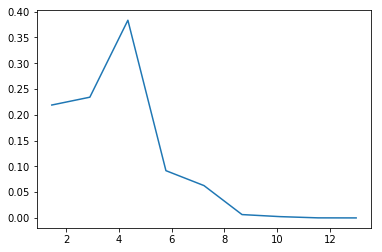

der14
[  7.65997957e-03   8.51040998e-02   1.10167275e-01   1.33256201e-01
   3.78521301e-02   1.53534432e-02   1.57834841e-03   3.17114094e-04
   1.57572221e-05]
[  0.           2.55555556   5.11111111   7.66666667  10.22222222
  12.77777778  15.33333333  17.88888889  20.44444444  23.        ]
[ 0.0195755   0.23706376  0.51860235  0.85914597  0.95587919  0.99511577
  0.99914933  0.99995973  1.        ]


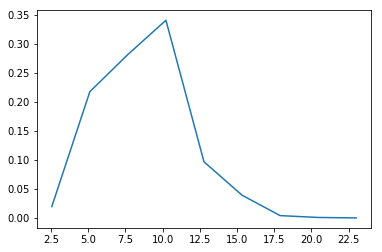

der15
[ 7.89813423  0.          0.          0.          0.          0.          0.
  0.          1.10186577]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87757047  0.87757047  0.87757047  0.87757047  0.87757047  0.87757047
  0.87757047  0.87757047  1.        ]


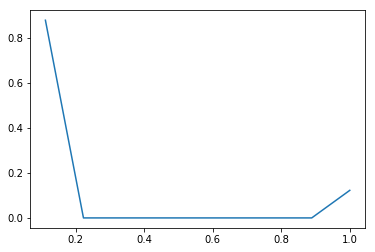

der16
[ 3.34988758  0.          0.          0.          0.          0.          0.
  0.          5.65011242]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.37220973  0.37220973  0.37220973  0.37220973  0.37220973  0.37220973
  0.37220973  0.37220973  1.        ]


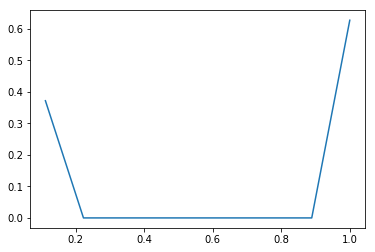

der17
[ 4.01236913  0.          0.          0.          0.          0.          0.
  0.          4.98763087]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.44581879  0.44581879  0.44581879  0.44581879  0.44581879  0.44581879
  0.44581879  0.44581879  1.        ]


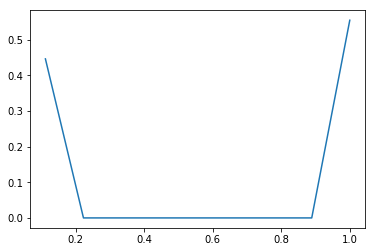

der18
[ 6.41493121  0.          0.          0.          0.          0.          0.
  0.          2.58506879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.71277013  0.71277013  0.71277013  0.71277013  0.71277013  0.71277013
  0.71277013  0.71277013  1.        ]


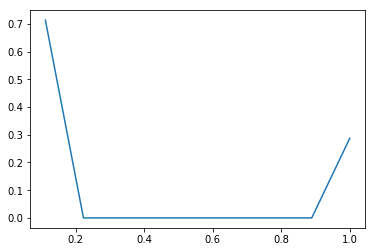

der19
[ 5.85918121  0.          0.          0.          0.          0.          0.
  0.          3.14081879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.65102013  0.65102013  0.65102013  0.65102013  0.65102013  0.65102013
  0.65102013  0.65102013  1.        ]


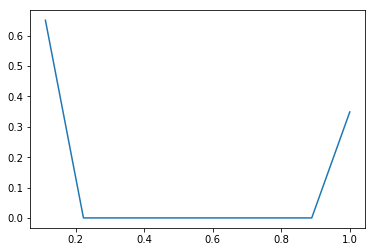

cat1
[  2.17666107e+00   1.09228188e-03   0.00000000e+00   6.22832215e-01
   0.00000000e+00   0.00000000e+00   1.42072148e-01   0.00000000e+00
   5.73422819e-02]
[ 1.          1.33333333  1.66666667  2.          2.33333333  2.66666667
  3.          3.33333333  3.66666667  4.        ]
[ 0.72555369  0.72591779  0.72591779  0.93352852  0.93352852  0.93352852
  0.98088591  0.98088591  1.        ]


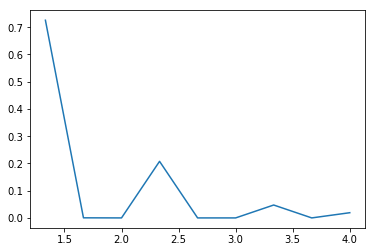

cat2
[  5.24613926e+00   0.00000000e+00   0.00000000e+00   1.25335570e-03
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.75260738e+00]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.58290436  0.58290436  0.58290436  0.58304362  0.58304362  0.58304362
  0.58304362  0.58304362  1.        ]


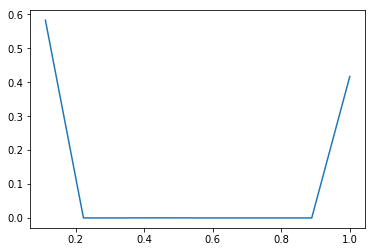

cat3
[ 1.34526342  0.02096728  0.          0.01053523  0.02074581  0.
  0.04623826  0.00415772  0.05209228]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.89684228  0.91082047  0.91082047  0.91784396  0.9316745   0.9316745
  0.9625      0.96527181  1.        ]


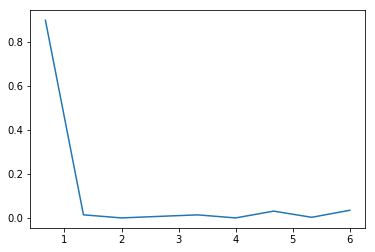

cat4
[ 0.00999939  0.00294326  0.00915101  0.03598627  0.11070439  0.24639353
  0.02088835  0.02793487  0.35418075]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.01222148  0.01581879  0.02700336  0.07098658  0.20629195  0.5074396
  0.5329698   0.56711242  1.        ]


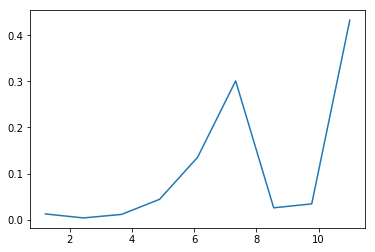

cat5
[  1.53019631e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   7.55033557e-05
   7.46972819e+00]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.17002181  0.17002181  0.17002181  0.17002181  0.17002181  0.17002181
  0.17002181  0.1700302   1.        ]


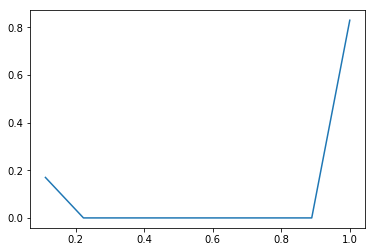

cat7
[  8.34305369e-01   5.39496644e-02   3.99395973e-02   1.07382550e-03
   3.85906040e-04   9.17785235e-04   2.61912752e-03   2.33221477e-04
   6.65755034e-02]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.83430537  0.88825503  0.92819463  0.92926846  0.92965436  0.93057215
  0.93319128  0.9334245   1.        ]


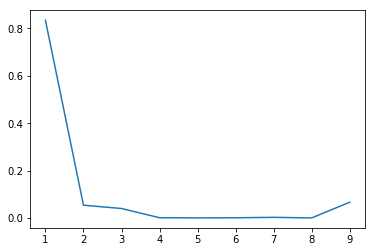

cat8
[ 2.35855872  0.          0.          0.          4.03079195  0.          0.
  0.          2.61064933]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.26206208  0.26206208  0.26206208  0.26206208  0.70992785  0.70992785
  0.70992785  0.70992785  1.        ]


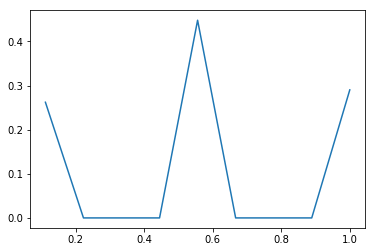

cat9
[ 0.20352685  0.01210008  0.02893999  0.03300296  0.01692252  0.14675987
  0.00767647  0.07201865  0.00846437]
[  0.           1.88888889   3.77777778   5.66666667   7.55555556
   9.44444444  11.33333333  13.22222222  15.11111111  17.        ]
[ 0.3844396   0.4072953   0.46195973  0.52429866  0.55626342  0.83347651
  0.84797651  0.98401174  1.        ]


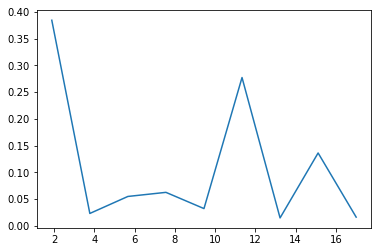

cat10
[ 0.46242785  0.          0.          0.          0.          0.          0.
  0.          8.53757215]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.05138087  0.05138087  0.05138087  0.05138087  0.05138087  0.05138087
  0.05138087  0.05138087  1.        ]


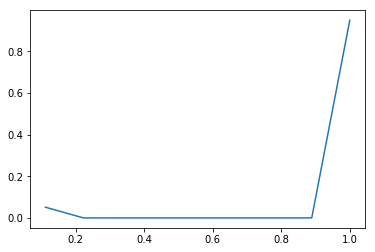

cat11
[ 1.51130537  0.          0.          0.          0.          0.          0.
  0.          7.48869463]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.16792282  0.16792282  0.16792282  0.16792282  0.16792282  0.16792282
  0.16792282  0.16792282  1.        ]


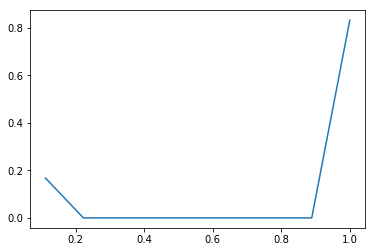

cat12
[ 0.73525923  0.          0.11208473  0.          1.33626594  0.          0.0557781
  0.          0.010612  ]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.32678188  0.32678188  0.37659732  0.37659732  0.97049329  0.97049329
  0.99528356  0.99528356  1.        ]


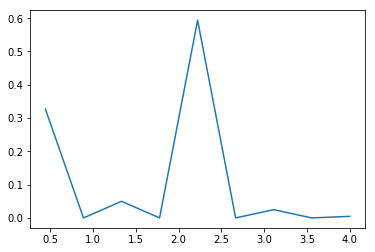

cat13
[  3.67172819e-02   0.00000000e+00   0.00000000e+00   0.00000000e+00
   4.46195386e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.32885906e-03]
[ 0.          0.22222222  0.44444444  0.66666667  0.88888889  1.11111111
  1.33333333  1.55555556  1.77777778  2.        ]
[ 0.0081594  0.0081594  0.0081594  0.0081594  0.9997047  0.9997047
  0.9997047  0.9997047  1.       ]


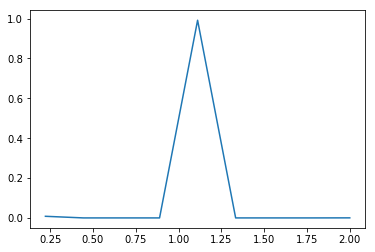

cat14
[ 0.00861647  0.00578971  0.00905043  0.00790982  0.00615521  0.01029235
  0.00628261  0.01103859  0.02224344]
[   1.           12.44444444   23.88888889   35.33333333   46.77777778
   58.22222222   69.66666667   81.11111111   92.55555556  104.        ]
[ 0.09861074  0.16487081  0.26844799  0.35897148  0.42941443  0.5472047
  0.6191057   0.74543624  1.        ]


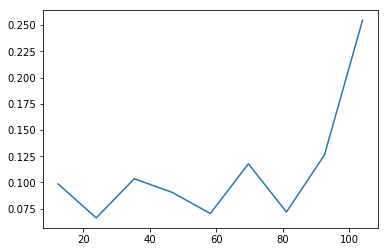

target
[ 8.67207383  0.          0.          0.          0.          0.          0.
  0.          0.32792617]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.96356376  0.96356376  0.96356376  0.96356376  0.96356376  0.96356376
  0.96356376  0.96356376  1.        ]


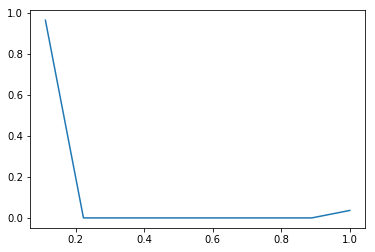

[ 0.40519847  0.3110652   0.17810594  0.11058437  0.          0.07242066
  0.13274569  0.03819823  0.03739573]
num1
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.31515436  0.55709396  0.69562081  0.78163087  0.78163087  0.83795805
  0.9412047   0.97091443  1.        ]


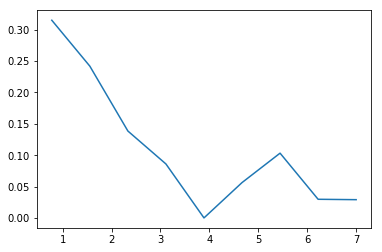

[ 0.11478981  0.13208832  0.11269219  0.09240787  0.16936638  0.07197254
  0.05453264  0.03496492  0.03536714]
num2
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.14029866  0.30173993  0.43947483  0.55241779  0.75942114  0.84738758
  0.91403859  0.95677349  1.        ]


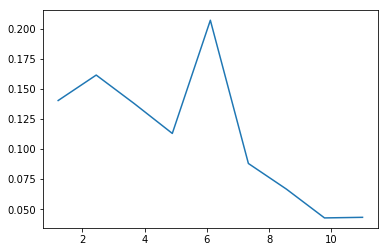

[ 5.4563104  0.         0.         0.         0.         0.         0.         0.
  3.5436896]
num3
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.60625671  0.60625671  0.60625671  0.60625671  0.60625671  0.60625671
  0.60625671  0.60625671  1.        ]


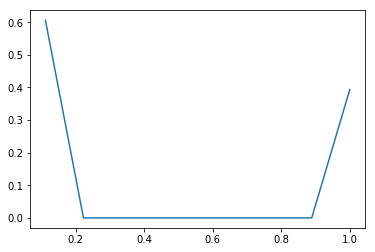

[ 6.68686409  0.          0.          0.          0.          0.          0.
  0.          2.31313591]
num4
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.7429849  0.7429849  0.7429849  0.7429849  0.7429849  0.7429849
  0.7429849  0.7429849  1.       ]


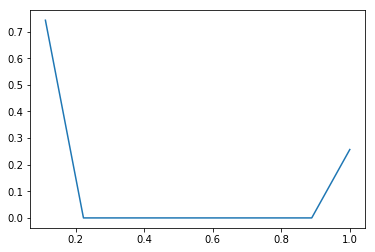

[ 7.52460403  0.          0.          0.          0.          0.          0.
  0.          1.47539597]
num5
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.83606711  0.83606711  0.83606711  0.83606711  0.83606711  0.83606711
  0.83606711  0.83606711  1.        ]


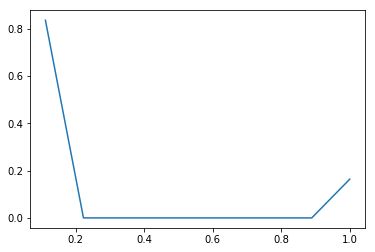

[ 7.33222148  0.          0.          0.          0.          0.          0.
  0.          1.66777852]
num6
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.81469128  0.81469128  0.81469128  0.81469128  0.81469128  0.81469128
  0.81469128  0.81469128  1.        ]


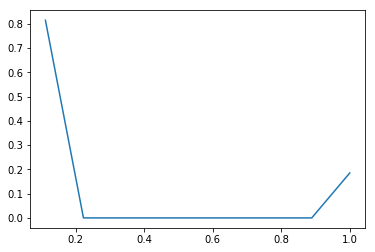

[  8.99663255e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.36744966e-03]
num7
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99962584  0.99962584  0.99962584  0.99962584  0.99962584  0.99962584
  0.99962584  0.99962584  1.        ]


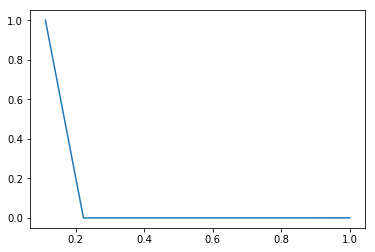

[ 8.98476342  0.          0.          0.          0.          0.          0.
  0.          0.01523658]
num8
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99830705  0.99830705  0.99830705  0.99830705  0.99830705  0.99830705
  0.99830705  0.99830705  1.        ]


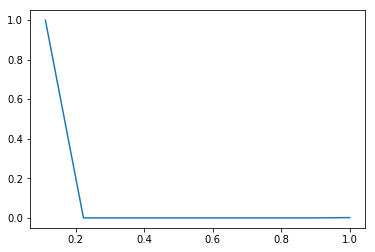

[ 8.91508893  0.          0.          0.          0.          0.          0.
  0.          0.08491107]
num9
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99056544  0.99056544  0.99056544  0.99056544  0.99056544  0.99056544
  0.99056544  0.99056544  1.        ]


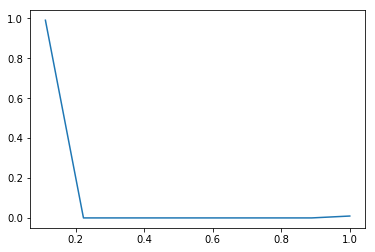

[  8.99146812e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   8.53187919e-03]
num10
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99905201  0.99905201  0.99905201  0.99905201  0.99905201  0.99905201
  0.99905201  0.99905201  1.        ]


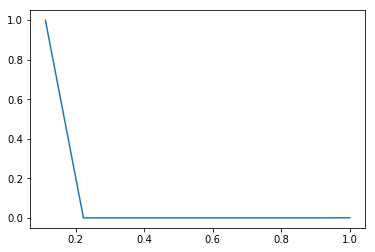

[  2.22589178e+00   0.00000000e+00   2.07596477e-02   0.00000000e+00
   2.81250000e-03   0.00000000e+00   5.17197987e-04   0.00000000e+00
   1.88758389e-05]
num11
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.98928523  0.98928523  0.99851174  0.99851174  0.99976174  0.99976174
  0.99999161  0.99999161  1.        ]


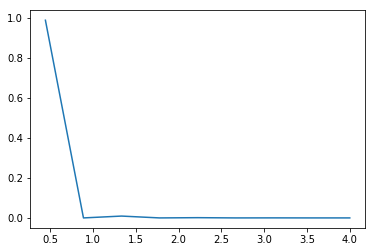

[ 0.05052685  0.02172754  0.08610983  0.04949187  0.14395818  0.06931324
  0.11611371  0.06189068  0.09317579]
num12
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.07298322  0.10436745  0.22874832  0.30023658  0.50817617  0.6082953
  0.7760151   0.86541275  1.        ]


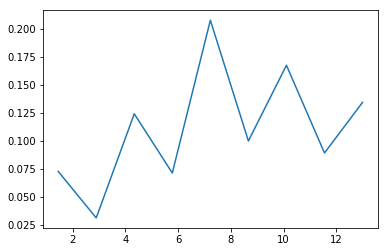

[ 3.05244966  0.          0.          0.          0.          0.          0.
  0.          5.94755034]
num13
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.33916107  0.33916107  0.33916107  0.33916107  0.33916107  0.33916107
  0.33916107  0.33916107  1.        ]


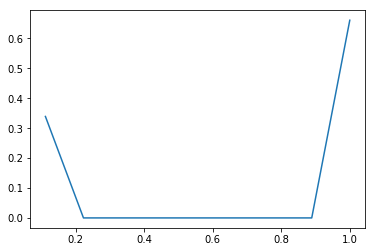

[ 7.91039597  0.          0.          0.          0.          0.          0.
  0.          1.08960403]
num14
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87893289  0.87893289  0.87893289  0.87893289  0.87893289  0.87893289
  0.87893289  0.87893289  1.        ]


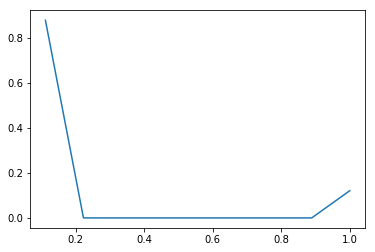

[ 7.61901342  0.          0.          0.          0.          0.          0.
  0.          1.38098658]
num15
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.84655705  0.84655705  0.84655705  0.84655705  0.84655705  0.84655705
  0.84655705  0.84655705  1.        ]


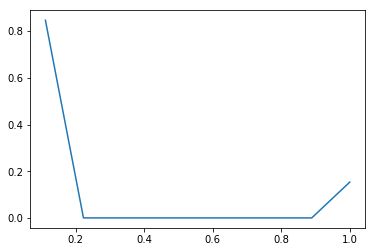

[ 0.3642953   0.72557047  1.09874161  0.          0.9002349   1.48822148
  1.14088926  0.          4.28204698]
num16
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.03642953  0.10898658  0.21886074  0.21886074  0.30888423  0.45770638
  0.5717953   0.5717953   1.        ]


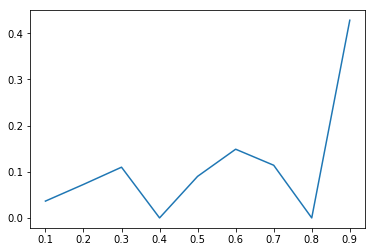

[ 1.01735738  1.76348154  1.08987416  0.17823826  0.30828859  0.33372483
  0.1565604   0.04907718  0.10339765]
num17
[ 0.   0.2  0.4  0.6  0.8  1.   1.2  1.4  1.6  1.8]
[ 0.20347148  0.55616779  0.77414262  0.80979027  0.87144799  0.93819295
  0.96950503  0.97932047  1.        ]


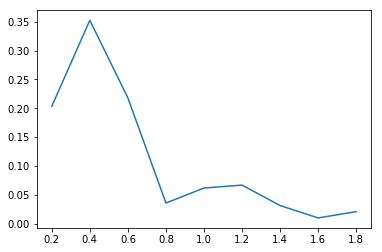

[  1.11996963e-01   1.50383662e+00   4.51606660e-01   1.68504280e-01
   2.48911675e-02   2.12267927e-03   1.82269419e-04   2.27836773e-05
   1.51891182e-05]
num18
[ 0.06123724  0.50309366  0.94495008  1.3868065   1.82866292  2.27051934
  2.71237576  3.15423218  3.5960886   4.03794502]
[ 0.04948658  0.71396644  0.91351174  0.98796644  0.99896477  0.99990268
  0.99998322  0.99999329  1.        ]


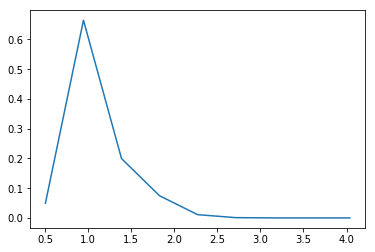

[ 0.13097315  0.          0.          0.30719295  0.          0.
  0.95435235  0.          1.60748154]
num19
[ 0.          0.33333333  0.66666667  1.          1.33333333  1.66666667
  2.          2.33333333  2.66666667  3.        ]
[ 0.04365772  0.04365772  0.04365772  0.14605537  0.14605537  0.14605537
  0.46417282  0.46417282  1.        ]


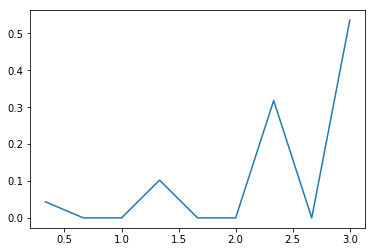

[  7.77776344e-04   2.63714143e+00   4.73178387e+00   3.44140106e-01
   1.00851666e-02   1.49073799e-03   0.00000000e+00   0.00000000e+00
   4.92591684e-04]
num20
[ 0.1         0.22943456  0.35886913  0.48830369  0.61773825  0.74717281
  0.87660738  1.00604194  1.1354765   1.26491106]
[  1.00671141e-04   3.41437919e-01   9.53894295e-01   9.98437919e-01
   9.99743289e-01   9.99936242e-01   9.99936242e-01   9.99936242e-01
   1.00000000e+00]


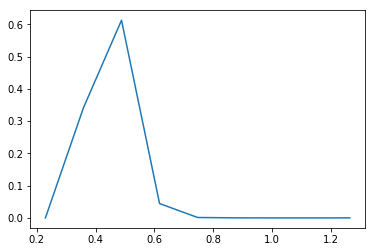

[  4.62205815e-01   1.78143611e+00   2.84879902e-01   5.51630331e-02
   8.08558816e-03   1.47960171e-03   3.48141578e-04   3.48141578e-05
   2.17588487e-05]
num21
[ 0.25061907  0.63617539  1.02173172  1.40728805  1.79284437  2.1784007
  2.56395702  2.94951335  3.33506968  3.720626  ]
[ 0.17820638  0.86505034  0.97488758  0.99615604  0.99927349  0.99984396
  0.99997819  0.99999161  1.        ]


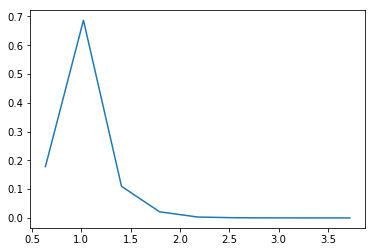

[  2.26430562e-03   1.39584410e-02   1.52482353e-02   3.45842588e+00
   1.02410531e+01   2.74468236e+00   3.68422588e-01   2.36892227e-01
   1.66240159e-03]
num22
[ 0.10954451  0.16808358  0.22662264  0.28516171  0.34370077  0.40223984
  0.46077891  0.51931797  0.57785704  0.6363961 ]
[  1.32550336e-04   9.49664430e-04   1.84228188e-03   2.04295302e-01
   8.03796980e-01   9.64468121e-01   9.86035235e-01   9.99902685e-01
   1.00000000e+00]


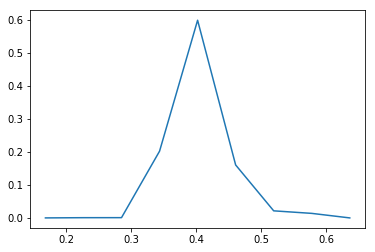

[ 0.05734502  0.          0.0271167   0.02632164  0.09525352  0.1609971
  0.3195283   0.72976175  0.98902713]
num23
[ 0.          0.41573971  0.83147942  1.24721913  1.66295884  2.07869855
  2.49443826  2.91017797  3.32591768  3.74165739]
[ 0.0238406   0.0238406   0.03511409  0.04605705  0.08565772  0.1525906
  0.28543121  0.58882215  1.        ]


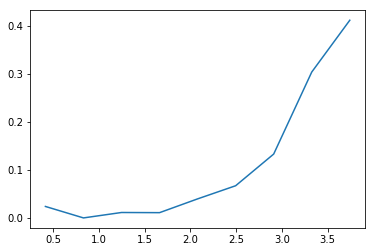

[ 1.00446309  0.99966443  1.99724832  0.          0.99555369  2.00659396
  1.00062081  0.          1.9958557 ]
der1
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10044631  0.20041275  0.40013758  0.40013758  0.49969295  0.70035235
  0.80041443  0.80041443  1.        ]


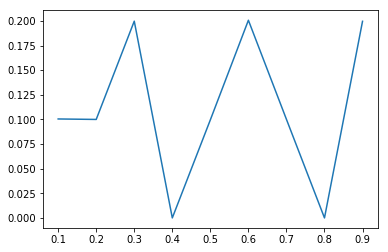

[ 1.00177852  0.99781879  1.99901007  0.          1.00493289  2.00877517
  0.99964765  0.          1.98803691]
der2
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10017785  0.19995973  0.39986074  0.39986074  0.50035403  0.70123154
  0.80119631  0.80119631  1.        ]


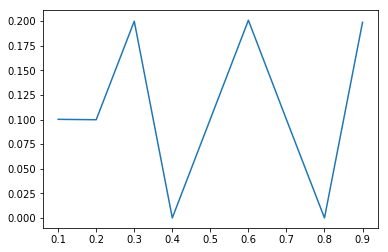

[ 0.99666107  1.00894295  1.99874161  0.          0.99496644  2.005
  0.99758389  0.          1.99810403]
der3
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.09966611  0.2005604   0.40043456  0.40043456  0.49993121  0.70043121
  0.8001896   0.8001896   1.        ]


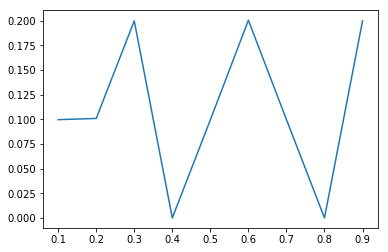

[ 0.07228691  0.32664262  0.          0.58660369  0.          0.53074027
  0.          0.24079228  0.04293423]
der4
[ 0.          0.55555556  1.11111111  1.66666667  2.22222222  2.77777778
  3.33333333  3.88888889  4.44444444  5.        ]
[ 0.0401594   0.22162752  0.22162752  0.54751846  0.54751846  0.84237416
  0.84237416  0.97614765  1.        ]


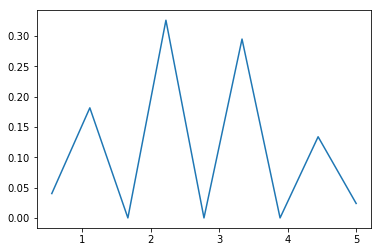

[ 0.15430117  0.43060822  0.          0.49186661  0.30032215  0.
  0.10251091  0.01898406  0.00140688]
der5
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.10286745  0.3899396   0.3899396   0.71785067  0.91806544  0.91806544
  0.98640604  0.99906208  1.        ]


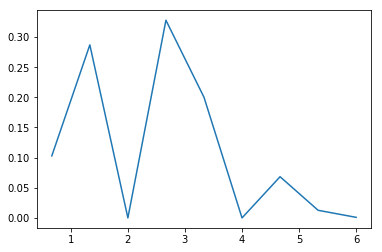

[  1.05704698e-05   1.99328859e-04   1.81208054e-03   1.01431208e-02
   4.02372483e-02   1.11065436e-01   2.11320302e-01   2.64672483e-01
   2.60539430e-01]
der6
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[  1.17449664e-05   2.33221477e-04   2.24664430e-03   1.35167785e-02
   5.82248322e-02   1.81630872e-01   4.16431208e-01   7.10511745e-01
   1.00000000e+00]


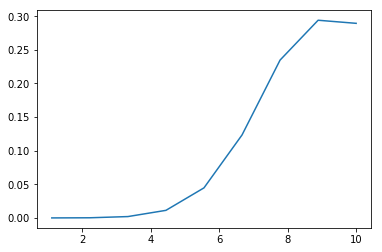

[ 0.02568624  0.11643456  0.23373993  0.27285403  0.20502013  0.10366275
  0.03428356  0.00736074  0.00095805]
der7
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.02568624  0.14212081  0.37586074  0.64871477  0.8537349   0.95739765
  0.99168121  0.99904195  1.        ]


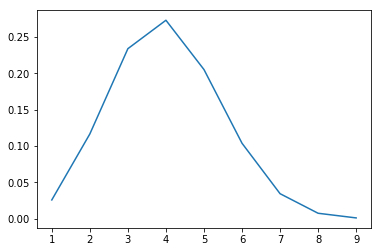

[  1.52516779e-04   1.27147651e-03   6.75151007e-03   2.59716443e-02
   7.49340604e-02   1.55663758e-01   2.29471309e-01   2.28791779e-01
   1.76991946e-01]
der8
[  2.           3.11111111   4.22222222   5.33333333   6.44444444
   7.55555556   8.66666667   9.77777778  10.88888889  12.        ]
[  1.69463087e-04   1.58221477e-03   9.08389262e-03   3.79412752e-02
   1.21201342e-01   2.94161074e-01   5.49129195e-01   8.03342282e-01
   1.00000000e+00]


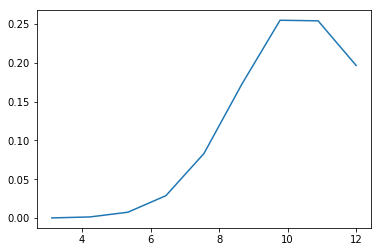

[ 0.07450671  0.26219942  0.39428715  0.33013303  0.          0.16621956
  0.04962943  0.00816731  0.00057167]
der9
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.05794966  0.26188255  0.56855034  0.82532047  0.82532047  0.95460235
  0.99320302  0.99955537  1.        ]


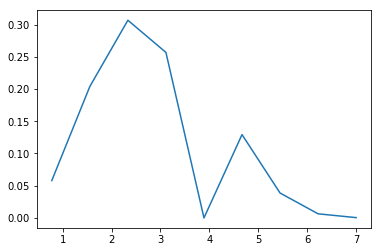

[  3.51181208e-03   5.22344295e-02   1.35866779e-01   1.15905503e-01
   3.48499329e-02   1.54280537e-02   2.03496644e-03   1.61275168e-04
   7.24832215e-06]
der10
[  0.           2.77777778   5.55555556   8.33333333  11.11111111
  13.88888889  16.66666667  19.44444444  22.22222222  25.        ]
[ 0.00975503  0.15485067  0.53225839  0.85421812  0.95102349  0.99387919
  0.99953188  0.99997987  1.        ]


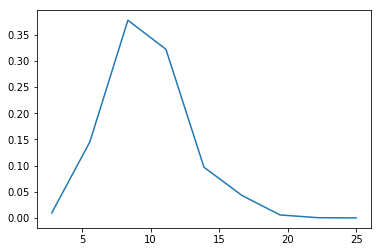

[  4.36592194e-02   1.30036648e-01   1.55696662e-01   9.64893147e-02
   3.66580714e-02   9.15657012e-03   1.75565171e-03   2.05051219e-04
   2.70222536e-05]
der11
[  0.           2.11111111   4.22222222   6.33333333   8.44444444
  10.55555556  12.66666667  14.77777778  16.88888889  19.        ]
[ 0.09216946  0.36669128  0.69538423  0.89908389  0.97647315  0.99580369
  0.99951007  0.99994295  1.        ]


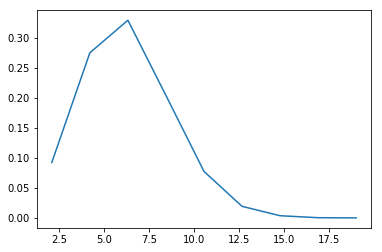

[  5.20559396e-01   2.19741946e-01   1.06382718e-01   3.89808725e-02
   1.10234899e-02   2.60486577e-03   5.85906040e-04   9.96644295e-05
   2.11409396e-05]
der12
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[ 0.57839933  0.82255705  0.94076007  0.98407215  0.99632047  0.99921477
  0.99986577  0.99997651  1.        ]


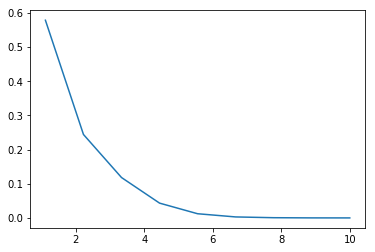

[  1.51566598e-01   1.62077827e-01   2.65374548e-01   6.34588281e-02
   4.34295302e-02   4.51393908e-03   1.75632421e-03   1.02219928e-04
   2.78781621e-05]
der13
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.21892953  0.45304195  0.83636074  0.92802349  0.99075503  0.99727517
  0.99981208  0.99995973  1.        ]


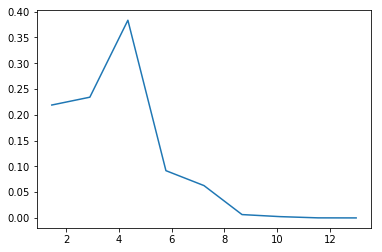

[  7.65997957e-03   8.51040998e-02   1.10167275e-01   1.33256201e-01
   3.78521301e-02   1.53534432e-02   1.57834841e-03   3.17114094e-04
   1.57572221e-05]
der14
[  0.           2.55555556   5.11111111   7.66666667  10.22222222
  12.77777778  15.33333333  17.88888889  20.44444444  23.        ]
[ 0.0195755   0.23706376  0.51860235  0.85914597  0.95587919  0.99511577
  0.99914933  0.99995973  1.        ]


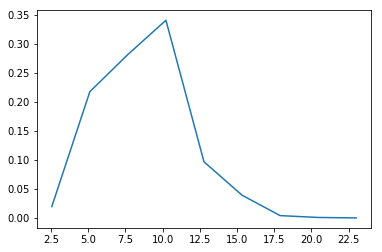

[ 7.89813423  0.          0.          0.          0.          0.          0.
  0.          1.10186577]
der15
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87757047  0.87757047  0.87757047  0.87757047  0.87757047  0.87757047
  0.87757047  0.87757047  1.        ]


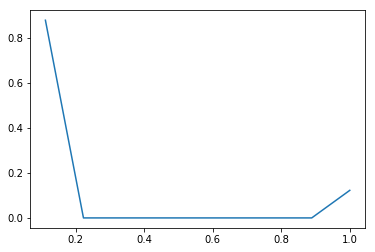

[ 3.34988758  0.          0.          0.          0.          0.          0.
  0.          5.65011242]
der16
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.37220973  0.37220973  0.37220973  0.37220973  0.37220973  0.37220973
  0.37220973  0.37220973  1.        ]


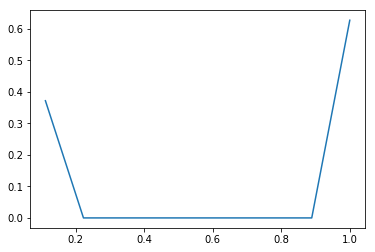

[ 4.01236913  0.          0.          0.          0.          0.          0.
  0.          4.98763087]
der17
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.44581879  0.44581879  0.44581879  0.44581879  0.44581879  0.44581879
  0.44581879  0.44581879  1.        ]


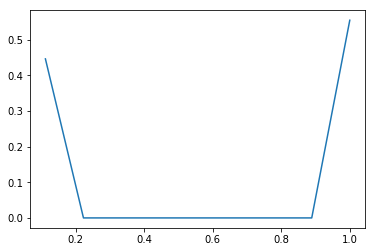

[ 6.41493121  0.          0.          0.          0.          0.          0.
  0.          2.58506879]
der18
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.71277013  0.71277013  0.71277013  0.71277013  0.71277013  0.71277013
  0.71277013  0.71277013  1.        ]


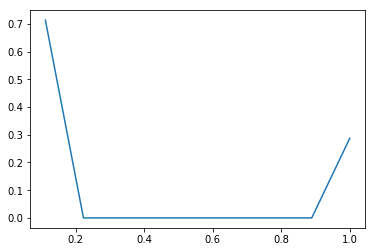

[ 5.85918121  0.          0.          0.          0.          0.          0.
  0.          3.14081879]
der19
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.65102013  0.65102013  0.65102013  0.65102013  0.65102013  0.65102013
  0.65102013  0.65102013  1.        ]


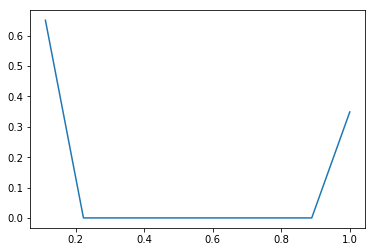

[ 2.17775336  0.          0.          0.62283221  0.          0.
  0.14207215  0.          0.05734228]
cat1
[ 1.          1.33333333  1.66666667  2.          2.33333333  2.66666667
  3.          3.33333333  3.66666667  4.        ]
[ 0.72591779  0.72591779  0.72591779  0.93352852  0.93352852  0.93352852
  0.98088591  0.98088591  1.        ]


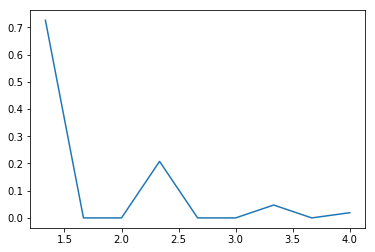

[ 5.24739262  0.          0.          0.          0.          0.          0.
  0.          3.75260738]
cat2
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.58304362  0.58304362  0.58304362  0.58304362  0.58304362  0.58304362
  0.58304362  0.58304362  1.        ]


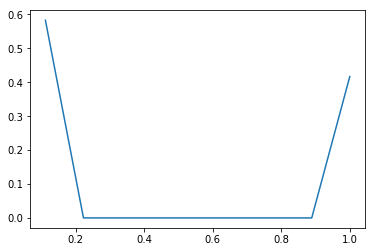

[ 1.34526342  0.02096728  0.          0.01053523  0.02074581  0.
  0.04623826  0.00415772  0.05209228]
cat3
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.89684228  0.91082047  0.91082047  0.91784396  0.9316745   0.9316745
  0.9625      0.96527181  1.        ]


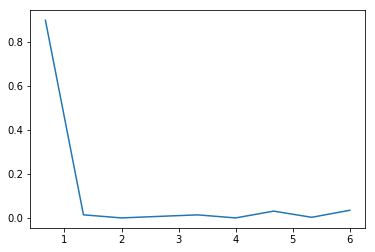

[ 0.00999939  0.00294326  0.00915101  0.03598627  0.11070439  0.24654042
  0.02074146  0.02793487  0.35418075]
cat4
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.01222148  0.01581879  0.02700336  0.07098658  0.20629195  0.50761913
  0.5329698   0.56711242  1.        ]


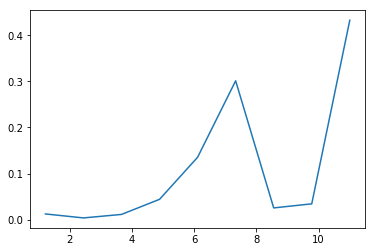

[ 1.53019631  0.          0.          0.          0.          0.          0.
  0.          7.46980369]
cat5
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.17002181  0.17002181  0.17002181  0.17002181  0.17002181  0.17002181
  0.17002181  0.17002181  1.        ]


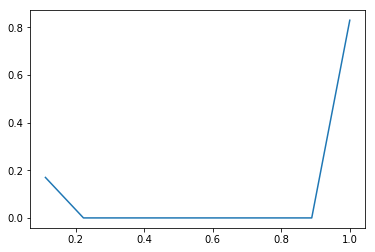

[  8.34305369e-01   5.39496644e-02   3.99395973e-02   1.07382550e-03
   3.85906040e-04   9.17785235e-04   2.61912752e-03   2.33221477e-04
   6.65755034e-02]
cat7
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.83430537  0.88825503  0.92819463  0.92926846  0.92965436  0.93057215
  0.93319128  0.9334245   1.        ]


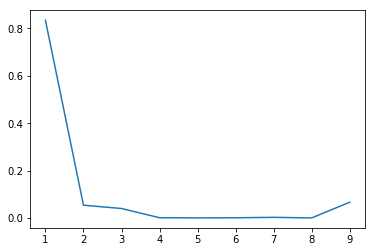

[ 2.35855872  0.          0.          0.          0.          0.          0.
  0.          6.64144128]
cat8
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.26206208  0.26206208  0.26206208  0.26206208  0.26206208  0.26206208
  0.26206208  0.26206208  1.        ]


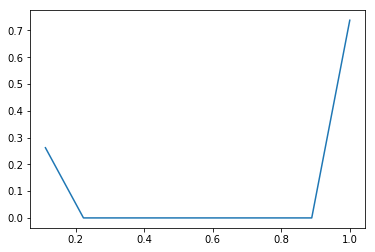

[ 0.20352685  0.01210008  0.02893999  0.03300296  0.01692252  0.14675987
  0.00767647  0.07201865  0.00846437]
cat9
[  0.           1.88888889   3.77777778   5.66666667   7.55555556
   9.44444444  11.33333333  13.22222222  15.11111111  17.        ]
[ 0.3844396   0.4072953   0.46195973  0.52429866  0.55626342  0.83347651
  0.84797651  0.98401174  1.        ]


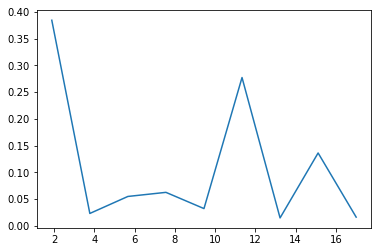

[ 0.46242785  0.          0.          0.          0.          0.          0.
  0.          8.53757215]
cat10
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.05138087  0.05138087  0.05138087  0.05138087  0.05138087  0.05138087
  0.05138087  0.05138087  1.        ]


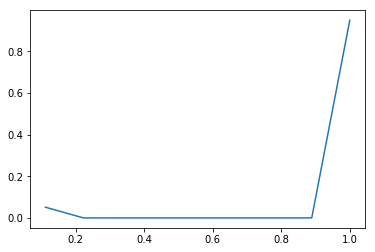

[ 1.51130537  0.          0.          0.          0.          0.          0.
  0.          7.48869463]
cat11
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.16792282  0.16792282  0.16792282  0.16792282  0.16792282  0.16792282
  0.16792282  0.16792282  1.        ]


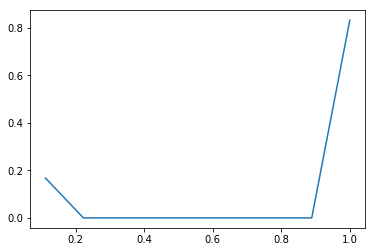

[ 0.73525923  0.          0.10993289  0.          1.33841779  0.          0.0557781
  0.          0.010612  ]
cat12
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.32678188  0.32678188  0.37564094  0.37564094  0.97049329  0.97049329
  0.99528356  0.99528356  1.        ]


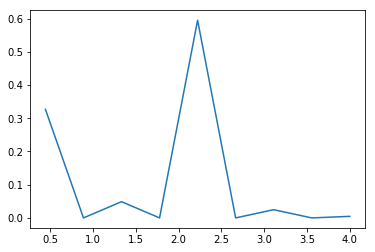

[  3.67172819e-02   0.00000000e+00   0.00000000e+00   0.00000000e+00
   4.46195386e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.32885906e-03]
cat13
[ 0.          0.22222222  0.44444444  0.66666667  0.88888889  1.11111111
  1.33333333  1.55555556  1.77777778  2.        ]
[ 0.0081594  0.0081594  0.0081594  0.0081594  0.9997047  0.9997047
  0.9997047  0.9997047  1.       ]


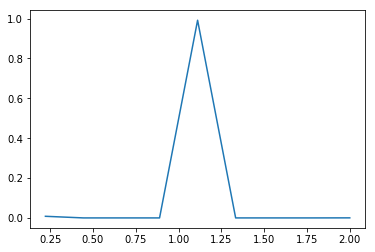

[ 0.00861647  0.00578971  0.00905043  0.00790982  0.00615521  0.01029235
  0.00628261  0.01103859  0.02224344]
cat14
[   1.           12.44444444   23.88888889   35.33333333   46.77777778
   58.22222222   69.66666667   81.11111111   92.55555556  104.        ]
[ 0.09861074  0.16487081  0.26844799  0.35897148  0.42941443  0.5472047
  0.6191057   0.74543624  1.        ]


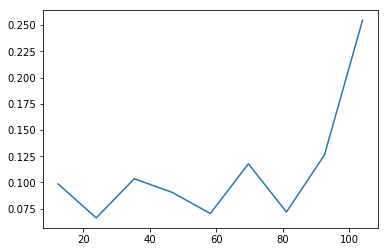

[ 8.67207383  0.          0.          0.          0.          0.          0.
  0.          0.32792617]
target
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.96356376  0.96356376  0.96356376  0.96356376  0.96356376  0.96356376
  0.96356376  0.96356376  1.        ]


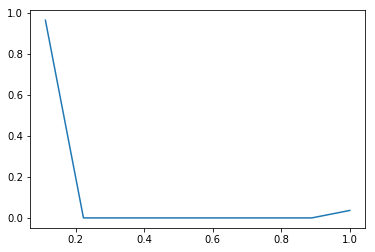

num1
[ 0.40519847  0.3110652   0.17810594  0.11058437  0.          0.07242066
  0.13274569  0.03819823  0.03739573]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.31515436  0.55709396  0.69562081  0.78163087  0.78163087  0.83795805
  0.9412047   0.97091443  1.        ]


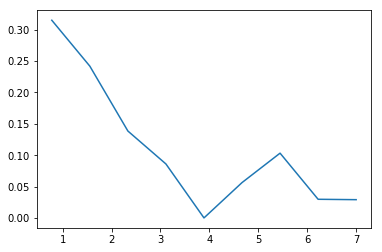

num2
[ 0.11478981  0.13208832  0.11269219  0.09240787  0.16936638  0.07197254
  0.05453264  0.03496492  0.03536714]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.14029866  0.30173993  0.43947483  0.55241779  0.75942114  0.84738758
  0.91403859  0.95677349  1.        ]


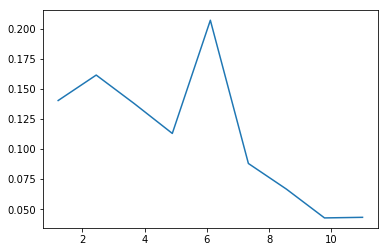

num3
[ 5.4563104  0.         0.         0.         0.         0.         0.         0.
  3.5436896]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.60625671  0.60625671  0.60625671  0.60625671  0.60625671  0.60625671
  0.60625671  0.60625671  1.        ]


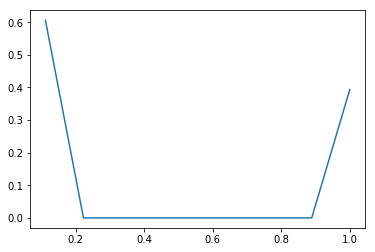

num4
[ 6.68686409  0.          0.          0.          0.          0.          0.
  0.          2.31313591]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.7429849  0.7429849  0.7429849  0.7429849  0.7429849  0.7429849
  0.7429849  0.7429849  1.       ]


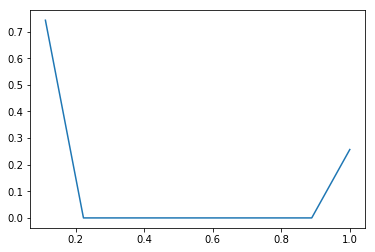

num5
[ 7.52460403  0.          0.          0.          0.          0.          0.
  0.          1.47539597]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.83606711  0.83606711  0.83606711  0.83606711  0.83606711  0.83606711
  0.83606711  0.83606711  1.        ]


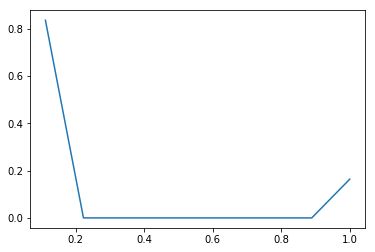

num6
[ 7.33222148  0.          0.          0.          0.          0.          0.
  0.          1.66777852]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.81469128  0.81469128  0.81469128  0.81469128  0.81469128  0.81469128
  0.81469128  0.81469128  1.        ]


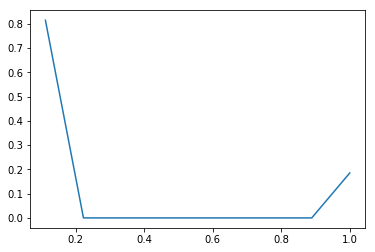

num7
[  8.99663255e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.36744966e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99962584  0.99962584  0.99962584  0.99962584  0.99962584  0.99962584
  0.99962584  0.99962584  1.        ]


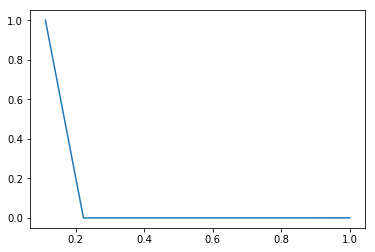

num8
[ 8.98476342  0.          0.          0.          0.          0.          0.
  0.          0.01523658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99830705  0.99830705  0.99830705  0.99830705  0.99830705  0.99830705
  0.99830705  0.99830705  1.        ]


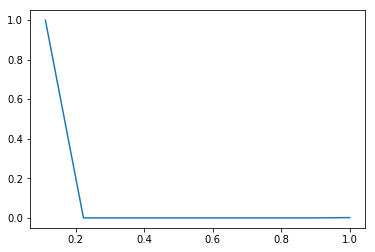

num9
[ 8.91508893  0.          0.          0.          0.          0.          0.
  0.          0.08491107]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99056544  0.99056544  0.99056544  0.99056544  0.99056544  0.99056544
  0.99056544  0.99056544  1.        ]


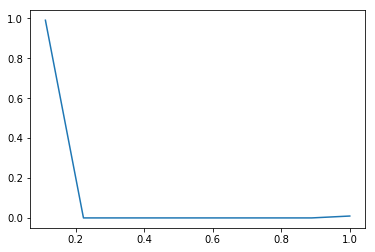

num10
[  8.99146812e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   8.53187919e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99905201  0.99905201  0.99905201  0.99905201  0.99905201  0.99905201
  0.99905201  0.99905201  1.        ]


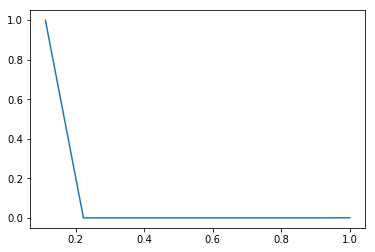

num11
[  2.22589178e+00   0.00000000e+00   2.07596477e-02   0.00000000e+00
   2.81250000e-03   0.00000000e+00   5.17197987e-04   0.00000000e+00
   1.88758389e-05]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.98928523  0.98928523  0.99851174  0.99851174  0.99976174  0.99976174
  0.99999161  0.99999161  1.        ]


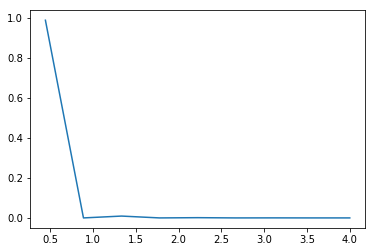

num12
[ 0.05052685  0.02172754  0.08610983  0.04949187  0.14395818  0.06931324
  0.11611371  0.06189068  0.09317579]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.07298322  0.10436745  0.22874832  0.30023658  0.50817617  0.6082953
  0.7760151   0.86541275  1.        ]


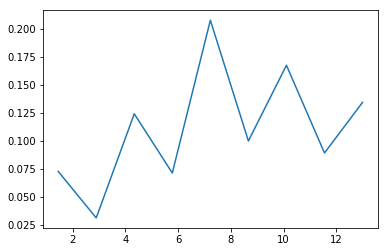

num13
[ 3.05244966  0.          0.          0.          0.          0.          0.
  0.          5.94755034]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.33916107  0.33916107  0.33916107  0.33916107  0.33916107  0.33916107
  0.33916107  0.33916107  1.        ]


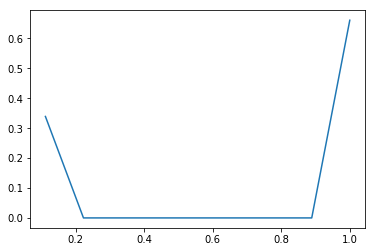

num14
[ 7.91039597  0.          0.          0.          0.          0.          0.
  0.          1.08960403]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87893289  0.87893289  0.87893289  0.87893289  0.87893289  0.87893289
  0.87893289  0.87893289  1.        ]


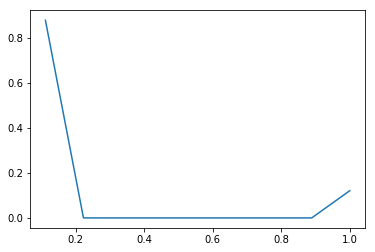

num15
[ 7.61901342  0.          0.          0.          0.          0.          0.
  0.          1.38098658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.84655705  0.84655705  0.84655705  0.84655705  0.84655705  0.84655705
  0.84655705  0.84655705  1.        ]


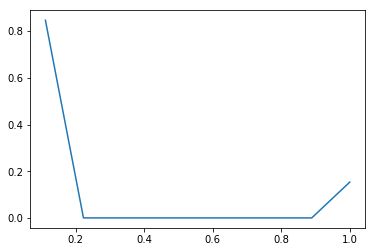

num16
[ 0.3642953   0.72557047  1.09874161  0.          0.9002349   1.48822148
  1.14088926  0.          4.28204698]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.03642953  0.10898658  0.21886074  0.21886074  0.30888423  0.45770638
  0.5717953   0.5717953   1.        ]


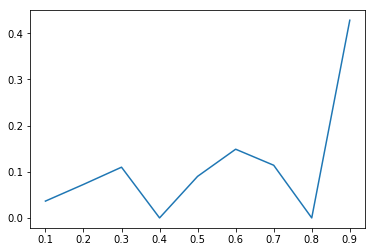

num17
[ 1.01735738  1.76348154  1.08987416  0.17823826  0.30828859  0.33372483
  0.1565604   0.04907718  0.10339765]
[ 0.   0.2  0.4  0.6  0.8  1.   1.2  1.4  1.6  1.8]
[ 0.20347148  0.55616779  0.77414262  0.80979027  0.87144799  0.93819295
  0.96950503  0.97932047  1.        ]


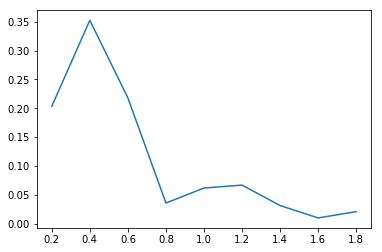

num18
[  1.11996963e-01   1.50383662e+00   4.51606660e-01   1.68504280e-01
   2.48911675e-02   2.12267927e-03   1.82269419e-04   2.27836773e-05
   1.51891182e-05]
[ 0.06123724  0.50309366  0.94495008  1.3868065   1.82866292  2.27051934
  2.71237576  3.15423218  3.5960886   4.03794502]
[ 0.04948658  0.71396644  0.91351174  0.98796644  0.99896477  0.99990268
  0.99998322  0.99999329  1.        ]


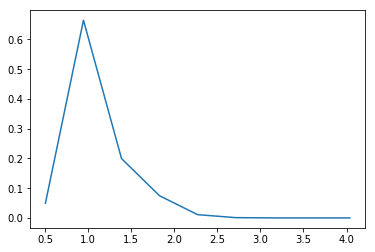

num19
[ 0.13097315  0.          0.          0.30719295  0.          0.
  0.95435235  0.          1.60748154]
[ 0.          0.33333333  0.66666667  1.          1.33333333  1.66666667
  2.          2.33333333  2.66666667  3.        ]
[ 0.04365772  0.04365772  0.04365772  0.14605537  0.14605537  0.14605537
  0.46417282  0.46417282  1.        ]


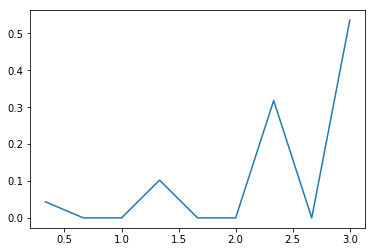

num20
[  7.77776344e-04   2.63715440e+00   4.73177091e+00   3.44140106e-01
   1.00851666e-02   1.49073799e-03   0.00000000e+00   0.00000000e+00
   4.92591684e-04]
[ 0.1         0.22943456  0.35886913  0.48830369  0.61773825  0.74717281
  0.87660738  1.00604194  1.1354765   1.26491106]
[  1.00671141e-04   3.41439597e-01   9.53894295e-01   9.98437919e-01
   9.99743289e-01   9.99936242e-01   9.99936242e-01   9.99936242e-01
   1.00000000e+00]


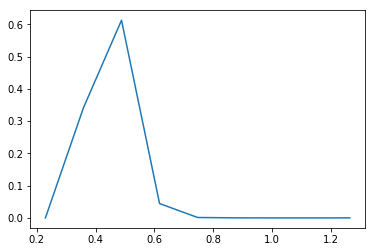

num21
[  4.62205815e-01   1.78143611e+00   2.84879902e-01   5.51630331e-02
   8.08558816e-03   1.47960171e-03   3.48141578e-04   3.48141578e-05
   2.17588487e-05]
[ 0.25061907  0.63617539  1.02173172  1.40728805  1.79284437  2.1784007
  2.56395702  2.94951335  3.33506968  3.720626  ]
[ 0.17820638  0.86505034  0.97488758  0.99615604  0.99927349  0.99984396
  0.99997819  0.99999161  1.        ]


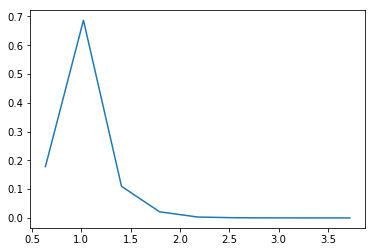

num22
[  2.26430562e-03   1.39584410e-02   1.52482353e-02   3.45842588e+00
   1.02410531e+01   2.74468236e+00   3.68422588e-01   2.36892227e-01
   1.66240159e-03]
[ 0.10954451  0.16808358  0.22662264  0.28516171  0.34370077  0.40223984
  0.46077891  0.51931797  0.57785704  0.6363961 ]
[  1.32550336e-04   9.49664430e-04   1.84228188e-03   2.04295302e-01
   8.03796980e-01   9.64468121e-01   9.86035235e-01   9.99902685e-01
   1.00000000e+00]


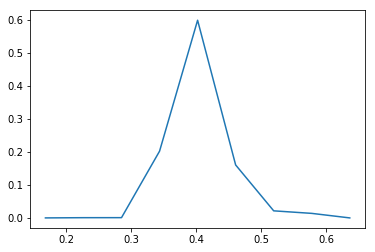

num23
[ 0.05734502  0.          0.0271167   0.02632164  0.09525352  0.1609971
  0.3195283   0.72976175  0.98902713]
[ 0.          0.41573971  0.83147942  1.24721913  1.66295884  2.07869855
  2.49443826  2.91017797  3.32591768  3.74165739]
[ 0.0238406   0.0238406   0.03511409  0.04605705  0.08565772  0.1525906
  0.28543121  0.58882215  1.        ]


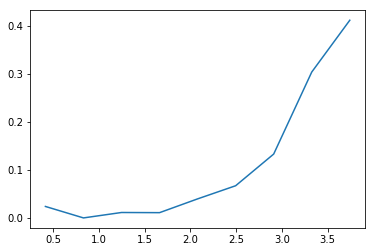

der1
[ 1.00446309  0.99966443  1.99724832  0.          0.99555369  2.00659396
  1.00062081  0.          1.9958557 ]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10044631  0.20041275  0.40013758  0.40013758  0.49969295  0.70035235
  0.80041443  0.80041443  1.        ]


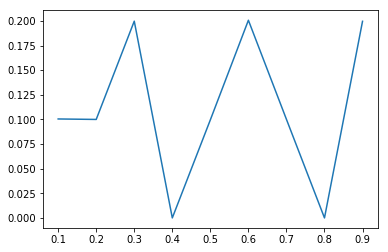

der2
[ 1.00177852  0.99781879  1.99901007  0.          1.00493289  2.00877517
  0.99964765  0.          1.98803691]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10017785  0.19995973  0.39986074  0.39986074  0.50035403  0.70123154
  0.80119631  0.80119631  1.        ]


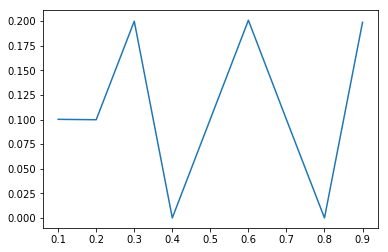

der3
[ 0.99666107  1.00894295  1.99874161  0.          0.99496644  2.005
  0.99758389  0.          1.99810403]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.09966611  0.2005604   0.40043456  0.40043456  0.49993121  0.70043121
  0.8001896   0.8001896   1.        ]


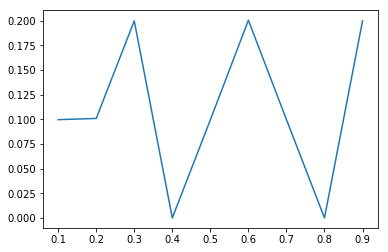

der4
[ 0.07228691  0.32664262  0.          0.58660369  0.          0.53074027
  0.          0.24079228  0.04293423]
[ 0.          0.55555556  1.11111111  1.66666667  2.22222222  2.77777778
  3.33333333  3.88888889  4.44444444  5.        ]
[ 0.0401594   0.22162752  0.22162752  0.54751846  0.54751846  0.84237416
  0.84237416  0.97614765  1.        ]


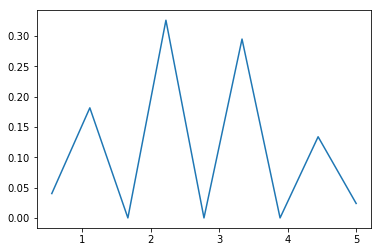

der5
[ 0.15430117  0.43060822  0.          0.49186661  0.30032215  0.
  0.10251091  0.01898406  0.00140688]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.10286745  0.3899396   0.3899396   0.71785067  0.91806544  0.91806544
  0.98640604  0.99906208  1.        ]


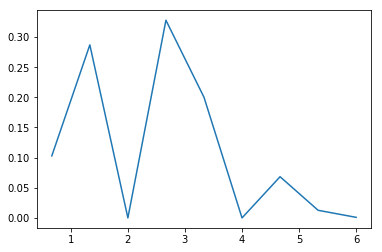

der6
[  1.05704698e-05   1.99328859e-04   1.81208054e-03   1.01431208e-02
   4.02372483e-02   1.11065436e-01   2.11320302e-01   2.64672483e-01
   2.60539430e-01]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[  1.17449664e-05   2.33221477e-04   2.24664430e-03   1.35167785e-02
   5.82248322e-02   1.81630872e-01   4.16431208e-01   7.10511745e-01
   1.00000000e+00]


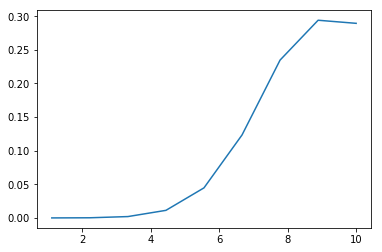

der7
[ 0.02568624  0.11643456  0.23373993  0.27285403  0.20502013  0.10366275
  0.03428356  0.00736074  0.00095805]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.02568624  0.14212081  0.37586074  0.64871477  0.8537349   0.95739765
  0.99168121  0.99904195  1.        ]


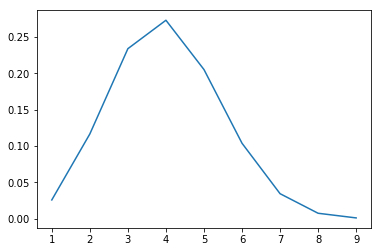

der8
[  1.52516779e-04   1.27147651e-03   6.75151007e-03   2.59716443e-02
   7.49340604e-02   1.55663758e-01   2.29471309e-01   2.28791779e-01
   1.76991946e-01]
[  2.           3.11111111   4.22222222   5.33333333   6.44444444
   7.55555556   8.66666667   9.77777778  10.88888889  12.        ]
[  1.69463087e-04   1.58221477e-03   9.08389262e-03   3.79412752e-02
   1.21201342e-01   2.94161074e-01   5.49129195e-01   8.03342282e-01
   1.00000000e+00]


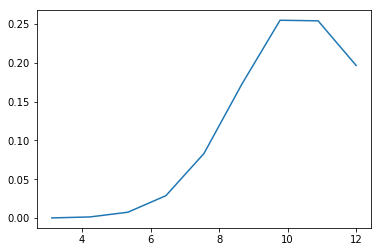

der9
[ 0.07450671  0.26219942  0.39428715  0.33013303  0.          0.16621956
  0.04962943  0.00816731  0.00057167]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.05794966  0.26188255  0.56855034  0.82532047  0.82532047  0.95460235
  0.99320302  0.99955537  1.        ]


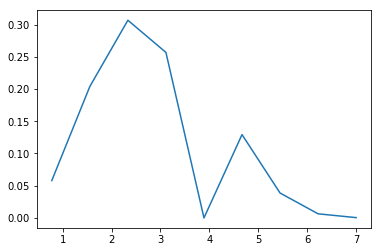

der10
[  3.51181208e-03   5.22344295e-02   1.35866779e-01   1.15905503e-01
   3.48499329e-02   1.54280537e-02   2.03496644e-03   1.61275168e-04
   7.24832215e-06]
[  0.           2.77777778   5.55555556   8.33333333  11.11111111
  13.88888889  16.66666667  19.44444444  22.22222222  25.        ]
[ 0.00975503  0.15485067  0.53225839  0.85421812  0.95102349  0.99387919
  0.99953188  0.99997987  1.        ]


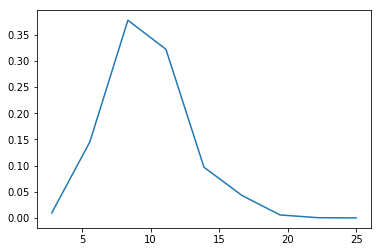

der11
[  4.36592194e-02   1.30036648e-01   1.55696662e-01   9.64893147e-02
   3.66580714e-02   9.15657012e-03   1.75565171e-03   2.05051219e-04
   2.70222536e-05]
[  0.           2.11111111   4.22222222   6.33333333   8.44444444
  10.55555556  12.66666667  14.77777778  16.88888889  19.        ]
[ 0.09216946  0.36669128  0.69538423  0.89908389  0.97647315  0.99580369
  0.99951007  0.99994295  1.        ]


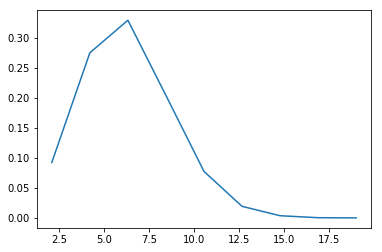

der12
[  5.20559396e-01   2.19741946e-01   1.06382718e-01   3.89808725e-02
   1.10234899e-02   2.60486577e-03   5.85906040e-04   9.96644295e-05
   2.11409396e-05]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[ 0.57839933  0.82255705  0.94076007  0.98407215  0.99632047  0.99921477
  0.99986577  0.99997651  1.        ]


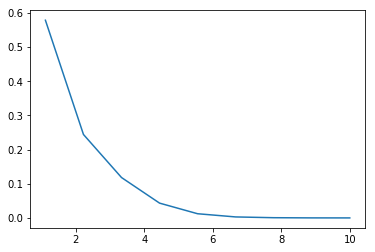

der13
[  1.51566598e-01   1.62077827e-01   2.65374548e-01   6.34588281e-02
   4.34295302e-02   4.51393908e-03   1.75632421e-03   1.02219928e-04
   2.78781621e-05]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.21892953  0.45304195  0.83636074  0.92802349  0.99075503  0.99727517
  0.99981208  0.99995973  1.        ]


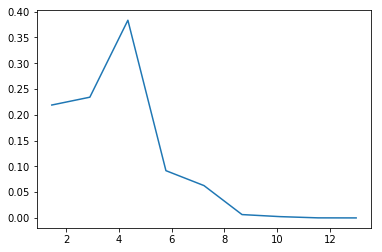

der14
[  7.65997957e-03   8.51040998e-02   1.10167275e-01   1.33256201e-01
   3.78521301e-02   1.53534432e-02   1.57834841e-03   3.17114094e-04
   1.57572221e-05]
[  0.           2.55555556   5.11111111   7.66666667  10.22222222
  12.77777778  15.33333333  17.88888889  20.44444444  23.        ]
[ 0.0195755   0.23706376  0.51860235  0.85914597  0.95587919  0.99511577
  0.99914933  0.99995973  1.        ]


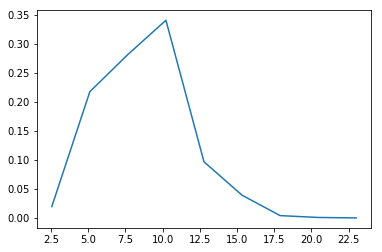

der15
[ 7.89813423  0.          0.          0.          0.          0.          0.
  0.          1.10186577]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87757047  0.87757047  0.87757047  0.87757047  0.87757047  0.87757047
  0.87757047  0.87757047  1.        ]


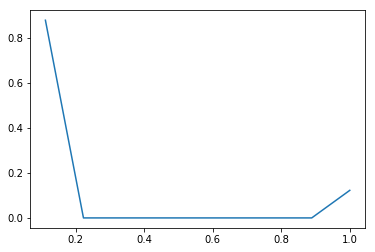

der16
[ 3.34988758  0.          0.          0.          0.          0.          0.
  0.          5.65011242]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.37220973  0.37220973  0.37220973  0.37220973  0.37220973  0.37220973
  0.37220973  0.37220973  1.        ]


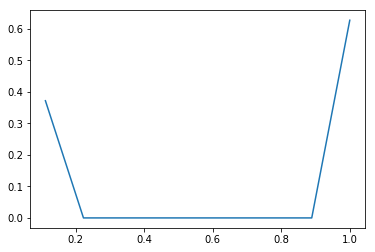

der17
[ 4.01236913  0.          0.          0.          0.          0.          0.
  0.          4.98763087]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.44581879  0.44581879  0.44581879  0.44581879  0.44581879  0.44581879
  0.44581879  0.44581879  1.        ]


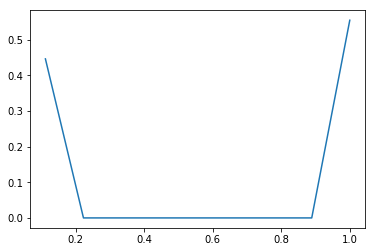

der18
[ 6.41493121  0.          0.          0.          0.          0.          0.
  0.          2.58506879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.71277013  0.71277013  0.71277013  0.71277013  0.71277013  0.71277013
  0.71277013  0.71277013  1.        ]


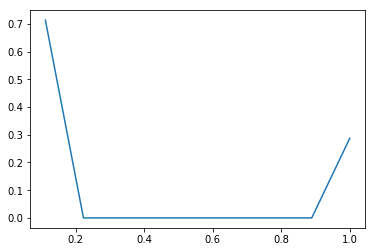

der19
[ 5.85918121  0.          0.          0.          0.          0.          0.
  0.          3.14081879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.65102013  0.65102013  0.65102013  0.65102013  0.65102013  0.65102013
  0.65102013  0.65102013  1.        ]


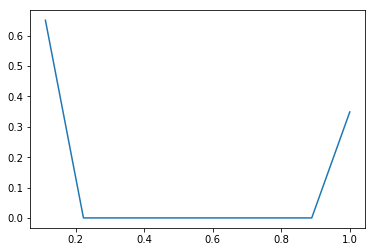

cat1
[ 2.17775336  0.          0.          0.62283221  0.          0.
  0.14207215  0.          0.05734228]
[ 1.          1.33333333  1.66666667  2.          2.33333333  2.66666667
  3.          3.33333333  3.66666667  4.        ]
[ 0.72591779  0.72591779  0.72591779  0.93352852  0.93352852  0.93352852
  0.98088591  0.98088591  1.        ]


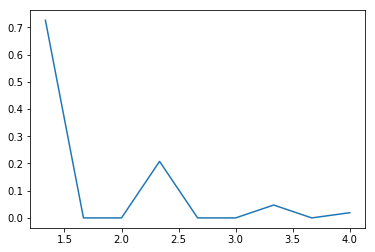

cat2
[ 5.24739262  0.          0.          0.          0.          0.          0.
  0.          3.75260738]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.58304362  0.58304362  0.58304362  0.58304362  0.58304362  0.58304362
  0.58304362  0.58304362  1.        ]


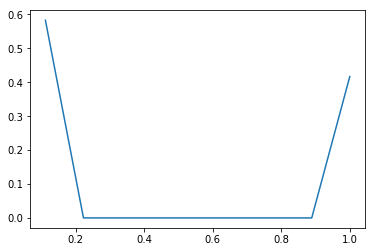

cat3
[ 1.34526342  0.02096728  0.          0.01053523  0.02074581  0.
  0.04623826  0.00415772  0.05209228]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.89684228  0.91082047  0.91082047  0.91784396  0.9316745   0.9316745
  0.9625      0.96527181  1.        ]


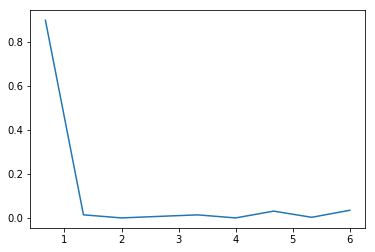

cat4
[ 0.00999939  0.00294326  0.00915101  0.03598627  0.11070439  0.24639353
  0.02074146  0.02793487  0.35432764]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.01222148  0.01581879  0.02700336  0.07098658  0.20629195  0.5074396
  0.53279027  0.56693289  1.        ]


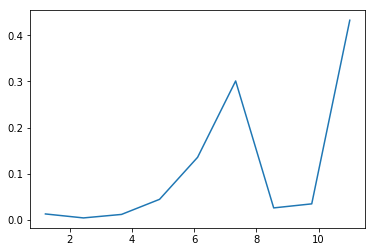

cat5
[ 1.53019631  0.          0.          0.          0.          0.          0.
  0.          7.46980369]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.17002181  0.17002181  0.17002181  0.17002181  0.17002181  0.17002181
  0.17002181  0.17002181  1.        ]


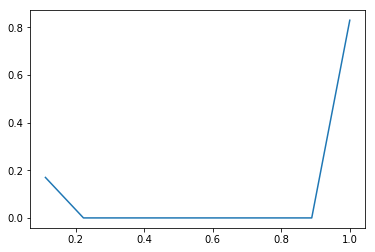

cat7
[  8.34305369e-01   5.39496644e-02   3.99395973e-02   1.07382550e-03
   3.85906040e-04   9.17785235e-04   2.61912752e-03   2.33221477e-04
   6.65755034e-02]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.83430537  0.88825503  0.92819463  0.92926846  0.92965436  0.93057215
  0.93319128  0.9334245   1.        ]


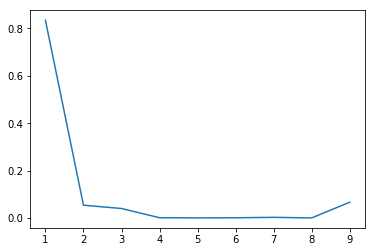

cat8
[ 2.35855872  0.          0.          0.          0.          0.          0.
  0.          6.64144128]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.26206208  0.26206208  0.26206208  0.26206208  0.26206208  0.26206208
  0.26206208  0.26206208  1.        ]


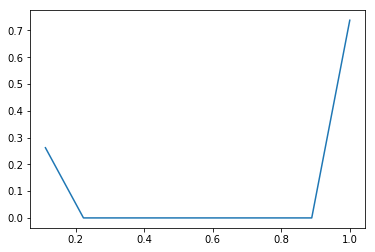

cat9
[ 0.20352685  0.01210008  0.02893999  0.03300296  0.01692252  0.14675987
  0.00767647  0.07201865  0.00846437]
[  0.           1.88888889   3.77777778   5.66666667   7.55555556
   9.44444444  11.33333333  13.22222222  15.11111111  17.        ]
[ 0.3844396   0.4072953   0.46195973  0.52429866  0.55626342  0.83347651
  0.84797651  0.98401174  1.        ]


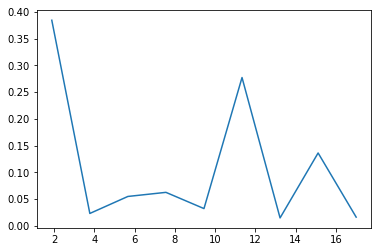

cat10
[ 0.46242785  0.          0.          0.          0.          0.          0.
  0.          8.53757215]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.05138087  0.05138087  0.05138087  0.05138087  0.05138087  0.05138087
  0.05138087  0.05138087  1.        ]


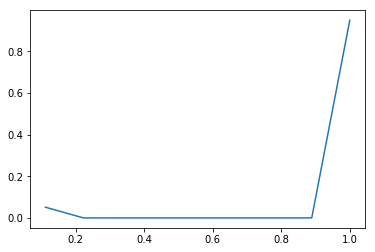

cat11
[ 1.51130537  0.          0.          0.          0.          0.          0.
  0.          7.48869463]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.16792282  0.16792282  0.16792282  0.16792282  0.16792282  0.16792282
  0.16792282  0.16792282  1.        ]


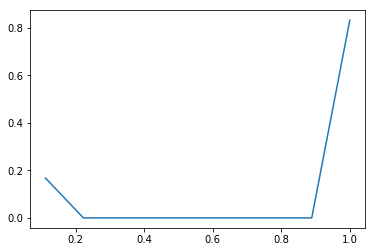

cat12
[ 0.73525923  0.          0.10993289  0.          1.33841779  0.          0.0557781
  0.          0.010612  ]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.32678188  0.32678188  0.37564094  0.37564094  0.97049329  0.97049329
  0.99528356  0.99528356  1.        ]


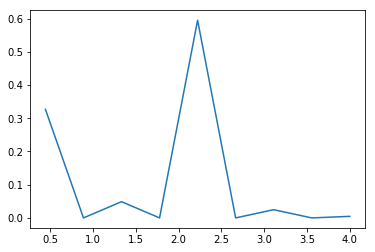

cat13
[  3.67172819e-02   0.00000000e+00   0.00000000e+00   0.00000000e+00
   4.46195386e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.32885906e-03]
[ 0.          0.22222222  0.44444444  0.66666667  0.88888889  1.11111111
  1.33333333  1.55555556  1.77777778  2.        ]
[ 0.0081594  0.0081594  0.0081594  0.0081594  0.9997047  0.9997047
  0.9997047  0.9997047  1.       ]


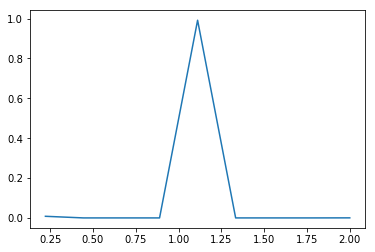

cat14
[ 0.00861647  0.00578971  0.00905043  0.00790982  0.00615521  0.01029235
  0.00628261  0.01103859  0.02224344]
[   1.           12.44444444   23.88888889   35.33333333   46.77777778
   58.22222222   69.66666667   81.11111111   92.55555556  104.        ]
[ 0.09861074  0.16487081  0.26844799  0.35897148  0.42941443  0.5472047
  0.6191057   0.74543624  1.        ]


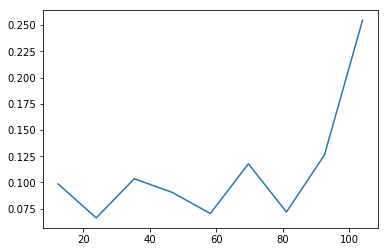

target
[ 8.67207383  0.          0.          0.          0.          0.          0.
  0.          0.32792617]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.96356376  0.96356376  0.96356376  0.96356376  0.96356376  0.96356376
  0.96356376  0.96356376  1.        ]


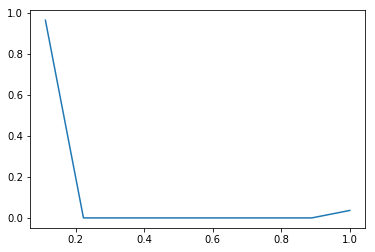

Approach 2 mean median mode
num1
[ 0.40519847  0.3110652   0.17810594  0.11058437  0.          0.07242066
  0.13274569  0.03819823  0.03739573]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.31515436  0.55709396  0.69562081  0.78163087  0.78163087  0.83795805
  0.9412047   0.97091443  1.        ]


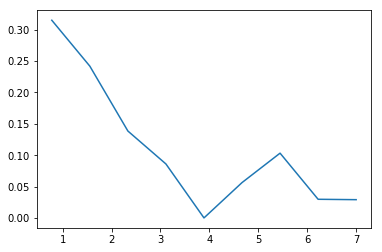

num2
[ 0.11478981  0.13208832  0.11269219  0.09240787  0.16936638  0.07197254
  0.05453264  0.03496492  0.03536714]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.14029866  0.30173993  0.43947483  0.55241779  0.75942114  0.84738758
  0.91403859  0.95677349  1.        ]


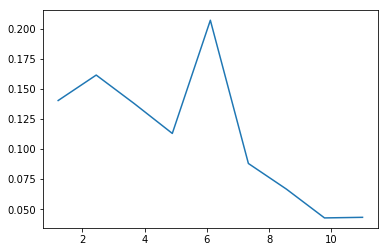

num3
[ 5.4563104  0.         0.         0.         0.         0.         0.         0.
  3.5436896]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.60625671  0.60625671  0.60625671  0.60625671  0.60625671  0.60625671
  0.60625671  0.60625671  1.        ]


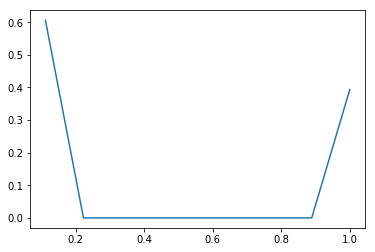

num4
[ 6.68686409  0.          0.          0.          0.          0.          0.
  0.          2.31313591]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.7429849  0.7429849  0.7429849  0.7429849  0.7429849  0.7429849
  0.7429849  0.7429849  1.       ]


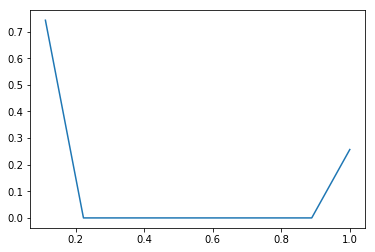

num5
[ 7.52460403  0.          0.          0.          0.          0.          0.
  0.          1.47539597]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.83606711  0.83606711  0.83606711  0.83606711  0.83606711  0.83606711
  0.83606711  0.83606711  1.        ]


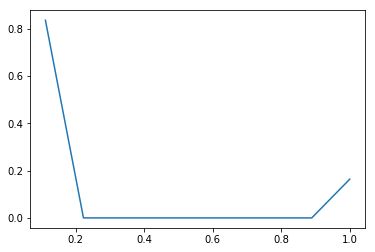

num6
[ 7.33222148  0.          0.          0.          0.          0.          0.
  0.          1.66777852]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.81469128  0.81469128  0.81469128  0.81469128  0.81469128  0.81469128
  0.81469128  0.81469128  1.        ]


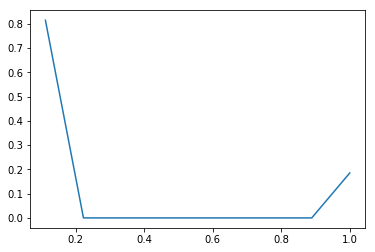

num7
[  8.99663255e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.36744966e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99962584  0.99962584  0.99962584  0.99962584  0.99962584  0.99962584
  0.99962584  0.99962584  1.        ]


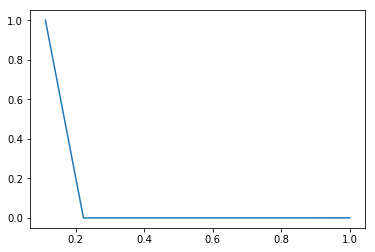

num8
[ 8.98476342  0.          0.          0.          0.          0.          0.
  0.          0.01523658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99830705  0.99830705  0.99830705  0.99830705  0.99830705  0.99830705
  0.99830705  0.99830705  1.        ]


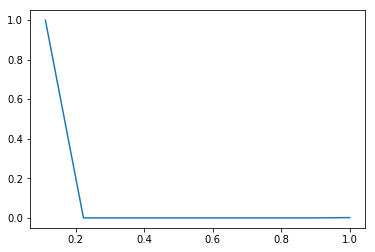

num9
[ 8.91508893  0.          0.          0.          0.          0.          0.
  0.          0.08491107]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99056544  0.99056544  0.99056544  0.99056544  0.99056544  0.99056544
  0.99056544  0.99056544  1.        ]


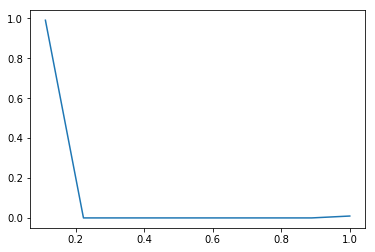

num10
[  8.99146812e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   8.53187919e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99905201  0.99905201  0.99905201  0.99905201  0.99905201  0.99905201
  0.99905201  0.99905201  1.        ]


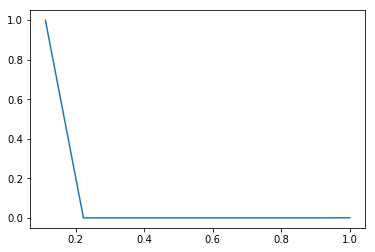

num11
[  2.22589178e+00   0.00000000e+00   2.07596477e-02   0.00000000e+00
   2.81250000e-03   0.00000000e+00   5.17197987e-04   0.00000000e+00
   1.88758389e-05]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.98928523  0.98928523  0.99851174  0.99851174  0.99976174  0.99976174
  0.99999161  0.99999161  1.        ]


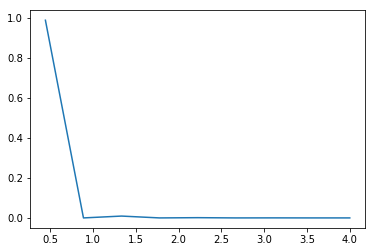

num12
[ 0.05052685  0.02172754  0.08610983  0.04949187  0.14395818  0.06931324
  0.11611371  0.06189068  0.09317579]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.07298322  0.10436745  0.22874832  0.30023658  0.50817617  0.6082953
  0.7760151   0.86541275  1.        ]


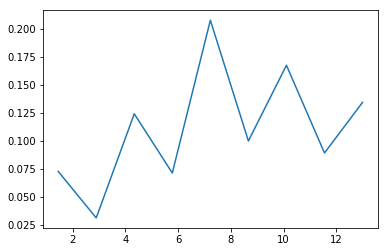

num13
[ 3.05244966  0.          0.          0.          0.          0.          0.
  0.          5.94755034]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.33916107  0.33916107  0.33916107  0.33916107  0.33916107  0.33916107
  0.33916107  0.33916107  1.        ]


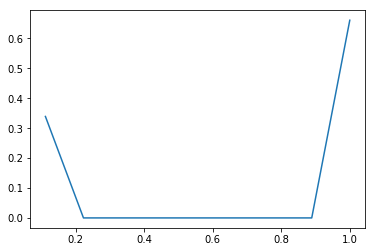

num14
[ 7.91039597  0.          0.          0.          0.          0.          0.
  0.          1.08960403]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87893289  0.87893289  0.87893289  0.87893289  0.87893289  0.87893289
  0.87893289  0.87893289  1.        ]


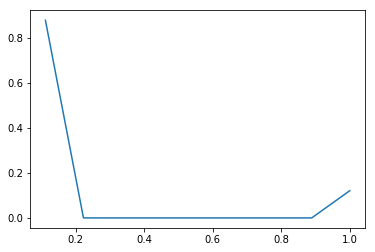

num15
[ 7.61901342  0.          0.          0.          0.          0.          0.
  0.          1.38098658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.84655705  0.84655705  0.84655705  0.84655705  0.84655705  0.84655705
  0.84655705  0.84655705  1.        ]


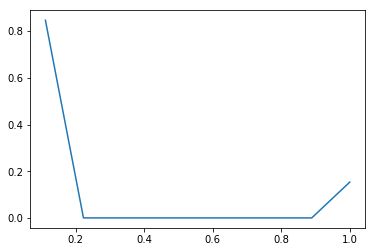

num16
[ 0.3642953   0.72557047  1.09874161  0.          0.9002349   1.48822148
  1.14088926  0.          4.28204698]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.03642953  0.10898658  0.21886074  0.21886074  0.30888423  0.45770638
  0.5717953   0.5717953   1.        ]


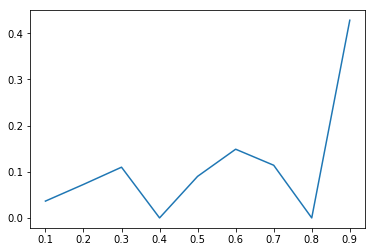

num17
[ 1.01735738  1.76348154  1.08987416  0.17823826  0.30828859  0.33372483
  0.1565604   0.04907718  0.10339765]
[ 0.   0.2  0.4  0.6  0.8  1.   1.2  1.4  1.6  1.8]
[ 0.20347148  0.55616779  0.77414262  0.80979027  0.87144799  0.93819295
  0.96950503  0.97932047  1.        ]


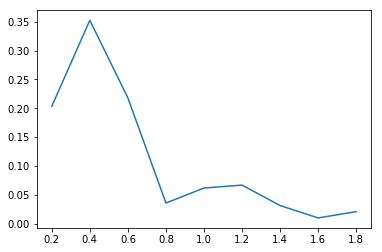

num18
[  1.11996963e-01   1.49221315e+00   4.63230133e-01   1.68504280e-01
   2.48911675e-02   2.12267927e-03   1.82269419e-04   2.27836773e-05
   1.51891182e-05]
[ 0.06123724  0.50309366  0.94495008  1.3868065   1.82866292  2.27051934
  2.71237576  3.15423218  3.5960886   4.03794502]
[ 0.04948658  0.70883054  0.91351174  0.98796644  0.99896477  0.99990268
  0.99998322  0.99999329  1.        ]


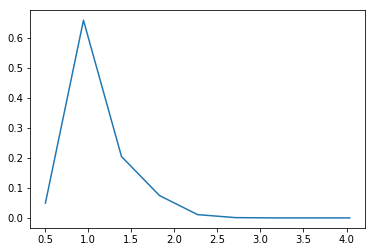

num19
[  1.30973154e-01   0.00000000e+00   0.00000000e+00   3.07192953e-01
   0.00000000e+00   0.00000000e+00   9.54352349e-01   2.51677852e-05
   1.60745638e+00]
[ 0.          0.33333333  0.66666667  1.          1.33333333  1.66666667
  2.          2.33333333  2.66666667  3.        ]
[ 0.04365772  0.04365772  0.04365772  0.14605537  0.14605537  0.14605537
  0.46417282  0.46418121  1.        ]


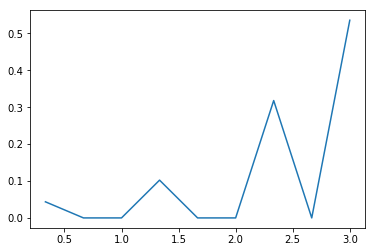

num20
[  7.77776344e-04   2.63714143e+00   4.73178387e+00   3.44140106e-01
   1.00851666e-02   1.49073799e-03   0.00000000e+00   0.00000000e+00
   4.92591684e-04]
[ 0.1         0.22943456  0.35886913  0.48830369  0.61773825  0.74717281
  0.87660738  1.00604194  1.1354765   1.26491106]
[  1.00671141e-04   3.41437919e-01   9.53894295e-01   9.98437919e-01
   9.99743289e-01   9.99936242e-01   9.99936242e-01   9.99936242e-01
   1.00000000e+00]


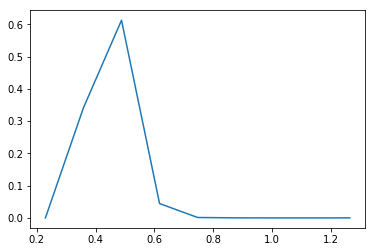

num21
[  4.62205815e-01   1.78143611e+00   2.84879902e-01   5.51630331e-02
   8.08558816e-03   1.47960171e-03   3.48141578e-04   3.48141578e-05
   2.17588487e-05]
[ 0.25061907  0.63617539  1.02173172  1.40728805  1.79284437  2.1784007
  2.56395702  2.94951335  3.33506968  3.720626  ]
[ 0.17820638  0.86505034  0.97488758  0.99615604  0.99927349  0.99984396
  0.99997819  0.99999161  1.        ]


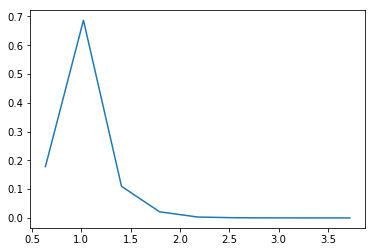

num22
[  2.26430562e-03   1.39584410e-02   1.52482353e-02   3.45842588e+00
   1.02410531e+01   2.74468236e+00   3.68422588e-01   2.36892227e-01
   1.66240159e-03]
[ 0.10954451  0.16808358  0.22662264  0.28516171  0.34370077  0.40223984
  0.46077891  0.51931797  0.57785704  0.6363961 ]
[  1.32550336e-04   9.49664430e-04   1.84228188e-03   2.04295302e-01
   8.03796980e-01   9.64468121e-01   9.86035235e-01   9.99902685e-01
   1.00000000e+00]


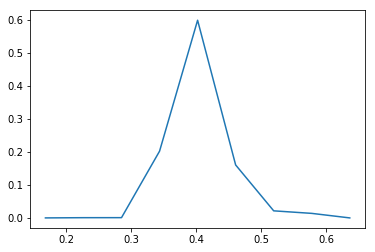

num23
[ 0.05734502  0.          0.0271167   0.02632164  0.09525352  0.1609971
  0.3195283   0.72976175  0.98902713]
[ 0.          0.41573971  0.83147942  1.24721913  1.66295884  2.07869855
  2.49443826  2.91017797  3.32591768  3.74165739]
[ 0.0238406   0.0238406   0.03511409  0.04605705  0.08565772  0.1525906
  0.28543121  0.58882215  1.        ]


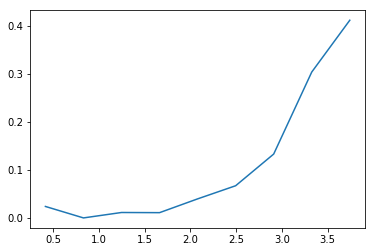

der1
[ 1.00446309  0.99966443  1.99724832  0.          0.99555369  2.00659396
  1.00062081  0.          1.9958557 ]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10044631  0.20041275  0.40013758  0.40013758  0.49969295  0.70035235
  0.80041443  0.80041443  1.        ]


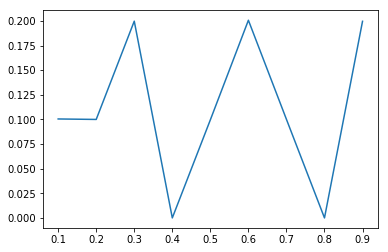

der2
[ 1.00177852  0.99781879  1.99901007  0.          1.00493289  2.00877517
  0.99964765  0.          1.98803691]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10017785  0.19995973  0.39986074  0.39986074  0.50035403  0.70123154
  0.80119631  0.80119631  1.        ]


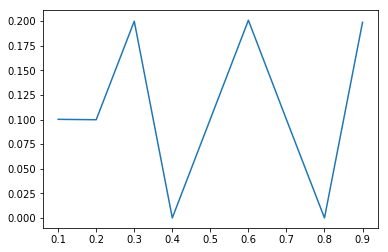

der3
[ 0.99666107  1.00894295  1.99874161  0.          0.99496644  2.005
  0.99758389  0.          1.99810403]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.09966611  0.2005604   0.40043456  0.40043456  0.49993121  0.70043121
  0.8001896   0.8001896   1.        ]


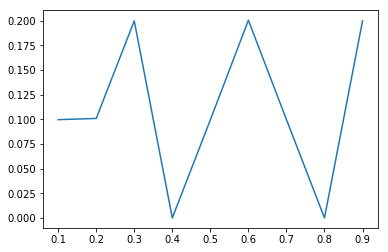

der4
[ 0.07228691  0.32664262  0.          0.58660369  0.          0.53074027
  0.          0.24079228  0.04293423]
[ 0.          0.55555556  1.11111111  1.66666667  2.22222222  2.77777778
  3.33333333  3.88888889  4.44444444  5.        ]
[ 0.0401594   0.22162752  0.22162752  0.54751846  0.54751846  0.84237416
  0.84237416  0.97614765  1.        ]


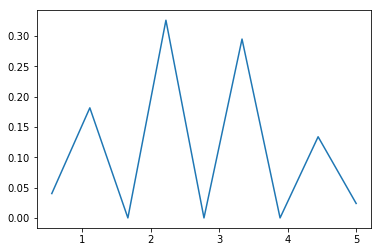

der5
[ 0.15430117  0.43060822  0.          0.49186661  0.30032215  0.
  0.10251091  0.01898406  0.00140688]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.10286745  0.3899396   0.3899396   0.71785067  0.91806544  0.91806544
  0.98640604  0.99906208  1.        ]


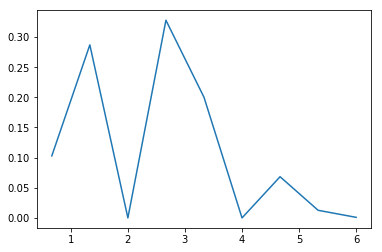

der6
[  1.05704698e-05   1.99328859e-04   1.81208054e-03   1.01431208e-02
   4.02372483e-02   1.11065436e-01   2.11320302e-01   2.64672483e-01
   2.60539430e-01]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[  1.17449664e-05   2.33221477e-04   2.24664430e-03   1.35167785e-02
   5.82248322e-02   1.81630872e-01   4.16431208e-01   7.10511745e-01
   1.00000000e+00]


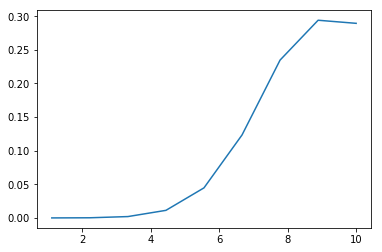

der7
[ 0.02568624  0.11643456  0.23373993  0.27285403  0.20502013  0.10366275
  0.03428356  0.00736074  0.00095805]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.02568624  0.14212081  0.37586074  0.64871477  0.8537349   0.95739765
  0.99168121  0.99904195  1.        ]


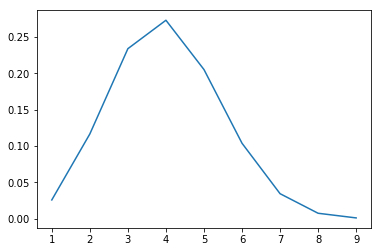

der8
[  1.52516779e-04   1.27147651e-03   6.75151007e-03   2.59716443e-02
   7.49340604e-02   1.55663758e-01   2.29471309e-01   2.28791779e-01
   1.76991946e-01]
[  2.           3.11111111   4.22222222   5.33333333   6.44444444
   7.55555556   8.66666667   9.77777778  10.88888889  12.        ]
[  1.69463087e-04   1.58221477e-03   9.08389262e-03   3.79412752e-02
   1.21201342e-01   2.94161074e-01   5.49129195e-01   8.03342282e-01
   1.00000000e+00]


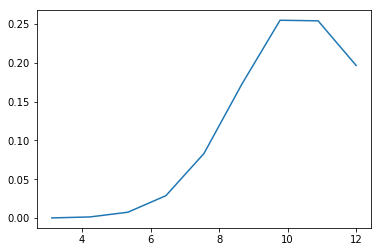

der9
[ 0.07450671  0.26219942  0.39428715  0.33013303  0.          0.16621956
  0.04962943  0.00816731  0.00057167]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.05794966  0.26188255  0.56855034  0.82532047  0.82532047  0.95460235
  0.99320302  0.99955537  1.        ]


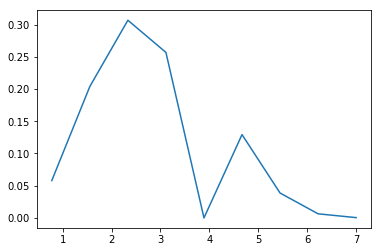

der10
[  3.51181208e-03   5.22344295e-02   1.35866779e-01   1.15905503e-01
   3.48499329e-02   1.54280537e-02   2.03496644e-03   1.61275168e-04
   7.24832215e-06]
[  0.           2.77777778   5.55555556   8.33333333  11.11111111
  13.88888889  16.66666667  19.44444444  22.22222222  25.        ]
[ 0.00975503  0.15485067  0.53225839  0.85421812  0.95102349  0.99387919
  0.99953188  0.99997987  1.        ]


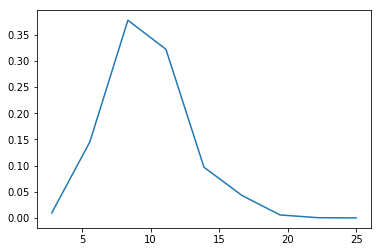

der11
[  4.36592194e-02   1.30036648e-01   1.55696662e-01   9.64893147e-02
   3.66580714e-02   9.15657012e-03   1.75565171e-03   2.05051219e-04
   2.70222536e-05]
[  0.           2.11111111   4.22222222   6.33333333   8.44444444
  10.55555556  12.66666667  14.77777778  16.88888889  19.        ]
[ 0.09216946  0.36669128  0.69538423  0.89908389  0.97647315  0.99580369
  0.99951007  0.99994295  1.        ]


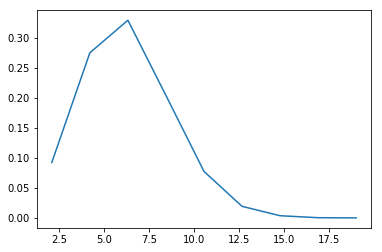

der12
[  5.20559396e-01   2.19741946e-01   1.06382718e-01   3.89808725e-02
   1.10234899e-02   2.60486577e-03   5.85906040e-04   9.96644295e-05
   2.11409396e-05]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[ 0.57839933  0.82255705  0.94076007  0.98407215  0.99632047  0.99921477
  0.99986577  0.99997651  1.        ]


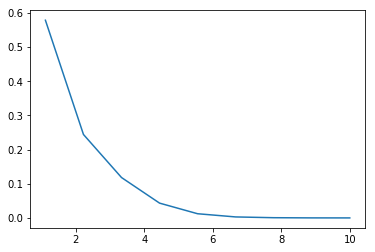

der13
[  1.51566598e-01   1.62077827e-01   2.65374548e-01   6.34588281e-02
   4.34295302e-02   4.51393908e-03   1.75632421e-03   1.02219928e-04
   2.78781621e-05]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.21892953  0.45304195  0.83636074  0.92802349  0.99075503  0.99727517
  0.99981208  0.99995973  1.        ]


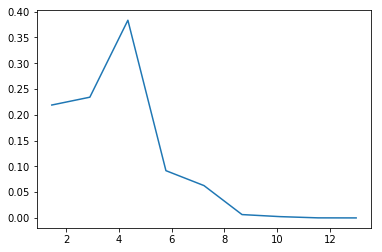

der14
[  7.65997957e-03   8.51040998e-02   1.10167275e-01   1.33256201e-01
   3.78521301e-02   1.53534432e-02   1.57834841e-03   3.17114094e-04
   1.57572221e-05]
[  0.           2.55555556   5.11111111   7.66666667  10.22222222
  12.77777778  15.33333333  17.88888889  20.44444444  23.        ]
[ 0.0195755   0.23706376  0.51860235  0.85914597  0.95587919  0.99511577
  0.99914933  0.99995973  1.        ]


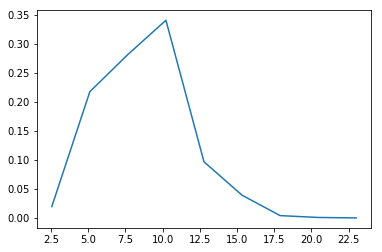

der15
[ 7.89813423  0.          0.          0.          0.          0.          0.
  0.          1.10186577]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87757047  0.87757047  0.87757047  0.87757047  0.87757047  0.87757047
  0.87757047  0.87757047  1.        ]


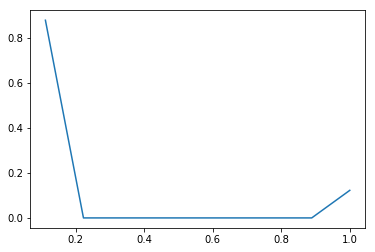

der16
[ 3.34988758  0.          0.          0.          0.          0.          0.
  0.          5.65011242]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.37220973  0.37220973  0.37220973  0.37220973  0.37220973  0.37220973
  0.37220973  0.37220973  1.        ]


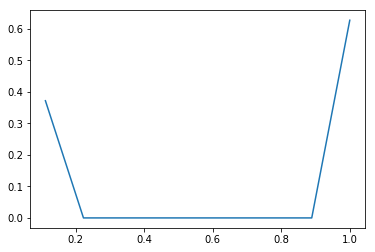

der17
[ 4.01236913  0.          0.          0.          0.          0.          0.
  0.          4.98763087]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.44581879  0.44581879  0.44581879  0.44581879  0.44581879  0.44581879
  0.44581879  0.44581879  1.        ]


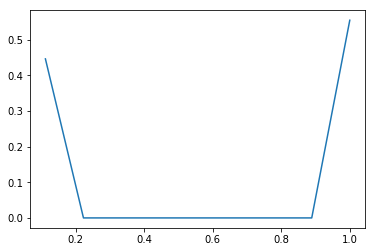

der18
[ 6.41493121  0.          0.          0.          0.          0.          0.
  0.          2.58506879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.71277013  0.71277013  0.71277013  0.71277013  0.71277013  0.71277013
  0.71277013  0.71277013  1.        ]


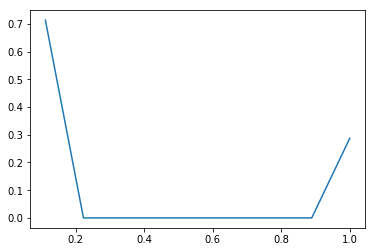

der19
[ 5.85918121  0.          0.          0.          0.          0.          0.
  0.          3.14081879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.65102013  0.65102013  0.65102013  0.65102013  0.65102013  0.65102013
  0.65102013  0.65102013  1.        ]


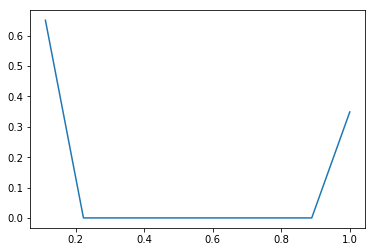

cat1
[  2.17666107e+00   1.09228188e-03   0.00000000e+00   6.22832215e-01
   0.00000000e+00   0.00000000e+00   1.42072148e-01   0.00000000e+00
   5.73422819e-02]
[ 1.          1.33333333  1.66666667  2.          2.33333333  2.66666667
  3.          3.33333333  3.66666667  4.        ]
[ 0.72555369  0.72591779  0.72591779  0.93352852  0.93352852  0.93352852
  0.98088591  0.98088591  1.        ]


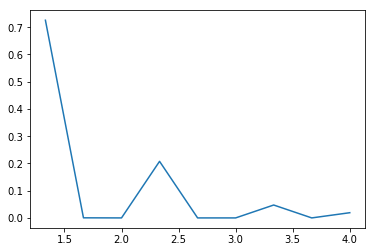

cat2
[  5.24613926e+00   0.00000000e+00   0.00000000e+00   1.25335570e-03
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.75260738e+00]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.58290436  0.58290436  0.58290436  0.58304362  0.58304362  0.58304362
  0.58304362  0.58304362  1.        ]


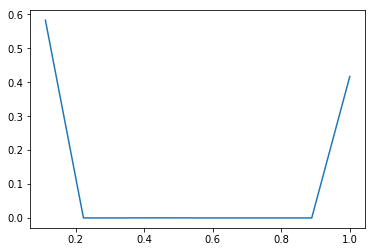

cat3
[ 1.34526342  0.02096728  0.          0.01053523  0.02074581  0.
  0.04623826  0.00415772  0.05209228]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.89684228  0.91082047  0.91082047  0.91784396  0.9316745   0.9316745
  0.9625      0.96527181  1.        ]


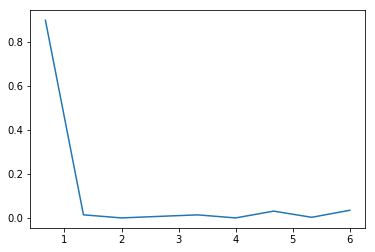

cat4
[ 0.00999939  0.00294326  0.00915101  0.03598627  0.11070439  0.24639353
  0.02088835  0.02793487  0.35418075]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.01222148  0.01581879  0.02700336  0.07098658  0.20629195  0.5074396
  0.5329698   0.56711242  1.        ]


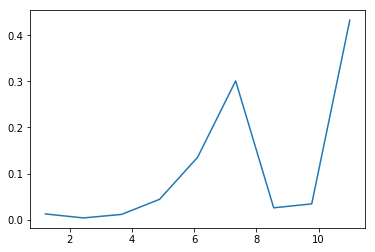

cat5
[  1.53019631e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   7.55033557e-05
   7.46972819e+00]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.17002181  0.17002181  0.17002181  0.17002181  0.17002181  0.17002181
  0.17002181  0.1700302   1.        ]


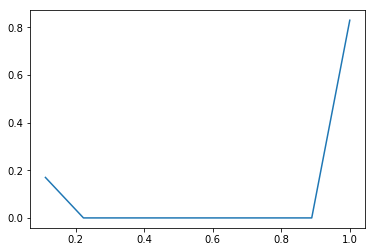

cat7
[  8.34305369e-01   5.39496644e-02   3.99395973e-02   1.07382550e-03
   3.85906040e-04   9.17785235e-04   2.61912752e-03   2.33221477e-04
   6.65755034e-02]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.83430537  0.88825503  0.92819463  0.92926846  0.92965436  0.93057215
  0.93319128  0.9334245   1.        ]


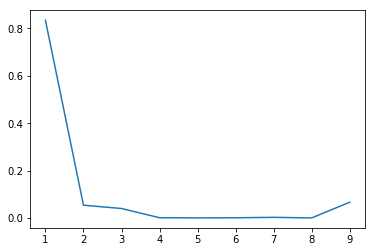

cat8
[ 2.35855872  0.          0.          0.          4.03079195  0.          0.
  0.          2.61064933]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.26206208  0.26206208  0.26206208  0.26206208  0.70992785  0.70992785
  0.70992785  0.70992785  1.        ]


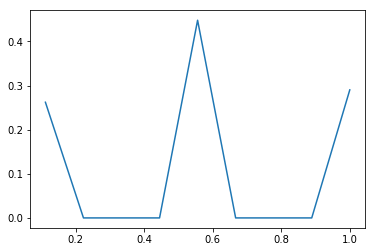

cat9
[ 0.20352685  0.01210008  0.02893999  0.03300296  0.01692252  0.14675987
  0.00767647  0.07201865  0.00846437]
[  0.           1.88888889   3.77777778   5.66666667   7.55555556
   9.44444444  11.33333333  13.22222222  15.11111111  17.        ]
[ 0.3844396   0.4072953   0.46195973  0.52429866  0.55626342  0.83347651
  0.84797651  0.98401174  1.        ]


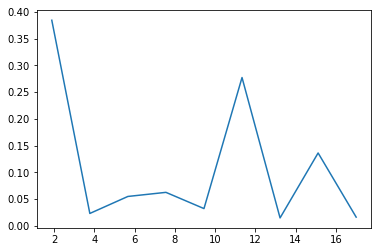

cat10
[ 0.46242785  0.          0.          0.          0.          0.          0.
  0.          8.53757215]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.05138087  0.05138087  0.05138087  0.05138087  0.05138087  0.05138087
  0.05138087  0.05138087  1.        ]


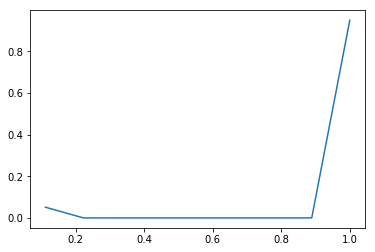

cat11
[ 1.51130537  0.          0.          0.          0.          0.          0.
  0.          7.48869463]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.16792282  0.16792282  0.16792282  0.16792282  0.16792282  0.16792282
  0.16792282  0.16792282  1.        ]


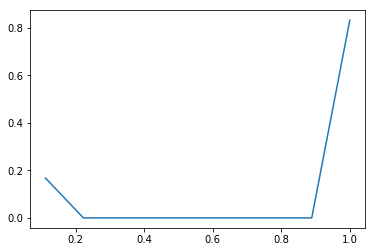

cat12
[  7.35259228e-01   0.00000000e+00   1.11888423e-01   1.96308725e-04
   1.33626594e+00   0.00000000e+00   5.57781040e-02   0.00000000e+00
   1.06119966e-02]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.32678188  0.32678188  0.37651007  0.37659732  0.97049329  0.97049329
  0.99528356  0.99528356  1.        ]


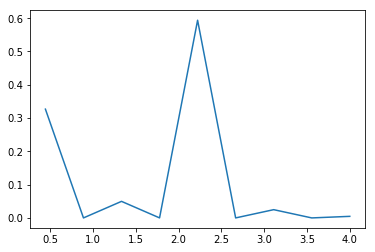

cat13
[  3.67172819e-02   0.00000000e+00   0.00000000e+00   0.00000000e+00
   4.46195386e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.32885906e-03]
[ 0.          0.22222222  0.44444444  0.66666667  0.88888889  1.11111111
  1.33333333  1.55555556  1.77777778  2.        ]
[ 0.0081594  0.0081594  0.0081594  0.0081594  0.9997047  0.9997047
  0.9997047  0.9997047  1.       ]


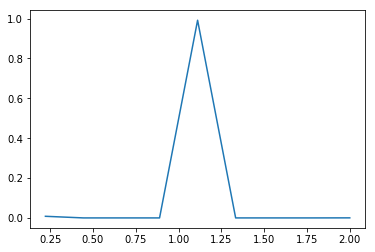

cat14
[ 0.00861647  0.00578971  0.00905043  0.00790982  0.00615521  0.01029235
  0.00628261  0.01103859  0.02224344]
[   1.           12.44444444   23.88888889   35.33333333   46.77777778
   58.22222222   69.66666667   81.11111111   92.55555556  104.        ]
[ 0.09861074  0.16487081  0.26844799  0.35897148  0.42941443  0.5472047
  0.6191057   0.74543624  1.        ]


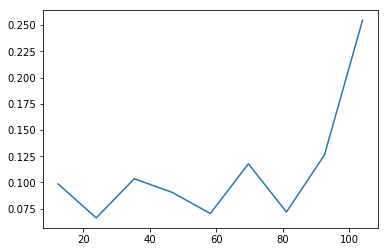

target
[ 8.67207383  0.          0.          0.          0.          0.          0.
  0.          0.32792617]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.96356376  0.96356376  0.96356376  0.96356376  0.96356376  0.96356376
  0.96356376  0.96356376  1.        ]


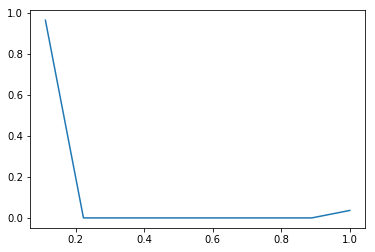

num1
[ 0.40519847  0.3110652   0.17810594  0.11058437  0.          0.07242066
  0.13274569  0.03819823  0.03739573]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.31515436  0.55709396  0.69562081  0.78163087  0.78163087  0.83795805
  0.9412047   0.97091443  1.        ]


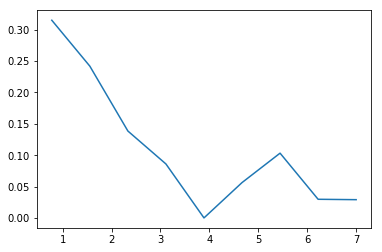

num2
[ 0.11478981  0.13208832  0.11269219  0.09240787  0.16936638  0.07197254
  0.05453264  0.03496492  0.03536714]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.14029866  0.30173993  0.43947483  0.55241779  0.75942114  0.84738758
  0.91403859  0.95677349  1.        ]


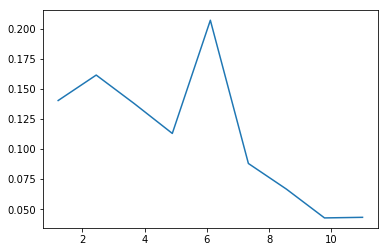

num3
[ 5.4563104  0.         0.         0.         0.         0.         0.         0.
  3.5436896]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.60625671  0.60625671  0.60625671  0.60625671  0.60625671  0.60625671
  0.60625671  0.60625671  1.        ]


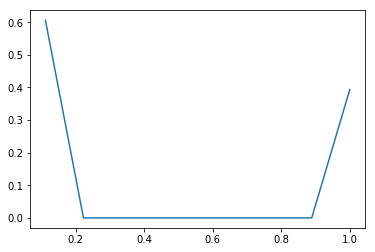

num4
[ 6.68686409  0.          0.          0.          0.          0.          0.
  0.          2.31313591]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.7429849  0.7429849  0.7429849  0.7429849  0.7429849  0.7429849
  0.7429849  0.7429849  1.       ]


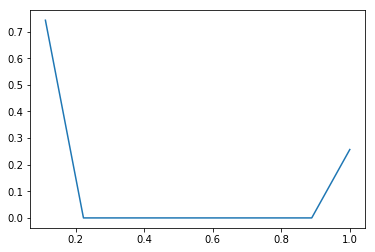

num5
[ 7.52460403  0.          0.          0.          0.          0.          0.
  0.          1.47539597]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.83606711  0.83606711  0.83606711  0.83606711  0.83606711  0.83606711
  0.83606711  0.83606711  1.        ]


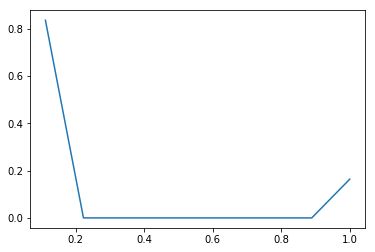

num6
[ 7.33222148  0.          0.          0.          0.          0.          0.
  0.          1.66777852]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.81469128  0.81469128  0.81469128  0.81469128  0.81469128  0.81469128
  0.81469128  0.81469128  1.        ]


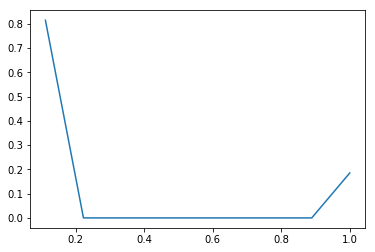

num7
[  8.99663255e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.36744966e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99962584  0.99962584  0.99962584  0.99962584  0.99962584  0.99962584
  0.99962584  0.99962584  1.        ]


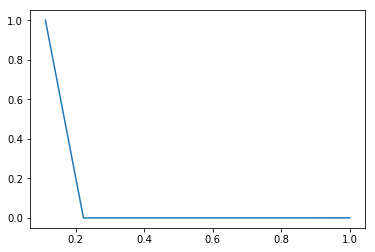

num8
[ 8.98476342  0.          0.          0.          0.          0.          0.
  0.          0.01523658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99830705  0.99830705  0.99830705  0.99830705  0.99830705  0.99830705
  0.99830705  0.99830705  1.        ]


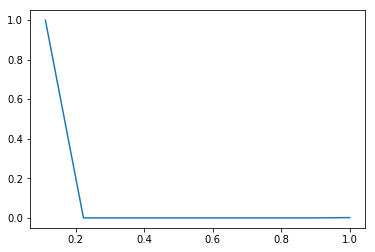

num9
[ 8.91508893  0.          0.          0.          0.          0.          0.
  0.          0.08491107]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99056544  0.99056544  0.99056544  0.99056544  0.99056544  0.99056544
  0.99056544  0.99056544  1.        ]


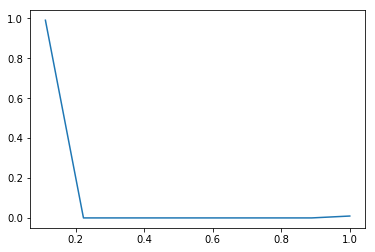

num10
[  8.99146812e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   8.53187919e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99905201  0.99905201  0.99905201  0.99905201  0.99905201  0.99905201
  0.99905201  0.99905201  1.        ]


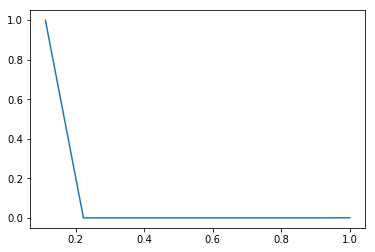

num11
[  2.22589178e+00   0.00000000e+00   2.07596477e-02   0.00000000e+00
   2.81250000e-03   0.00000000e+00   5.17197987e-04   0.00000000e+00
   1.88758389e-05]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.98928523  0.98928523  0.99851174  0.99851174  0.99976174  0.99976174
  0.99999161  0.99999161  1.        ]


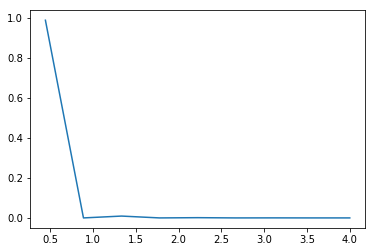

num12
[ 0.05052685  0.02172754  0.08610983  0.04949187  0.14395818  0.06931324
  0.11611371  0.06189068  0.09317579]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.07298322  0.10436745  0.22874832  0.30023658  0.50817617  0.6082953
  0.7760151   0.86541275  1.        ]


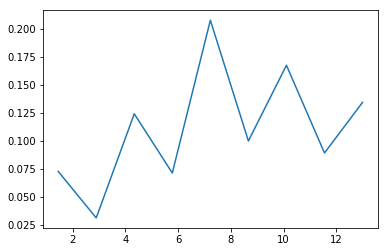

num13
[ 3.05244966  0.          0.          0.          0.          0.          0.
  0.          5.94755034]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.33916107  0.33916107  0.33916107  0.33916107  0.33916107  0.33916107
  0.33916107  0.33916107  1.        ]


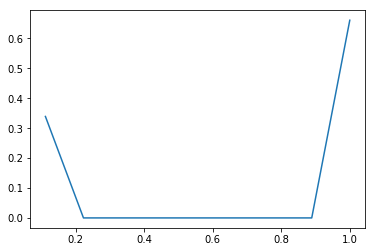

num14
[ 7.91039597  0.          0.          0.          0.          0.          0.
  0.          1.08960403]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87893289  0.87893289  0.87893289  0.87893289  0.87893289  0.87893289
  0.87893289  0.87893289  1.        ]


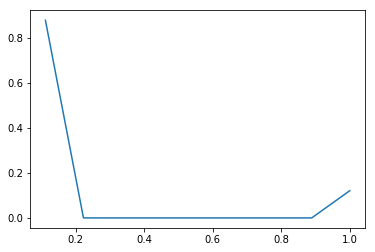

num15
[ 7.61901342  0.          0.          0.          0.          0.          0.
  0.          1.38098658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.84655705  0.84655705  0.84655705  0.84655705  0.84655705  0.84655705
  0.84655705  0.84655705  1.        ]


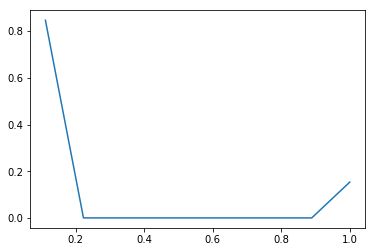

num16
[ 0.3642953   0.72557047  1.09874161  0.          0.9002349   1.48822148
  1.14088926  0.          4.28204698]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.03642953  0.10898658  0.21886074  0.21886074  0.30888423  0.45770638
  0.5717953   0.5717953   1.        ]


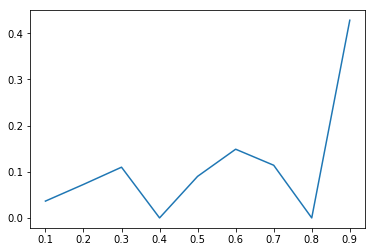

num17
[ 1.01735738  1.76348154  1.08987416  0.17823826  0.30828859  0.33372483
  0.1565604   0.04907718  0.10339765]
[ 0.   0.2  0.4  0.6  0.8  1.   1.2  1.4  1.6  1.8]
[ 0.20347148  0.55616779  0.77414262  0.80979027  0.87144799  0.93819295
  0.96950503  0.97932047  1.        ]


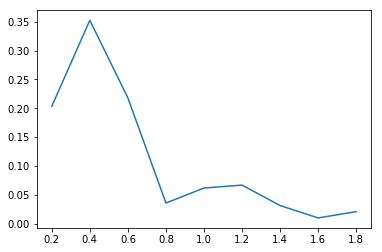

num18
[  1.11996963e-01   1.50383662e+00   4.51606660e-01   1.68504280e-01
   2.48911675e-02   2.12267927e-03   1.82269419e-04   2.27836773e-05
   1.51891182e-05]
[ 0.06123724  0.50309366  0.94495008  1.3868065   1.82866292  2.27051934
  2.71237576  3.15423218  3.5960886   4.03794502]
[ 0.04948658  0.71396644  0.91351174  0.98796644  0.99896477  0.99990268
  0.99998322  0.99999329  1.        ]


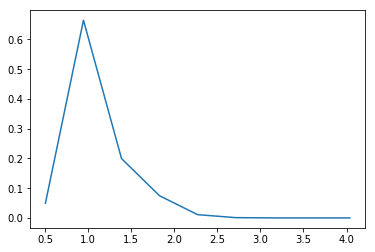

num19
[ 0.13097315  0.          0.          0.30719295  0.          0.
  0.95435235  0.          1.60748154]
[ 0.          0.33333333  0.66666667  1.          1.33333333  1.66666667
  2.          2.33333333  2.66666667  3.        ]
[ 0.04365772  0.04365772  0.04365772  0.14605537  0.14605537  0.14605537
  0.46417282  0.46417282  1.        ]


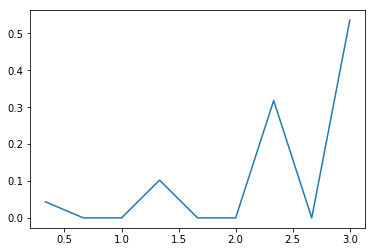

num20
[  7.77776344e-04   2.63714143e+00   4.73178387e+00   3.44140106e-01
   1.00851666e-02   1.49073799e-03   0.00000000e+00   0.00000000e+00
   4.92591684e-04]
[ 0.1         0.22943456  0.35886913  0.48830369  0.61773825  0.74717281
  0.87660738  1.00604194  1.1354765   1.26491106]
[  1.00671141e-04   3.41437919e-01   9.53894295e-01   9.98437919e-01
   9.99743289e-01   9.99936242e-01   9.99936242e-01   9.99936242e-01
   1.00000000e+00]


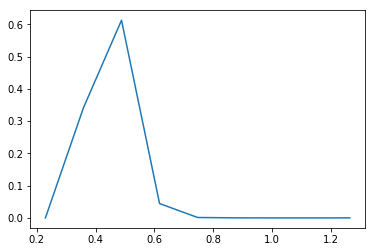

num21
[  4.62205815e-01   1.78143611e+00   2.84879902e-01   5.51630331e-02
   8.08558816e-03   1.47960171e-03   3.48141578e-04   3.48141578e-05
   2.17588487e-05]
[ 0.25061907  0.63617539  1.02173172  1.40728805  1.79284437  2.1784007
  2.56395702  2.94951335  3.33506968  3.720626  ]
[ 0.17820638  0.86505034  0.97488758  0.99615604  0.99927349  0.99984396
  0.99997819  0.99999161  1.        ]


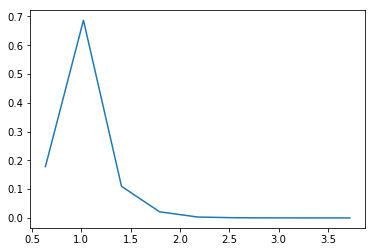

num22
[  2.26430562e-03   1.39584410e-02   1.52482353e-02   3.45842588e+00
   1.02410531e+01   2.74468236e+00   3.68422588e-01   2.36892227e-01
   1.66240159e-03]
[ 0.10954451  0.16808358  0.22662264  0.28516171  0.34370077  0.40223984
  0.46077891  0.51931797  0.57785704  0.6363961 ]
[  1.32550336e-04   9.49664430e-04   1.84228188e-03   2.04295302e-01
   8.03796980e-01   9.64468121e-01   9.86035235e-01   9.99902685e-01
   1.00000000e+00]


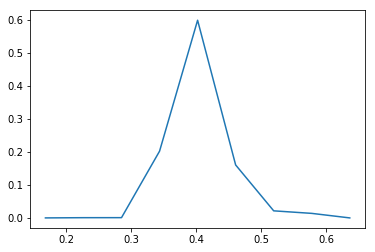

num23
[ 0.05734502  0.          0.0271167   0.02632164  0.09525352  0.1609971
  0.3195283   0.72976175  0.98902713]
[ 0.          0.41573971  0.83147942  1.24721913  1.66295884  2.07869855
  2.49443826  2.91017797  3.32591768  3.74165739]
[ 0.0238406   0.0238406   0.03511409  0.04605705  0.08565772  0.1525906
  0.28543121  0.58882215  1.        ]


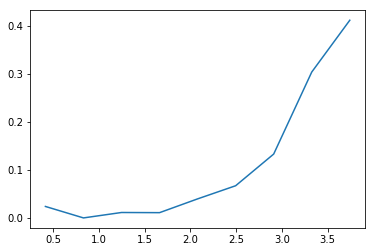

der1
[ 1.00446309  0.99966443  1.99724832  0.          0.99555369  2.00659396
  1.00062081  0.          1.9958557 ]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10044631  0.20041275  0.40013758  0.40013758  0.49969295  0.70035235
  0.80041443  0.80041443  1.        ]


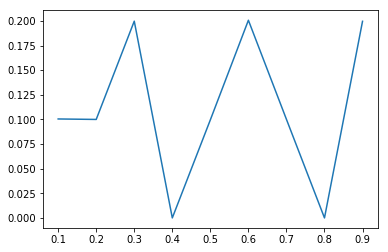

der2
[ 1.00177852  0.99781879  1.99901007  0.          1.00493289  2.00877517
  0.99964765  0.          1.98803691]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10017785  0.19995973  0.39986074  0.39986074  0.50035403  0.70123154
  0.80119631  0.80119631  1.        ]


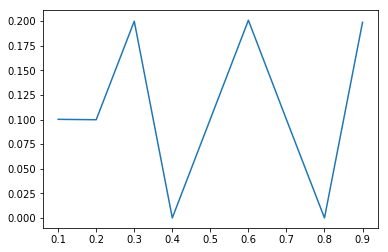

der3
[ 0.99666107  1.00894295  1.99874161  0.          0.99496644  2.005
  0.99758389  0.          1.99810403]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.09966611  0.2005604   0.40043456  0.40043456  0.49993121  0.70043121
  0.8001896   0.8001896   1.        ]


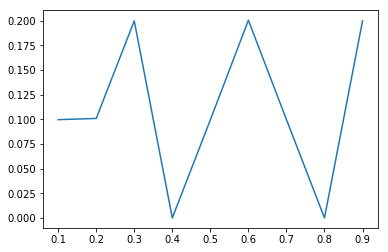

der4
[ 0.07228691  0.32664262  0.          0.58660369  0.          0.53074027
  0.          0.24079228  0.04293423]
[ 0.          0.55555556  1.11111111  1.66666667  2.22222222  2.77777778
  3.33333333  3.88888889  4.44444444  5.        ]
[ 0.0401594   0.22162752  0.22162752  0.54751846  0.54751846  0.84237416
  0.84237416  0.97614765  1.        ]


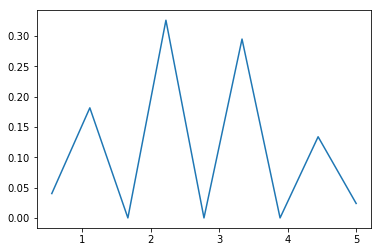

der5
[ 0.15430117  0.43060822  0.          0.49186661  0.30032215  0.
  0.10251091  0.01898406  0.00140688]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.10286745  0.3899396   0.3899396   0.71785067  0.91806544  0.91806544
  0.98640604  0.99906208  1.        ]


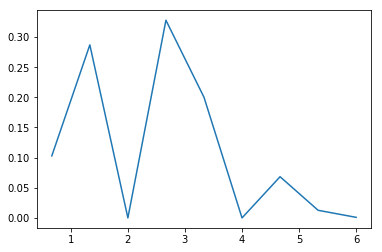

der6
[  1.05704698e-05   1.99328859e-04   1.81208054e-03   1.01431208e-02
   4.02372483e-02   1.11065436e-01   2.11320302e-01   2.64672483e-01
   2.60539430e-01]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[  1.17449664e-05   2.33221477e-04   2.24664430e-03   1.35167785e-02
   5.82248322e-02   1.81630872e-01   4.16431208e-01   7.10511745e-01
   1.00000000e+00]


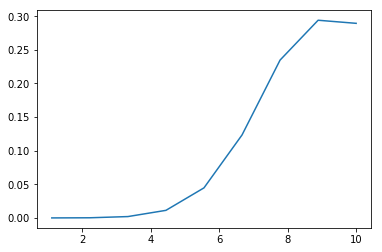

der7
[ 0.02568624  0.11643456  0.23373993  0.27285403  0.20502013  0.10366275
  0.03428356  0.00736074  0.00095805]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.02568624  0.14212081  0.37586074  0.64871477  0.8537349   0.95739765
  0.99168121  0.99904195  1.        ]


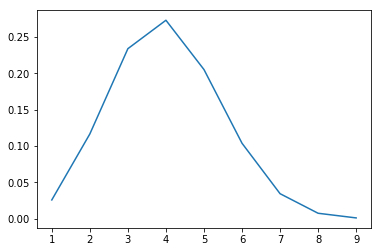

der8
[  1.52516779e-04   1.27147651e-03   6.75151007e-03   2.59716443e-02
   7.49340604e-02   1.55663758e-01   2.29471309e-01   2.28791779e-01
   1.76991946e-01]
[  2.           3.11111111   4.22222222   5.33333333   6.44444444
   7.55555556   8.66666667   9.77777778  10.88888889  12.        ]
[  1.69463087e-04   1.58221477e-03   9.08389262e-03   3.79412752e-02
   1.21201342e-01   2.94161074e-01   5.49129195e-01   8.03342282e-01
   1.00000000e+00]


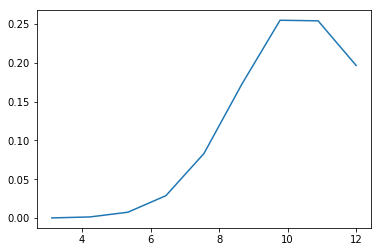

der9
[ 0.07450671  0.26219942  0.39428715  0.33013303  0.          0.16621956
  0.04962943  0.00816731  0.00057167]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.05794966  0.26188255  0.56855034  0.82532047  0.82532047  0.95460235
  0.99320302  0.99955537  1.        ]


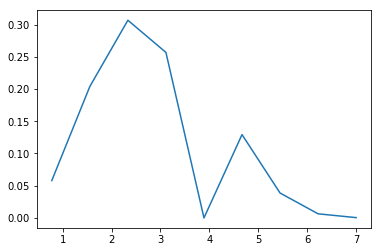

der10
[  3.51181208e-03   5.22344295e-02   1.35866779e-01   1.15905503e-01
   3.48499329e-02   1.54280537e-02   2.03496644e-03   1.61275168e-04
   7.24832215e-06]
[  0.           2.77777778   5.55555556   8.33333333  11.11111111
  13.88888889  16.66666667  19.44444444  22.22222222  25.        ]
[ 0.00975503  0.15485067  0.53225839  0.85421812  0.95102349  0.99387919
  0.99953188  0.99997987  1.        ]


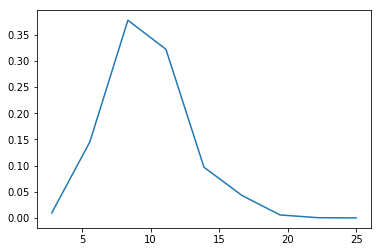

der11
[  4.36592194e-02   1.30036648e-01   1.55696662e-01   9.64893147e-02
   3.66580714e-02   9.15657012e-03   1.75565171e-03   2.05051219e-04
   2.70222536e-05]
[  0.           2.11111111   4.22222222   6.33333333   8.44444444
  10.55555556  12.66666667  14.77777778  16.88888889  19.        ]
[ 0.09216946  0.36669128  0.69538423  0.89908389  0.97647315  0.99580369
  0.99951007  0.99994295  1.        ]


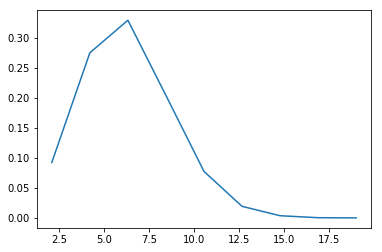

der12
[  5.20559396e-01   2.19741946e-01   1.06382718e-01   3.89808725e-02
   1.10234899e-02   2.60486577e-03   5.85906040e-04   9.96644295e-05
   2.11409396e-05]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[ 0.57839933  0.82255705  0.94076007  0.98407215  0.99632047  0.99921477
  0.99986577  0.99997651  1.        ]


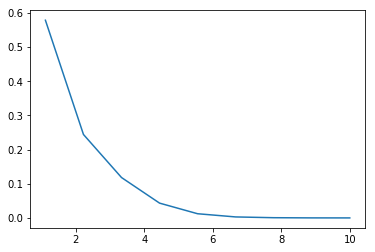

der13
[  1.51566598e-01   1.62077827e-01   2.65374548e-01   6.34588281e-02
   4.34295302e-02   4.51393908e-03   1.75632421e-03   1.02219928e-04
   2.78781621e-05]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.21892953  0.45304195  0.83636074  0.92802349  0.99075503  0.99727517
  0.99981208  0.99995973  1.        ]


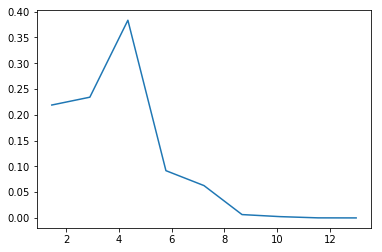

der14
[  7.65997957e-03   8.51040998e-02   1.10167275e-01   1.33256201e-01
   3.78521301e-02   1.53534432e-02   1.57834841e-03   3.17114094e-04
   1.57572221e-05]
[  0.           2.55555556   5.11111111   7.66666667  10.22222222
  12.77777778  15.33333333  17.88888889  20.44444444  23.        ]
[ 0.0195755   0.23706376  0.51860235  0.85914597  0.95587919  0.99511577
  0.99914933  0.99995973  1.        ]


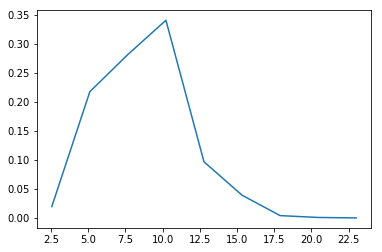

der15
[ 7.89813423  0.          0.          0.          0.          0.          0.
  0.          1.10186577]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87757047  0.87757047  0.87757047  0.87757047  0.87757047  0.87757047
  0.87757047  0.87757047  1.        ]


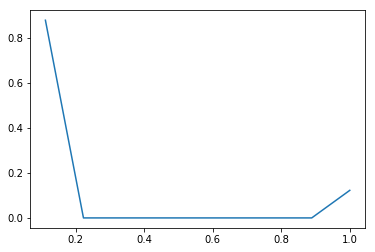

der16
[ 3.34988758  0.          0.          0.          0.          0.          0.
  0.          5.65011242]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.37220973  0.37220973  0.37220973  0.37220973  0.37220973  0.37220973
  0.37220973  0.37220973  1.        ]


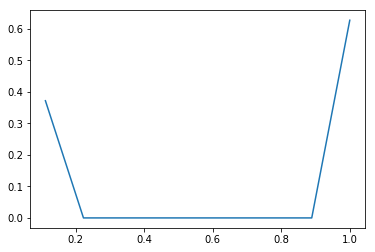

der17
[ 4.01236913  0.          0.          0.          0.          0.          0.
  0.          4.98763087]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.44581879  0.44581879  0.44581879  0.44581879  0.44581879  0.44581879
  0.44581879  0.44581879  1.        ]


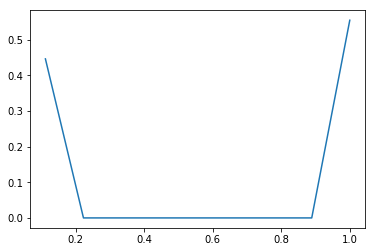

der18
[ 6.41493121  0.          0.          0.          0.          0.          0.
  0.          2.58506879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.71277013  0.71277013  0.71277013  0.71277013  0.71277013  0.71277013
  0.71277013  0.71277013  1.        ]


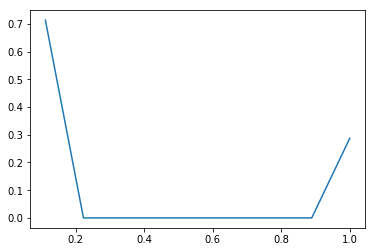

der19
[ 5.85918121  0.          0.          0.          0.          0.          0.
  0.          3.14081879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.65102013  0.65102013  0.65102013  0.65102013  0.65102013  0.65102013
  0.65102013  0.65102013  1.        ]


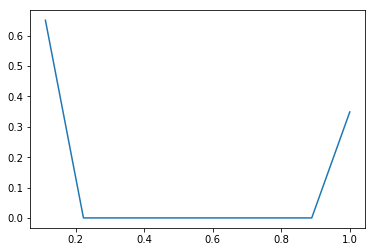

cat1
[ 2.17775336  0.          0.          0.62283221  0.          0.
  0.14207215  0.          0.05734228]
[ 1.          1.33333333  1.66666667  2.          2.33333333  2.66666667
  3.          3.33333333  3.66666667  4.        ]
[ 0.72591779  0.72591779  0.72591779  0.93352852  0.93352852  0.93352852
  0.98088591  0.98088591  1.        ]


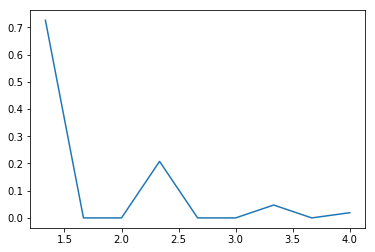

cat2
[ 5.24739262  0.          0.          0.          0.          0.          0.
  0.          3.75260738]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.58304362  0.58304362  0.58304362  0.58304362  0.58304362  0.58304362
  0.58304362  0.58304362  1.        ]


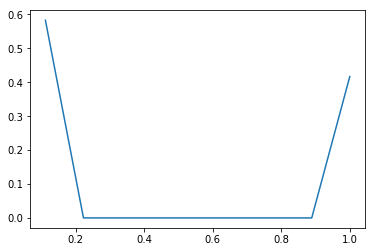

cat3
[ 1.34526342  0.02096728  0.          0.01053523  0.02074581  0.
  0.04623826  0.00415772  0.05209228]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.89684228  0.91082047  0.91082047  0.91784396  0.9316745   0.9316745
  0.9625      0.96527181  1.        ]


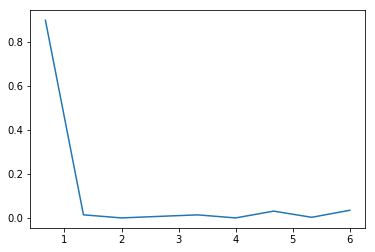

cat4
[ 0.00999939  0.00294326  0.00915101  0.03598627  0.11070439  0.24649375
  0.02074146  0.02798154  0.35418075]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.01222148  0.01581879  0.02700336  0.07098658  0.20629195  0.50756208
  0.53291275  0.56711242  1.        ]


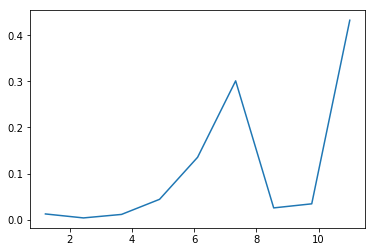

cat5
[ 1.53019631  0.          0.          0.          0.          0.          0.
  0.          7.46980369]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.17002181  0.17002181  0.17002181  0.17002181  0.17002181  0.17002181
  0.17002181  0.17002181  1.        ]


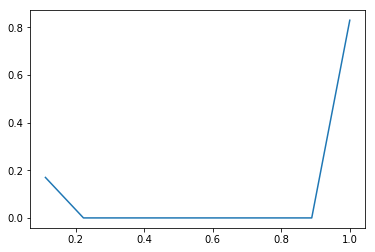

cat7
[  8.34305369e-01   5.39496644e-02   3.99395973e-02   1.07382550e-03
   3.85906040e-04   9.17785235e-04   2.61912752e-03   2.33221477e-04
   6.65755034e-02]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.83430537  0.88825503  0.92819463  0.92926846  0.92965436  0.93057215
  0.93319128  0.9334245   1.        ]


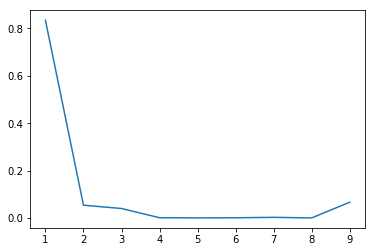

cat8
[ 2.35855872  0.          0.          0.          0.          0.          0.
  0.          6.64144128]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.26206208  0.26206208  0.26206208  0.26206208  0.26206208  0.26206208
  0.26206208  0.26206208  1.        ]


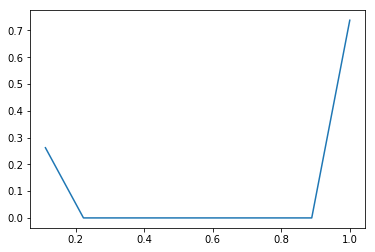

cat9
[ 0.20352685  0.01210008  0.02893999  0.03300296  0.01692252  0.14675987
  0.00767647  0.07201865  0.00846437]
[  0.           1.88888889   3.77777778   5.66666667   7.55555556
   9.44444444  11.33333333  13.22222222  15.11111111  17.        ]
[ 0.3844396   0.4072953   0.46195973  0.52429866  0.55626342  0.83347651
  0.84797651  0.98401174  1.        ]


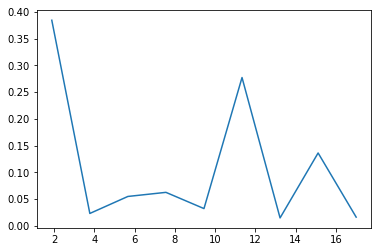

cat10
[ 0.46242785  0.          0.          0.          0.          0.          0.
  0.          8.53757215]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.05138087  0.05138087  0.05138087  0.05138087  0.05138087  0.05138087
  0.05138087  0.05138087  1.        ]


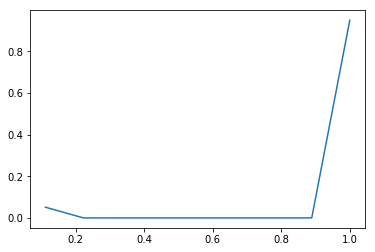

cat11
[ 1.51130537  0.          0.          0.          0.          0.          0.
  0.          7.48869463]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.16792282  0.16792282  0.16792282  0.16792282  0.16792282  0.16792282
  0.16792282  0.16792282  1.        ]


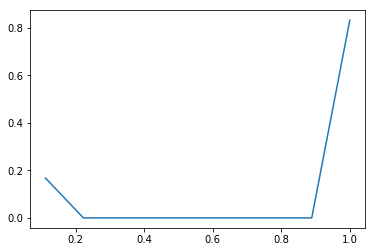

cat12
[ 0.73525923  0.          0.10993289  0.          1.33841779  0.          0.0557781
  0.          0.010612  ]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.32678188  0.32678188  0.37564094  0.37564094  0.97049329  0.97049329
  0.99528356  0.99528356  1.        ]


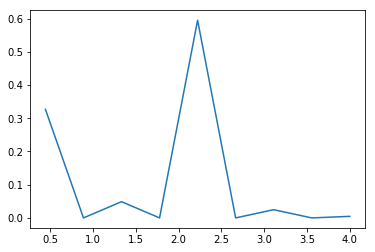

cat13
[  3.67172819e-02   0.00000000e+00   0.00000000e+00   0.00000000e+00
   4.46195386e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.32885906e-03]
[ 0.          0.22222222  0.44444444  0.66666667  0.88888889  1.11111111
  1.33333333  1.55555556  1.77777778  2.        ]
[ 0.0081594  0.0081594  0.0081594  0.0081594  0.9997047  0.9997047
  0.9997047  0.9997047  1.       ]


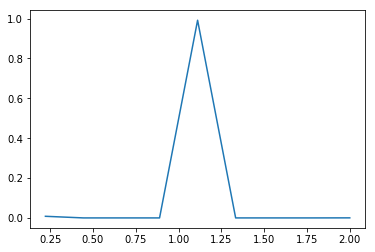

cat14
[ 0.00861647  0.00578971  0.00905043  0.00790982  0.00615521  0.01029235
  0.00628261  0.01103859  0.02224344]
[   1.           12.44444444   23.88888889   35.33333333   46.77777778
   58.22222222   69.66666667   81.11111111   92.55555556  104.        ]
[ 0.09861074  0.16487081  0.26844799  0.35897148  0.42941443  0.5472047
  0.6191057   0.74543624  1.        ]


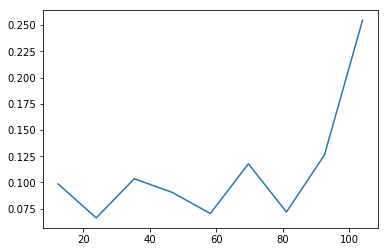

target
[ 8.67207383  0.          0.          0.          0.          0.          0.
  0.          0.32792617]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.96356376  0.96356376  0.96356376  0.96356376  0.96356376  0.96356376
  0.96356376  0.96356376  1.        ]


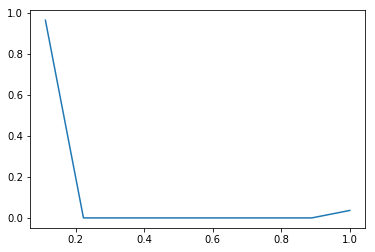

num1
[ 0.40519847  0.3110652   0.17810594  0.11058437  0.          0.07242066
  0.13274569  0.03819823  0.03739573]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.31515436  0.55709396  0.69562081  0.78163087  0.78163087  0.83795805
  0.9412047   0.97091443  1.        ]


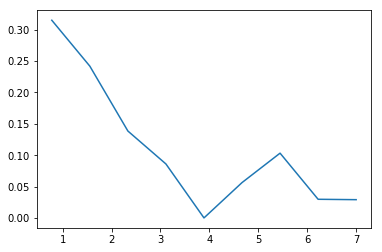

num2
[ 0.11478981  0.13208832  0.11269219  0.09240787  0.16936638  0.07197254
  0.05453264  0.03496492  0.03536714]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.14029866  0.30173993  0.43947483  0.55241779  0.75942114  0.84738758
  0.91403859  0.95677349  1.        ]


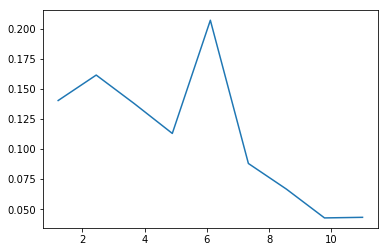

num3
[ 5.4563104  0.         0.         0.         0.         0.         0.         0.
  3.5436896]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.60625671  0.60625671  0.60625671  0.60625671  0.60625671  0.60625671
  0.60625671  0.60625671  1.        ]


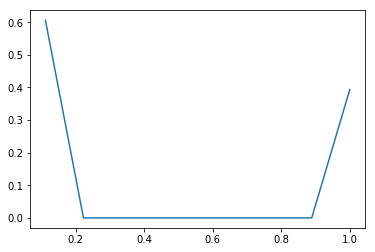

num4
[ 6.68686409  0.          0.          0.          0.          0.          0.
  0.          2.31313591]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.7429849  0.7429849  0.7429849  0.7429849  0.7429849  0.7429849
  0.7429849  0.7429849  1.       ]


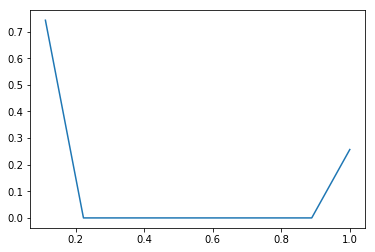

num5
[ 7.52460403  0.          0.          0.          0.          0.          0.
  0.          1.47539597]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.83606711  0.83606711  0.83606711  0.83606711  0.83606711  0.83606711
  0.83606711  0.83606711  1.        ]


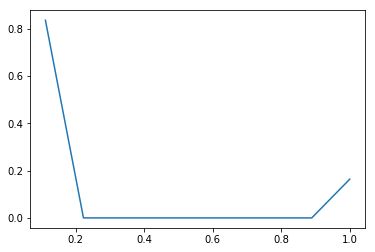

num6
[ 7.33222148  0.          0.          0.          0.          0.          0.
  0.          1.66777852]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.81469128  0.81469128  0.81469128  0.81469128  0.81469128  0.81469128
  0.81469128  0.81469128  1.        ]


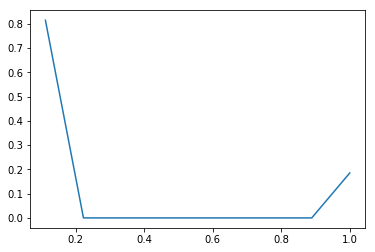

num7
[  8.99663255e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.36744966e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99962584  0.99962584  0.99962584  0.99962584  0.99962584  0.99962584
  0.99962584  0.99962584  1.        ]


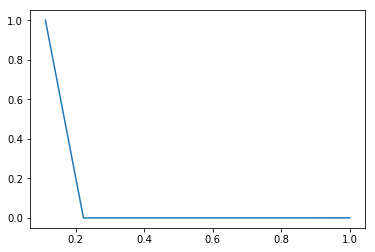

num8
[ 8.98476342  0.          0.          0.          0.          0.          0.
  0.          0.01523658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99830705  0.99830705  0.99830705  0.99830705  0.99830705  0.99830705
  0.99830705  0.99830705  1.        ]


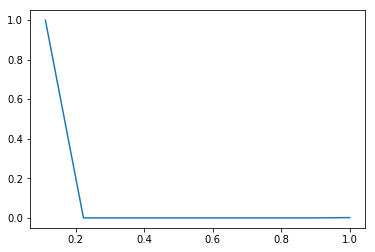

num9
[ 8.91508893  0.          0.          0.          0.          0.          0.
  0.          0.08491107]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99056544  0.99056544  0.99056544  0.99056544  0.99056544  0.99056544
  0.99056544  0.99056544  1.        ]


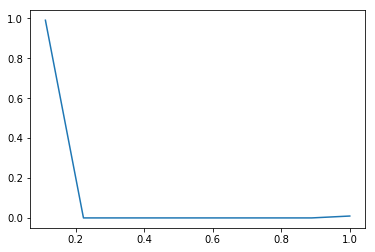

num10
[  8.99146812e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   8.53187919e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99905201  0.99905201  0.99905201  0.99905201  0.99905201  0.99905201
  0.99905201  0.99905201  1.        ]


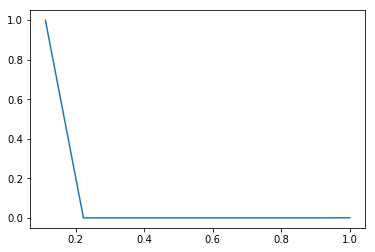

num11
[  2.22589178e+00   0.00000000e+00   2.07596477e-02   0.00000000e+00
   2.81250000e-03   0.00000000e+00   5.17197987e-04   0.00000000e+00
   1.88758389e-05]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.98928523  0.98928523  0.99851174  0.99851174  0.99976174  0.99976174
  0.99999161  0.99999161  1.        ]


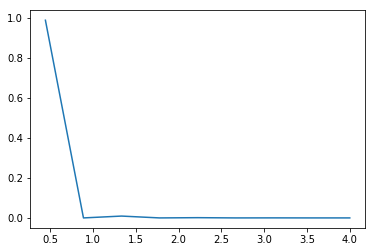

num12
[ 0.05052685  0.02172754  0.08610983  0.04949187  0.14395818  0.06931324
  0.11611371  0.06189068  0.09317579]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.07298322  0.10436745  0.22874832  0.30023658  0.50817617  0.6082953
  0.7760151   0.86541275  1.        ]


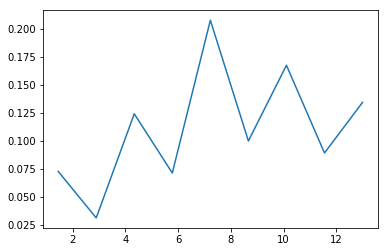

num13
[ 3.05244966  0.          0.          0.          0.          0.          0.
  0.          5.94755034]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.33916107  0.33916107  0.33916107  0.33916107  0.33916107  0.33916107
  0.33916107  0.33916107  1.        ]


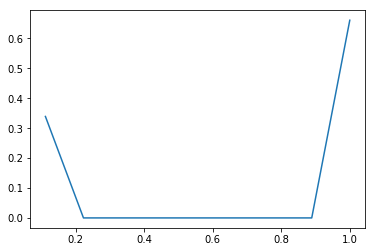

num14
[ 7.91039597  0.          0.          0.          0.          0.          0.
  0.          1.08960403]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87893289  0.87893289  0.87893289  0.87893289  0.87893289  0.87893289
  0.87893289  0.87893289  1.        ]


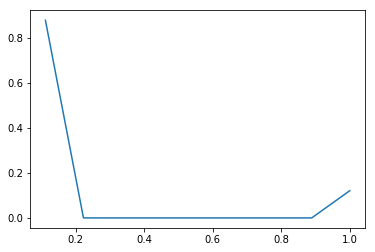

num15
[ 7.61901342  0.          0.          0.          0.          0.          0.
  0.          1.38098658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.84655705  0.84655705  0.84655705  0.84655705  0.84655705  0.84655705
  0.84655705  0.84655705  1.        ]


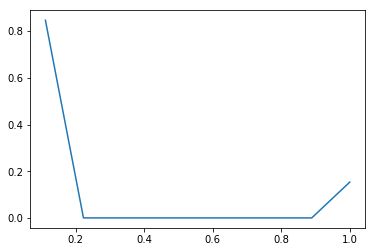

num16
[ 0.3642953   0.72557047  1.09874161  0.          0.9002349   1.48822148
  1.14088926  0.          4.28204698]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.03642953  0.10898658  0.21886074  0.21886074  0.30888423  0.45770638
  0.5717953   0.5717953   1.        ]


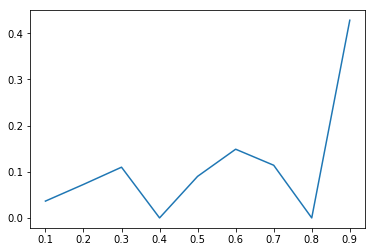

num17
[ 1.01735738  1.76348154  1.08987416  0.17823826  0.30828859  0.33372483
  0.1565604   0.04907718  0.10339765]
[ 0.   0.2  0.4  0.6  0.8  1.   1.2  1.4  1.6  1.8]
[ 0.20347148  0.55616779  0.77414262  0.80979027  0.87144799  0.93819295
  0.96950503  0.97932047  1.        ]


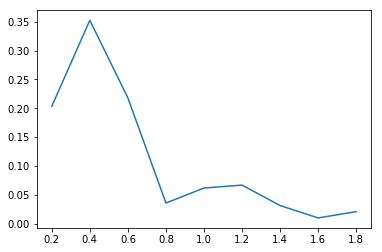

num18
[  1.11996963e-01   1.50383662e+00   4.51606660e-01   1.68504280e-01
   2.48911675e-02   2.12267927e-03   1.82269419e-04   2.27836773e-05
   1.51891182e-05]
[ 0.06123724  0.50309366  0.94495008  1.3868065   1.82866292  2.27051934
  2.71237576  3.15423218  3.5960886   4.03794502]
[ 0.04948658  0.71396644  0.91351174  0.98796644  0.99896477  0.99990268
  0.99998322  0.99999329  1.        ]


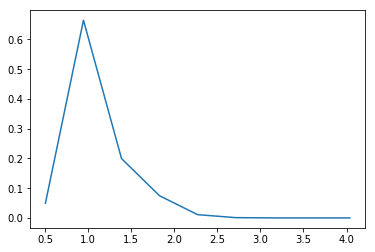

num19
[ 0.13097315  0.          0.          0.30719295  0.          0.
  0.95435235  0.          1.60748154]
[ 0.          0.33333333  0.66666667  1.          1.33333333  1.66666667
  2.          2.33333333  2.66666667  3.        ]
[ 0.04365772  0.04365772  0.04365772  0.14605537  0.14605537  0.14605537
  0.46417282  0.46417282  1.        ]


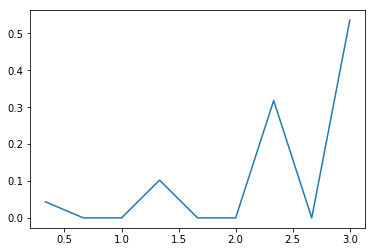

num20
[  7.77776344e-04   2.63715440e+00   4.73177091e+00   3.44140106e-01
   1.00851666e-02   1.49073799e-03   0.00000000e+00   0.00000000e+00
   4.92591684e-04]
[ 0.1         0.22943456  0.35886913  0.48830369  0.61773825  0.74717281
  0.87660738  1.00604194  1.1354765   1.26491106]
[  1.00671141e-04   3.41439597e-01   9.53894295e-01   9.98437919e-01
   9.99743289e-01   9.99936242e-01   9.99936242e-01   9.99936242e-01
   1.00000000e+00]


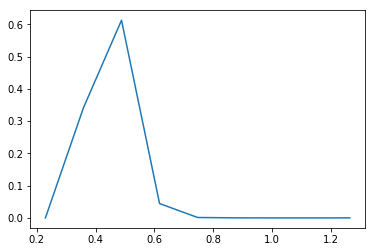

num21
[  4.62205815e-01   1.78143611e+00   2.84879902e-01   5.51630331e-02
   8.08558816e-03   1.47960171e-03   3.48141578e-04   3.48141578e-05
   2.17588487e-05]
[ 0.25061907  0.63617539  1.02173172  1.40728805  1.79284437  2.1784007
  2.56395702  2.94951335  3.33506968  3.720626  ]
[ 0.17820638  0.86505034  0.97488758  0.99615604  0.99927349  0.99984396
  0.99997819  0.99999161  1.        ]


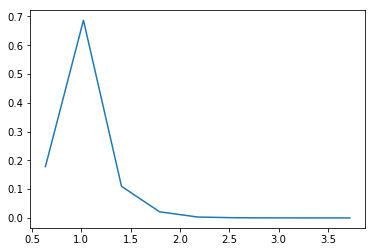

num22
[  2.26430562e-03   1.39584410e-02   1.52482353e-02   3.45842588e+00
   1.02410531e+01   2.74468236e+00   3.68422588e-01   2.36892227e-01
   1.66240159e-03]
[ 0.10954451  0.16808358  0.22662264  0.28516171  0.34370077  0.40223984
  0.46077891  0.51931797  0.57785704  0.6363961 ]
[  1.32550336e-04   9.49664430e-04   1.84228188e-03   2.04295302e-01
   8.03796980e-01   9.64468121e-01   9.86035235e-01   9.99902685e-01
   1.00000000e+00]


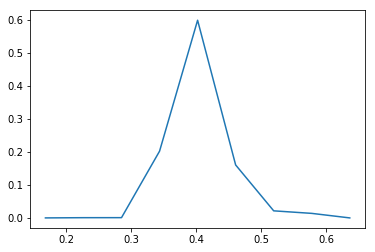

num23
[ 0.05734502  0.          0.0271167   0.02632164  0.09525352  0.1609971
  0.3195283   0.72976175  0.98902713]
[ 0.          0.41573971  0.83147942  1.24721913  1.66295884  2.07869855
  2.49443826  2.91017797  3.32591768  3.74165739]
[ 0.0238406   0.0238406   0.03511409  0.04605705  0.08565772  0.1525906
  0.28543121  0.58882215  1.        ]


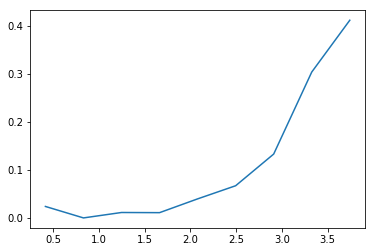

der1
[ 1.00446309  0.99966443  1.99724832  0.          0.99555369  2.00659396
  1.00062081  0.          1.9958557 ]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10044631  0.20041275  0.40013758  0.40013758  0.49969295  0.70035235
  0.80041443  0.80041443  1.        ]


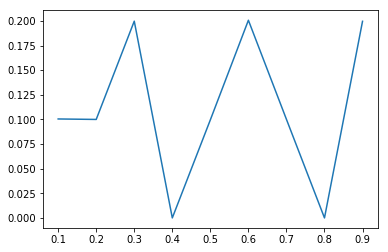

der2
[ 1.00177852  0.99781879  1.99901007  0.          1.00493289  2.00877517
  0.99964765  0.          1.98803691]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10017785  0.19995973  0.39986074  0.39986074  0.50035403  0.70123154
  0.80119631  0.80119631  1.        ]


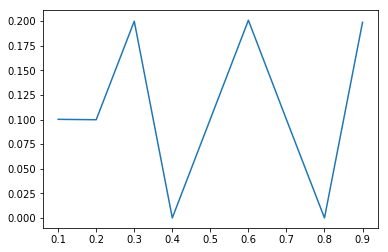

der3
[ 0.99666107  1.00894295  1.99874161  0.          0.99496644  2.005
  0.99758389  0.          1.99810403]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.09966611  0.2005604   0.40043456  0.40043456  0.49993121  0.70043121
  0.8001896   0.8001896   1.        ]


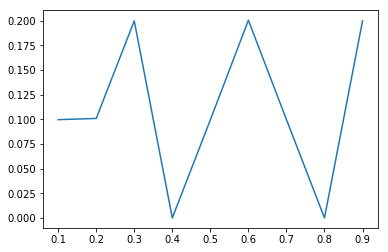

der4
[ 0.07228691  0.32664262  0.          0.58660369  0.          0.53074027
  0.          0.24079228  0.04293423]
[ 0.          0.55555556  1.11111111  1.66666667  2.22222222  2.77777778
  3.33333333  3.88888889  4.44444444  5.        ]
[ 0.0401594   0.22162752  0.22162752  0.54751846  0.54751846  0.84237416
  0.84237416  0.97614765  1.        ]


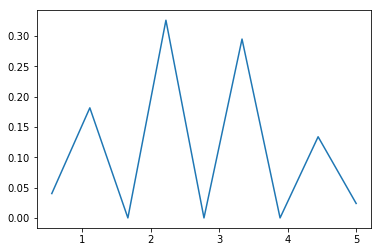

der5
[ 0.15430117  0.43060822  0.          0.49186661  0.30032215  0.
  0.10251091  0.01898406  0.00140688]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.10286745  0.3899396   0.3899396   0.71785067  0.91806544  0.91806544
  0.98640604  0.99906208  1.        ]


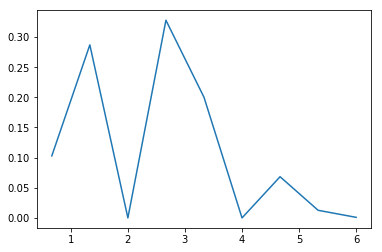

der6
[  1.05704698e-05   1.99328859e-04   1.81208054e-03   1.01431208e-02
   4.02372483e-02   1.11065436e-01   2.11320302e-01   2.64672483e-01
   2.60539430e-01]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[  1.17449664e-05   2.33221477e-04   2.24664430e-03   1.35167785e-02
   5.82248322e-02   1.81630872e-01   4.16431208e-01   7.10511745e-01
   1.00000000e+00]


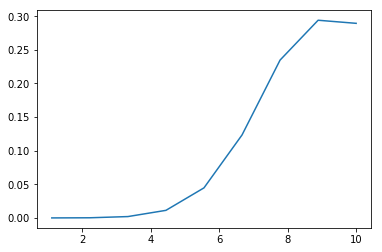

der7
[ 0.02568624  0.11643456  0.23373993  0.27285403  0.20502013  0.10366275
  0.03428356  0.00736074  0.00095805]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.02568624  0.14212081  0.37586074  0.64871477  0.8537349   0.95739765
  0.99168121  0.99904195  1.        ]


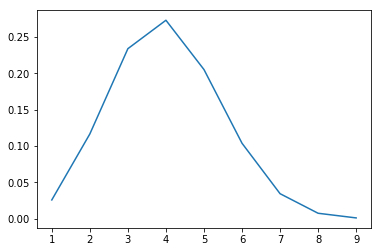

der8
[  1.52516779e-04   1.27147651e-03   6.75151007e-03   2.59716443e-02
   7.49340604e-02   1.55663758e-01   2.29471309e-01   2.28791779e-01
   1.76991946e-01]
[  2.           3.11111111   4.22222222   5.33333333   6.44444444
   7.55555556   8.66666667   9.77777778  10.88888889  12.        ]
[  1.69463087e-04   1.58221477e-03   9.08389262e-03   3.79412752e-02
   1.21201342e-01   2.94161074e-01   5.49129195e-01   8.03342282e-01
   1.00000000e+00]


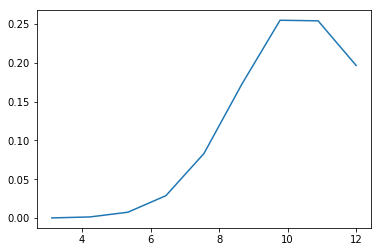

der9
[ 0.07450671  0.26219942  0.39428715  0.33013303  0.          0.16621956
  0.04962943  0.00816731  0.00057167]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.05794966  0.26188255  0.56855034  0.82532047  0.82532047  0.95460235
  0.99320302  0.99955537  1.        ]


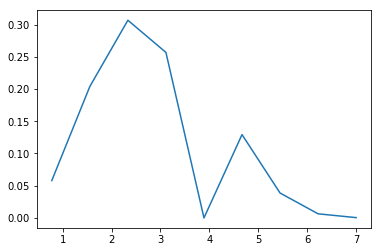

der10
[  3.51181208e-03   5.22344295e-02   1.35866779e-01   1.15905503e-01
   3.48499329e-02   1.54280537e-02   2.03496644e-03   1.61275168e-04
   7.24832215e-06]
[  0.           2.77777778   5.55555556   8.33333333  11.11111111
  13.88888889  16.66666667  19.44444444  22.22222222  25.        ]
[ 0.00975503  0.15485067  0.53225839  0.85421812  0.95102349  0.99387919
  0.99953188  0.99997987  1.        ]


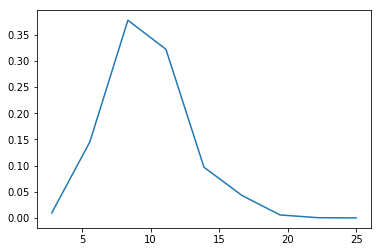

der11
[  4.36592194e-02   1.30036648e-01   1.55696662e-01   9.64893147e-02
   3.66580714e-02   9.15657012e-03   1.75565171e-03   2.05051219e-04
   2.70222536e-05]
[  0.           2.11111111   4.22222222   6.33333333   8.44444444
  10.55555556  12.66666667  14.77777778  16.88888889  19.        ]
[ 0.09216946  0.36669128  0.69538423  0.89908389  0.97647315  0.99580369
  0.99951007  0.99994295  1.        ]


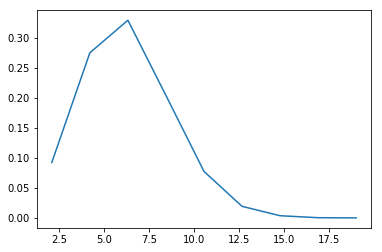

der12
[  5.20559396e-01   2.19741946e-01   1.06382718e-01   3.89808725e-02
   1.10234899e-02   2.60486577e-03   5.85906040e-04   9.96644295e-05
   2.11409396e-05]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[ 0.57839933  0.82255705  0.94076007  0.98407215  0.99632047  0.99921477
  0.99986577  0.99997651  1.        ]


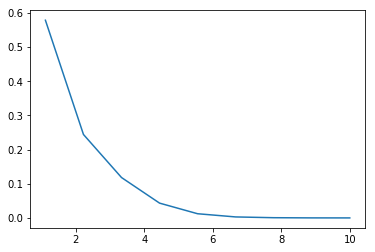

der13
[  1.51566598e-01   1.62077827e-01   2.65374548e-01   6.34588281e-02
   4.34295302e-02   4.51393908e-03   1.75632421e-03   1.02219928e-04
   2.78781621e-05]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.21892953  0.45304195  0.83636074  0.92802349  0.99075503  0.99727517
  0.99981208  0.99995973  1.        ]


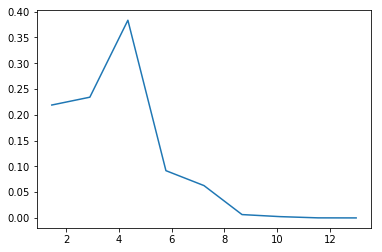

der14
[  7.65997957e-03   8.51040998e-02   1.10167275e-01   1.33256201e-01
   3.78521301e-02   1.53534432e-02   1.57834841e-03   3.17114094e-04
   1.57572221e-05]
[  0.           2.55555556   5.11111111   7.66666667  10.22222222
  12.77777778  15.33333333  17.88888889  20.44444444  23.        ]
[ 0.0195755   0.23706376  0.51860235  0.85914597  0.95587919  0.99511577
  0.99914933  0.99995973  1.        ]


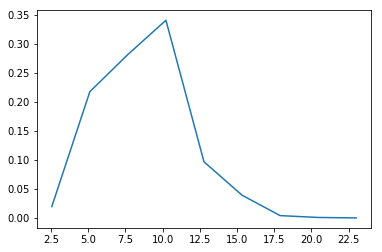

der15
[ 7.89813423  0.          0.          0.          0.          0.          0.
  0.          1.10186577]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87757047  0.87757047  0.87757047  0.87757047  0.87757047  0.87757047
  0.87757047  0.87757047  1.        ]


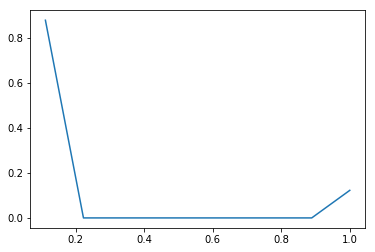

der16
[ 3.34988758  0.          0.          0.          0.          0.          0.
  0.          5.65011242]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.37220973  0.37220973  0.37220973  0.37220973  0.37220973  0.37220973
  0.37220973  0.37220973  1.        ]


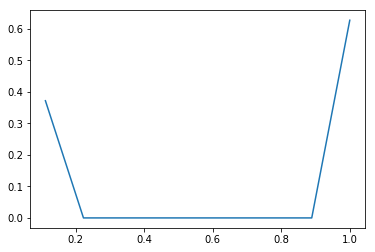

der17
[ 4.01236913  0.          0.          0.          0.          0.          0.
  0.          4.98763087]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.44581879  0.44581879  0.44581879  0.44581879  0.44581879  0.44581879
  0.44581879  0.44581879  1.        ]


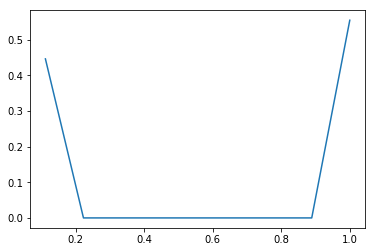

der18
[ 6.41493121  0.          0.          0.          0.          0.          0.
  0.          2.58506879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.71277013  0.71277013  0.71277013  0.71277013  0.71277013  0.71277013
  0.71277013  0.71277013  1.        ]


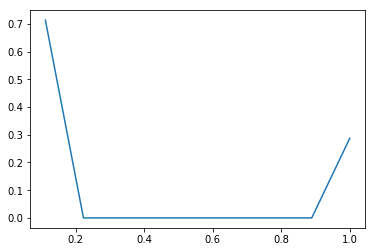

der19
[ 5.85918121  0.          0.          0.          0.          0.          0.
  0.          3.14081879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.65102013  0.65102013  0.65102013  0.65102013  0.65102013  0.65102013
  0.65102013  0.65102013  1.        ]


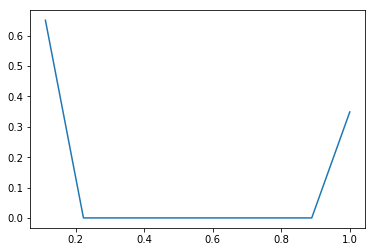

cat1
[ 2.17775336  0.          0.          0.62283221  0.          0.
  0.14207215  0.          0.05734228]
[ 1.          1.33333333  1.66666667  2.          2.33333333  2.66666667
  3.          3.33333333  3.66666667  4.        ]
[ 0.72591779  0.72591779  0.72591779  0.93352852  0.93352852  0.93352852
  0.98088591  0.98088591  1.        ]


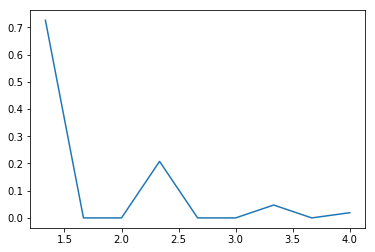

cat2
[ 5.24739262  0.          0.          0.          0.          0.          0.
  0.          3.75260738]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.58304362  0.58304362  0.58304362  0.58304362  0.58304362  0.58304362
  0.58304362  0.58304362  1.        ]


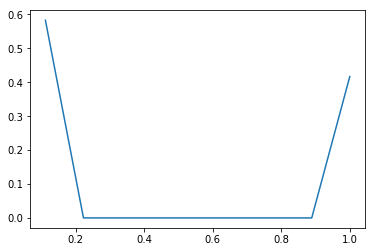

cat3
[ 1.34526342  0.02096728  0.          0.01053523  0.02074581  0.
  0.04623826  0.00415772  0.05209228]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.89684228  0.91082047  0.91082047  0.91784396  0.9316745   0.9316745
  0.9625      0.96527181  1.        ]


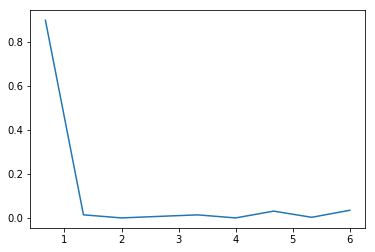

cat4
[ 0.00999939  0.00294326  0.00915101  0.03598627  0.11070439  0.24639353
  0.02074146  0.02793487  0.35432764]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.01222148  0.01581879  0.02700336  0.07098658  0.20629195  0.5074396
  0.53279027  0.56693289  1.        ]


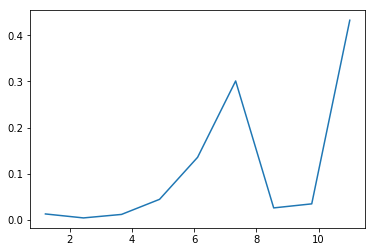

cat5
[ 1.53019631  0.          0.          0.          0.          0.          0.
  0.          7.46980369]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.17002181  0.17002181  0.17002181  0.17002181  0.17002181  0.17002181
  0.17002181  0.17002181  1.        ]


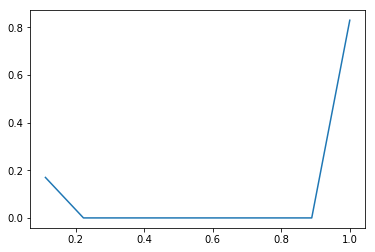

cat7
[  8.34305369e-01   5.39496644e-02   3.99395973e-02   1.07382550e-03
   3.85906040e-04   9.17785235e-04   2.61912752e-03   2.33221477e-04
   6.65755034e-02]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.83430537  0.88825503  0.92819463  0.92926846  0.92965436  0.93057215
  0.93319128  0.9334245   1.        ]


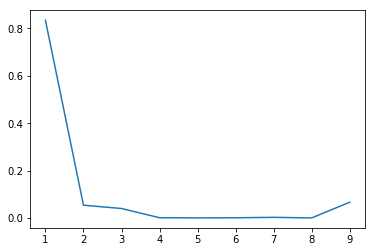

cat8
[ 2.35855872  0.          0.          0.          0.          0.          0.
  0.          6.64144128]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.26206208  0.26206208  0.26206208  0.26206208  0.26206208  0.26206208
  0.26206208  0.26206208  1.        ]


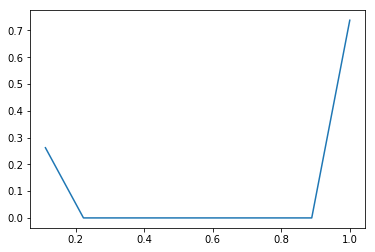

cat9
[ 0.20352685  0.01210008  0.02893999  0.03300296  0.01692252  0.14675987
  0.00767647  0.07201865  0.00846437]
[  0.           1.88888889   3.77777778   5.66666667   7.55555556
   9.44444444  11.33333333  13.22222222  15.11111111  17.        ]
[ 0.3844396   0.4072953   0.46195973  0.52429866  0.55626342  0.83347651
  0.84797651  0.98401174  1.        ]


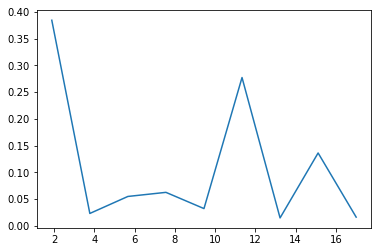

cat10
[ 0.46242785  0.          0.          0.          0.          0.          0.
  0.          8.53757215]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.05138087  0.05138087  0.05138087  0.05138087  0.05138087  0.05138087
  0.05138087  0.05138087  1.        ]


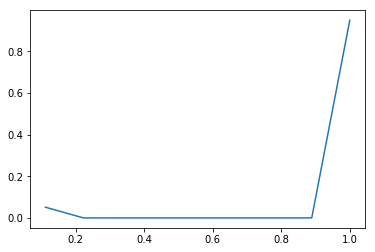

cat11
[ 1.51130537  0.          0.          0.          0.          0.          0.
  0.          7.48869463]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.16792282  0.16792282  0.16792282  0.16792282  0.16792282  0.16792282
  0.16792282  0.16792282  1.        ]


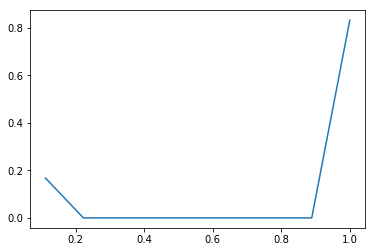

cat12
[ 0.73525923  0.          0.10993289  0.          1.33841779  0.          0.0557781
  0.          0.010612  ]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.32678188  0.32678188  0.37564094  0.37564094  0.97049329  0.97049329
  0.99528356  0.99528356  1.        ]


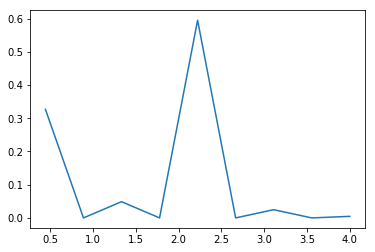

cat13
[  3.67172819e-02   0.00000000e+00   0.00000000e+00   0.00000000e+00
   4.46195386e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.32885906e-03]
[ 0.          0.22222222  0.44444444  0.66666667  0.88888889  1.11111111
  1.33333333  1.55555556  1.77777778  2.        ]
[ 0.0081594  0.0081594  0.0081594  0.0081594  0.9997047  0.9997047
  0.9997047  0.9997047  1.       ]


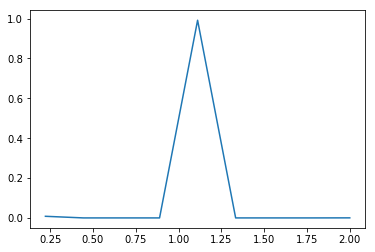

cat14
[ 0.00861647  0.00578971  0.00905043  0.00790982  0.00615521  0.01029235
  0.00628261  0.01103859  0.02224344]
[   1.           12.44444444   23.88888889   35.33333333   46.77777778
   58.22222222   69.66666667   81.11111111   92.55555556  104.        ]
[ 0.09861074  0.16487081  0.26844799  0.35897148  0.42941443  0.5472047
  0.6191057   0.74543624  1.        ]


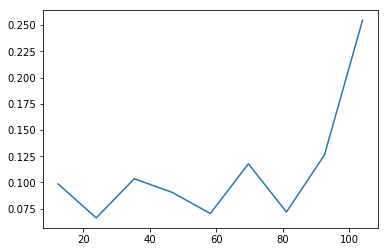

target
[ 8.67207383  0.          0.          0.          0.          0.          0.
  0.          0.32792617]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.96356376  0.96356376  0.96356376  0.96356376  0.96356376  0.96356376
  0.96356376  0.96356376  1.        ]


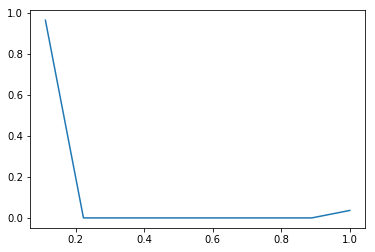

Approach number 3 mean median mode
num1
[ 0.40519847  0.3110652   0.17810594  0.11058437  0.          0.07242066
  0.13274569  0.03819823  0.03739573]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.31515436  0.55709396  0.69562081  0.78163087  0.78163087  0.83795805
  0.9412047   0.97091443  1.        ]


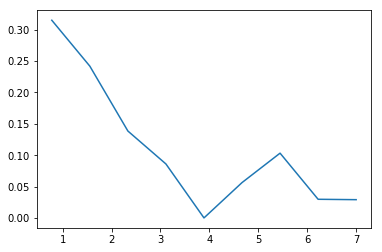

num2
[ 0.11478981  0.13208832  0.11269219  0.09240787  0.16936638  0.07197254
  0.05453264  0.03496492  0.03536714]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.14029866  0.30173993  0.43947483  0.55241779  0.75942114  0.84738758
  0.91403859  0.95677349  1.        ]


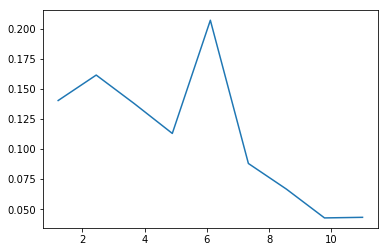

num3
[ 5.4563104  0.         0.         0.         0.         0.         0.         0.
  3.5436896]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.60625671  0.60625671  0.60625671  0.60625671  0.60625671  0.60625671
  0.60625671  0.60625671  1.        ]


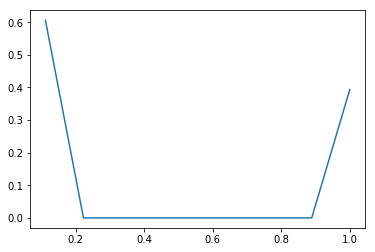

num4
[ 6.68686409  0.          0.          0.          0.          0.          0.
  0.          2.31313591]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.7429849  0.7429849  0.7429849  0.7429849  0.7429849  0.7429849
  0.7429849  0.7429849  1.       ]


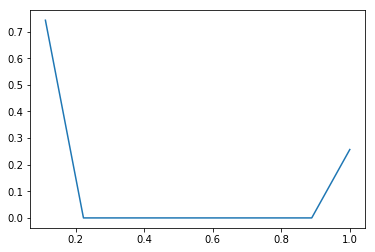

num5
[ 7.52460403  0.          0.          0.          0.          0.          0.
  0.          1.47539597]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.83606711  0.83606711  0.83606711  0.83606711  0.83606711  0.83606711
  0.83606711  0.83606711  1.        ]


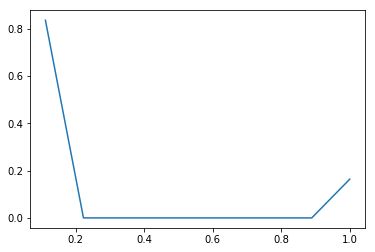

num6
[ 7.33222148  0.          0.          0.          0.          0.          0.
  0.          1.66777852]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.81469128  0.81469128  0.81469128  0.81469128  0.81469128  0.81469128
  0.81469128  0.81469128  1.        ]


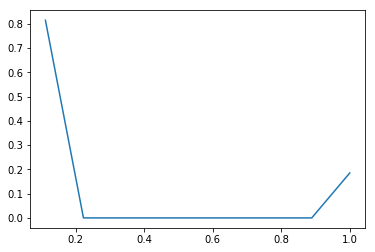

num7
[  8.99663255e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.36744966e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99962584  0.99962584  0.99962584  0.99962584  0.99962584  0.99962584
  0.99962584  0.99962584  1.        ]


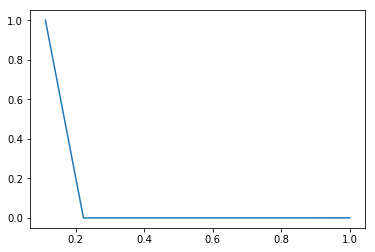

num8
[ 8.98476342  0.          0.          0.          0.          0.          0.
  0.          0.01523658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99830705  0.99830705  0.99830705  0.99830705  0.99830705  0.99830705
  0.99830705  0.99830705  1.        ]


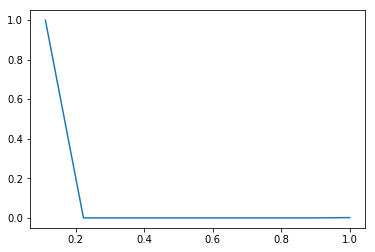

num9
[ 8.91508893  0.          0.          0.          0.          0.          0.
  0.          0.08491107]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99056544  0.99056544  0.99056544  0.99056544  0.99056544  0.99056544
  0.99056544  0.99056544  1.        ]


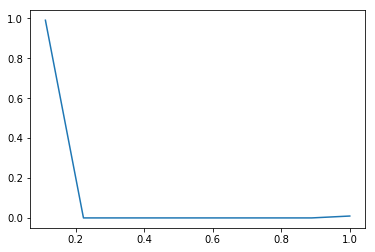

num10
[  8.99146812e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   8.53187919e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99905201  0.99905201  0.99905201  0.99905201  0.99905201  0.99905201
  0.99905201  0.99905201  1.        ]


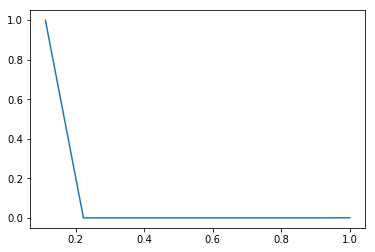

num11
[  2.22589178e+00   0.00000000e+00   2.07596477e-02   0.00000000e+00
   2.81250000e-03   0.00000000e+00   5.17197987e-04   0.00000000e+00
   1.88758389e-05]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.98928523  0.98928523  0.99851174  0.99851174  0.99976174  0.99976174
  0.99999161  0.99999161  1.        ]


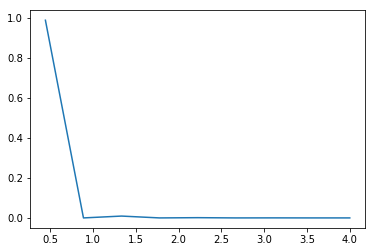

num12
[ 0.05052685  0.02172754  0.08610983  0.04949187  0.14395818  0.06931324
  0.11611371  0.06189068  0.09317579]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.07298322  0.10436745  0.22874832  0.30023658  0.50817617  0.6082953
  0.7760151   0.86541275  1.        ]


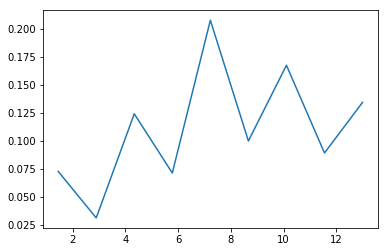

num13
[ 3.05244966  0.          0.          0.          0.          0.          0.
  0.          5.94755034]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.33916107  0.33916107  0.33916107  0.33916107  0.33916107  0.33916107
  0.33916107  0.33916107  1.        ]


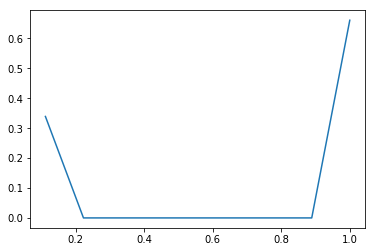

num14
[ 7.91039597  0.          0.          0.          0.          0.          0.
  0.          1.08960403]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87893289  0.87893289  0.87893289  0.87893289  0.87893289  0.87893289
  0.87893289  0.87893289  1.        ]


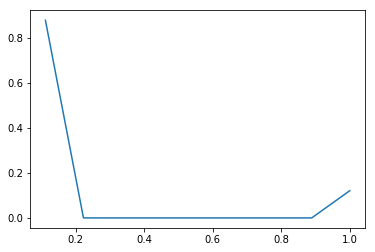

num15
[ 7.61901342  0.          0.          0.          0.          0.          0.
  0.          1.38098658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.84655705  0.84655705  0.84655705  0.84655705  0.84655705  0.84655705
  0.84655705  0.84655705  1.        ]


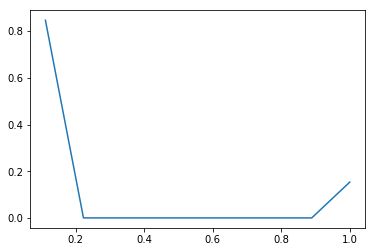

num16
[ 0.3642953   0.72557047  1.09874161  0.          0.9002349   1.48822148
  1.14088926  0.          4.28204698]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.03642953  0.10898658  0.21886074  0.21886074  0.30888423  0.45770638
  0.5717953   0.5717953   1.        ]


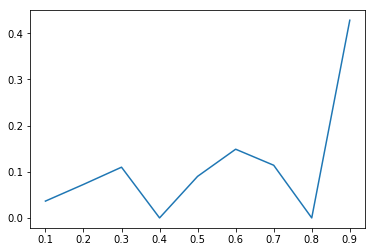

num17
[ 1.01735738  1.76348154  1.08987416  0.17823826  0.30828859  0.33372483
  0.1565604   0.04907718  0.10339765]
[ 0.   0.2  0.4  0.6  0.8  1.   1.2  1.4  1.6  1.8]
[ 0.20347148  0.55616779  0.77414262  0.80979027  0.87144799  0.93819295
  0.96950503  0.97932047  1.        ]


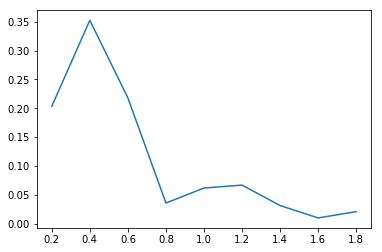

num18
[  1.11996963e-01   1.50383662e+00   4.51606660e-01   1.68504280e-01
   2.48911675e-02   2.12267927e-03   1.82269419e-04   2.27836773e-05
   1.51891182e-05]
[ 0.06123724  0.50309366  0.94495008  1.3868065   1.82866292  2.27051934
  2.71237576  3.15423218  3.5960886   4.03794502]
[ 0.04948658  0.71396644  0.91351174  0.98796644  0.99896477  0.99990268
  0.99998322  0.99999329  1.        ]


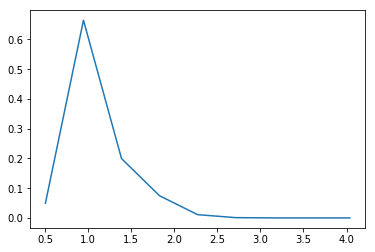

num19
[  1.30973154e-01   0.00000000e+00   0.00000000e+00   3.07192953e-01
   0.00000000e+00   0.00000000e+00   9.54352349e-01   2.51677852e-05
   1.60745638e+00]
[ 0.          0.33333333  0.66666667  1.          1.33333333  1.66666667
  2.          2.33333333  2.66666667  3.        ]
[ 0.04365772  0.04365772  0.04365772  0.14605537  0.14605537  0.14605537
  0.46417282  0.46418121  1.        ]


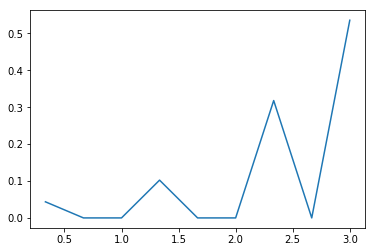

num20
[  7.77776344e-04   2.63714143e+00   4.73178387e+00   3.44140106e-01
   1.00851666e-02   1.49073799e-03   0.00000000e+00   0.00000000e+00
   4.92591684e-04]
[ 0.1         0.22943456  0.35886913  0.48830369  0.61773825  0.74717281
  0.87660738  1.00604194  1.1354765   1.26491106]
[  1.00671141e-04   3.41437919e-01   9.53894295e-01   9.98437919e-01
   9.99743289e-01   9.99936242e-01   9.99936242e-01   9.99936242e-01
   1.00000000e+00]


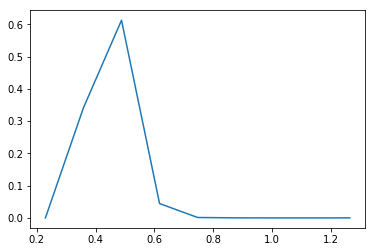

num21
[  4.62205815e-01   1.78143611e+00   2.84879902e-01   5.51630331e-02
   8.08558816e-03   1.47960171e-03   3.48141578e-04   3.48141578e-05
   2.17588487e-05]
[ 0.25061907  0.63617539  1.02173172  1.40728805  1.79284437  2.1784007
  2.56395702  2.94951335  3.33506968  3.720626  ]
[ 0.17820638  0.86505034  0.97488758  0.99615604  0.99927349  0.99984396
  0.99997819  0.99999161  1.        ]


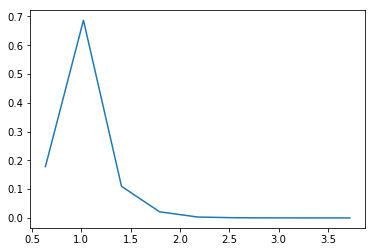

num22
[  2.26430562e-03   1.39584410e-02   1.52482353e-02   3.45842588e+00
   1.02410531e+01   2.74468236e+00   3.68422588e-01   2.36892227e-01
   1.66240159e-03]
[ 0.10954451  0.16808358  0.22662264  0.28516171  0.34370077  0.40223984
  0.46077891  0.51931797  0.57785704  0.6363961 ]
[  1.32550336e-04   9.49664430e-04   1.84228188e-03   2.04295302e-01
   8.03796980e-01   9.64468121e-01   9.86035235e-01   9.99902685e-01
   1.00000000e+00]


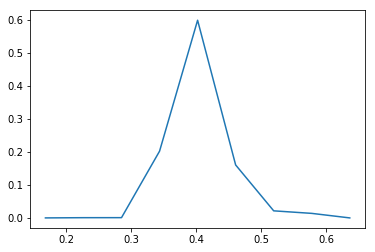

num23
[ 0.05734502  0.          0.0271167   0.02632164  0.09525352  0.1609971
  0.3195283   0.72976175  0.98902713]
[ 0.          0.41573971  0.83147942  1.24721913  1.66295884  2.07869855
  2.49443826  2.91017797  3.32591768  3.74165739]
[ 0.0238406   0.0238406   0.03511409  0.04605705  0.08565772  0.1525906
  0.28543121  0.58882215  1.        ]


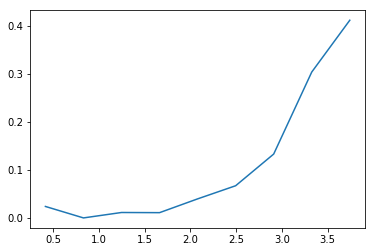

der1
[ 1.00446309  0.99966443  1.99724832  0.          0.99555369  2.00659396
  1.00062081  0.          1.9958557 ]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10044631  0.20041275  0.40013758  0.40013758  0.49969295  0.70035235
  0.80041443  0.80041443  1.        ]


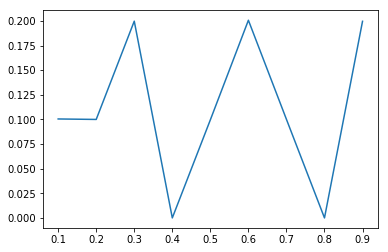

der2
[ 1.00177852  0.99781879  1.99901007  0.          1.00493289  2.00877517
  0.99964765  0.          1.98803691]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10017785  0.19995973  0.39986074  0.39986074  0.50035403  0.70123154
  0.80119631  0.80119631  1.        ]


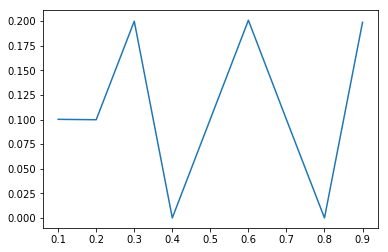

der3
[ 0.99666107  1.00894295  1.99874161  0.          0.99496644  2.005
  0.99758389  0.          1.99810403]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.09966611  0.2005604   0.40043456  0.40043456  0.49993121  0.70043121
  0.8001896   0.8001896   1.        ]


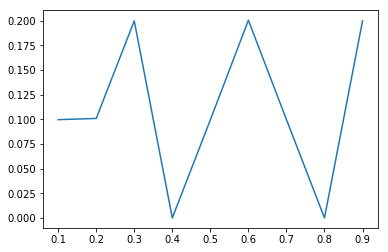

der4
[ 0.07228691  0.32664262  0.          0.58660369  0.          0.53074027
  0.          0.24079228  0.04293423]
[ 0.          0.55555556  1.11111111  1.66666667  2.22222222  2.77777778
  3.33333333  3.88888889  4.44444444  5.        ]
[ 0.0401594   0.22162752  0.22162752  0.54751846  0.54751846  0.84237416
  0.84237416  0.97614765  1.        ]


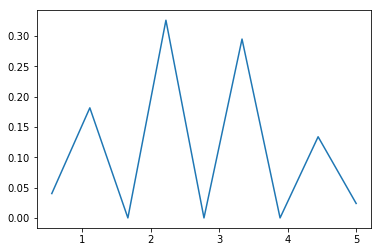

der5
[ 0.15430117  0.43060822  0.          0.49186661  0.30032215  0.
  0.10251091  0.01898406  0.00140688]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.10286745  0.3899396   0.3899396   0.71785067  0.91806544  0.91806544
  0.98640604  0.99906208  1.        ]


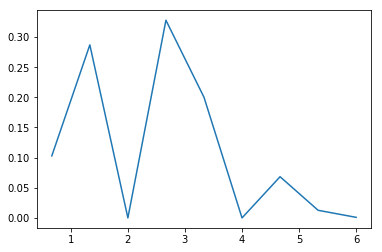

der6
[  1.05704698e-05   1.99328859e-04   1.81208054e-03   1.01431208e-02
   4.02372483e-02   1.11065436e-01   2.11320302e-01   2.64672483e-01
   2.60539430e-01]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[  1.17449664e-05   2.33221477e-04   2.24664430e-03   1.35167785e-02
   5.82248322e-02   1.81630872e-01   4.16431208e-01   7.10511745e-01
   1.00000000e+00]


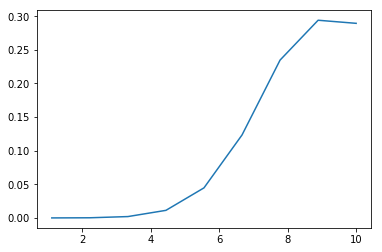

der7
[ 0.02568624  0.11643456  0.23373993  0.27285403  0.20502013  0.10366275
  0.03428356  0.00736074  0.00095805]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.02568624  0.14212081  0.37586074  0.64871477  0.8537349   0.95739765
  0.99168121  0.99904195  1.        ]


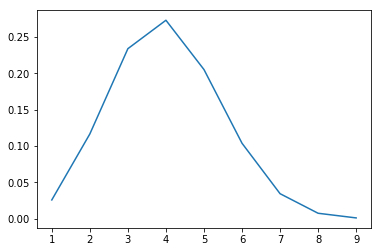

der8
[  1.52516779e-04   1.27147651e-03   6.75151007e-03   2.59716443e-02
   7.49340604e-02   1.55663758e-01   2.29471309e-01   2.28791779e-01
   1.76991946e-01]
[  2.           3.11111111   4.22222222   5.33333333   6.44444444
   7.55555556   8.66666667   9.77777778  10.88888889  12.        ]
[  1.69463087e-04   1.58221477e-03   9.08389262e-03   3.79412752e-02
   1.21201342e-01   2.94161074e-01   5.49129195e-01   8.03342282e-01
   1.00000000e+00]


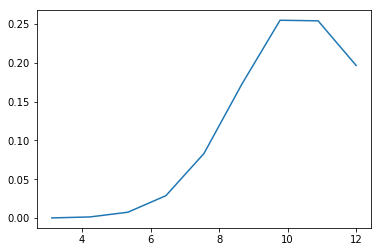

der9
[ 0.07450671  0.26219942  0.39428715  0.33013303  0.          0.16621956
  0.04962943  0.00816731  0.00057167]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.05794966  0.26188255  0.56855034  0.82532047  0.82532047  0.95460235
  0.99320302  0.99955537  1.        ]


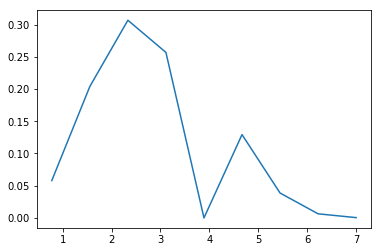

der10
[  3.51181208e-03   5.22344295e-02   1.35866779e-01   1.15905503e-01
   3.48499329e-02   1.54280537e-02   2.03496644e-03   1.61275168e-04
   7.24832215e-06]
[  0.           2.77777778   5.55555556   8.33333333  11.11111111
  13.88888889  16.66666667  19.44444444  22.22222222  25.        ]
[ 0.00975503  0.15485067  0.53225839  0.85421812  0.95102349  0.99387919
  0.99953188  0.99997987  1.        ]


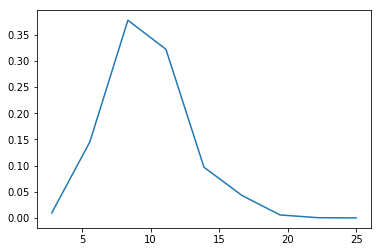

der11
[  4.36592194e-02   1.30036648e-01   1.55696662e-01   9.64893147e-02
   3.66580714e-02   9.15657012e-03   1.75565171e-03   2.05051219e-04
   2.70222536e-05]
[  0.           2.11111111   4.22222222   6.33333333   8.44444444
  10.55555556  12.66666667  14.77777778  16.88888889  19.        ]
[ 0.09216946  0.36669128  0.69538423  0.89908389  0.97647315  0.99580369
  0.99951007  0.99994295  1.        ]


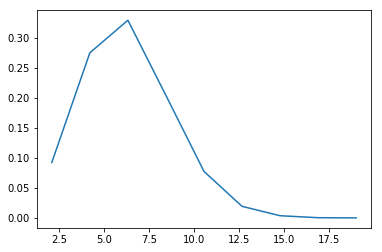

der12
[  5.20559396e-01   2.19741946e-01   1.06382718e-01   3.89808725e-02
   1.10234899e-02   2.60486577e-03   5.85906040e-04   9.96644295e-05
   2.11409396e-05]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[ 0.57839933  0.82255705  0.94076007  0.98407215  0.99632047  0.99921477
  0.99986577  0.99997651  1.        ]


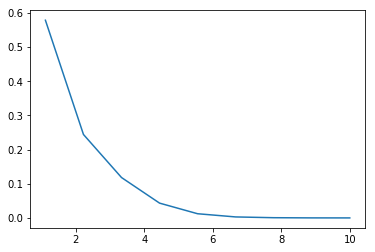

der13
[  1.51566598e-01   1.62077827e-01   2.65374548e-01   6.34588281e-02
   4.34295302e-02   4.51393908e-03   1.75632421e-03   1.02219928e-04
   2.78781621e-05]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.21892953  0.45304195  0.83636074  0.92802349  0.99075503  0.99727517
  0.99981208  0.99995973  1.        ]


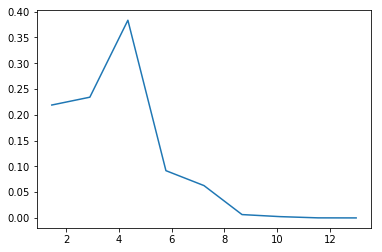

der14
[  7.65997957e-03   8.51040998e-02   1.10167275e-01   1.33256201e-01
   3.78521301e-02   1.53534432e-02   1.57834841e-03   3.17114094e-04
   1.57572221e-05]
[  0.           2.55555556   5.11111111   7.66666667  10.22222222
  12.77777778  15.33333333  17.88888889  20.44444444  23.        ]
[ 0.0195755   0.23706376  0.51860235  0.85914597  0.95587919  0.99511577
  0.99914933  0.99995973  1.        ]


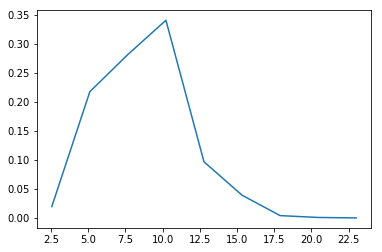

der15
[ 7.89813423  0.          0.          0.          0.          0.          0.
  0.          1.10186577]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87757047  0.87757047  0.87757047  0.87757047  0.87757047  0.87757047
  0.87757047  0.87757047  1.        ]


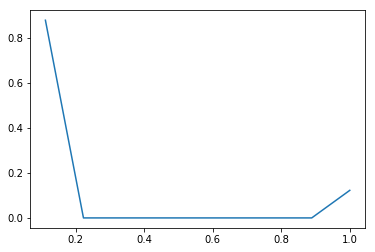

der16
[ 3.34988758  0.          0.          0.          0.          0.          0.
  0.          5.65011242]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.37220973  0.37220973  0.37220973  0.37220973  0.37220973  0.37220973
  0.37220973  0.37220973  1.        ]


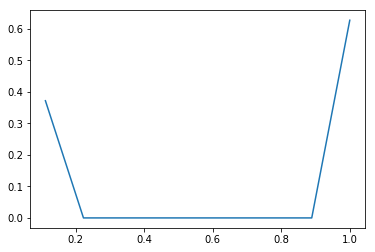

der17
[ 4.01236913  0.          0.          0.          0.          0.          0.
  0.          4.98763087]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.44581879  0.44581879  0.44581879  0.44581879  0.44581879  0.44581879
  0.44581879  0.44581879  1.        ]


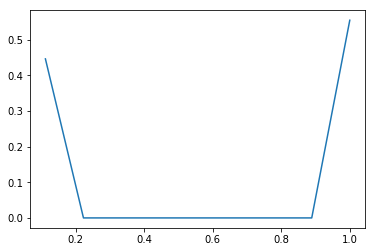

der18
[ 6.41493121  0.          0.          0.          0.          0.          0.
  0.          2.58506879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.71277013  0.71277013  0.71277013  0.71277013  0.71277013  0.71277013
  0.71277013  0.71277013  1.        ]


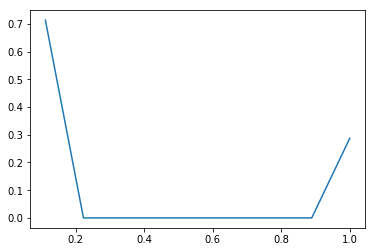

der19
[ 5.85918121  0.          0.          0.          0.          0.          0.
  0.          3.14081879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.65102013  0.65102013  0.65102013  0.65102013  0.65102013  0.65102013
  0.65102013  0.65102013  1.        ]


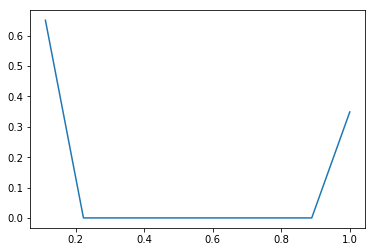

cat1
[  2.17666107e+00   1.09228188e-03   0.00000000e+00   6.22832215e-01
   0.00000000e+00   0.00000000e+00   1.42072148e-01   0.00000000e+00
   5.73422819e-02]
[ 1.          1.33333333  1.66666667  2.          2.33333333  2.66666667
  3.          3.33333333  3.66666667  4.        ]
[ 0.72555369  0.72591779  0.72591779  0.93352852  0.93352852  0.93352852
  0.98088591  0.98088591  1.        ]


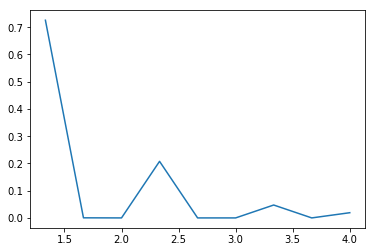

cat2
[  5.24613926e+00   0.00000000e+00   0.00000000e+00   1.25335570e-03
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.75260738e+00]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.58290436  0.58290436  0.58290436  0.58304362  0.58304362  0.58304362
  0.58304362  0.58304362  1.        ]


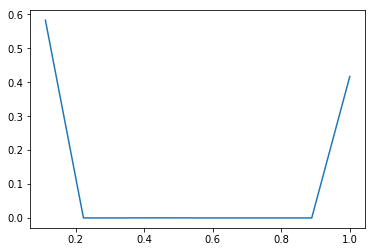

cat3
[ 1.34526342  0.02096728  0.          0.01053523  0.02074581  0.
  0.04623826  0.00415772  0.05209228]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.89684228  0.91082047  0.91082047  0.91784396  0.9316745   0.9316745
  0.9625      0.96527181  1.        ]


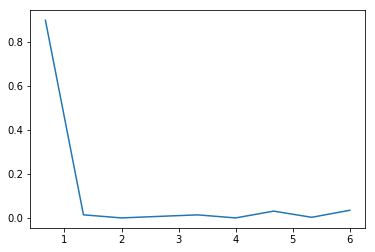

cat4
[ 0.00999939  0.00294326  0.00915101  0.03598627  0.11070439  0.24639353
  0.02088835  0.02793487  0.35418075]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.01222148  0.01581879  0.02700336  0.07098658  0.20629195  0.5074396
  0.5329698   0.56711242  1.        ]


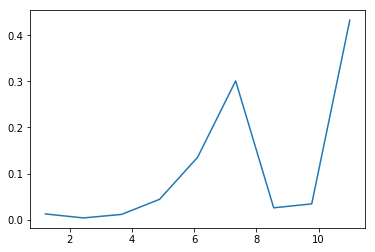

cat5
[  1.53019631e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   7.55033557e-05
   7.46972819e+00]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.17002181  0.17002181  0.17002181  0.17002181  0.17002181  0.17002181
  0.17002181  0.1700302   1.        ]


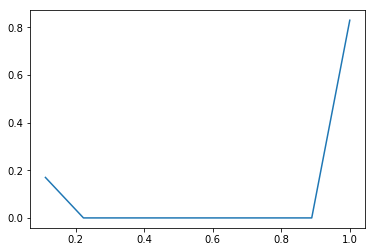

cat7
[  8.34305369e-01   5.39496644e-02   3.99395973e-02   1.07382550e-03
   3.85906040e-04   9.17785235e-04   2.61912752e-03   2.33221477e-04
   6.65755034e-02]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.83430537  0.88825503  0.92819463  0.92926846  0.92965436  0.93057215
  0.93319128  0.9334245   1.        ]


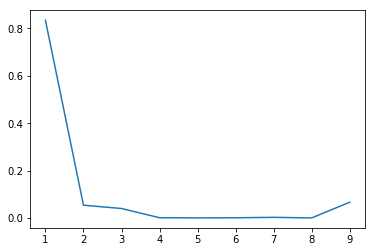

cat8
[ 2.35855872  0.          0.          0.          4.03079195  0.          0.
  0.          2.61064933]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.26206208  0.26206208  0.26206208  0.26206208  0.70992785  0.70992785
  0.70992785  0.70992785  1.        ]


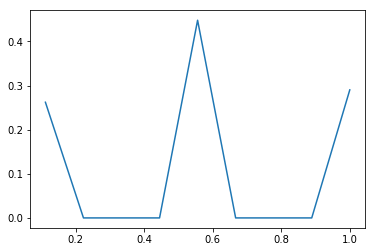

cat9
[ 0.20352685  0.01210008  0.02893999  0.03300296  0.01692252  0.14675987
  0.00767647  0.07201865  0.00846437]
[  0.           1.88888889   3.77777778   5.66666667   7.55555556
   9.44444444  11.33333333  13.22222222  15.11111111  17.        ]
[ 0.3844396   0.4072953   0.46195973  0.52429866  0.55626342  0.83347651
  0.84797651  0.98401174  1.        ]


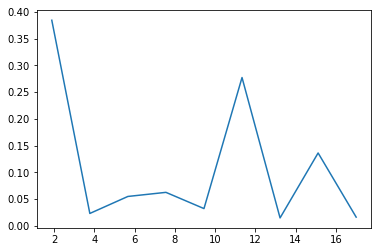

cat10
[ 0.46242785  0.          0.          0.          0.          0.          0.
  0.          8.53757215]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.05138087  0.05138087  0.05138087  0.05138087  0.05138087  0.05138087
  0.05138087  0.05138087  1.        ]


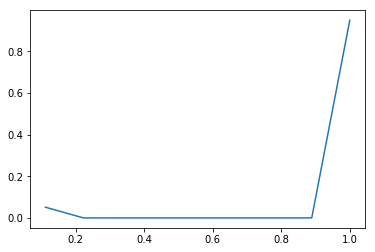

cat11
[ 1.51130537  0.          0.          0.          0.          0.          0.
  0.          7.48869463]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.16792282  0.16792282  0.16792282  0.16792282  0.16792282  0.16792282
  0.16792282  0.16792282  1.        ]


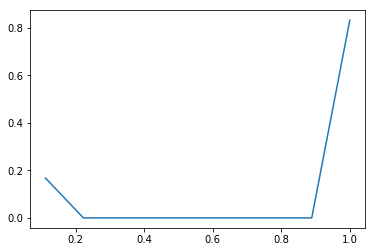

cat12
[ 0.73525923  0.          0.11208473  0.          1.33626594  0.          0.0557781
  0.          0.010612  ]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.32678188  0.32678188  0.37659732  0.37659732  0.97049329  0.97049329
  0.99528356  0.99528356  1.        ]


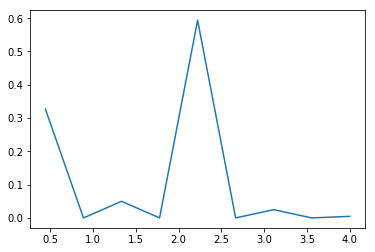

cat13
[  3.67172819e-02   0.00000000e+00   0.00000000e+00   0.00000000e+00
   4.46195386e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.32885906e-03]
[ 0.          0.22222222  0.44444444  0.66666667  0.88888889  1.11111111
  1.33333333  1.55555556  1.77777778  2.        ]
[ 0.0081594  0.0081594  0.0081594  0.0081594  0.9997047  0.9997047
  0.9997047  0.9997047  1.       ]


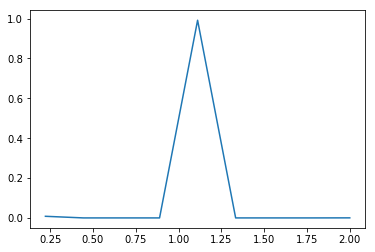

cat14
[ 0.00861647  0.00578971  0.00905043  0.00790982  0.00615521  0.01029235
  0.00628261  0.01103859  0.02224344]
[   1.           12.44444444   23.88888889   35.33333333   46.77777778
   58.22222222   69.66666667   81.11111111   92.55555556  104.        ]
[ 0.09861074  0.16487081  0.26844799  0.35897148  0.42941443  0.5472047
  0.6191057   0.74543624  1.        ]


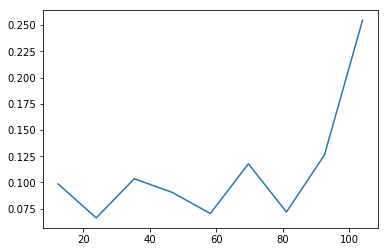

num1_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


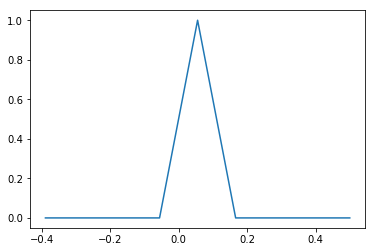

num2_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


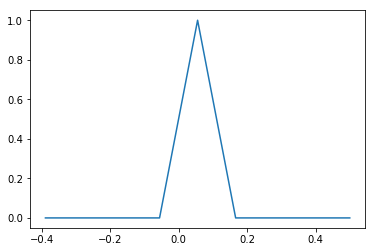

num3_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


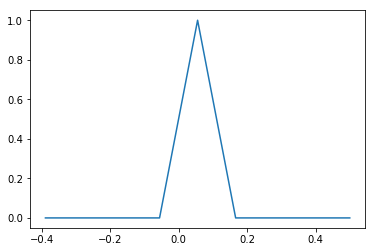

num4_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


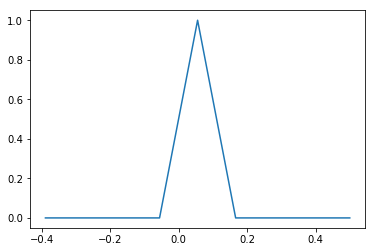

num5_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


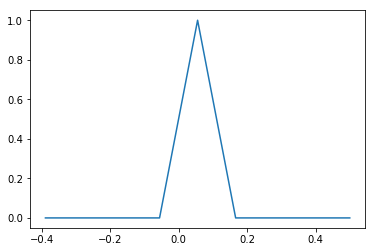

num6_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


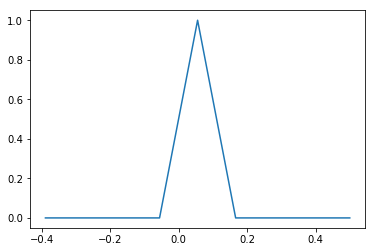

num7_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


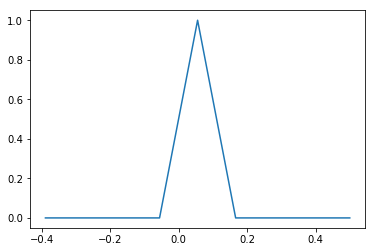

num8_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


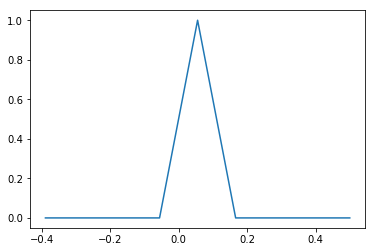

num9_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


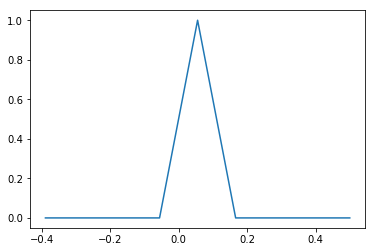

num10_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


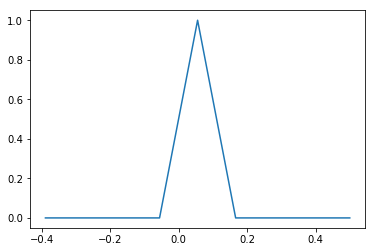

num11_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


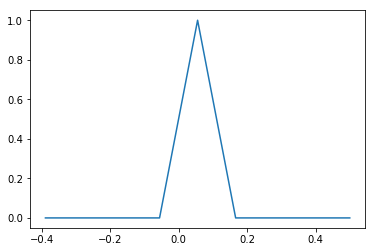

num12_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


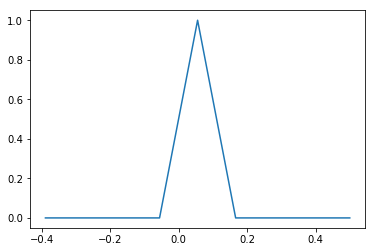

num13_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


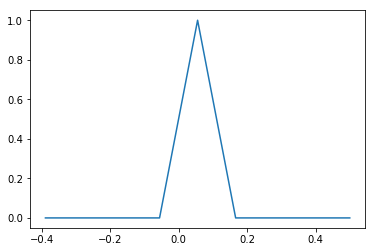

num14_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


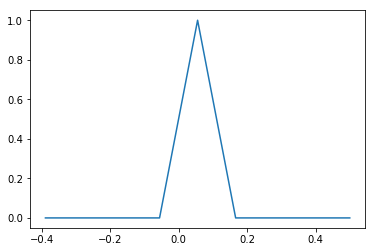

num15_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


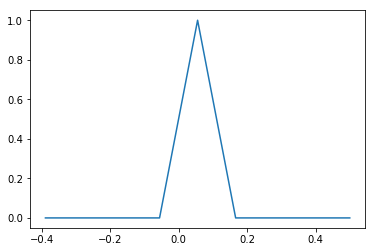

num16_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


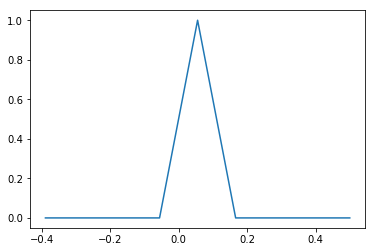

num17_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


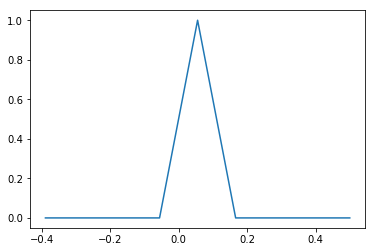

num18_
[ 7.37050168  0.          0.          0.          0.          0.          0.
  0.          1.62949832]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.81894463  0.81894463  0.81894463  0.81894463  0.81894463  0.81894463
  0.81894463  0.81894463  1.        ]


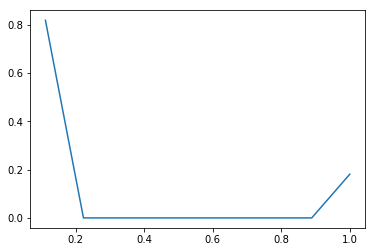

num19_
[  8.99992450e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   7.55033557e-05]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99999161  0.99999161  0.99999161  0.99999161  0.99999161  0.99999161
  0.99999161  0.99999161  1.        ]


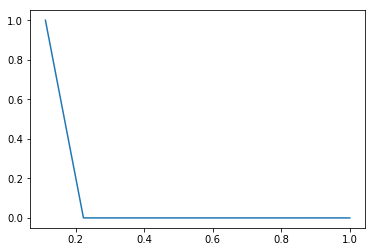

num20_
[  8.99998490e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.51006711e-05]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99999832  0.99999832  0.99999832  0.99999832  0.99999832  0.99999832
  0.99999832  0.99999832  1.        ]


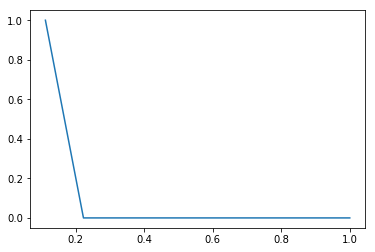

num21_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


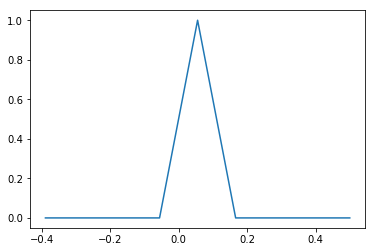

num22_
[ 8.35569966  0.          0.          0.          0.          0.          0.
  0.          0.64430034]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.92841107  0.92841107  0.92841107  0.92841107  0.92841107  0.92841107
  0.92841107  0.92841107  1.        ]


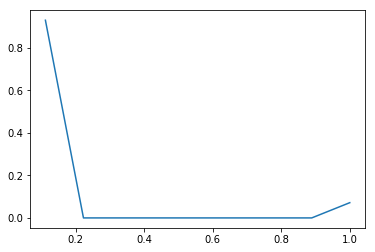

num23_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


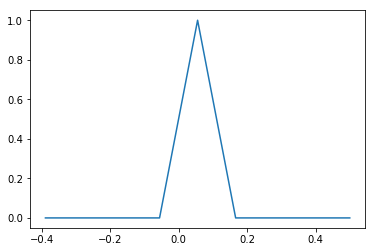

der1_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


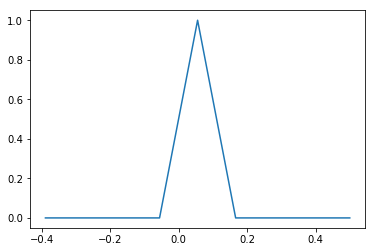

der2_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


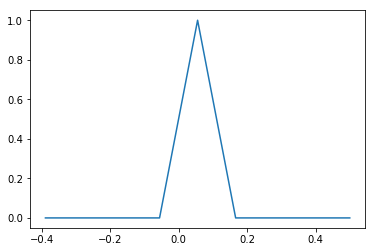

der3_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


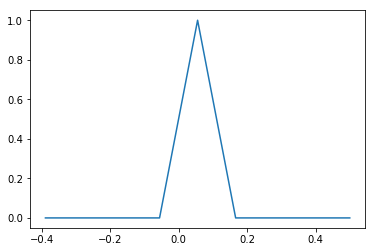

der4_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


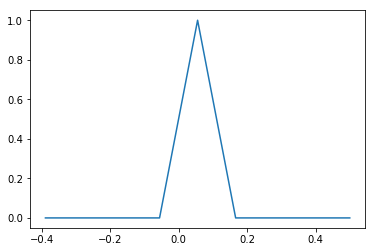

der5_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


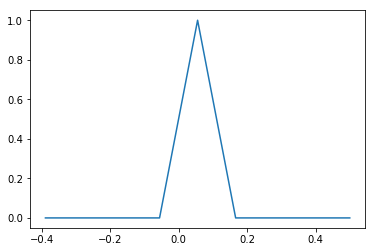

der6_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


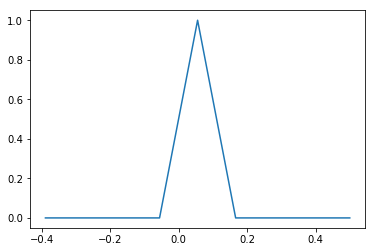

der7_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


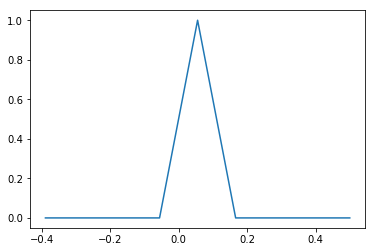

der8_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


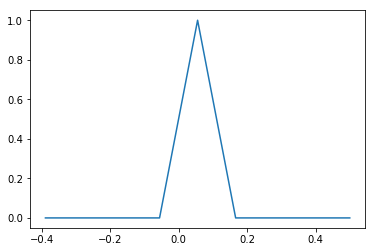

der9_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


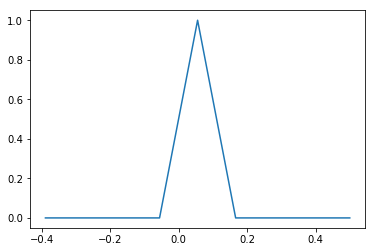

der10_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


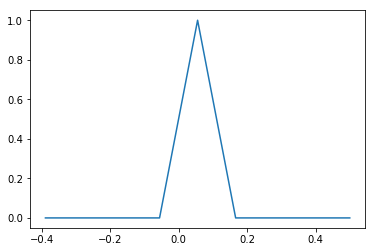

der11_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


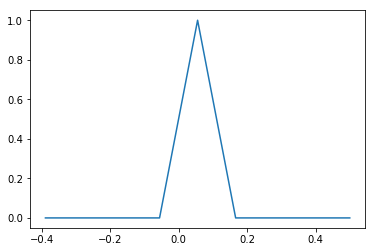

der12_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


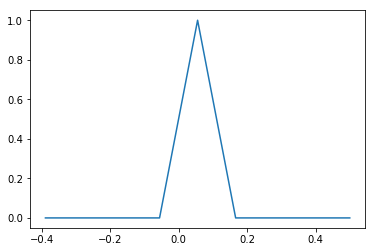

der13_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


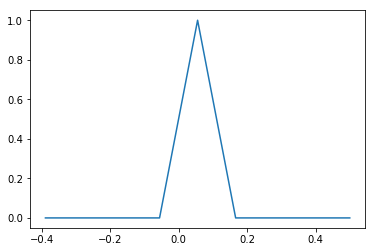

der14_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


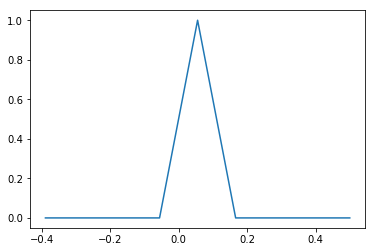

der15_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


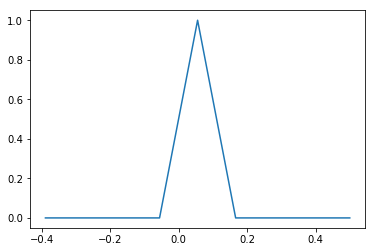

der16_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


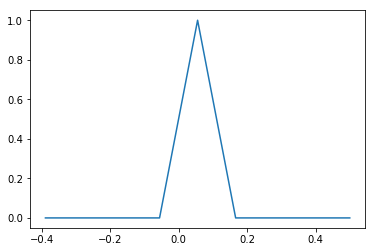

der17_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


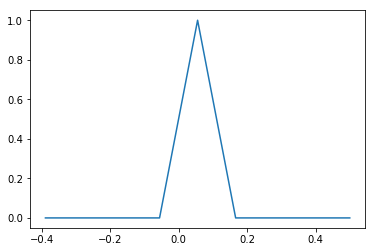

der18_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


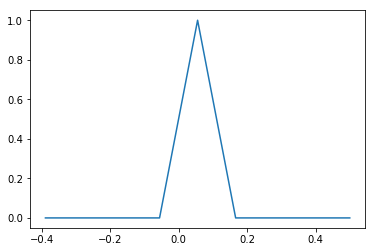

der19_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


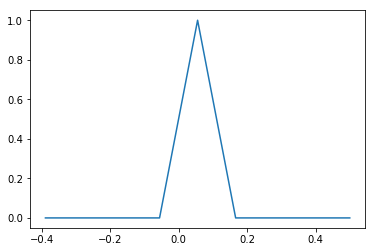

cat1_
[  8.99672315e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.27684564e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99963591  0.99963591  0.99963591  0.99963591  0.99963591  0.99963591
  0.99963591  0.99963591  1.        ]


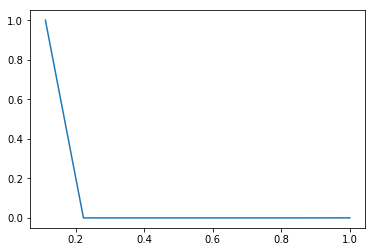

cat2_
[  8.99874664e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.25335570e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99986074  0.99986074  0.99986074  0.99986074  0.99986074  0.99986074
  0.99986074  0.99986074  1.        ]


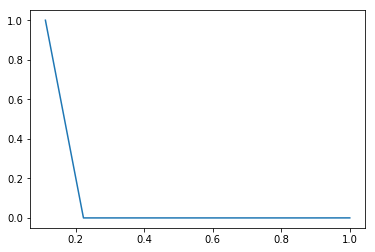

cat3_
[ 8.9122047  0.         0.         0.         0.         0.         0.         0.
  0.0877953]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99024497  0.99024497  0.99024497  0.99024497  0.99024497  0.99024497
  0.99024497  0.99024497  1.        ]


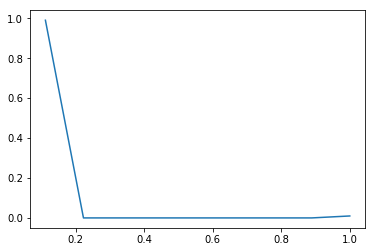

cat4_
[  8.99838423e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.61577181e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99982047  0.99982047  0.99982047  0.99982047  0.99982047  0.99982047
  0.99982047  0.99982047  1.        ]


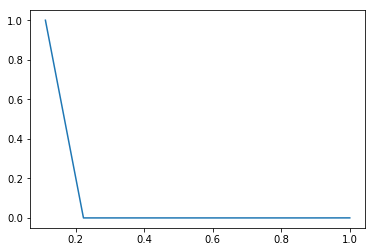

cat5_
[  8.99992450e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   7.55033557e-05]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99999161  0.99999161  0.99999161  0.99999161  0.99999161  0.99999161
  0.99999161  0.99999161  1.        ]


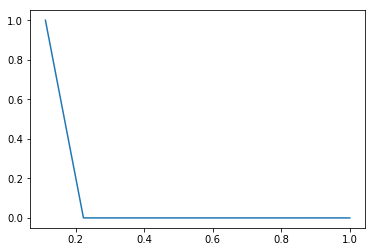

cat7_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


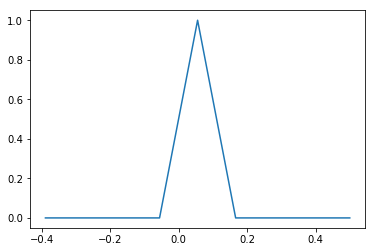

cat8_
[ 4.96920805  0.          0.          0.          0.          0.          0.
  0.          4.03079195]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.55213423  0.55213423  0.55213423  0.55213423  0.55213423  0.55213423
  0.55213423  0.55213423  1.        ]


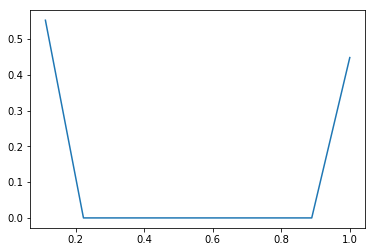

cat9_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


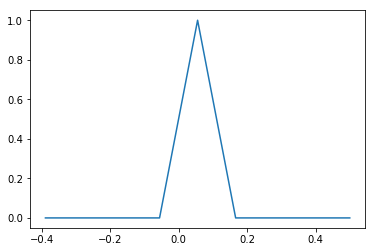

cat10_
[ 8.82629698  0.          0.          0.          0.          0.          0.
  0.          0.17370302]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.98069966  0.98069966  0.98069966  0.98069966  0.98069966  0.98069966
  0.98069966  0.98069966  1.        ]


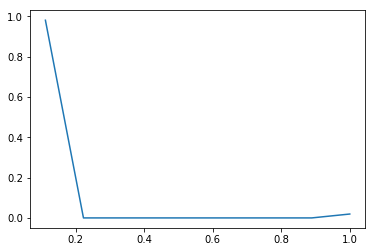

cat11_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


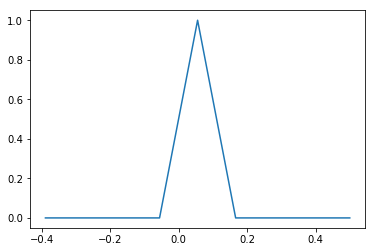

cat12_
[  8.99139262e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   8.60738255e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99904362  0.99904362  0.99904362  0.99904362  0.99904362  0.99904362
  0.99904362  0.99904362  1.        ]


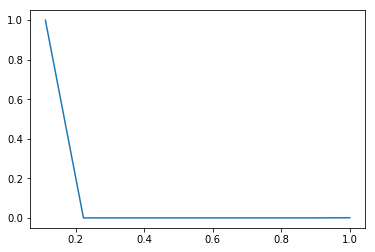

cat13_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


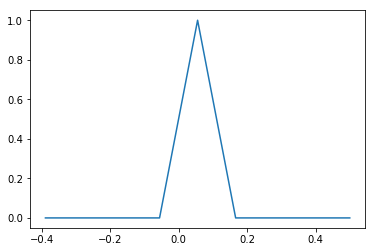

cat14_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


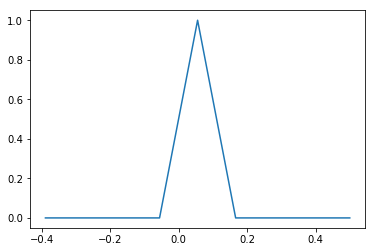

num1
[ 0.40519847  0.3110652   0.17810594  0.11058437  0.          0.07242066
  0.13274569  0.03819823  0.03739573]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.31515436  0.55709396  0.69562081  0.78163087  0.78163087  0.83795805
  0.9412047   0.97091443  1.        ]


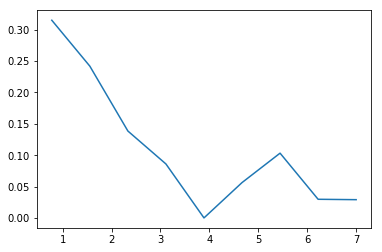

num2
[ 0.11478981  0.13208832  0.11269219  0.09240787  0.16936638  0.07197254
  0.05453264  0.03496492  0.03536714]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.14029866  0.30173993  0.43947483  0.55241779  0.75942114  0.84738758
  0.91403859  0.95677349  1.        ]


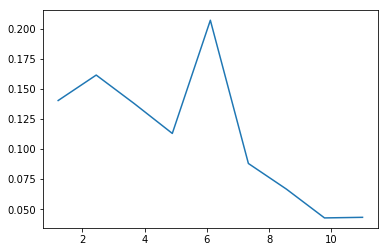

num3
[ 5.4563104  0.         0.         0.         0.         0.         0.         0.
  3.5436896]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.60625671  0.60625671  0.60625671  0.60625671  0.60625671  0.60625671
  0.60625671  0.60625671  1.        ]


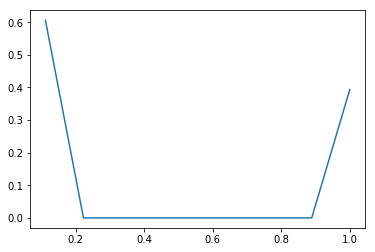

num4
[ 6.68686409  0.          0.          0.          0.          0.          0.
  0.          2.31313591]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.7429849  0.7429849  0.7429849  0.7429849  0.7429849  0.7429849
  0.7429849  0.7429849  1.       ]


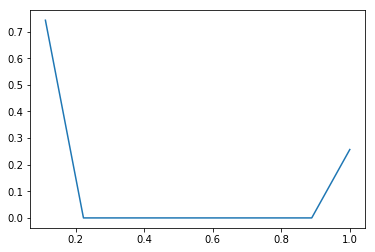

num5
[ 7.52460403  0.          0.          0.          0.          0.          0.
  0.          1.47539597]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.83606711  0.83606711  0.83606711  0.83606711  0.83606711  0.83606711
  0.83606711  0.83606711  1.        ]


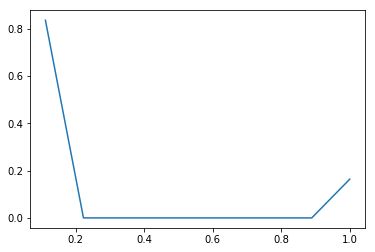

num6
[ 7.33222148  0.          0.          0.          0.          0.          0.
  0.          1.66777852]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.81469128  0.81469128  0.81469128  0.81469128  0.81469128  0.81469128
  0.81469128  0.81469128  1.        ]


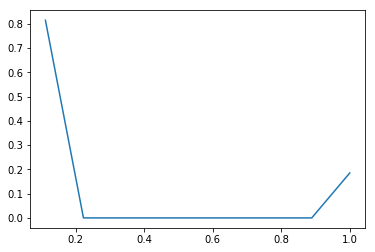

num7
[  8.99663255e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.36744966e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99962584  0.99962584  0.99962584  0.99962584  0.99962584  0.99962584
  0.99962584  0.99962584  1.        ]


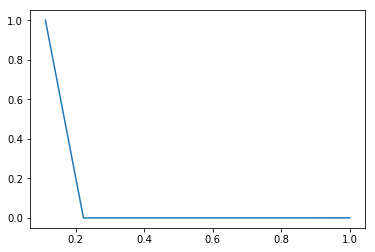

num8
[ 8.98476342  0.          0.          0.          0.          0.          0.
  0.          0.01523658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99830705  0.99830705  0.99830705  0.99830705  0.99830705  0.99830705
  0.99830705  0.99830705  1.        ]


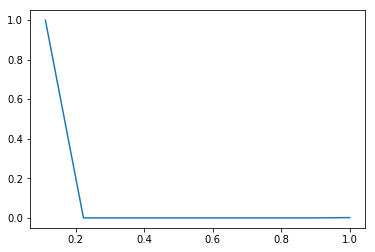

num9
[ 8.91508893  0.          0.          0.          0.          0.          0.
  0.          0.08491107]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99056544  0.99056544  0.99056544  0.99056544  0.99056544  0.99056544
  0.99056544  0.99056544  1.        ]


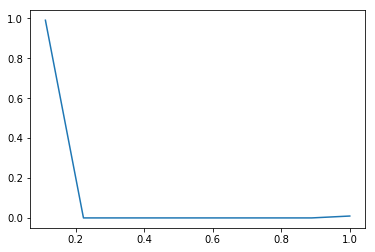

num10
[  8.99146812e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   8.53187919e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99905201  0.99905201  0.99905201  0.99905201  0.99905201  0.99905201
  0.99905201  0.99905201  1.        ]


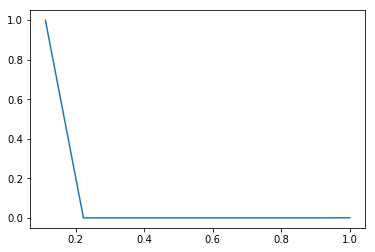

num11
[  2.22589178e+00   0.00000000e+00   2.07596477e-02   0.00000000e+00
   2.81250000e-03   0.00000000e+00   5.17197987e-04   0.00000000e+00
   1.88758389e-05]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.98928523  0.98928523  0.99851174  0.99851174  0.99976174  0.99976174
  0.99999161  0.99999161  1.        ]


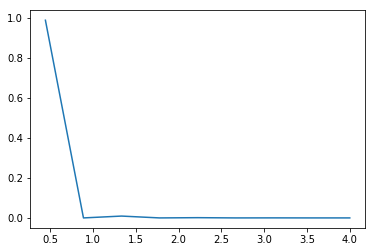

num12
[ 0.05052685  0.02172754  0.08610983  0.04949187  0.14395818  0.06931324
  0.11611371  0.06189068  0.09317579]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.07298322  0.10436745  0.22874832  0.30023658  0.50817617  0.6082953
  0.7760151   0.86541275  1.        ]


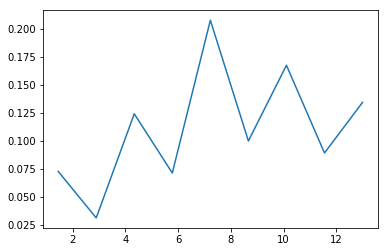

num13
[ 3.05244966  0.          0.          0.          0.          0.          0.
  0.          5.94755034]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.33916107  0.33916107  0.33916107  0.33916107  0.33916107  0.33916107
  0.33916107  0.33916107  1.        ]


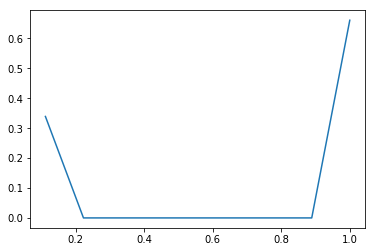

num14
[ 7.91039597  0.          0.          0.          0.          0.          0.
  0.          1.08960403]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87893289  0.87893289  0.87893289  0.87893289  0.87893289  0.87893289
  0.87893289  0.87893289  1.        ]


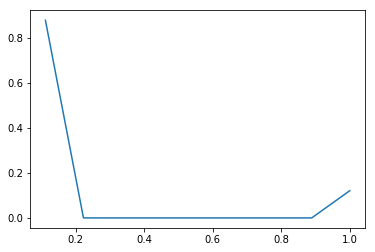

num15
[ 7.61901342  0.          0.          0.          0.          0.          0.
  0.          1.38098658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.84655705  0.84655705  0.84655705  0.84655705  0.84655705  0.84655705
  0.84655705  0.84655705  1.        ]


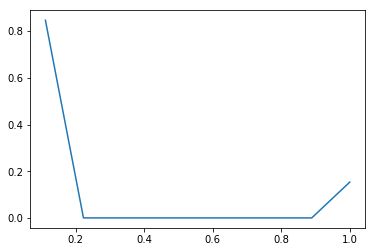

num16
[ 0.3642953   0.72557047  1.09874161  0.          0.9002349   1.48822148
  1.14088926  0.          4.28204698]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.03642953  0.10898658  0.21886074  0.21886074  0.30888423  0.45770638
  0.5717953   0.5717953   1.        ]


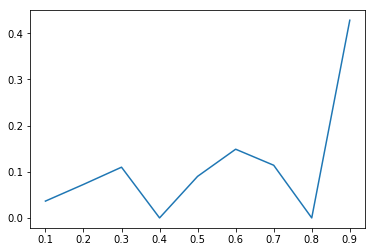

num17
[ 1.01735738  1.76348154  1.08987416  0.17823826  0.30828859  0.33372483
  0.1565604   0.04907718  0.10339765]
[ 0.   0.2  0.4  0.6  0.8  1.   1.2  1.4  1.6  1.8]
[ 0.20347148  0.55616779  0.77414262  0.80979027  0.87144799  0.93819295
  0.96950503  0.97932047  1.        ]


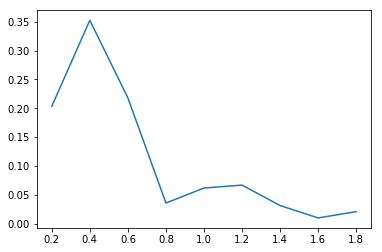

num18
[  1.11996963e-01   1.50383662e+00   4.51606660e-01   1.68504280e-01
   2.48911675e-02   2.12267927e-03   1.82269419e-04   2.27836773e-05
   1.51891182e-05]
[ 0.06123724  0.50309366  0.94495008  1.3868065   1.82866292  2.27051934
  2.71237576  3.15423218  3.5960886   4.03794502]
[ 0.04948658  0.71396644  0.91351174  0.98796644  0.99896477  0.99990268
  0.99998322  0.99999329  1.        ]


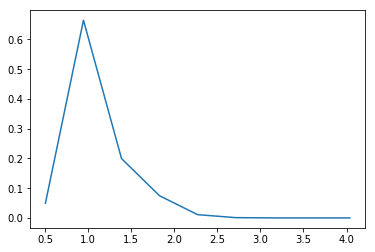

num19
[ 0.13097315  0.          0.          0.30719295  0.          0.
  0.95435235  0.          1.60748154]
[ 0.          0.33333333  0.66666667  1.          1.33333333  1.66666667
  2.          2.33333333  2.66666667  3.        ]
[ 0.04365772  0.04365772  0.04365772  0.14605537  0.14605537  0.14605537
  0.46417282  0.46417282  1.        ]


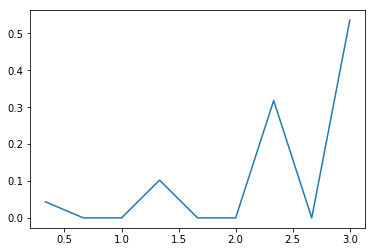

num20
[  7.77776344e-04   2.63714143e+00   4.73178387e+00   3.44140106e-01
   1.00851666e-02   1.49073799e-03   0.00000000e+00   0.00000000e+00
   4.92591684e-04]
[ 0.1         0.22943456  0.35886913  0.48830369  0.61773825  0.74717281
  0.87660738  1.00604194  1.1354765   1.26491106]
[  1.00671141e-04   3.41437919e-01   9.53894295e-01   9.98437919e-01
   9.99743289e-01   9.99936242e-01   9.99936242e-01   9.99936242e-01
   1.00000000e+00]


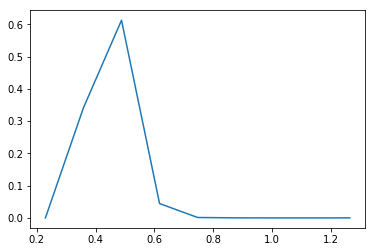

num21
[  4.62205815e-01   1.78143611e+00   2.84879902e-01   5.51630331e-02
   8.08558816e-03   1.47960171e-03   3.48141578e-04   3.48141578e-05
   2.17588487e-05]
[ 0.25061907  0.63617539  1.02173172  1.40728805  1.79284437  2.1784007
  2.56395702  2.94951335  3.33506968  3.720626  ]
[ 0.17820638  0.86505034  0.97488758  0.99615604  0.99927349  0.99984396
  0.99997819  0.99999161  1.        ]


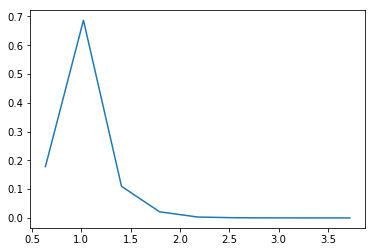

num22
[  2.26430562e-03   1.39584410e-02   1.52482353e-02   3.45842588e+00
   1.02410531e+01   2.74468236e+00   3.68422588e-01   2.36892227e-01
   1.66240159e-03]
[ 0.10954451  0.16808358  0.22662264  0.28516171  0.34370077  0.40223984
  0.46077891  0.51931797  0.57785704  0.6363961 ]
[  1.32550336e-04   9.49664430e-04   1.84228188e-03   2.04295302e-01
   8.03796980e-01   9.64468121e-01   9.86035235e-01   9.99902685e-01
   1.00000000e+00]


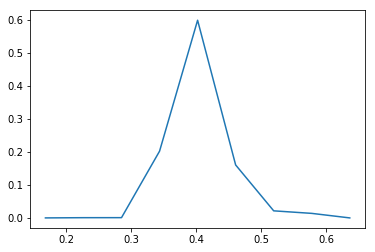

num23
[ 0.05734502  0.          0.0271167   0.02632164  0.09525352  0.1609971
  0.3195283   0.72976175  0.98902713]
[ 0.          0.41573971  0.83147942  1.24721913  1.66295884  2.07869855
  2.49443826  2.91017797  3.32591768  3.74165739]
[ 0.0238406   0.0238406   0.03511409  0.04605705  0.08565772  0.1525906
  0.28543121  0.58882215  1.        ]


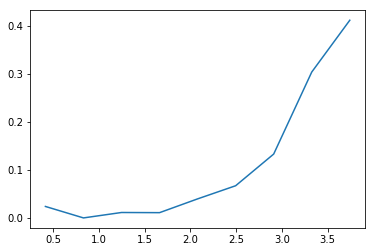

der1
[ 1.00446309  0.99966443  1.99724832  0.          0.99555369  2.00659396
  1.00062081  0.          1.9958557 ]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10044631  0.20041275  0.40013758  0.40013758  0.49969295  0.70035235
  0.80041443  0.80041443  1.        ]


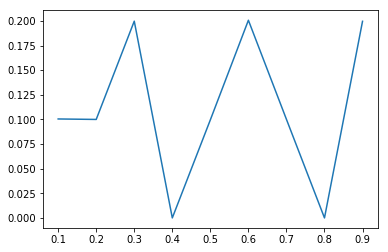

der2
[ 1.00177852  0.99781879  1.99901007  0.          1.00493289  2.00877517
  0.99964765  0.          1.98803691]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10017785  0.19995973  0.39986074  0.39986074  0.50035403  0.70123154
  0.80119631  0.80119631  1.        ]


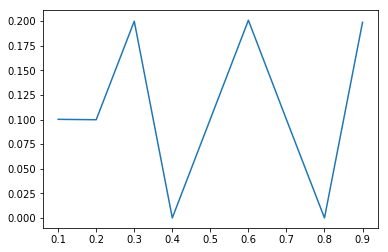

der3
[ 0.99666107  1.00894295  1.99874161  0.          0.99496644  2.005
  0.99758389  0.          1.99810403]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.09966611  0.2005604   0.40043456  0.40043456  0.49993121  0.70043121
  0.8001896   0.8001896   1.        ]


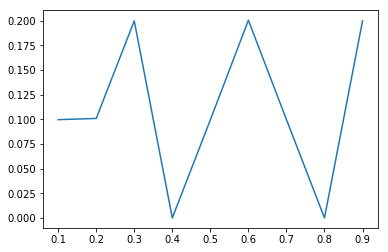

der4
[ 0.07228691  0.32664262  0.          0.58660369  0.          0.53074027
  0.          0.24079228  0.04293423]
[ 0.          0.55555556  1.11111111  1.66666667  2.22222222  2.77777778
  3.33333333  3.88888889  4.44444444  5.        ]
[ 0.0401594   0.22162752  0.22162752  0.54751846  0.54751846  0.84237416
  0.84237416  0.97614765  1.        ]


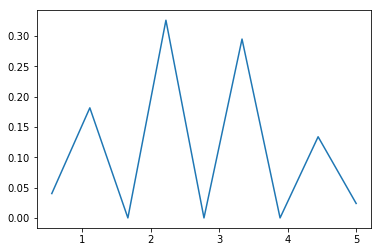

der5
[ 0.15430117  0.43060822  0.          0.49186661  0.30032215  0.
  0.10251091  0.01898406  0.00140688]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.10286745  0.3899396   0.3899396   0.71785067  0.91806544  0.91806544
  0.98640604  0.99906208  1.        ]


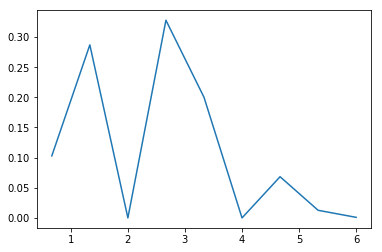

der6
[  1.05704698e-05   1.99328859e-04   1.81208054e-03   1.01431208e-02
   4.02372483e-02   1.11065436e-01   2.11320302e-01   2.64672483e-01
   2.60539430e-01]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[  1.17449664e-05   2.33221477e-04   2.24664430e-03   1.35167785e-02
   5.82248322e-02   1.81630872e-01   4.16431208e-01   7.10511745e-01
   1.00000000e+00]


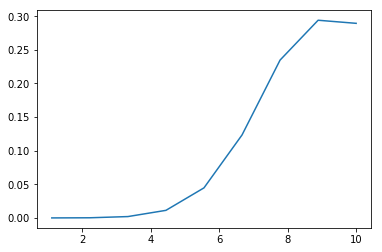

der7
[ 0.02568624  0.11643456  0.23373993  0.27285403  0.20502013  0.10366275
  0.03428356  0.00736074  0.00095805]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.02568624  0.14212081  0.37586074  0.64871477  0.8537349   0.95739765
  0.99168121  0.99904195  1.        ]


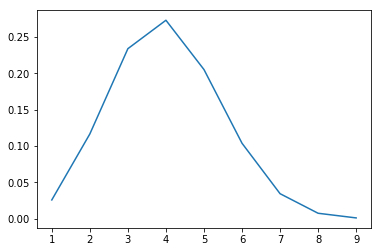

der8
[  1.52516779e-04   1.27147651e-03   6.75151007e-03   2.59716443e-02
   7.49340604e-02   1.55663758e-01   2.29471309e-01   2.28791779e-01
   1.76991946e-01]
[  2.           3.11111111   4.22222222   5.33333333   6.44444444
   7.55555556   8.66666667   9.77777778  10.88888889  12.        ]
[  1.69463087e-04   1.58221477e-03   9.08389262e-03   3.79412752e-02
   1.21201342e-01   2.94161074e-01   5.49129195e-01   8.03342282e-01
   1.00000000e+00]


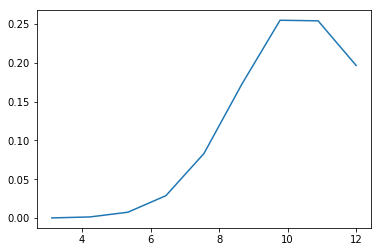

der9
[ 0.07450671  0.26219942  0.39428715  0.33013303  0.          0.16621956
  0.04962943  0.00816731  0.00057167]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.05794966  0.26188255  0.56855034  0.82532047  0.82532047  0.95460235
  0.99320302  0.99955537  1.        ]


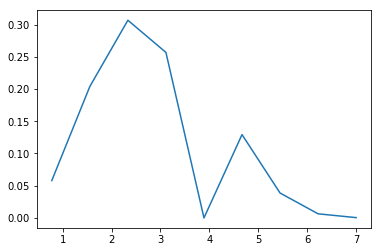

der10
[  3.51181208e-03   5.22344295e-02   1.35866779e-01   1.15905503e-01
   3.48499329e-02   1.54280537e-02   2.03496644e-03   1.61275168e-04
   7.24832215e-06]
[  0.           2.77777778   5.55555556   8.33333333  11.11111111
  13.88888889  16.66666667  19.44444444  22.22222222  25.        ]
[ 0.00975503  0.15485067  0.53225839  0.85421812  0.95102349  0.99387919
  0.99953188  0.99997987  1.        ]


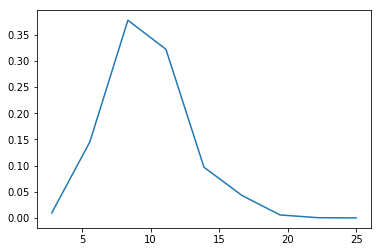

der11
[  4.36592194e-02   1.30036648e-01   1.55696662e-01   9.64893147e-02
   3.66580714e-02   9.15657012e-03   1.75565171e-03   2.05051219e-04
   2.70222536e-05]
[  0.           2.11111111   4.22222222   6.33333333   8.44444444
  10.55555556  12.66666667  14.77777778  16.88888889  19.        ]
[ 0.09216946  0.36669128  0.69538423  0.89908389  0.97647315  0.99580369
  0.99951007  0.99994295  1.        ]


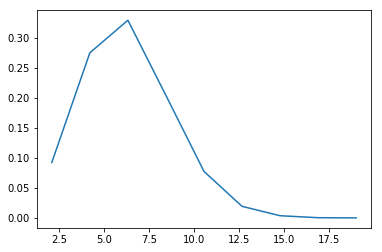

der12
[  5.20559396e-01   2.19741946e-01   1.06382718e-01   3.89808725e-02
   1.10234899e-02   2.60486577e-03   5.85906040e-04   9.96644295e-05
   2.11409396e-05]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[ 0.57839933  0.82255705  0.94076007  0.98407215  0.99632047  0.99921477
  0.99986577  0.99997651  1.        ]


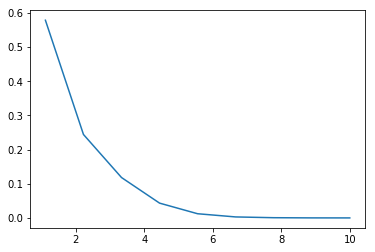

der13
[  1.51566598e-01   1.62077827e-01   2.65374548e-01   6.34588281e-02
   4.34295302e-02   4.51393908e-03   1.75632421e-03   1.02219928e-04
   2.78781621e-05]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.21892953  0.45304195  0.83636074  0.92802349  0.99075503  0.99727517
  0.99981208  0.99995973  1.        ]


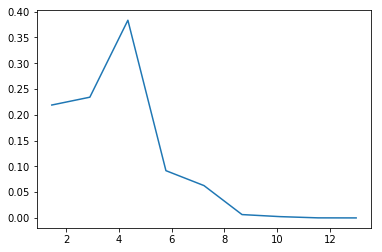

der14
[  7.65997957e-03   8.51040998e-02   1.10167275e-01   1.33256201e-01
   3.78521301e-02   1.53534432e-02   1.57834841e-03   3.17114094e-04
   1.57572221e-05]
[  0.           2.55555556   5.11111111   7.66666667  10.22222222
  12.77777778  15.33333333  17.88888889  20.44444444  23.        ]
[ 0.0195755   0.23706376  0.51860235  0.85914597  0.95587919  0.99511577
  0.99914933  0.99995973  1.        ]


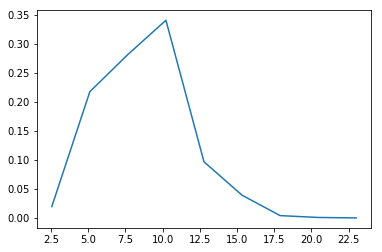

der15
[ 7.89813423  0.          0.          0.          0.          0.          0.
  0.          1.10186577]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87757047  0.87757047  0.87757047  0.87757047  0.87757047  0.87757047
  0.87757047  0.87757047  1.        ]


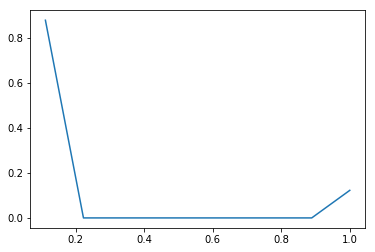

der16
[ 3.34988758  0.          0.          0.          0.          0.          0.
  0.          5.65011242]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.37220973  0.37220973  0.37220973  0.37220973  0.37220973  0.37220973
  0.37220973  0.37220973  1.        ]


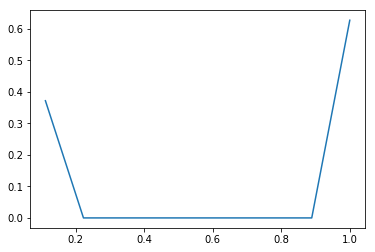

der17
[ 4.01236913  0.          0.          0.          0.          0.          0.
  0.          4.98763087]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.44581879  0.44581879  0.44581879  0.44581879  0.44581879  0.44581879
  0.44581879  0.44581879  1.        ]


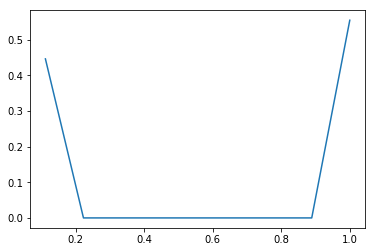

der18
[ 6.41493121  0.          0.          0.          0.          0.          0.
  0.          2.58506879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.71277013  0.71277013  0.71277013  0.71277013  0.71277013  0.71277013
  0.71277013  0.71277013  1.        ]


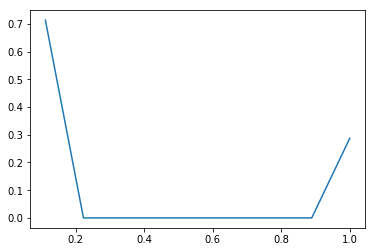

der19
[ 5.85918121  0.          0.          0.          0.          0.          0.
  0.          3.14081879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.65102013  0.65102013  0.65102013  0.65102013  0.65102013  0.65102013
  0.65102013  0.65102013  1.        ]


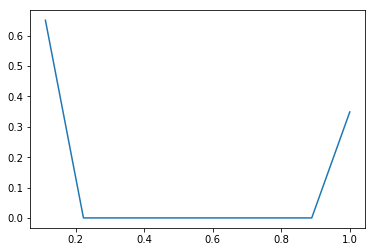

cat1
[ 2.17775336  0.          0.          0.62283221  0.          0.
  0.14207215  0.          0.05734228]
[ 1.          1.33333333  1.66666667  2.          2.33333333  2.66666667
  3.          3.33333333  3.66666667  4.        ]
[ 0.72591779  0.72591779  0.72591779  0.93352852  0.93352852  0.93352852
  0.98088591  0.98088591  1.        ]


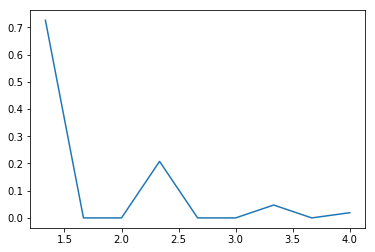

cat2
[ 5.24739262  0.          0.          0.          0.          0.          0.
  0.          3.75260738]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.58304362  0.58304362  0.58304362  0.58304362  0.58304362  0.58304362
  0.58304362  0.58304362  1.        ]


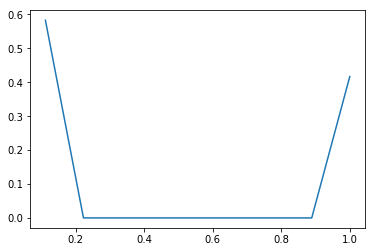

cat3
[ 1.34526342  0.02096728  0.          0.01053523  0.02074581  0.
  0.04623826  0.00415772  0.05209228]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.89684228  0.91082047  0.91082047  0.91784396  0.9316745   0.9316745
  0.9625      0.96527181  1.        ]


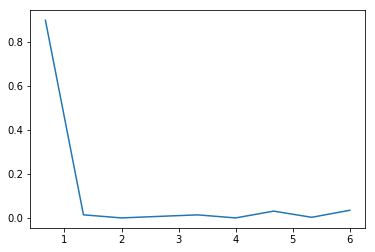

cat4
[ 0.00999939  0.00294326  0.00915101  0.03598627  0.11070439  0.24654042
  0.02074146  0.02793487  0.35418075]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.01222148  0.01581879  0.02700336  0.07098658  0.20629195  0.50761913
  0.5329698   0.56711242  1.        ]


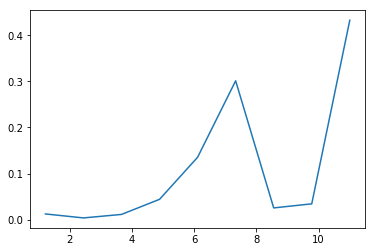

cat5
[ 1.53019631  0.          0.          0.          0.          0.          0.
  0.          7.46980369]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.17002181  0.17002181  0.17002181  0.17002181  0.17002181  0.17002181
  0.17002181  0.17002181  1.        ]


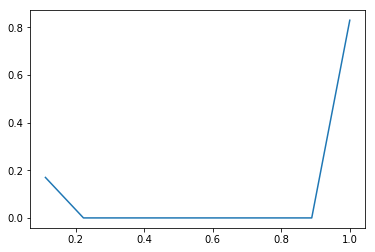

cat7
[  8.34305369e-01   5.39496644e-02   3.99395973e-02   1.07382550e-03
   3.85906040e-04   9.17785235e-04   2.61912752e-03   2.33221477e-04
   6.65755034e-02]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.83430537  0.88825503  0.92819463  0.92926846  0.92965436  0.93057215
  0.93319128  0.9334245   1.        ]


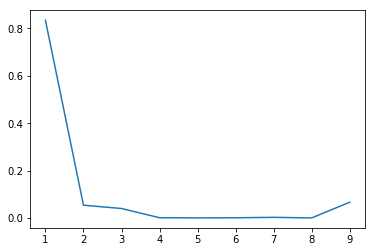

cat8
[ 2.35855872  0.          0.          0.          0.          0.          0.
  0.          6.64144128]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.26206208  0.26206208  0.26206208  0.26206208  0.26206208  0.26206208
  0.26206208  0.26206208  1.        ]


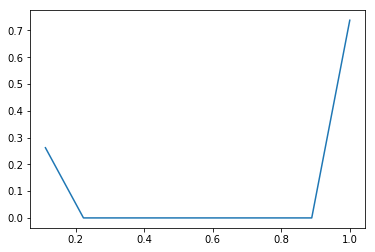

cat9
[ 0.20352685  0.01210008  0.02893999  0.03300296  0.01692252  0.14675987
  0.00767647  0.07201865  0.00846437]
[  0.           1.88888889   3.77777778   5.66666667   7.55555556
   9.44444444  11.33333333  13.22222222  15.11111111  17.        ]
[ 0.3844396   0.4072953   0.46195973  0.52429866  0.55626342  0.83347651
  0.84797651  0.98401174  1.        ]


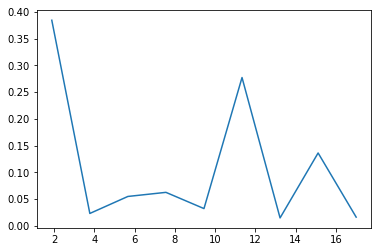

cat10
[ 0.46242785  0.          0.          0.          0.          0.          0.
  0.          8.53757215]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.05138087  0.05138087  0.05138087  0.05138087  0.05138087  0.05138087
  0.05138087  0.05138087  1.        ]


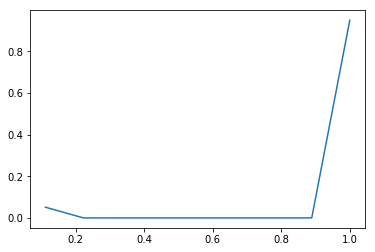

cat11
[ 1.51130537  0.          0.          0.          0.          0.          0.
  0.          7.48869463]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.16792282  0.16792282  0.16792282  0.16792282  0.16792282  0.16792282
  0.16792282  0.16792282  1.        ]


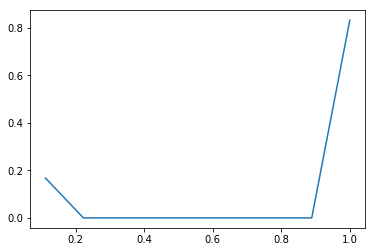

cat12
[ 0.73525923  0.          0.10993289  0.          1.33841779  0.          0.0557781
  0.          0.010612  ]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.32678188  0.32678188  0.37564094  0.37564094  0.97049329  0.97049329
  0.99528356  0.99528356  1.        ]


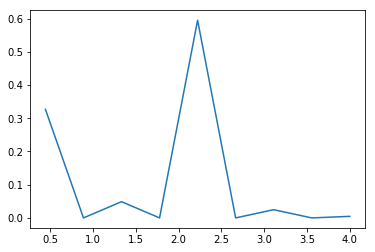

cat13
[  3.67172819e-02   0.00000000e+00   0.00000000e+00   0.00000000e+00
   4.46195386e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.32885906e-03]
[ 0.          0.22222222  0.44444444  0.66666667  0.88888889  1.11111111
  1.33333333  1.55555556  1.77777778  2.        ]
[ 0.0081594  0.0081594  0.0081594  0.0081594  0.9997047  0.9997047
  0.9997047  0.9997047  1.       ]


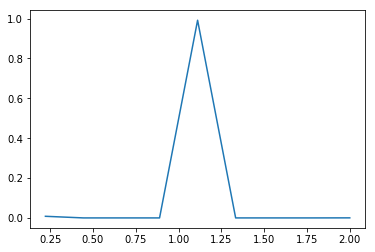

cat14
[ 0.00861647  0.00578971  0.00905043  0.00790982  0.00615521  0.01029235
  0.00628261  0.01103859  0.02224344]
[   1.           12.44444444   23.88888889   35.33333333   46.77777778
   58.22222222   69.66666667   81.11111111   92.55555556  104.        ]
[ 0.09861074  0.16487081  0.26844799  0.35897148  0.42941443  0.5472047
  0.6191057   0.74543624  1.        ]


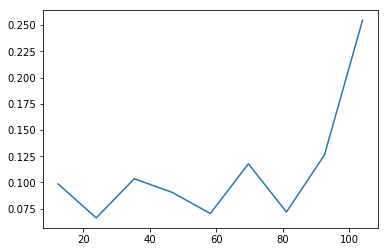

num1_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


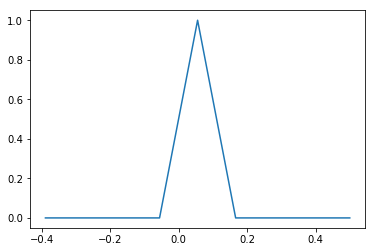

num2_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


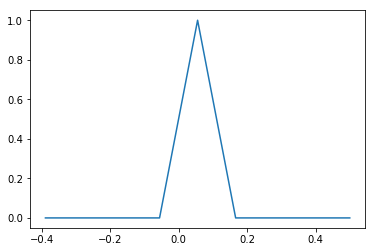

num3_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


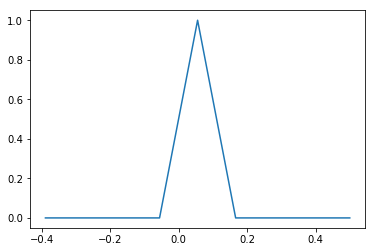

num4_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


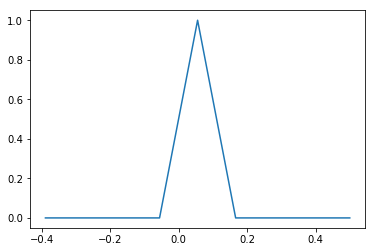

num5_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


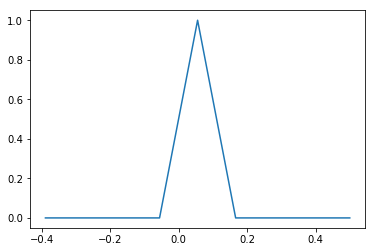

num6_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


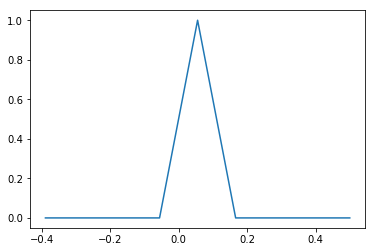

num7_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


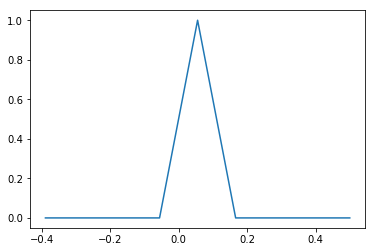

num8_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


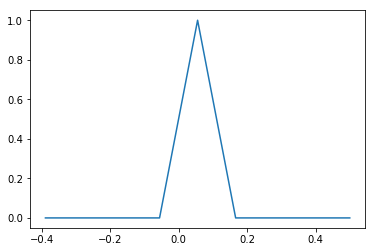

num9_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


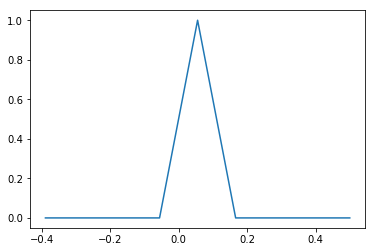

num10_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


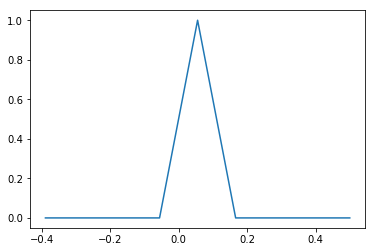

num11_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


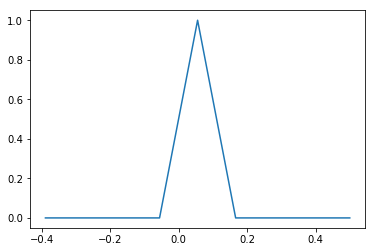

num12_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


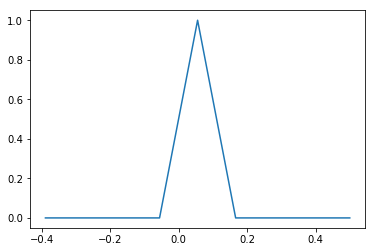

num13_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


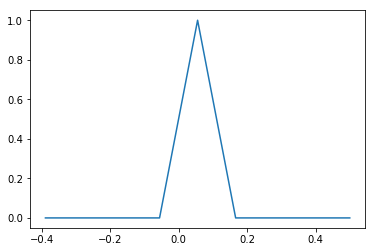

num14_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


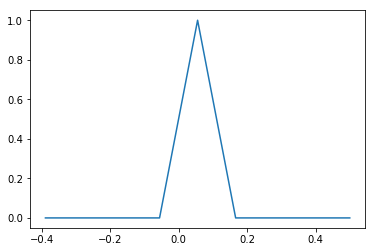

num15_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


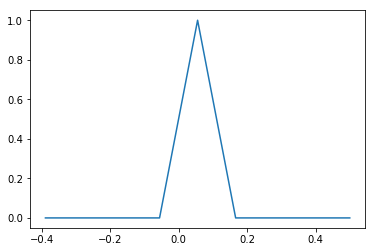

num16_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


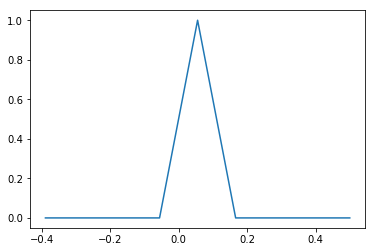

num17_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


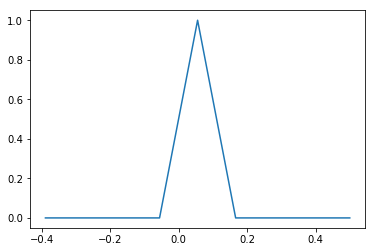

num18_
[ 7.37050168  0.          0.          0.          0.          0.          0.
  0.          1.62949832]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.81894463  0.81894463  0.81894463  0.81894463  0.81894463  0.81894463
  0.81894463  0.81894463  1.        ]


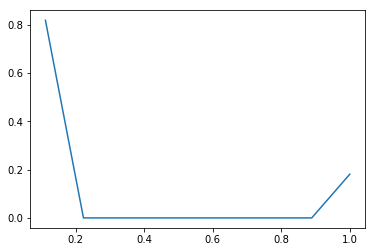

num19_
[  8.99992450e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   7.55033557e-05]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99999161  0.99999161  0.99999161  0.99999161  0.99999161  0.99999161
  0.99999161  0.99999161  1.        ]


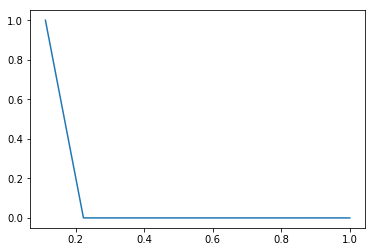

num20_
[  8.99998490e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.51006711e-05]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99999832  0.99999832  0.99999832  0.99999832  0.99999832  0.99999832
  0.99999832  0.99999832  1.        ]


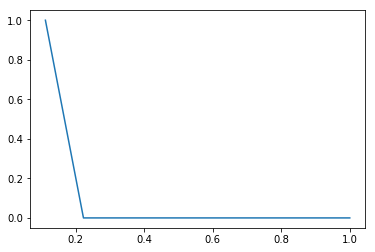

num21_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


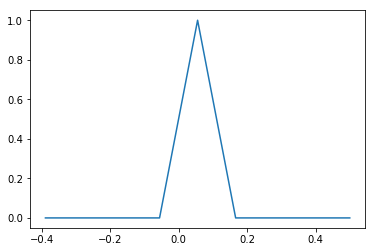

num22_
[ 8.35569966  0.          0.          0.          0.          0.          0.
  0.          0.64430034]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.92841107  0.92841107  0.92841107  0.92841107  0.92841107  0.92841107
  0.92841107  0.92841107  1.        ]


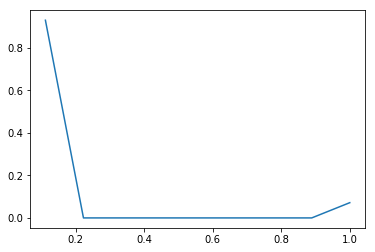

num23_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


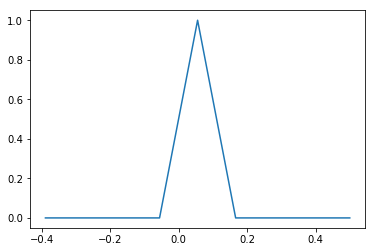

der1_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


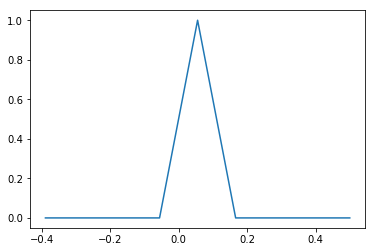

der2_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


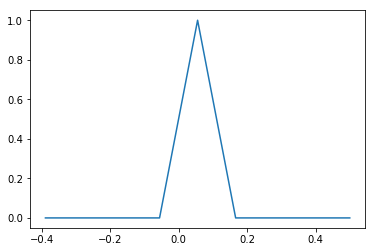

der3_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


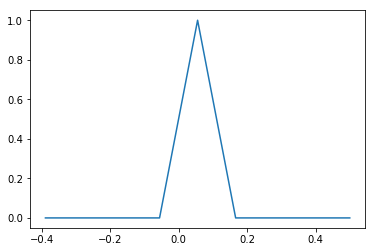

der4_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


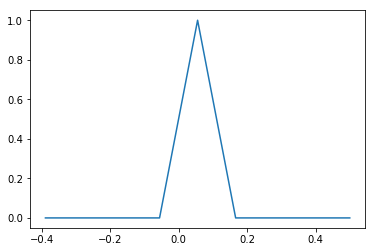

der5_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


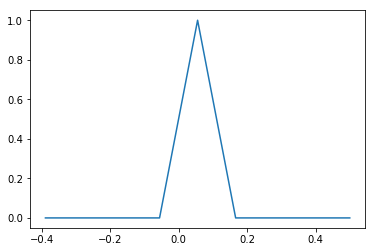

der6_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


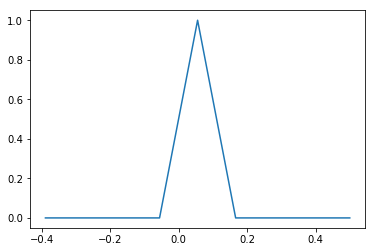

der7_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


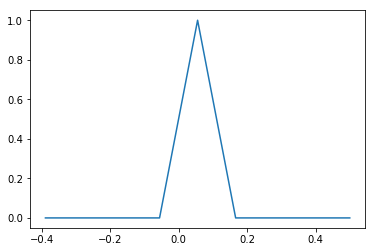

der8_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


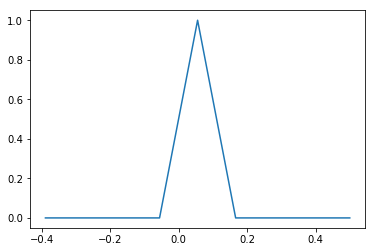

der9_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


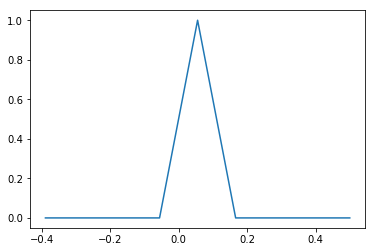

der10_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


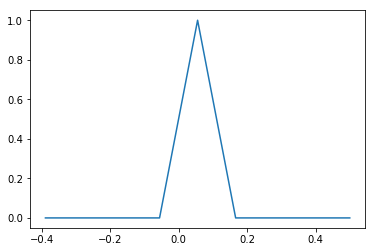

der11_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


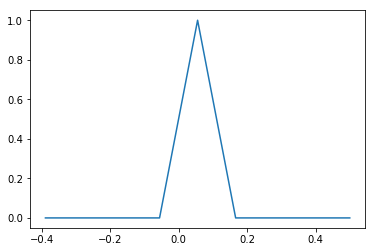

der12_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


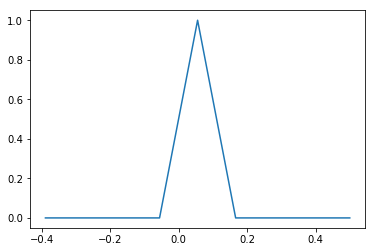

der13_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


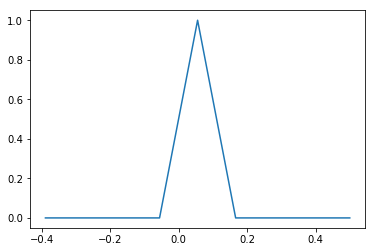

der14_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


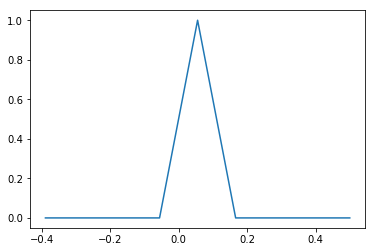

der15_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


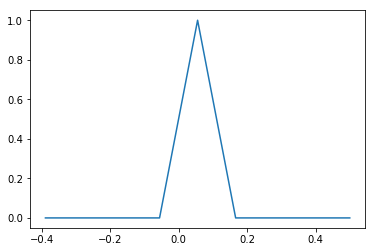

der16_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


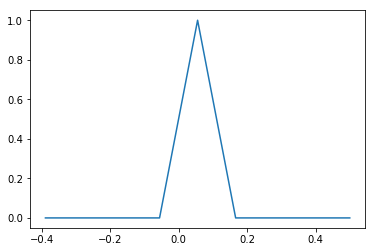

der17_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


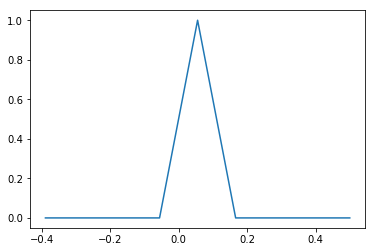

der18_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


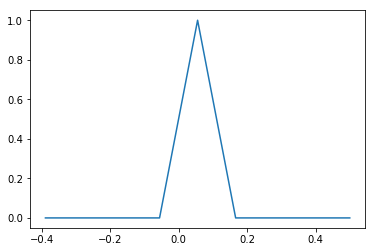

der19_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


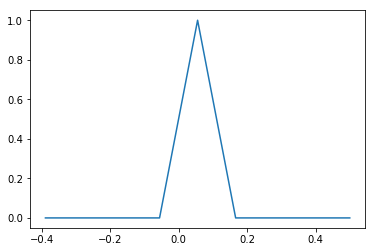

cat1_
[  8.99672315e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.27684564e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99963591  0.99963591  0.99963591  0.99963591  0.99963591  0.99963591
  0.99963591  0.99963591  1.        ]


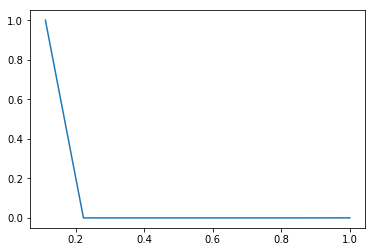

cat2_
[  8.99874664e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.25335570e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99986074  0.99986074  0.99986074  0.99986074  0.99986074  0.99986074
  0.99986074  0.99986074  1.        ]


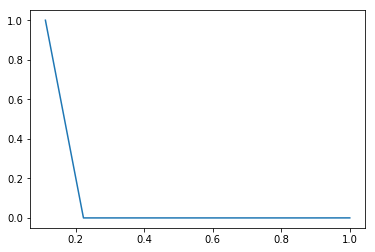

cat3_
[ 8.9122047  0.         0.         0.         0.         0.         0.         0.
  0.0877953]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99024497  0.99024497  0.99024497  0.99024497  0.99024497  0.99024497
  0.99024497  0.99024497  1.        ]


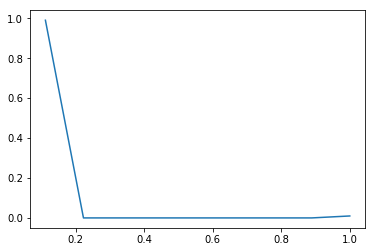

cat4_
[  8.99838423e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.61577181e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99982047  0.99982047  0.99982047  0.99982047  0.99982047  0.99982047
  0.99982047  0.99982047  1.        ]


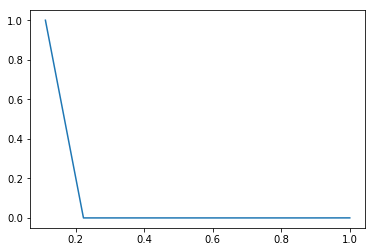

cat5_
[  8.99992450e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   7.55033557e-05]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99999161  0.99999161  0.99999161  0.99999161  0.99999161  0.99999161
  0.99999161  0.99999161  1.        ]


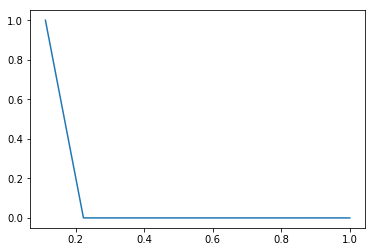

cat7_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


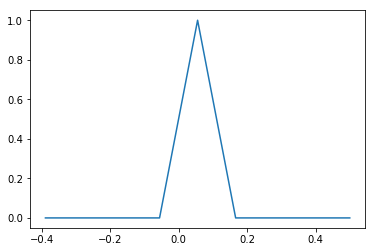

cat8_
[ 4.96920805  0.          0.          0.          0.          0.          0.
  0.          4.03079195]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.55213423  0.55213423  0.55213423  0.55213423  0.55213423  0.55213423
  0.55213423  0.55213423  1.        ]


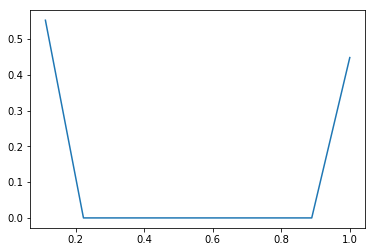

cat9_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


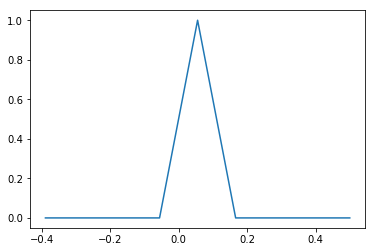

cat10_
[ 8.82629698  0.          0.          0.          0.          0.          0.
  0.          0.17370302]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.98069966  0.98069966  0.98069966  0.98069966  0.98069966  0.98069966
  0.98069966  0.98069966  1.        ]


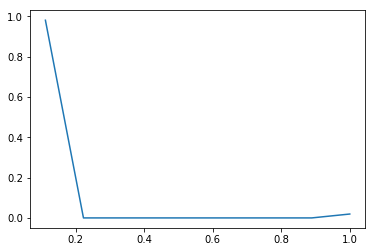

cat11_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


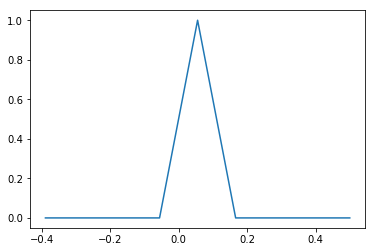

cat12_
[  8.99139262e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   8.60738255e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99904362  0.99904362  0.99904362  0.99904362  0.99904362  0.99904362
  0.99904362  0.99904362  1.        ]


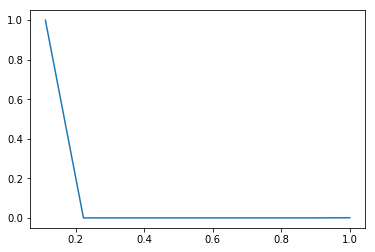

cat13_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


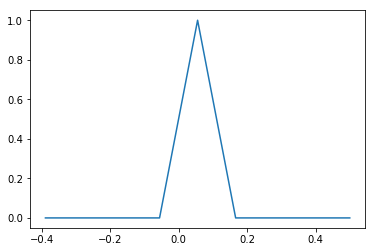

cat14_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


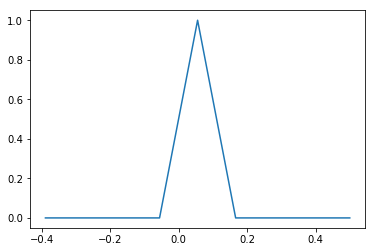

num1
[ 0.40519847  0.3110652   0.17810594  0.11058437  0.          0.07242066
  0.13274569  0.03819823  0.03739573]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.31515436  0.55709396  0.69562081  0.78163087  0.78163087  0.83795805
  0.9412047   0.97091443  1.        ]


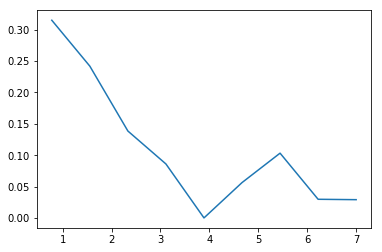

num2
[ 0.11478981  0.13208832  0.11269219  0.09240787  0.16936638  0.07197254
  0.05453264  0.03496492  0.03536714]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.14029866  0.30173993  0.43947483  0.55241779  0.75942114  0.84738758
  0.91403859  0.95677349  1.        ]


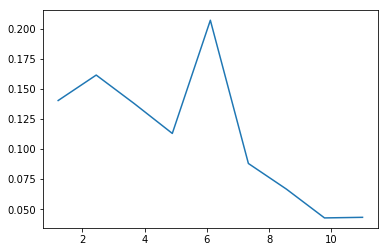

num3
[ 5.4563104  0.         0.         0.         0.         0.         0.         0.
  3.5436896]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.60625671  0.60625671  0.60625671  0.60625671  0.60625671  0.60625671
  0.60625671  0.60625671  1.        ]


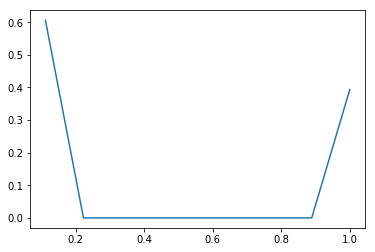

num4
[ 6.68686409  0.          0.          0.          0.          0.          0.
  0.          2.31313591]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.7429849  0.7429849  0.7429849  0.7429849  0.7429849  0.7429849
  0.7429849  0.7429849  1.       ]


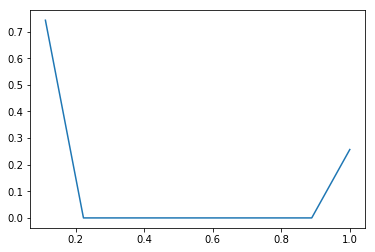

num5
[ 7.52460403  0.          0.          0.          0.          0.          0.
  0.          1.47539597]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.83606711  0.83606711  0.83606711  0.83606711  0.83606711  0.83606711
  0.83606711  0.83606711  1.        ]


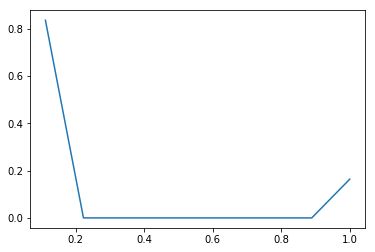

num6
[ 7.33222148  0.          0.          0.          0.          0.          0.
  0.          1.66777852]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.81469128  0.81469128  0.81469128  0.81469128  0.81469128  0.81469128
  0.81469128  0.81469128  1.        ]


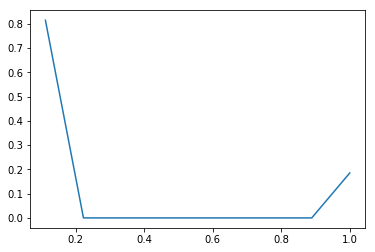

num7
[  8.99663255e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.36744966e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99962584  0.99962584  0.99962584  0.99962584  0.99962584  0.99962584
  0.99962584  0.99962584  1.        ]


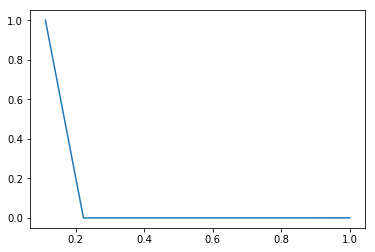

num8
[ 8.98476342  0.          0.          0.          0.          0.          0.
  0.          0.01523658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99830705  0.99830705  0.99830705  0.99830705  0.99830705  0.99830705
  0.99830705  0.99830705  1.        ]


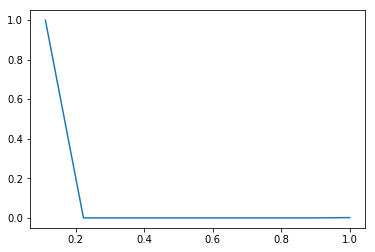

num9
[ 8.91508893  0.          0.          0.          0.          0.          0.
  0.          0.08491107]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99056544  0.99056544  0.99056544  0.99056544  0.99056544  0.99056544
  0.99056544  0.99056544  1.        ]


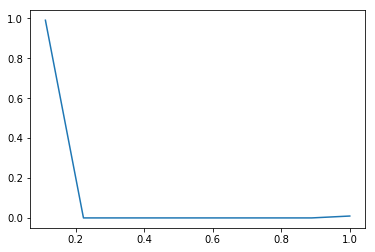

num10
[  8.99146812e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   8.53187919e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99905201  0.99905201  0.99905201  0.99905201  0.99905201  0.99905201
  0.99905201  0.99905201  1.        ]


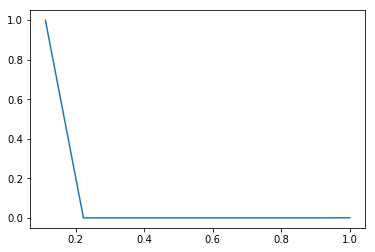

num11
[  2.22589178e+00   0.00000000e+00   2.07596477e-02   0.00000000e+00
   2.81250000e-03   0.00000000e+00   5.17197987e-04   0.00000000e+00
   1.88758389e-05]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.98928523  0.98928523  0.99851174  0.99851174  0.99976174  0.99976174
  0.99999161  0.99999161  1.        ]


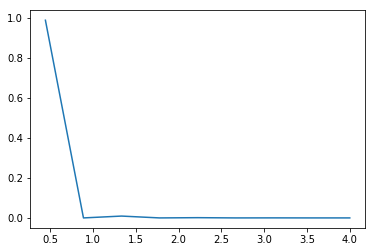

num12
[ 0.05052685  0.02172754  0.08610983  0.04949187  0.14395818  0.06931324
  0.11611371  0.06189068  0.09317579]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.07298322  0.10436745  0.22874832  0.30023658  0.50817617  0.6082953
  0.7760151   0.86541275  1.        ]


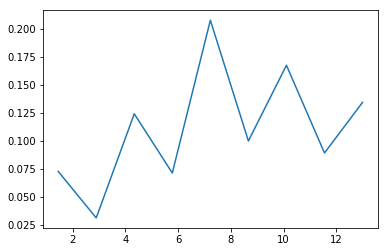

num13
[ 3.05244966  0.          0.          0.          0.          0.          0.
  0.          5.94755034]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.33916107  0.33916107  0.33916107  0.33916107  0.33916107  0.33916107
  0.33916107  0.33916107  1.        ]


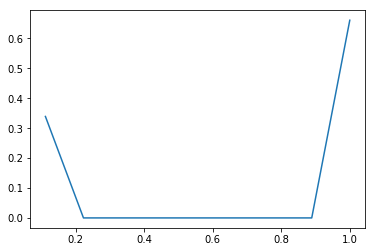

num14
[ 7.91039597  0.          0.          0.          0.          0.          0.
  0.          1.08960403]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87893289  0.87893289  0.87893289  0.87893289  0.87893289  0.87893289
  0.87893289  0.87893289  1.        ]


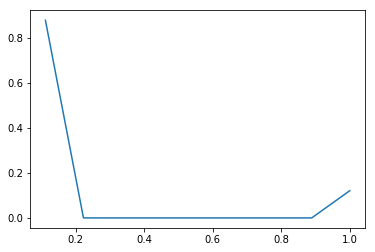

num15
[ 7.61901342  0.          0.          0.          0.          0.          0.
  0.          1.38098658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.84655705  0.84655705  0.84655705  0.84655705  0.84655705  0.84655705
  0.84655705  0.84655705  1.        ]


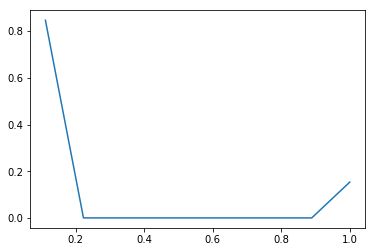

num16
[ 0.3642953   0.72557047  1.09874161  0.          0.9002349   1.48822148
  1.14088926  0.          4.28204698]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.03642953  0.10898658  0.21886074  0.21886074  0.30888423  0.45770638
  0.5717953   0.5717953   1.        ]


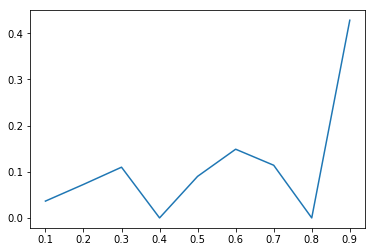

num17
[ 1.01735738  1.76348154  1.08987416  0.17823826  0.30828859  0.33372483
  0.1565604   0.04907718  0.10339765]
[ 0.   0.2  0.4  0.6  0.8  1.   1.2  1.4  1.6  1.8]
[ 0.20347148  0.55616779  0.77414262  0.80979027  0.87144799  0.93819295
  0.96950503  0.97932047  1.        ]


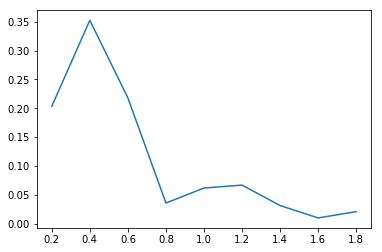

num18
[  1.11996963e-01   1.50383662e+00   4.51606660e-01   1.68504280e-01
   2.48911675e-02   2.12267927e-03   1.82269419e-04   2.27836773e-05
   1.51891182e-05]
[ 0.06123724  0.50309366  0.94495008  1.3868065   1.82866292  2.27051934
  2.71237576  3.15423218  3.5960886   4.03794502]
[ 0.04948658  0.71396644  0.91351174  0.98796644  0.99896477  0.99990268
  0.99998322  0.99999329  1.        ]


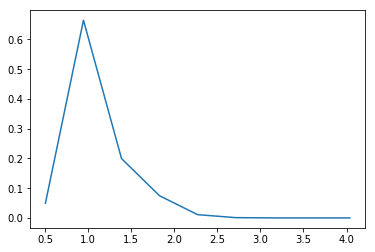

num19
[ 0.13097315  0.          0.          0.30719295  0.          0.
  0.95435235  0.          1.60748154]
[ 0.          0.33333333  0.66666667  1.          1.33333333  1.66666667
  2.          2.33333333  2.66666667  3.        ]
[ 0.04365772  0.04365772  0.04365772  0.14605537  0.14605537  0.14605537
  0.46417282  0.46417282  1.        ]


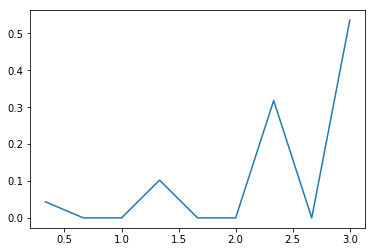

num20
[  7.77776344e-04   2.63715440e+00   4.73177091e+00   3.44140106e-01
   1.00851666e-02   1.49073799e-03   0.00000000e+00   0.00000000e+00
   4.92591684e-04]
[ 0.1         0.22943456  0.35886913  0.48830369  0.61773825  0.74717281
  0.87660738  1.00604194  1.1354765   1.26491106]
[  1.00671141e-04   3.41439597e-01   9.53894295e-01   9.98437919e-01
   9.99743289e-01   9.99936242e-01   9.99936242e-01   9.99936242e-01
   1.00000000e+00]


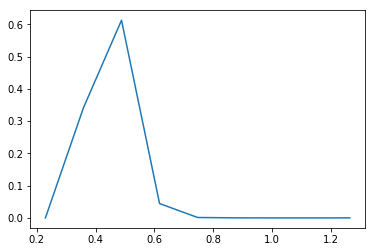

num21
[  4.62205815e-01   1.78143611e+00   2.84879902e-01   5.51630331e-02
   8.08558816e-03   1.47960171e-03   3.48141578e-04   3.48141578e-05
   2.17588487e-05]
[ 0.25061907  0.63617539  1.02173172  1.40728805  1.79284437  2.1784007
  2.56395702  2.94951335  3.33506968  3.720626  ]
[ 0.17820638  0.86505034  0.97488758  0.99615604  0.99927349  0.99984396
  0.99997819  0.99999161  1.        ]


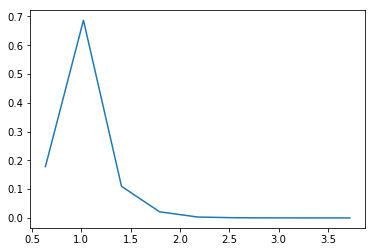

num22
[  2.26430562e-03   1.39584410e-02   1.52482353e-02   3.45842588e+00
   1.02410531e+01   2.74468236e+00   3.68422588e-01   2.36892227e-01
   1.66240159e-03]
[ 0.10954451  0.16808358  0.22662264  0.28516171  0.34370077  0.40223984
  0.46077891  0.51931797  0.57785704  0.6363961 ]
[  1.32550336e-04   9.49664430e-04   1.84228188e-03   2.04295302e-01
   8.03796980e-01   9.64468121e-01   9.86035235e-01   9.99902685e-01
   1.00000000e+00]


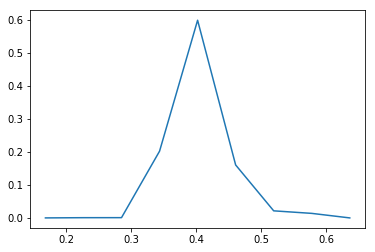

num23
[ 0.05734502  0.          0.0271167   0.02632164  0.09525352  0.1609971
  0.3195283   0.72976175  0.98902713]
[ 0.          0.41573971  0.83147942  1.24721913  1.66295884  2.07869855
  2.49443826  2.91017797  3.32591768  3.74165739]
[ 0.0238406   0.0238406   0.03511409  0.04605705  0.08565772  0.1525906
  0.28543121  0.58882215  1.        ]


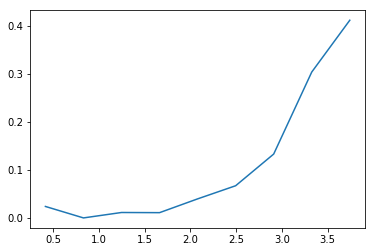

der1
[ 1.00446309  0.99966443  1.99724832  0.          0.99555369  2.00659396
  1.00062081  0.          1.9958557 ]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10044631  0.20041275  0.40013758  0.40013758  0.49969295  0.70035235
  0.80041443  0.80041443  1.        ]


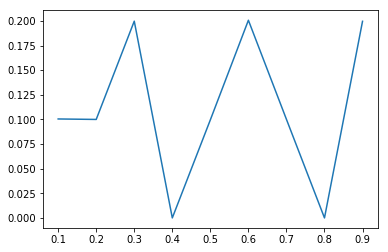

der2
[ 1.00177852  0.99781879  1.99901007  0.          1.00493289  2.00877517
  0.99964765  0.          1.98803691]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10017785  0.19995973  0.39986074  0.39986074  0.50035403  0.70123154
  0.80119631  0.80119631  1.        ]


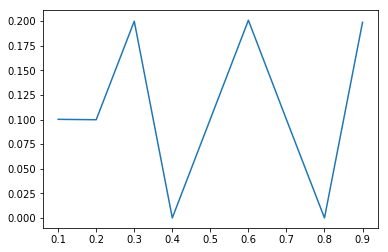

der3
[ 0.99666107  1.00894295  1.99874161  0.          0.99496644  2.005
  0.99758389  0.          1.99810403]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.09966611  0.2005604   0.40043456  0.40043456  0.49993121  0.70043121
  0.8001896   0.8001896   1.        ]


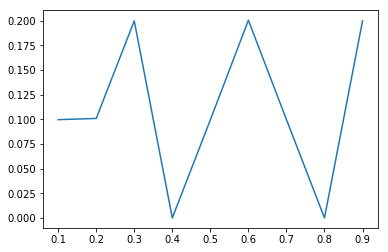

der4
[ 0.07228691  0.32664262  0.          0.58660369  0.          0.53074027
  0.          0.24079228  0.04293423]
[ 0.          0.55555556  1.11111111  1.66666667  2.22222222  2.77777778
  3.33333333  3.88888889  4.44444444  5.        ]
[ 0.0401594   0.22162752  0.22162752  0.54751846  0.54751846  0.84237416
  0.84237416  0.97614765  1.        ]


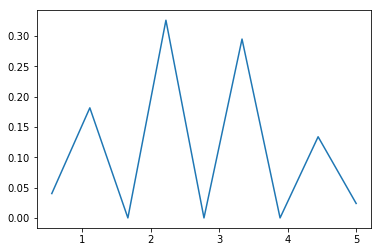

der5
[ 0.15430117  0.43060822  0.          0.49186661  0.30032215  0.
  0.10251091  0.01898406  0.00140688]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.10286745  0.3899396   0.3899396   0.71785067  0.91806544  0.91806544
  0.98640604  0.99906208  1.        ]


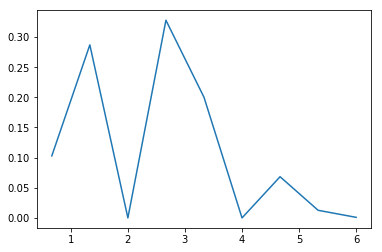

der6
[  1.05704698e-05   1.99328859e-04   1.81208054e-03   1.01431208e-02
   4.02372483e-02   1.11065436e-01   2.11320302e-01   2.64672483e-01
   2.60539430e-01]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[  1.17449664e-05   2.33221477e-04   2.24664430e-03   1.35167785e-02
   5.82248322e-02   1.81630872e-01   4.16431208e-01   7.10511745e-01
   1.00000000e+00]


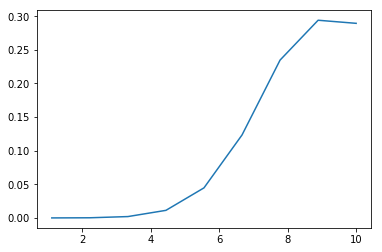

der7
[ 0.02568624  0.11643456  0.23373993  0.27285403  0.20502013  0.10366275
  0.03428356  0.00736074  0.00095805]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.02568624  0.14212081  0.37586074  0.64871477  0.8537349   0.95739765
  0.99168121  0.99904195  1.        ]


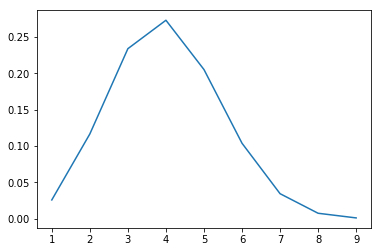

der8
[  1.52516779e-04   1.27147651e-03   6.75151007e-03   2.59716443e-02
   7.49340604e-02   1.55663758e-01   2.29471309e-01   2.28791779e-01
   1.76991946e-01]
[  2.           3.11111111   4.22222222   5.33333333   6.44444444
   7.55555556   8.66666667   9.77777778  10.88888889  12.        ]
[  1.69463087e-04   1.58221477e-03   9.08389262e-03   3.79412752e-02
   1.21201342e-01   2.94161074e-01   5.49129195e-01   8.03342282e-01
   1.00000000e+00]


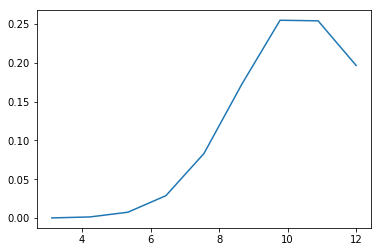

der9
[ 0.07450671  0.26219942  0.39428715  0.33013303  0.          0.16621956
  0.04962943  0.00816731  0.00057167]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.05794966  0.26188255  0.56855034  0.82532047  0.82532047  0.95460235
  0.99320302  0.99955537  1.        ]


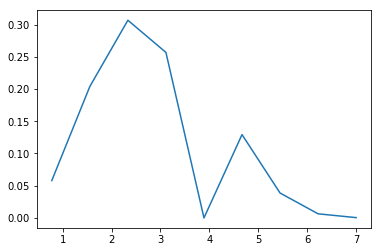

der10
[  3.51181208e-03   5.22344295e-02   1.35866779e-01   1.15905503e-01
   3.48499329e-02   1.54280537e-02   2.03496644e-03   1.61275168e-04
   7.24832215e-06]
[  0.           2.77777778   5.55555556   8.33333333  11.11111111
  13.88888889  16.66666667  19.44444444  22.22222222  25.        ]
[ 0.00975503  0.15485067  0.53225839  0.85421812  0.95102349  0.99387919
  0.99953188  0.99997987  1.        ]


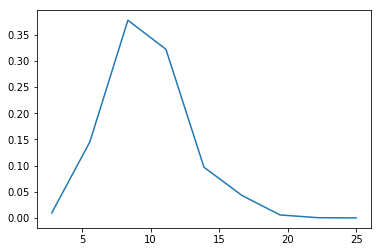

der11
[  4.36592194e-02   1.30036648e-01   1.55696662e-01   9.64893147e-02
   3.66580714e-02   9.15657012e-03   1.75565171e-03   2.05051219e-04
   2.70222536e-05]
[  0.           2.11111111   4.22222222   6.33333333   8.44444444
  10.55555556  12.66666667  14.77777778  16.88888889  19.        ]
[ 0.09216946  0.36669128  0.69538423  0.89908389  0.97647315  0.99580369
  0.99951007  0.99994295  1.        ]


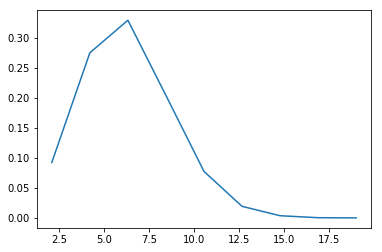

der12
[  5.20559396e-01   2.19741946e-01   1.06382718e-01   3.89808725e-02
   1.10234899e-02   2.60486577e-03   5.85906040e-04   9.96644295e-05
   2.11409396e-05]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[ 0.57839933  0.82255705  0.94076007  0.98407215  0.99632047  0.99921477
  0.99986577  0.99997651  1.        ]


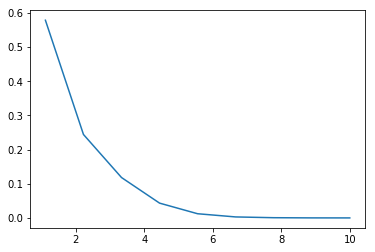

der13
[  1.51566598e-01   1.62077827e-01   2.65374548e-01   6.34588281e-02
   4.34295302e-02   4.51393908e-03   1.75632421e-03   1.02219928e-04
   2.78781621e-05]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.21892953  0.45304195  0.83636074  0.92802349  0.99075503  0.99727517
  0.99981208  0.99995973  1.        ]


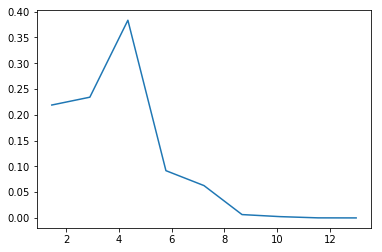

der14
[  7.65997957e-03   8.51040998e-02   1.10167275e-01   1.33256201e-01
   3.78521301e-02   1.53534432e-02   1.57834841e-03   3.17114094e-04
   1.57572221e-05]
[  0.           2.55555556   5.11111111   7.66666667  10.22222222
  12.77777778  15.33333333  17.88888889  20.44444444  23.        ]
[ 0.0195755   0.23706376  0.51860235  0.85914597  0.95587919  0.99511577
  0.99914933  0.99995973  1.        ]


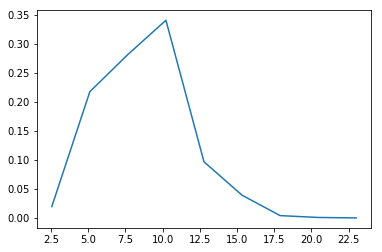

der15
[ 7.89813423  0.          0.          0.          0.          0.          0.
  0.          1.10186577]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87757047  0.87757047  0.87757047  0.87757047  0.87757047  0.87757047
  0.87757047  0.87757047  1.        ]


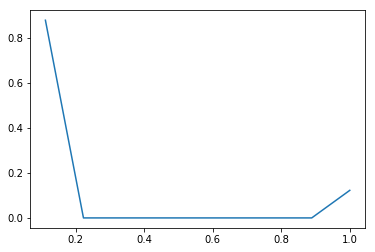

der16
[ 3.34988758  0.          0.          0.          0.          0.          0.
  0.          5.65011242]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.37220973  0.37220973  0.37220973  0.37220973  0.37220973  0.37220973
  0.37220973  0.37220973  1.        ]


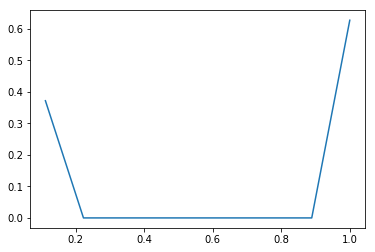

der17
[ 4.01236913  0.          0.          0.          0.          0.          0.
  0.          4.98763087]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.44581879  0.44581879  0.44581879  0.44581879  0.44581879  0.44581879
  0.44581879  0.44581879  1.        ]


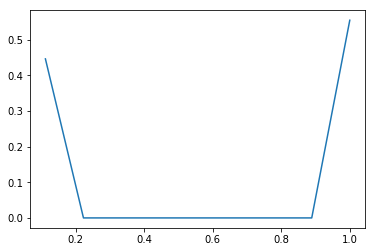

der18
[ 6.41493121  0.          0.          0.          0.          0.          0.
  0.          2.58506879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.71277013  0.71277013  0.71277013  0.71277013  0.71277013  0.71277013
  0.71277013  0.71277013  1.        ]


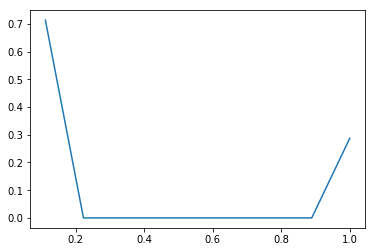

der19
[ 5.85918121  0.          0.          0.          0.          0.          0.
  0.          3.14081879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.65102013  0.65102013  0.65102013  0.65102013  0.65102013  0.65102013
  0.65102013  0.65102013  1.        ]


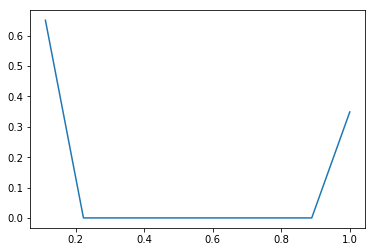

cat1
[ 2.17775336  0.          0.          0.62283221  0.          0.
  0.14207215  0.          0.05734228]
[ 1.          1.33333333  1.66666667  2.          2.33333333  2.66666667
  3.          3.33333333  3.66666667  4.        ]
[ 0.72591779  0.72591779  0.72591779  0.93352852  0.93352852  0.93352852
  0.98088591  0.98088591  1.        ]


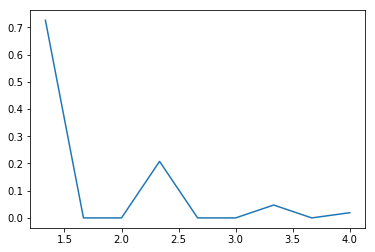

cat2
[ 5.24739262  0.          0.          0.          0.          0.          0.
  0.          3.75260738]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.58304362  0.58304362  0.58304362  0.58304362  0.58304362  0.58304362
  0.58304362  0.58304362  1.        ]


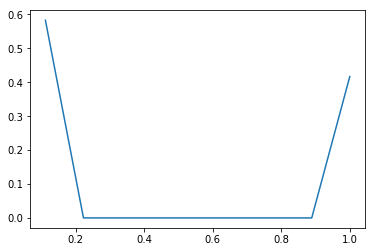

cat3
[ 1.34526342  0.02096728  0.          0.01053523  0.02074581  0.
  0.04623826  0.00415772  0.05209228]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.89684228  0.91082047  0.91082047  0.91784396  0.9316745   0.9316745
  0.9625      0.96527181  1.        ]


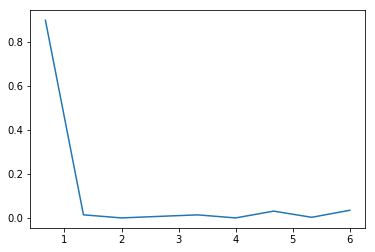

cat4
[ 0.00999939  0.00294326  0.00915101  0.03598627  0.11070439  0.24639353
  0.02074146  0.02793487  0.35432764]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.01222148  0.01581879  0.02700336  0.07098658  0.20629195  0.5074396
  0.53279027  0.56693289  1.        ]


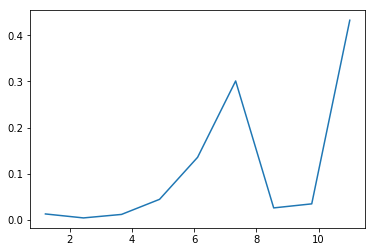

cat5
[ 1.53019631  0.          0.          0.          0.          0.          0.
  0.          7.46980369]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.17002181  0.17002181  0.17002181  0.17002181  0.17002181  0.17002181
  0.17002181  0.17002181  1.        ]


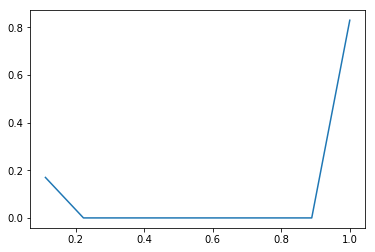

cat7
[  8.34305369e-01   5.39496644e-02   3.99395973e-02   1.07382550e-03
   3.85906040e-04   9.17785235e-04   2.61912752e-03   2.33221477e-04
   6.65755034e-02]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.83430537  0.88825503  0.92819463  0.92926846  0.92965436  0.93057215
  0.93319128  0.9334245   1.        ]


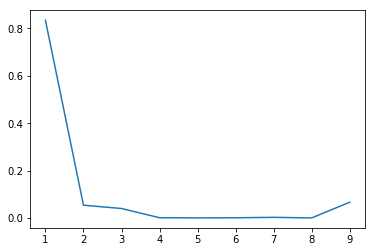

cat8
[ 2.35855872  0.          0.          0.          0.          0.          0.
  0.          6.64144128]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.26206208  0.26206208  0.26206208  0.26206208  0.26206208  0.26206208
  0.26206208  0.26206208  1.        ]


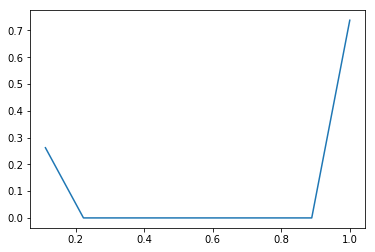

cat9
[ 0.20352685  0.01210008  0.02893999  0.03300296  0.01692252  0.14675987
  0.00767647  0.07201865  0.00846437]
[  0.           1.88888889   3.77777778   5.66666667   7.55555556
   9.44444444  11.33333333  13.22222222  15.11111111  17.        ]
[ 0.3844396   0.4072953   0.46195973  0.52429866  0.55626342  0.83347651
  0.84797651  0.98401174  1.        ]


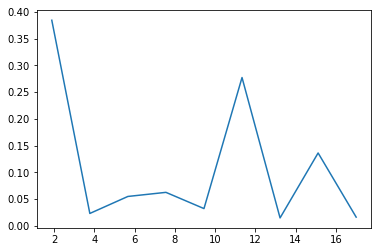

cat10
[ 0.46242785  0.          0.          0.          0.          0.          0.
  0.          8.53757215]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.05138087  0.05138087  0.05138087  0.05138087  0.05138087  0.05138087
  0.05138087  0.05138087  1.        ]


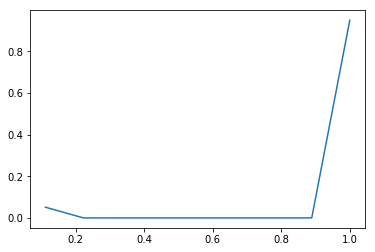

cat11
[ 1.51130537  0.          0.          0.          0.          0.          0.
  0.          7.48869463]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.16792282  0.16792282  0.16792282  0.16792282  0.16792282  0.16792282
  0.16792282  0.16792282  1.        ]


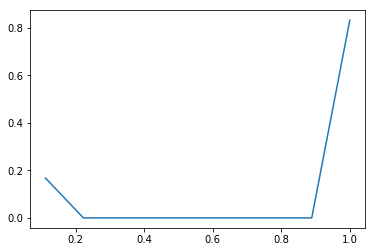

cat12
[ 0.73525923  0.          0.10993289  0.          1.33841779  0.          0.0557781
  0.          0.010612  ]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.32678188  0.32678188  0.37564094  0.37564094  0.97049329  0.97049329
  0.99528356  0.99528356  1.        ]


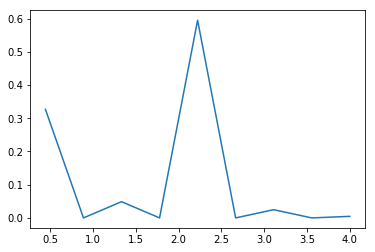

cat13
[  3.67172819e-02   0.00000000e+00   0.00000000e+00   0.00000000e+00
   4.46195386e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.32885906e-03]
[ 0.          0.22222222  0.44444444  0.66666667  0.88888889  1.11111111
  1.33333333  1.55555556  1.77777778  2.        ]
[ 0.0081594  0.0081594  0.0081594  0.0081594  0.9997047  0.9997047
  0.9997047  0.9997047  1.       ]


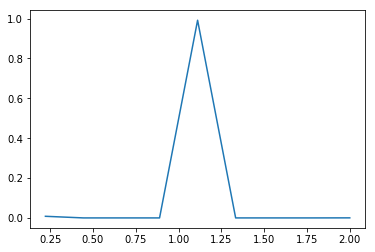

cat14
[ 0.00861647  0.00578971  0.00905043  0.00790982  0.00615521  0.01029235
  0.00628261  0.01103859  0.02224344]
[   1.           12.44444444   23.88888889   35.33333333   46.77777778
   58.22222222   69.66666667   81.11111111   92.55555556  104.        ]
[ 0.09861074  0.16487081  0.26844799  0.35897148  0.42941443  0.5472047
  0.6191057   0.74543624  1.        ]


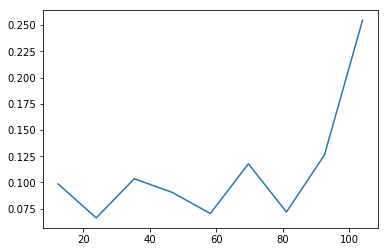

num1_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


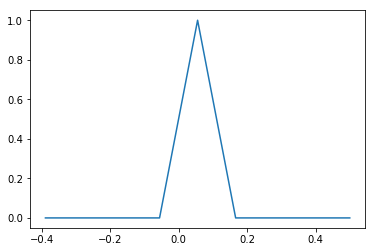

num2_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


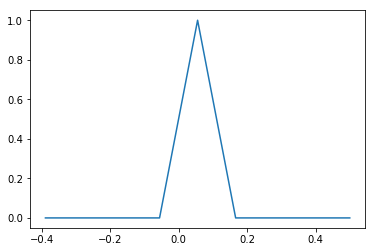

num3_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


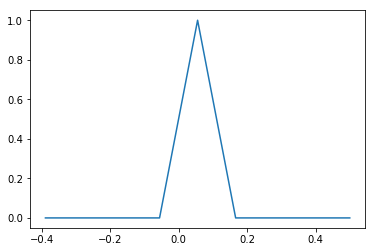

num4_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


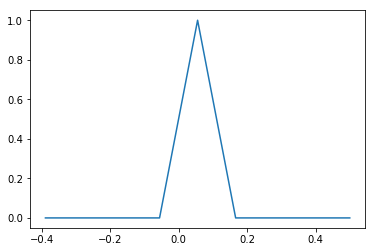

num5_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


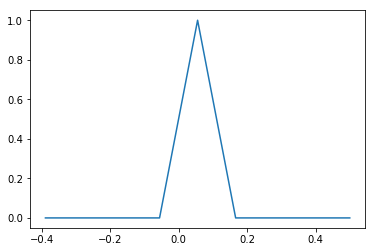

num6_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


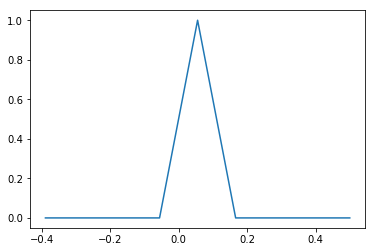

num7_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


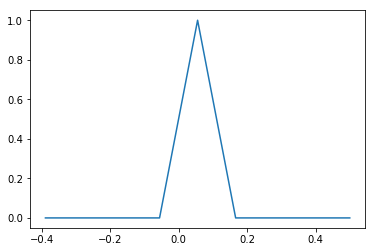

num8_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


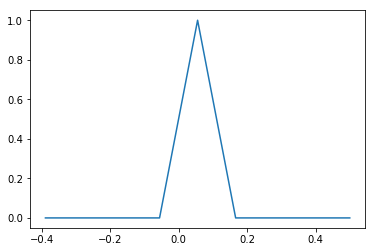

num9_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


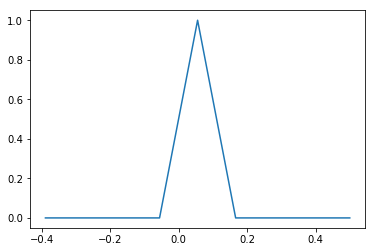

num10_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


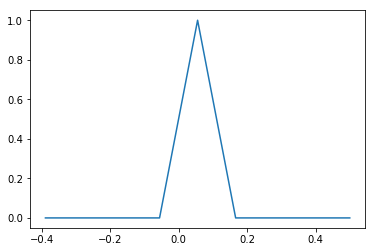

num11_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


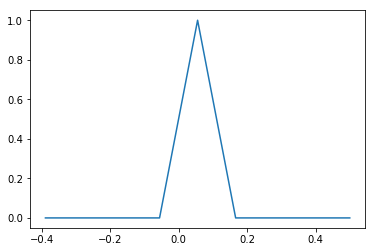

num12_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


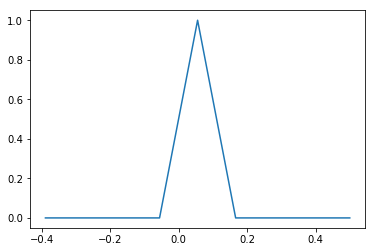

num13_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


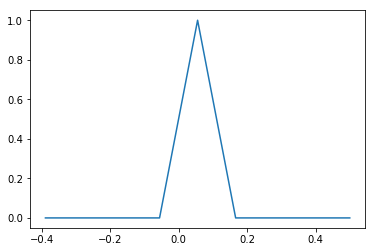

num14_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


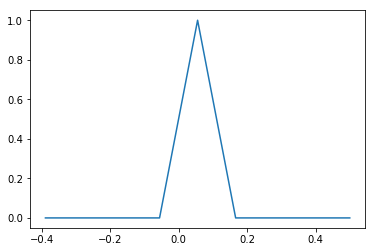

num15_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


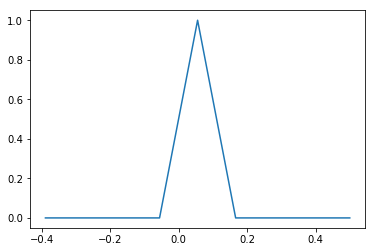

num16_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


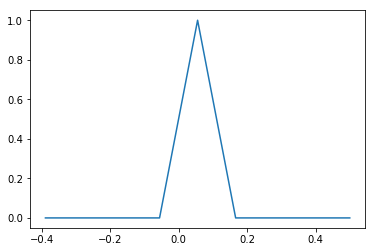

num17_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


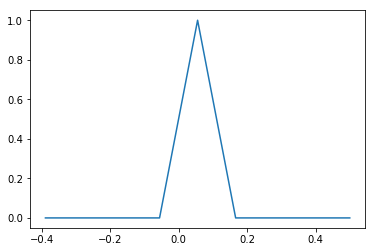

num18_
[ 7.37050168  0.          0.          0.          0.          0.          0.
  0.          1.62949832]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.81894463  0.81894463  0.81894463  0.81894463  0.81894463  0.81894463
  0.81894463  0.81894463  1.        ]


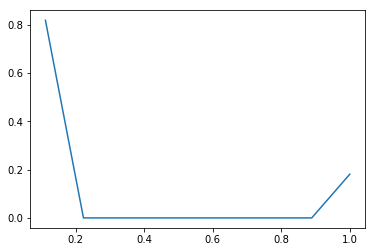

num19_
[  8.99992450e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   7.55033557e-05]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99999161  0.99999161  0.99999161  0.99999161  0.99999161  0.99999161
  0.99999161  0.99999161  1.        ]


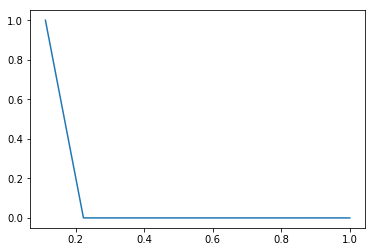

num20_
[  8.99998490e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.51006711e-05]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99999832  0.99999832  0.99999832  0.99999832  0.99999832  0.99999832
  0.99999832  0.99999832  1.        ]


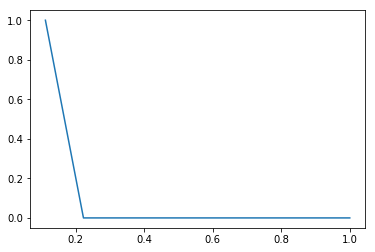

num21_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


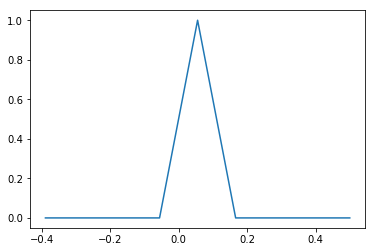

num22_
[ 8.35569966  0.          0.          0.          0.          0.          0.
  0.          0.64430034]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.92841107  0.92841107  0.92841107  0.92841107  0.92841107  0.92841107
  0.92841107  0.92841107  1.        ]


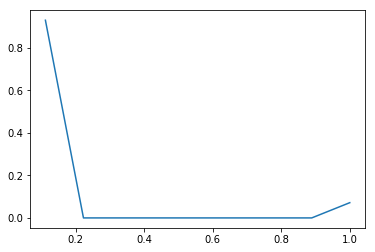

num23_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


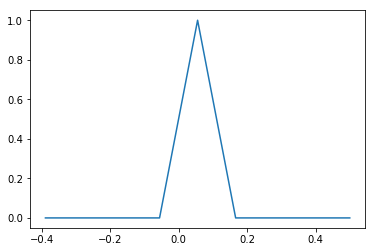

der1_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


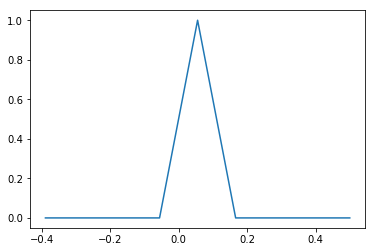

der2_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


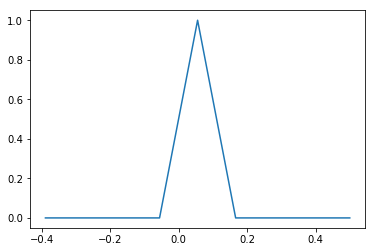

der3_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


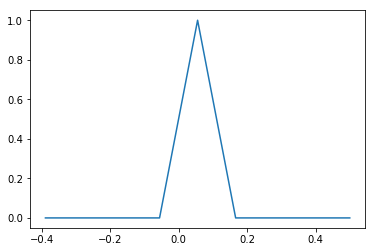

der4_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


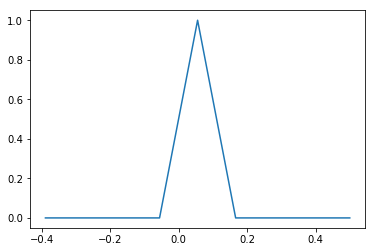

der5_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


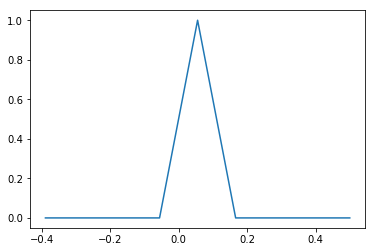

der6_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


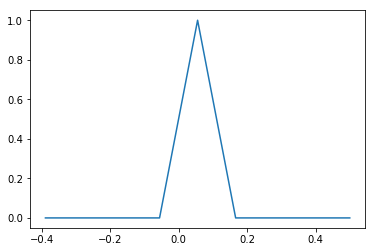

der7_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


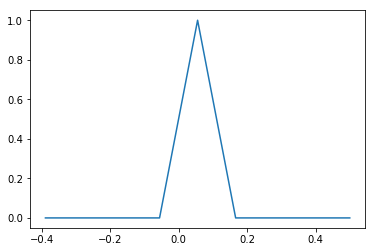

der8_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


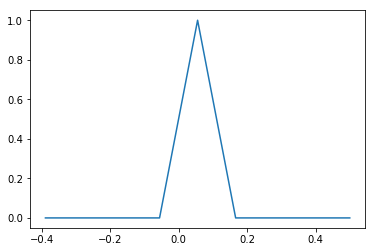

der9_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


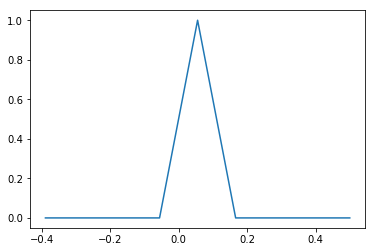

der10_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


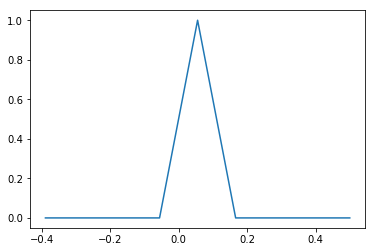

der11_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


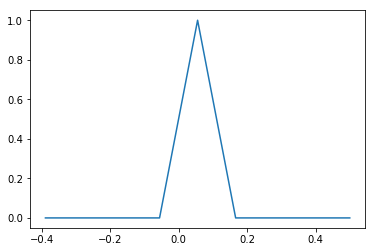

der12_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


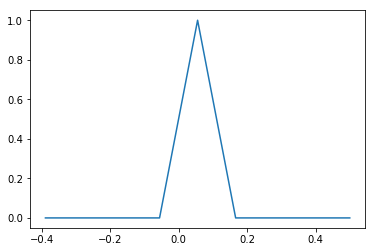

der13_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


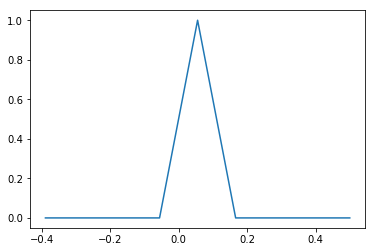

der14_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


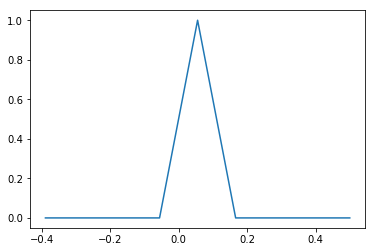

der15_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


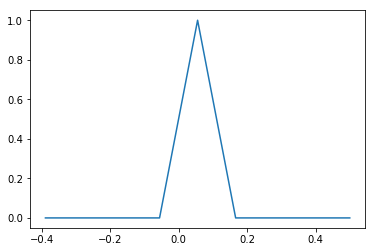

der16_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


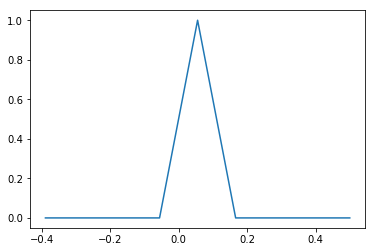

der17_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


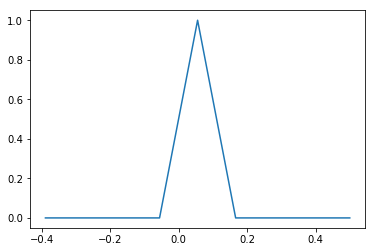

der18_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


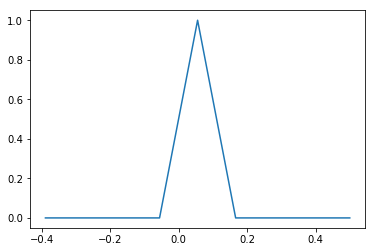

der19_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


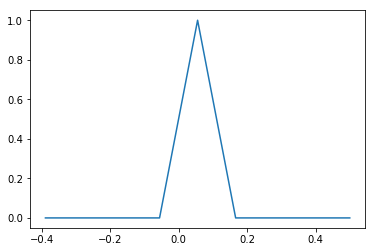

cat1_
[  8.99672315e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.27684564e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99963591  0.99963591  0.99963591  0.99963591  0.99963591  0.99963591
  0.99963591  0.99963591  1.        ]


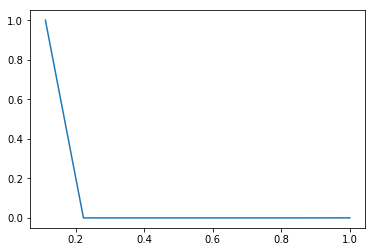

cat2_
[  8.99874664e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.25335570e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99986074  0.99986074  0.99986074  0.99986074  0.99986074  0.99986074
  0.99986074  0.99986074  1.        ]


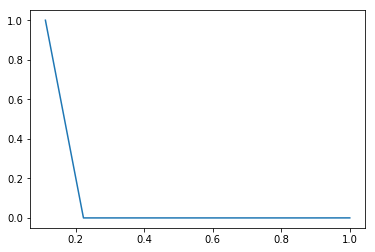

cat3_
[ 8.9122047  0.         0.         0.         0.         0.         0.         0.
  0.0877953]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99024497  0.99024497  0.99024497  0.99024497  0.99024497  0.99024497
  0.99024497  0.99024497  1.        ]


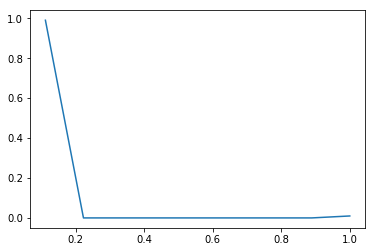

cat4_
[  8.99838423e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.61577181e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99982047  0.99982047  0.99982047  0.99982047  0.99982047  0.99982047
  0.99982047  0.99982047  1.        ]


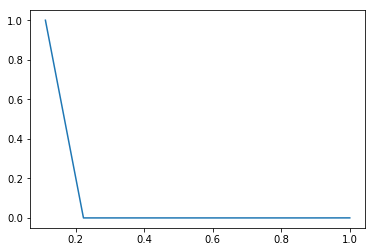

cat5_
[  8.99992450e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   7.55033557e-05]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99999161  0.99999161  0.99999161  0.99999161  0.99999161  0.99999161
  0.99999161  0.99999161  1.        ]


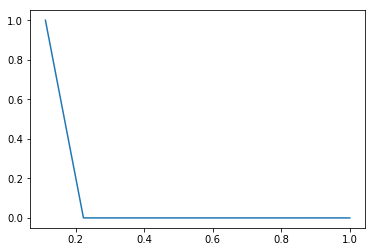

cat7_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


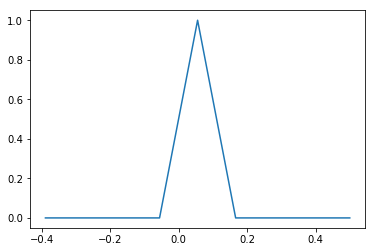

cat8_
[ 4.96920805  0.          0.          0.          0.          0.          0.
  0.          4.03079195]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.55213423  0.55213423  0.55213423  0.55213423  0.55213423  0.55213423
  0.55213423  0.55213423  1.        ]


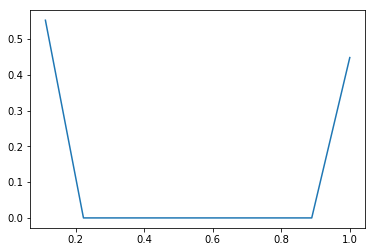

cat9_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


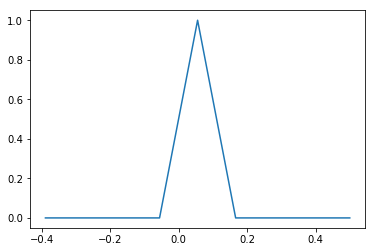

cat10_
[ 8.82629698  0.          0.          0.          0.          0.          0.
  0.          0.17370302]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.98069966  0.98069966  0.98069966  0.98069966  0.98069966  0.98069966
  0.98069966  0.98069966  1.        ]


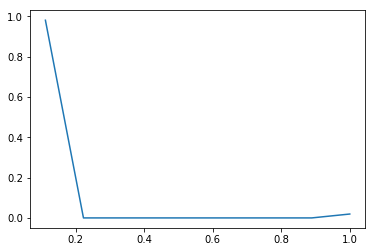

cat11_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


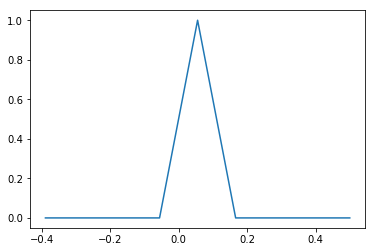

cat12_
[  8.99139262e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   8.60738255e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99904362  0.99904362  0.99904362  0.99904362  0.99904362  0.99904362
  0.99904362  0.99904362  1.        ]


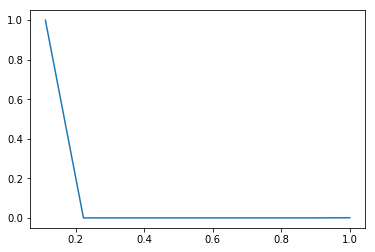

cat13_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


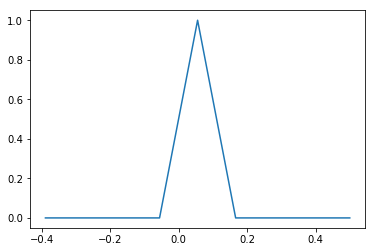

cat14_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


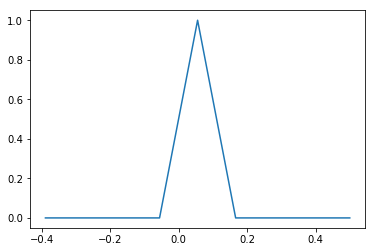

Approach number 4 mean median mode
num1
[ 0.40519847  0.3110652   0.17810594  0.11058437  0.          0.07242066
  0.13274569  0.03819823  0.03739573]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.31515436  0.55709396  0.69562081  0.78163087  0.78163087  0.83795805
  0.9412047   0.97091443  1.        ]


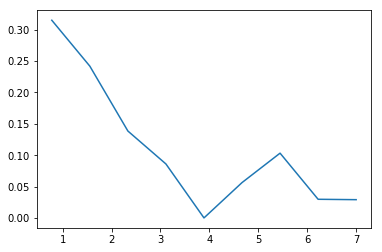

num2
[ 0.11478981  0.13208832  0.11269219  0.09240787  0.16936638  0.07197254
  0.05453264  0.03496492  0.03536714]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.14029866  0.30173993  0.43947483  0.55241779  0.75942114  0.84738758
  0.91403859  0.95677349  1.        ]


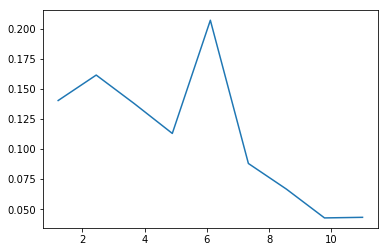

num3
[ 5.4563104  0.         0.         0.         0.         0.         0.         0.
  3.5436896]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.60625671  0.60625671  0.60625671  0.60625671  0.60625671  0.60625671
  0.60625671  0.60625671  1.        ]


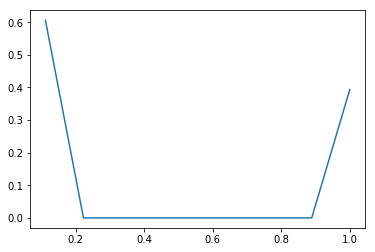

num4
[ 6.68686409  0.          0.          0.          0.          0.          0.
  0.          2.31313591]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.7429849  0.7429849  0.7429849  0.7429849  0.7429849  0.7429849
  0.7429849  0.7429849  1.       ]


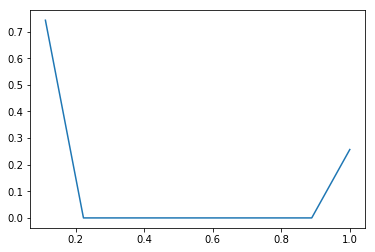

num5
[ 7.52460403  0.          0.          0.          0.          0.          0.
  0.          1.47539597]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.83606711  0.83606711  0.83606711  0.83606711  0.83606711  0.83606711
  0.83606711  0.83606711  1.        ]


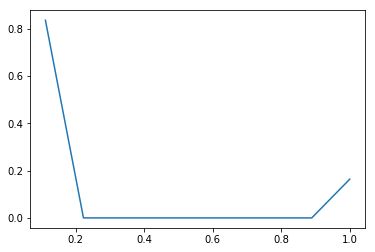

num6
[ 7.33222148  0.          0.          0.          0.          0.          0.
  0.          1.66777852]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.81469128  0.81469128  0.81469128  0.81469128  0.81469128  0.81469128
  0.81469128  0.81469128  1.        ]


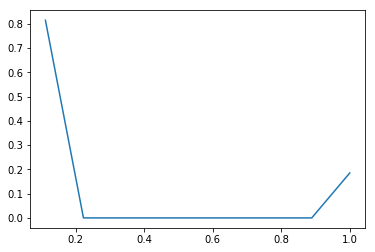

num7
[  8.99663255e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.36744966e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99962584  0.99962584  0.99962584  0.99962584  0.99962584  0.99962584
  0.99962584  0.99962584  1.        ]


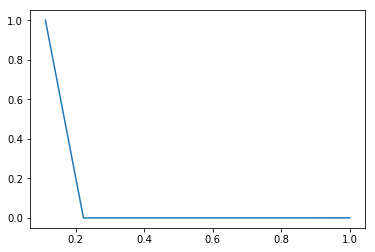

num8
[ 8.98476342  0.          0.          0.          0.          0.          0.
  0.          0.01523658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99830705  0.99830705  0.99830705  0.99830705  0.99830705  0.99830705
  0.99830705  0.99830705  1.        ]


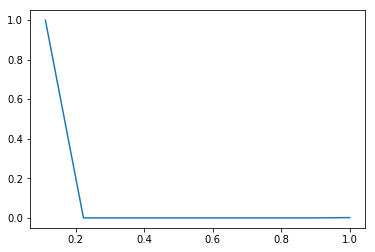

num9
[ 8.91508893  0.          0.          0.          0.          0.          0.
  0.          0.08491107]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99056544  0.99056544  0.99056544  0.99056544  0.99056544  0.99056544
  0.99056544  0.99056544  1.        ]


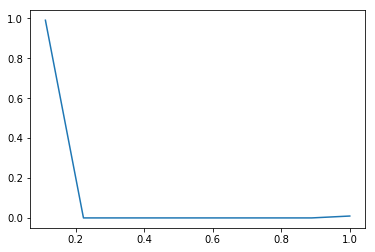

num10
[  8.99146812e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   8.53187919e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99905201  0.99905201  0.99905201  0.99905201  0.99905201  0.99905201
  0.99905201  0.99905201  1.        ]


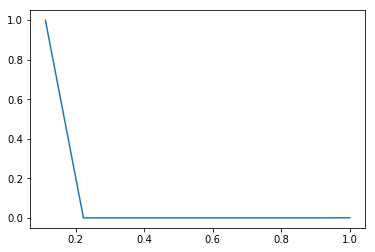

num11
[  2.22589178e+00   0.00000000e+00   2.07596477e-02   0.00000000e+00
   2.81250000e-03   0.00000000e+00   5.17197987e-04   0.00000000e+00
   1.88758389e-05]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.98928523  0.98928523  0.99851174  0.99851174  0.99976174  0.99976174
  0.99999161  0.99999161  1.        ]


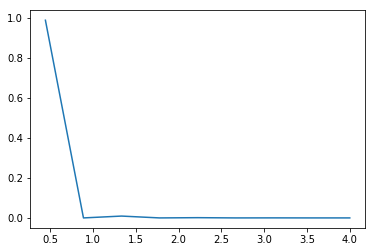

num12
[ 0.05052685  0.02172754  0.08610983  0.04949187  0.14395818  0.06931324
  0.11611371  0.06189068  0.09317579]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.07298322  0.10436745  0.22874832  0.30023658  0.50817617  0.6082953
  0.7760151   0.86541275  1.        ]


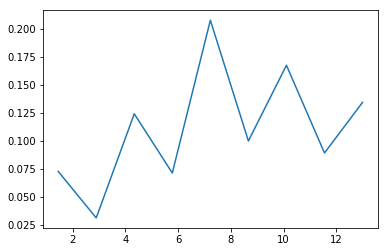

num13
[ 3.05244966  0.          0.          0.          0.          0.          0.
  0.          5.94755034]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.33916107  0.33916107  0.33916107  0.33916107  0.33916107  0.33916107
  0.33916107  0.33916107  1.        ]


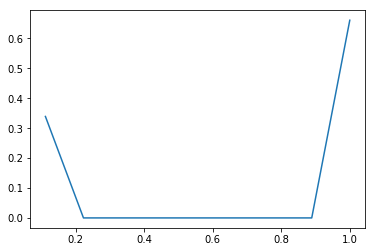

num14
[ 7.91039597  0.          0.          0.          0.          0.          0.
  0.          1.08960403]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87893289  0.87893289  0.87893289  0.87893289  0.87893289  0.87893289
  0.87893289  0.87893289  1.        ]


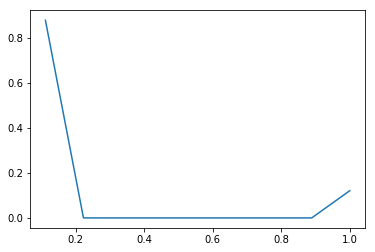

num15
[ 7.61901342  0.          0.          0.          0.          0.          0.
  0.          1.38098658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.84655705  0.84655705  0.84655705  0.84655705  0.84655705  0.84655705
  0.84655705  0.84655705  1.        ]


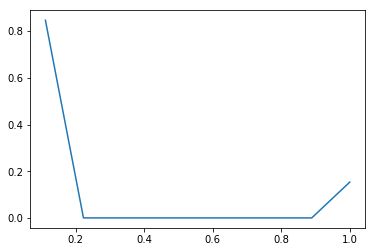

num16
[ 0.3642953   0.72557047  1.09874161  0.          0.9002349   1.48822148
  1.14088926  0.          4.28204698]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.03642953  0.10898658  0.21886074  0.21886074  0.30888423  0.45770638
  0.5717953   0.5717953   1.        ]


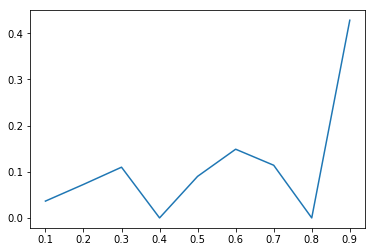

num17
[ 1.01735738  1.76348154  1.08987416  0.17823826  0.30828859  0.33372483
  0.1565604   0.04907718  0.10339765]
[ 0.   0.2  0.4  0.6  0.8  1.   1.2  1.4  1.6  1.8]
[ 0.20347148  0.55616779  0.77414262  0.80979027  0.87144799  0.93819295
  0.96950503  0.97932047  1.        ]


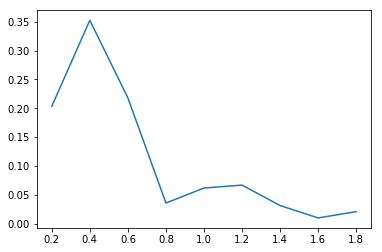

num18
[  1.11996963e-01   1.49221315e+00   4.63230133e-01   1.68504280e-01
   2.48911675e-02   2.12267927e-03   1.82269419e-04   2.27836773e-05
   1.51891182e-05]
[ 0.06123724  0.50309366  0.94495008  1.3868065   1.82866292  2.27051934
  2.71237576  3.15423218  3.5960886   4.03794502]
[ 0.04948658  0.70883054  0.91351174  0.98796644  0.99896477  0.99990268
  0.99998322  0.99999329  1.        ]


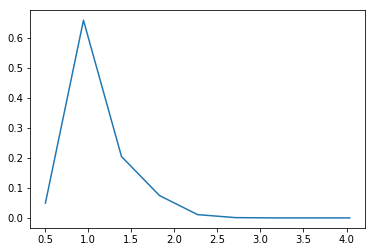

num19
[  1.30973154e-01   0.00000000e+00   0.00000000e+00   3.07192953e-01
   0.00000000e+00   0.00000000e+00   9.54352349e-01   2.51677852e-05
   1.60745638e+00]
[ 0.          0.33333333  0.66666667  1.          1.33333333  1.66666667
  2.          2.33333333  2.66666667  3.        ]
[ 0.04365772  0.04365772  0.04365772  0.14605537  0.14605537  0.14605537
  0.46417282  0.46418121  1.        ]


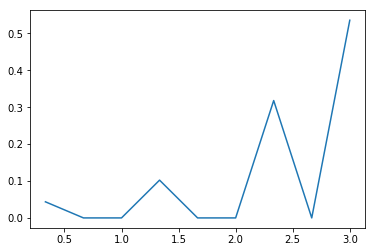

num20
[  7.77776344e-04   2.63714143e+00   4.73178387e+00   3.44140106e-01
   1.00851666e-02   1.49073799e-03   0.00000000e+00   0.00000000e+00
   4.92591684e-04]
[ 0.1         0.22943456  0.35886913  0.48830369  0.61773825  0.74717281
  0.87660738  1.00604194  1.1354765   1.26491106]
[  1.00671141e-04   3.41437919e-01   9.53894295e-01   9.98437919e-01
   9.99743289e-01   9.99936242e-01   9.99936242e-01   9.99936242e-01
   1.00000000e+00]


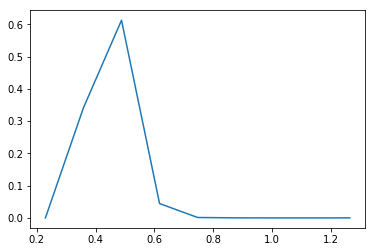

num21
[  4.62205815e-01   1.78143611e+00   2.84879902e-01   5.51630331e-02
   8.08558816e-03   1.47960171e-03   3.48141578e-04   3.48141578e-05
   2.17588487e-05]
[ 0.25061907  0.63617539  1.02173172  1.40728805  1.79284437  2.1784007
  2.56395702  2.94951335  3.33506968  3.720626  ]
[ 0.17820638  0.86505034  0.97488758  0.99615604  0.99927349  0.99984396
  0.99997819  0.99999161  1.        ]


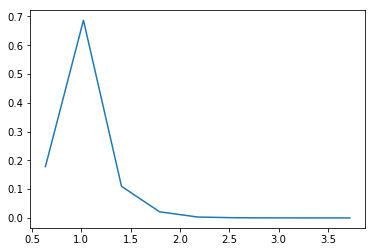

num22
[  2.26430562e-03   1.39584410e-02   1.52482353e-02   3.45842588e+00
   1.02410531e+01   2.74468236e+00   3.68422588e-01   2.36892227e-01
   1.66240159e-03]
[ 0.10954451  0.16808358  0.22662264  0.28516171  0.34370077  0.40223984
  0.46077891  0.51931797  0.57785704  0.6363961 ]
[  1.32550336e-04   9.49664430e-04   1.84228188e-03   2.04295302e-01
   8.03796980e-01   9.64468121e-01   9.86035235e-01   9.99902685e-01
   1.00000000e+00]


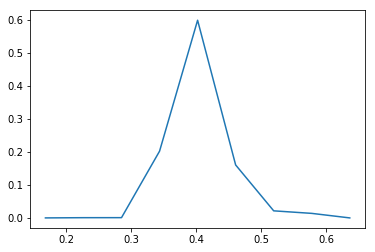

num23
[ 0.05734502  0.          0.0271167   0.02632164  0.09525352  0.1609971
  0.3195283   0.72976175  0.98902713]
[ 0.          0.41573971  0.83147942  1.24721913  1.66295884  2.07869855
  2.49443826  2.91017797  3.32591768  3.74165739]
[ 0.0238406   0.0238406   0.03511409  0.04605705  0.08565772  0.1525906
  0.28543121  0.58882215  1.        ]


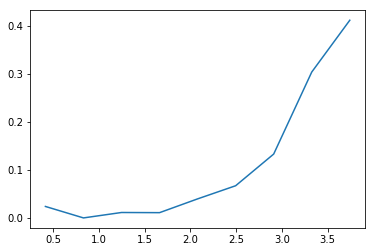

der1
[ 1.00446309  0.99966443  1.99724832  0.          0.99555369  2.00659396
  1.00062081  0.          1.9958557 ]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10044631  0.20041275  0.40013758  0.40013758  0.49969295  0.70035235
  0.80041443  0.80041443  1.        ]


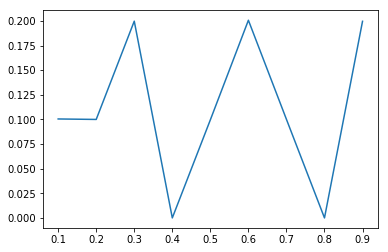

der2
[ 1.00177852  0.99781879  1.99901007  0.          1.00493289  2.00877517
  0.99964765  0.          1.98803691]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10017785  0.19995973  0.39986074  0.39986074  0.50035403  0.70123154
  0.80119631  0.80119631  1.        ]


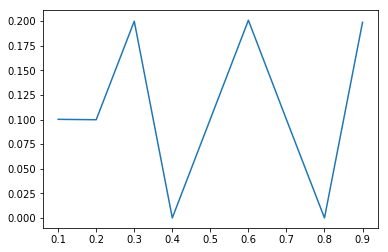

der3
[ 0.99666107  1.00894295  1.99874161  0.          0.99496644  2.005
  0.99758389  0.          1.99810403]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.09966611  0.2005604   0.40043456  0.40043456  0.49993121  0.70043121
  0.8001896   0.8001896   1.        ]


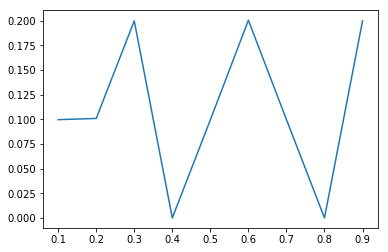

der4
[ 0.07228691  0.32664262  0.          0.58660369  0.          0.53074027
  0.          0.24079228  0.04293423]
[ 0.          0.55555556  1.11111111  1.66666667  2.22222222  2.77777778
  3.33333333  3.88888889  4.44444444  5.        ]
[ 0.0401594   0.22162752  0.22162752  0.54751846  0.54751846  0.84237416
  0.84237416  0.97614765  1.        ]


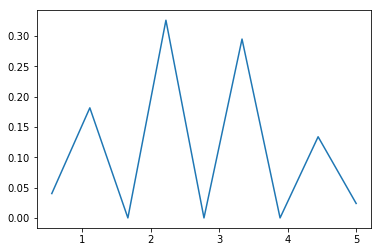

der5
[ 0.15430117  0.43060822  0.          0.49186661  0.30032215  0.
  0.10251091  0.01898406  0.00140688]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.10286745  0.3899396   0.3899396   0.71785067  0.91806544  0.91806544
  0.98640604  0.99906208  1.        ]


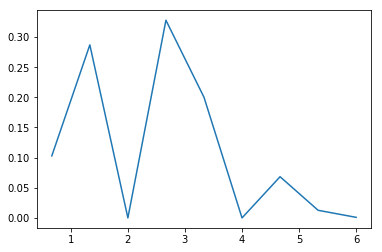

der6
[  1.05704698e-05   1.99328859e-04   1.81208054e-03   1.01431208e-02
   4.02372483e-02   1.11065436e-01   2.11320302e-01   2.64672483e-01
   2.60539430e-01]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[  1.17449664e-05   2.33221477e-04   2.24664430e-03   1.35167785e-02
   5.82248322e-02   1.81630872e-01   4.16431208e-01   7.10511745e-01
   1.00000000e+00]


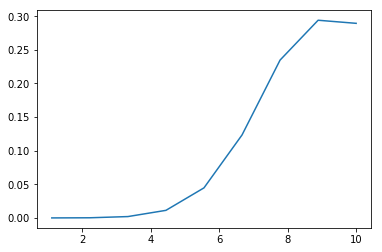

der7
[ 0.02568624  0.11643456  0.23373993  0.27285403  0.20502013  0.10366275
  0.03428356  0.00736074  0.00095805]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.02568624  0.14212081  0.37586074  0.64871477  0.8537349   0.95739765
  0.99168121  0.99904195  1.        ]


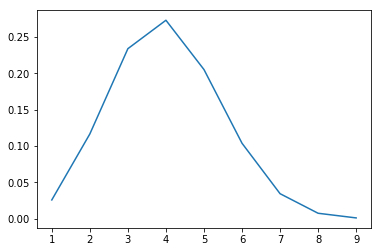

der8
[  1.52516779e-04   1.27147651e-03   6.75151007e-03   2.59716443e-02
   7.49340604e-02   1.55663758e-01   2.29471309e-01   2.28791779e-01
   1.76991946e-01]
[  2.           3.11111111   4.22222222   5.33333333   6.44444444
   7.55555556   8.66666667   9.77777778  10.88888889  12.        ]
[  1.69463087e-04   1.58221477e-03   9.08389262e-03   3.79412752e-02
   1.21201342e-01   2.94161074e-01   5.49129195e-01   8.03342282e-01
   1.00000000e+00]


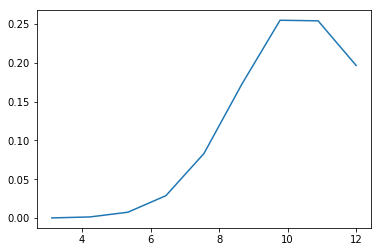

der9
[ 0.07450671  0.26219942  0.39428715  0.33013303  0.          0.16621956
  0.04962943  0.00816731  0.00057167]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.05794966  0.26188255  0.56855034  0.82532047  0.82532047  0.95460235
  0.99320302  0.99955537  1.        ]


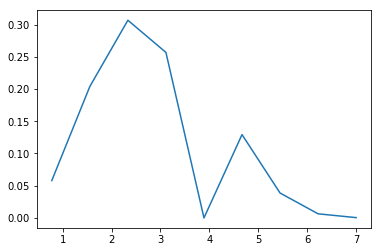

der10
[  3.51181208e-03   5.22344295e-02   1.35866779e-01   1.15905503e-01
   3.48499329e-02   1.54280537e-02   2.03496644e-03   1.61275168e-04
   7.24832215e-06]
[  0.           2.77777778   5.55555556   8.33333333  11.11111111
  13.88888889  16.66666667  19.44444444  22.22222222  25.        ]
[ 0.00975503  0.15485067  0.53225839  0.85421812  0.95102349  0.99387919
  0.99953188  0.99997987  1.        ]


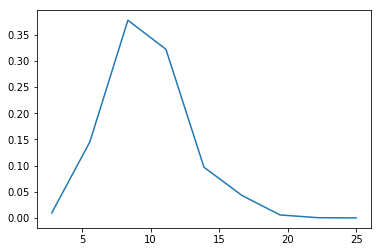

der11
[  4.36592194e-02   1.30036648e-01   1.55696662e-01   9.64893147e-02
   3.66580714e-02   9.15657012e-03   1.75565171e-03   2.05051219e-04
   2.70222536e-05]
[  0.           2.11111111   4.22222222   6.33333333   8.44444444
  10.55555556  12.66666667  14.77777778  16.88888889  19.        ]
[ 0.09216946  0.36669128  0.69538423  0.89908389  0.97647315  0.99580369
  0.99951007  0.99994295  1.        ]


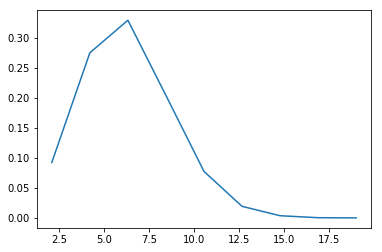

der12
[  5.20559396e-01   2.19741946e-01   1.06382718e-01   3.89808725e-02
   1.10234899e-02   2.60486577e-03   5.85906040e-04   9.96644295e-05
   2.11409396e-05]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[ 0.57839933  0.82255705  0.94076007  0.98407215  0.99632047  0.99921477
  0.99986577  0.99997651  1.        ]


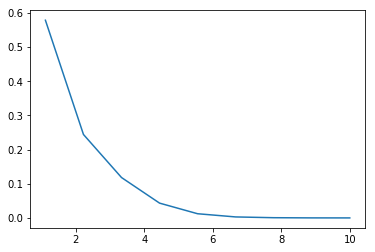

der13
[  1.51566598e-01   1.62077827e-01   2.65374548e-01   6.34588281e-02
   4.34295302e-02   4.51393908e-03   1.75632421e-03   1.02219928e-04
   2.78781621e-05]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.21892953  0.45304195  0.83636074  0.92802349  0.99075503  0.99727517
  0.99981208  0.99995973  1.        ]


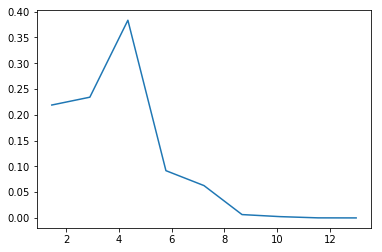

der14
[  7.65997957e-03   8.51040998e-02   1.10167275e-01   1.33256201e-01
   3.78521301e-02   1.53534432e-02   1.57834841e-03   3.17114094e-04
   1.57572221e-05]
[  0.           2.55555556   5.11111111   7.66666667  10.22222222
  12.77777778  15.33333333  17.88888889  20.44444444  23.        ]
[ 0.0195755   0.23706376  0.51860235  0.85914597  0.95587919  0.99511577
  0.99914933  0.99995973  1.        ]


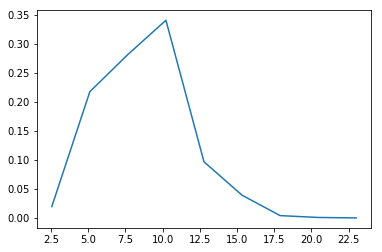

der15
[ 7.89813423  0.          0.          0.          0.          0.          0.
  0.          1.10186577]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87757047  0.87757047  0.87757047  0.87757047  0.87757047  0.87757047
  0.87757047  0.87757047  1.        ]


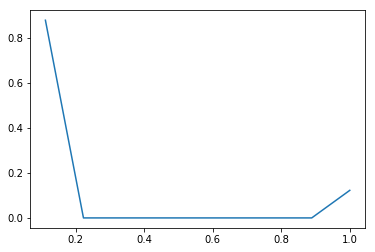

der16
[ 3.34988758  0.          0.          0.          0.          0.          0.
  0.          5.65011242]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.37220973  0.37220973  0.37220973  0.37220973  0.37220973  0.37220973
  0.37220973  0.37220973  1.        ]


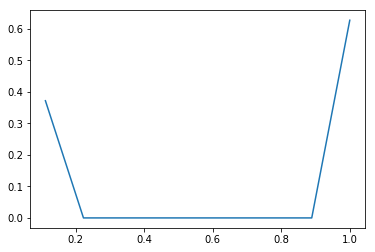

der17
[ 4.01236913  0.          0.          0.          0.          0.          0.
  0.          4.98763087]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.44581879  0.44581879  0.44581879  0.44581879  0.44581879  0.44581879
  0.44581879  0.44581879  1.        ]


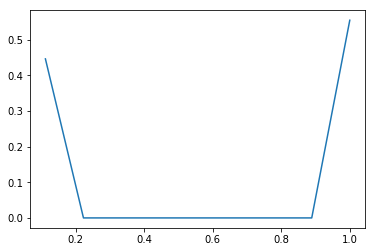

der18
[ 6.41493121  0.          0.          0.          0.          0.          0.
  0.          2.58506879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.71277013  0.71277013  0.71277013  0.71277013  0.71277013  0.71277013
  0.71277013  0.71277013  1.        ]


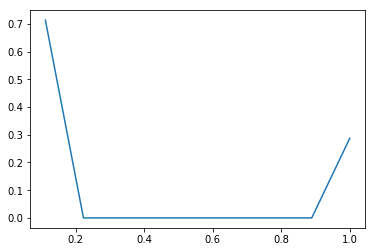

der19
[ 5.85918121  0.          0.          0.          0.          0.          0.
  0.          3.14081879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.65102013  0.65102013  0.65102013  0.65102013  0.65102013  0.65102013
  0.65102013  0.65102013  1.        ]


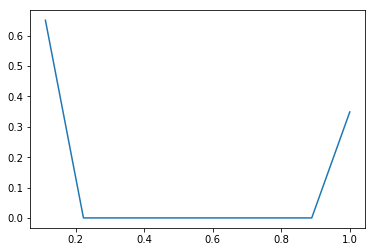

cat1
[  2.17666107e+00   1.09228188e-03   0.00000000e+00   6.22832215e-01
   0.00000000e+00   0.00000000e+00   1.42072148e-01   0.00000000e+00
   5.73422819e-02]
[ 1.          1.33333333  1.66666667  2.          2.33333333  2.66666667
  3.          3.33333333  3.66666667  4.        ]
[ 0.72555369  0.72591779  0.72591779  0.93352852  0.93352852  0.93352852
  0.98088591  0.98088591  1.        ]


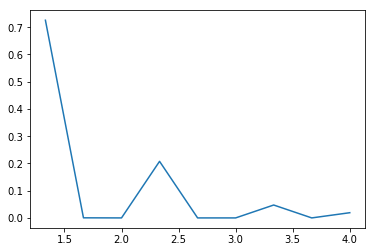

cat2
[  5.24613926e+00   0.00000000e+00   0.00000000e+00   1.25335570e-03
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.75260738e+00]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.58290436  0.58290436  0.58290436  0.58304362  0.58304362  0.58304362
  0.58304362  0.58304362  1.        ]


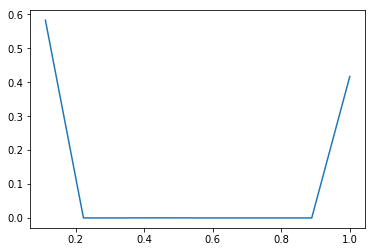

cat3
[ 1.34526342  0.02096728  0.          0.01053523  0.02074581  0.
  0.04623826  0.00415772  0.05209228]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.89684228  0.91082047  0.91082047  0.91784396  0.9316745   0.9316745
  0.9625      0.96527181  1.        ]


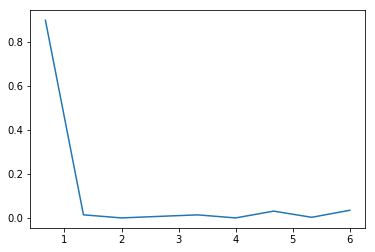

cat4
[ 0.00999939  0.00294326  0.00915101  0.03598627  0.11070439  0.24639353
  0.02088835  0.02793487  0.35418075]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.01222148  0.01581879  0.02700336  0.07098658  0.20629195  0.5074396
  0.5329698   0.56711242  1.        ]


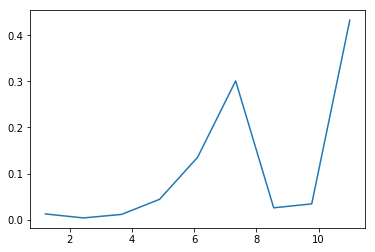

cat5
[  1.53019631e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   7.55033557e-05
   7.46972819e+00]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.17002181  0.17002181  0.17002181  0.17002181  0.17002181  0.17002181
  0.17002181  0.1700302   1.        ]


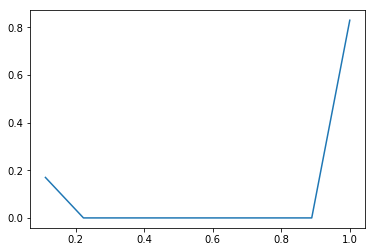

cat7
[  8.34305369e-01   5.39496644e-02   3.99395973e-02   1.07382550e-03
   3.85906040e-04   9.17785235e-04   2.61912752e-03   2.33221477e-04
   6.65755034e-02]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.83430537  0.88825503  0.92819463  0.92926846  0.92965436  0.93057215
  0.93319128  0.9334245   1.        ]


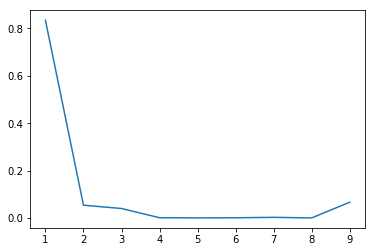

cat8
[ 2.35855872  0.          0.          0.          4.03079195  0.          0.
  0.          2.61064933]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.26206208  0.26206208  0.26206208  0.26206208  0.70992785  0.70992785
  0.70992785  0.70992785  1.        ]


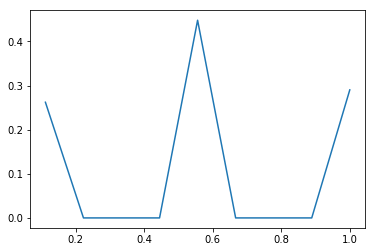

cat9
[ 0.20352685  0.01210008  0.02893999  0.03300296  0.01692252  0.14675987
  0.00767647  0.07201865  0.00846437]
[  0.           1.88888889   3.77777778   5.66666667   7.55555556
   9.44444444  11.33333333  13.22222222  15.11111111  17.        ]
[ 0.3844396   0.4072953   0.46195973  0.52429866  0.55626342  0.83347651
  0.84797651  0.98401174  1.        ]


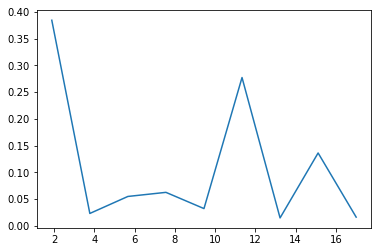

cat10
[ 0.46242785  0.          0.          0.          0.          0.          0.
  0.          8.53757215]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.05138087  0.05138087  0.05138087  0.05138087  0.05138087  0.05138087
  0.05138087  0.05138087  1.        ]


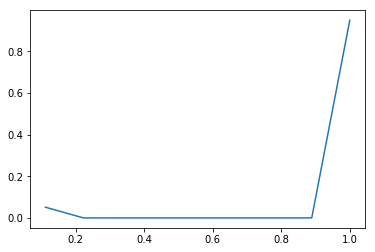

cat11
[ 1.51130537  0.          0.          0.          0.          0.          0.
  0.          7.48869463]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.16792282  0.16792282  0.16792282  0.16792282  0.16792282  0.16792282
  0.16792282  0.16792282  1.        ]


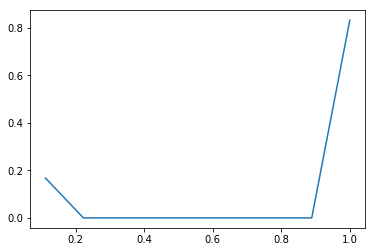

cat12
[  7.35259228e-01   0.00000000e+00   1.11888423e-01   1.96308725e-04
   1.33626594e+00   0.00000000e+00   5.57781040e-02   0.00000000e+00
   1.06119966e-02]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.32678188  0.32678188  0.37651007  0.37659732  0.97049329  0.97049329
  0.99528356  0.99528356  1.        ]


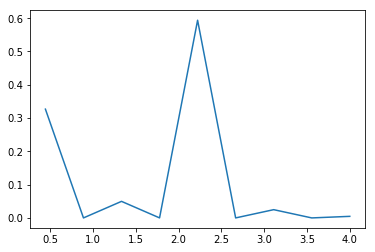

cat13
[  3.67172819e-02   0.00000000e+00   0.00000000e+00   0.00000000e+00
   4.46195386e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.32885906e-03]
[ 0.          0.22222222  0.44444444  0.66666667  0.88888889  1.11111111
  1.33333333  1.55555556  1.77777778  2.        ]
[ 0.0081594  0.0081594  0.0081594  0.0081594  0.9997047  0.9997047
  0.9997047  0.9997047  1.       ]


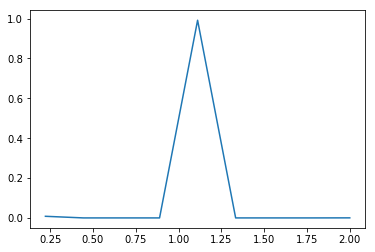

cat14
[ 0.00861647  0.00578971  0.00905043  0.00790982  0.00615521  0.01029235
  0.00628261  0.01103859  0.02224344]
[   1.           12.44444444   23.88888889   35.33333333   46.77777778
   58.22222222   69.66666667   81.11111111   92.55555556  104.        ]
[ 0.09861074  0.16487081  0.26844799  0.35897148  0.42941443  0.5472047
  0.6191057   0.74543624  1.        ]


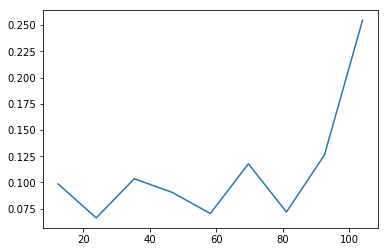

num1_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


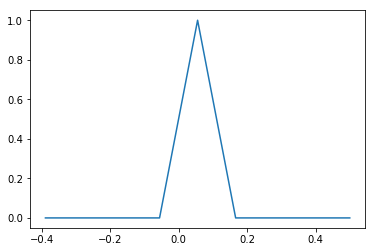

num2_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


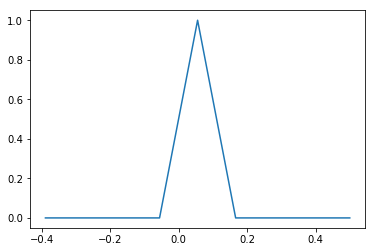

num3_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


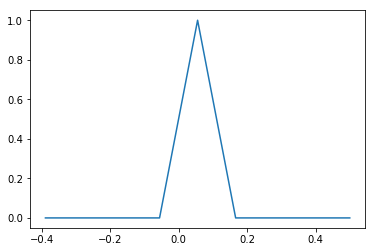

num4_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


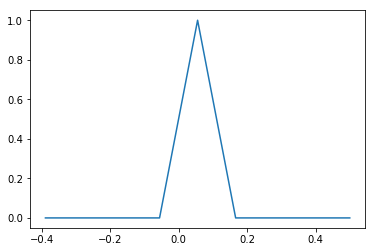

num5_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


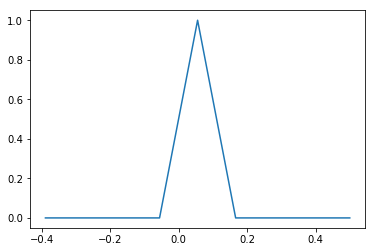

num6_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


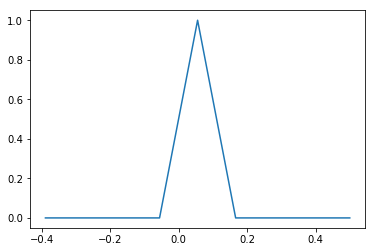

num7_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


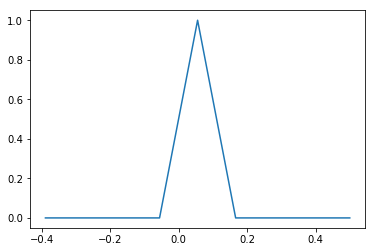

num8_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


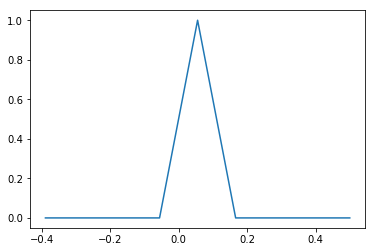

num9_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


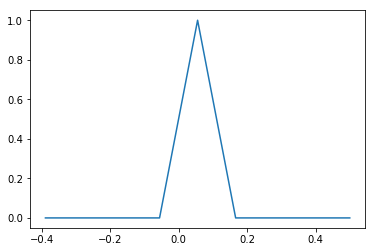

num10_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


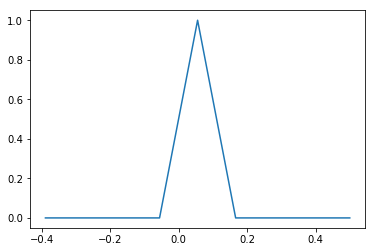

num11_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


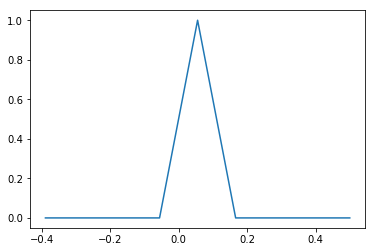

num12_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


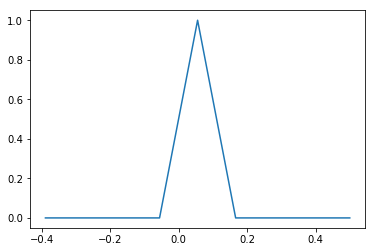

num13_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


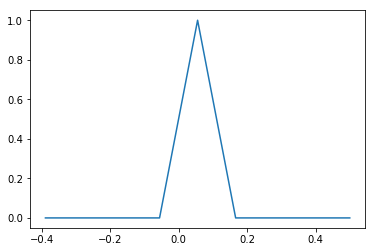

num14_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


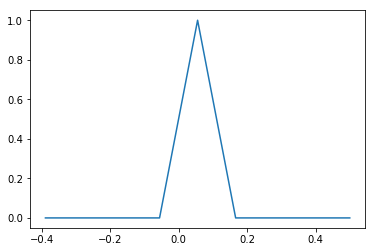

num15_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


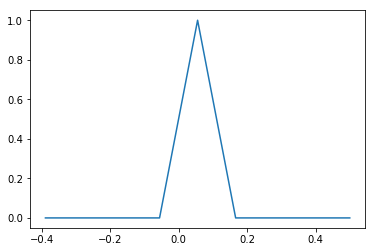

num16_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


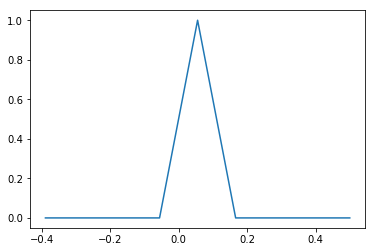

num17_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


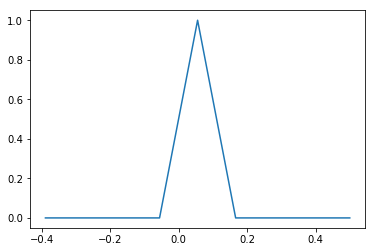

num18_
[ 7.37050168  0.          0.          0.          0.          0.          0.
  0.          1.62949832]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.81894463  0.81894463  0.81894463  0.81894463  0.81894463  0.81894463
  0.81894463  0.81894463  1.        ]


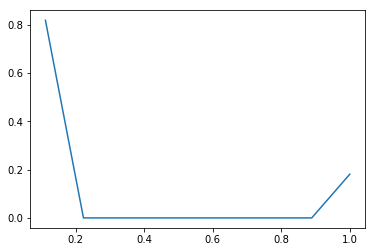

num19_
[  8.99992450e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   7.55033557e-05]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99999161  0.99999161  0.99999161  0.99999161  0.99999161  0.99999161
  0.99999161  0.99999161  1.        ]


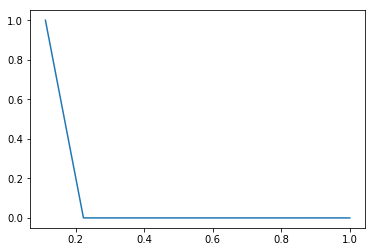

num20_
[  8.99998490e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.51006711e-05]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99999832  0.99999832  0.99999832  0.99999832  0.99999832  0.99999832
  0.99999832  0.99999832  1.        ]


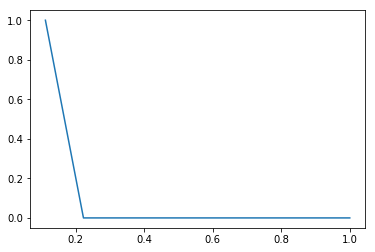

num21_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


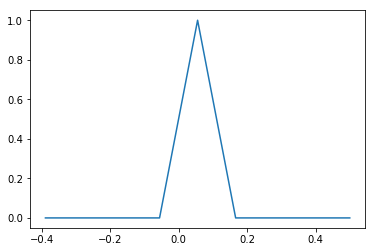

num22_
[ 8.35569966  0.          0.          0.          0.          0.          0.
  0.          0.64430034]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.92841107  0.92841107  0.92841107  0.92841107  0.92841107  0.92841107
  0.92841107  0.92841107  1.        ]


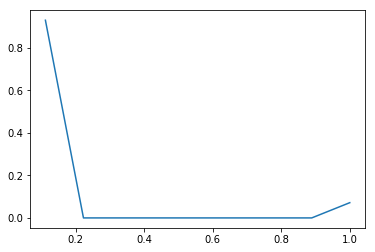

num23_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


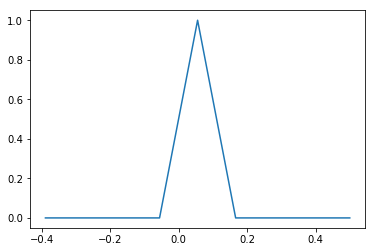

der1_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


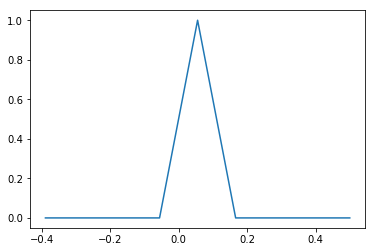

der2_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


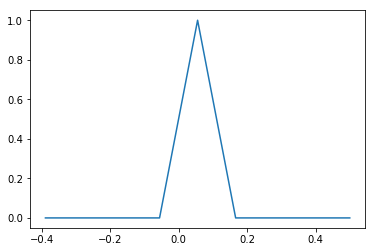

der3_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


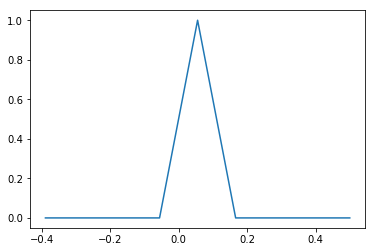

der4_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


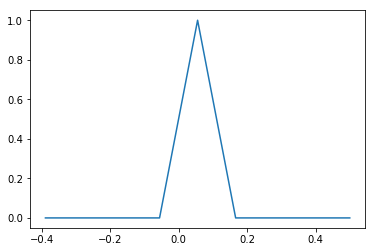

der5_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


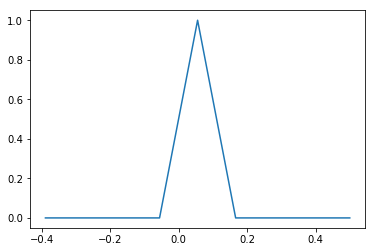

der6_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


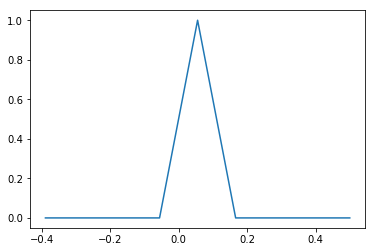

der7_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


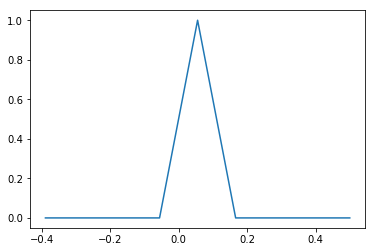

der8_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


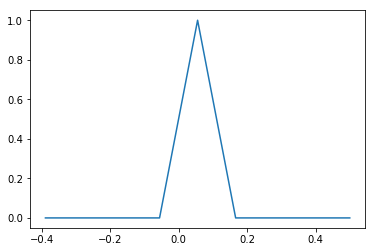

der9_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


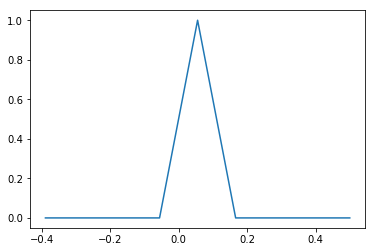

der10_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


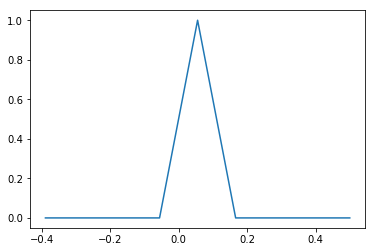

der11_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


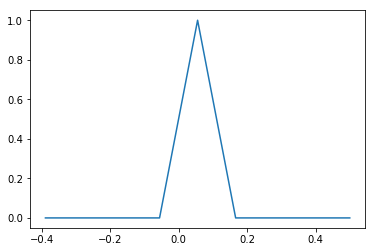

der12_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


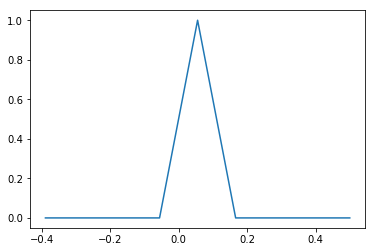

der13_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


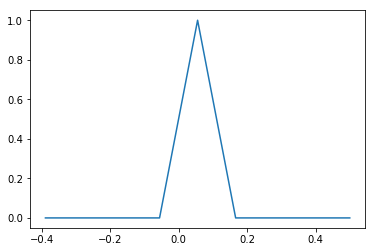

der14_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


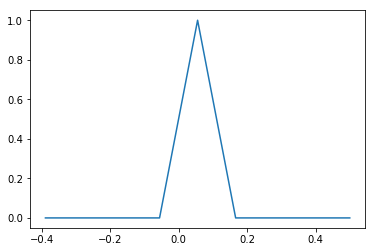

der15_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


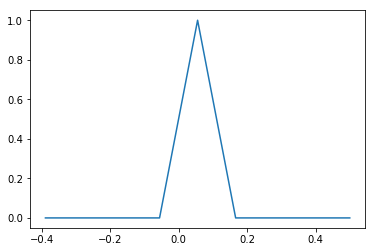

der16_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


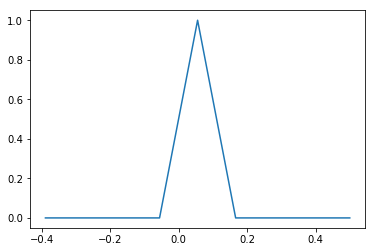

der17_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


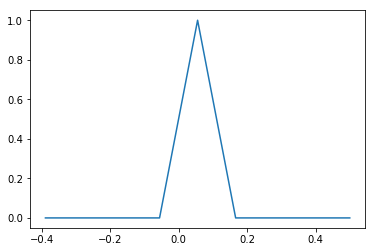

der18_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


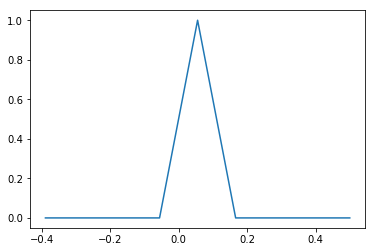

der19_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


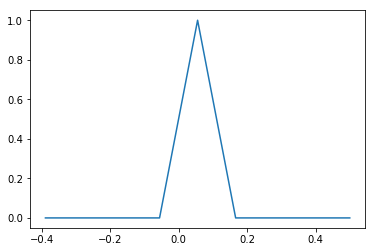

cat1_
[  8.99672315e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.27684564e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99963591  0.99963591  0.99963591  0.99963591  0.99963591  0.99963591
  0.99963591  0.99963591  1.        ]


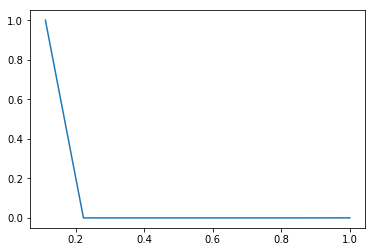

cat2_
[  8.99874664e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.25335570e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99986074  0.99986074  0.99986074  0.99986074  0.99986074  0.99986074
  0.99986074  0.99986074  1.        ]


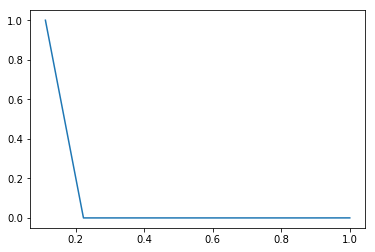

cat3_
[ 8.9122047  0.         0.         0.         0.         0.         0.         0.
  0.0877953]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99024497  0.99024497  0.99024497  0.99024497  0.99024497  0.99024497
  0.99024497  0.99024497  1.        ]


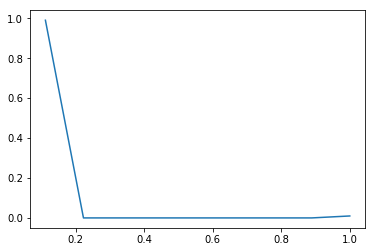

cat4_
[  8.99838423e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.61577181e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99982047  0.99982047  0.99982047  0.99982047  0.99982047  0.99982047
  0.99982047  0.99982047  1.        ]


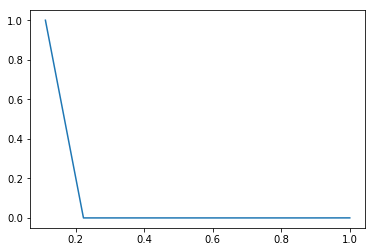

cat5_
[  8.99992450e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   7.55033557e-05]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99999161  0.99999161  0.99999161  0.99999161  0.99999161  0.99999161
  0.99999161  0.99999161  1.        ]


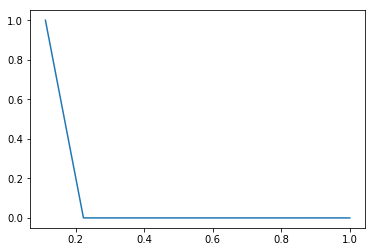

cat7_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


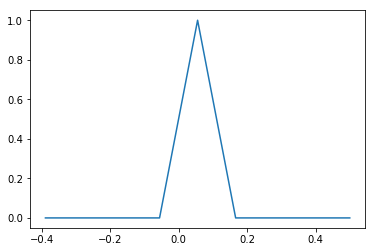

cat8_
[ 4.96920805  0.          0.          0.          0.          0.          0.
  0.          4.03079195]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.55213423  0.55213423  0.55213423  0.55213423  0.55213423  0.55213423
  0.55213423  0.55213423  1.        ]


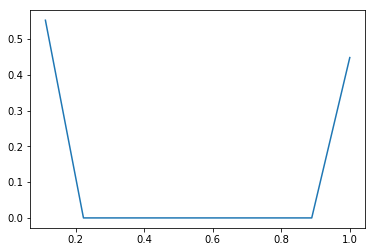

cat9_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


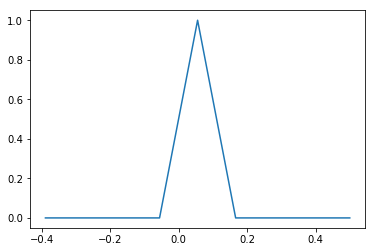

cat10_
[ 8.82629698  0.          0.          0.          0.          0.          0.
  0.          0.17370302]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.98069966  0.98069966  0.98069966  0.98069966  0.98069966  0.98069966
  0.98069966  0.98069966  1.        ]


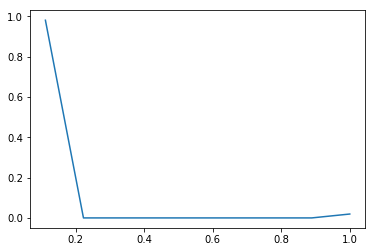

cat11_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


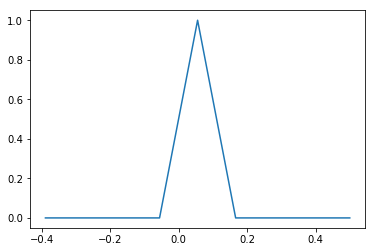

cat12_
[  8.99139262e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   8.60738255e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99904362  0.99904362  0.99904362  0.99904362  0.99904362  0.99904362
  0.99904362  0.99904362  1.        ]


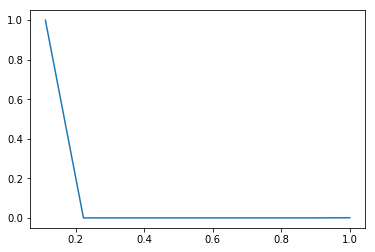

cat13_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


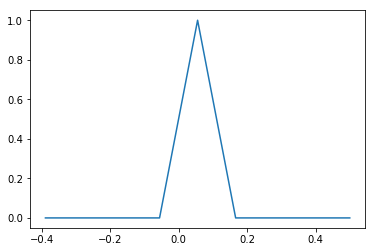

cat14_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


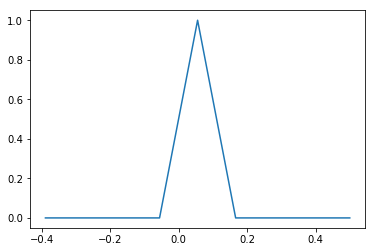

num1
[ 0.40519847  0.3110652   0.17810594  0.11058437  0.          0.07242066
  0.13274569  0.03819823  0.03739573]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.31515436  0.55709396  0.69562081  0.78163087  0.78163087  0.83795805
  0.9412047   0.97091443  1.        ]


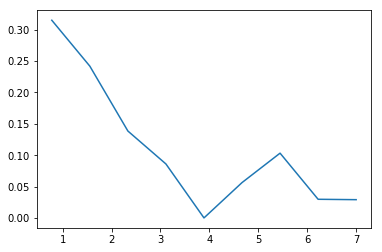

num2
[ 0.11478981  0.13208832  0.11269219  0.09240787  0.16936638  0.07197254
  0.05453264  0.03496492  0.03536714]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.14029866  0.30173993  0.43947483  0.55241779  0.75942114  0.84738758
  0.91403859  0.95677349  1.        ]


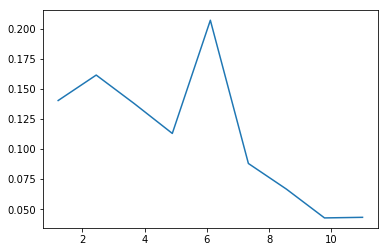

num3
[ 5.4563104  0.         0.         0.         0.         0.         0.         0.
  3.5436896]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.60625671  0.60625671  0.60625671  0.60625671  0.60625671  0.60625671
  0.60625671  0.60625671  1.        ]


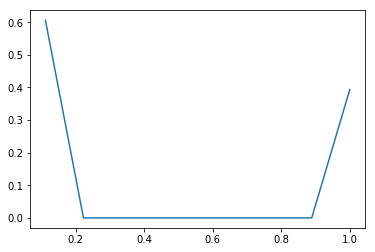

num4
[ 6.68686409  0.          0.          0.          0.          0.          0.
  0.          2.31313591]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.7429849  0.7429849  0.7429849  0.7429849  0.7429849  0.7429849
  0.7429849  0.7429849  1.       ]


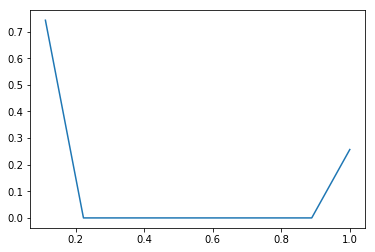

num5
[ 7.52460403  0.          0.          0.          0.          0.          0.
  0.          1.47539597]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.83606711  0.83606711  0.83606711  0.83606711  0.83606711  0.83606711
  0.83606711  0.83606711  1.        ]


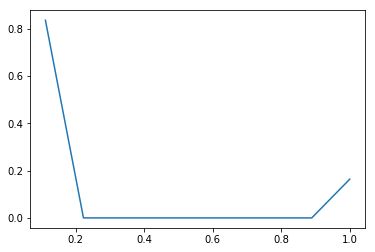

num6
[ 7.33222148  0.          0.          0.          0.          0.          0.
  0.          1.66777852]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.81469128  0.81469128  0.81469128  0.81469128  0.81469128  0.81469128
  0.81469128  0.81469128  1.        ]


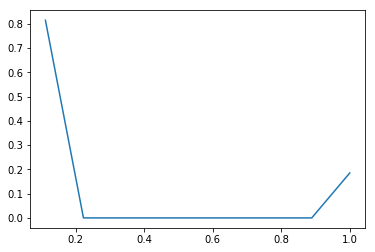

num7
[  8.99663255e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.36744966e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99962584  0.99962584  0.99962584  0.99962584  0.99962584  0.99962584
  0.99962584  0.99962584  1.        ]


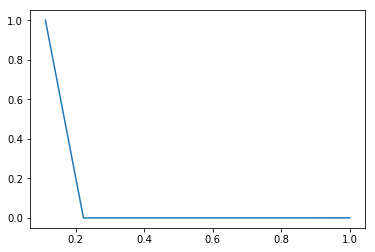

num8
[ 8.98476342  0.          0.          0.          0.          0.          0.
  0.          0.01523658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99830705  0.99830705  0.99830705  0.99830705  0.99830705  0.99830705
  0.99830705  0.99830705  1.        ]


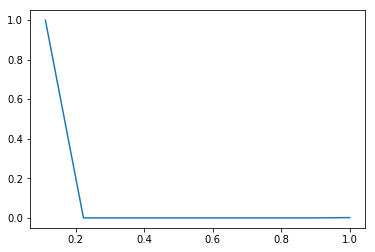

num9
[ 8.91508893  0.          0.          0.          0.          0.          0.
  0.          0.08491107]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99056544  0.99056544  0.99056544  0.99056544  0.99056544  0.99056544
  0.99056544  0.99056544  1.        ]


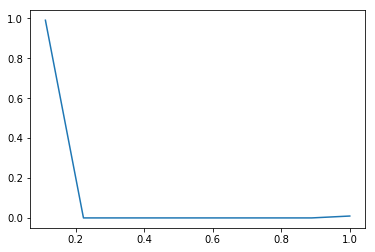

num10
[  8.99146812e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   8.53187919e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99905201  0.99905201  0.99905201  0.99905201  0.99905201  0.99905201
  0.99905201  0.99905201  1.        ]


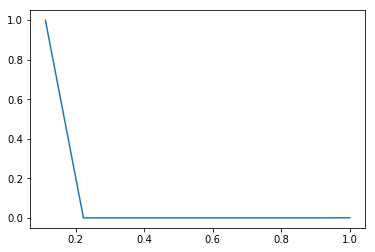

num11
[  2.22589178e+00   0.00000000e+00   2.07596477e-02   0.00000000e+00
   2.81250000e-03   0.00000000e+00   5.17197987e-04   0.00000000e+00
   1.88758389e-05]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.98928523  0.98928523  0.99851174  0.99851174  0.99976174  0.99976174
  0.99999161  0.99999161  1.        ]


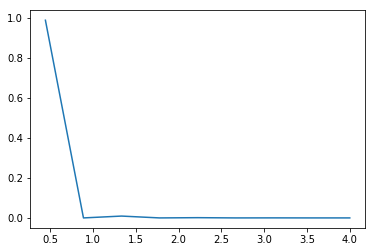

num12
[ 0.05052685  0.02172754  0.08610983  0.04949187  0.14395818  0.06931324
  0.11611371  0.06189068  0.09317579]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.07298322  0.10436745  0.22874832  0.30023658  0.50817617  0.6082953
  0.7760151   0.86541275  1.        ]


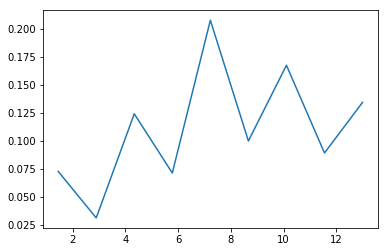

num13
[ 3.05244966  0.          0.          0.          0.          0.          0.
  0.          5.94755034]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.33916107  0.33916107  0.33916107  0.33916107  0.33916107  0.33916107
  0.33916107  0.33916107  1.        ]


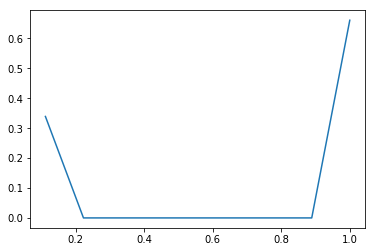

num14
[ 7.91039597  0.          0.          0.          0.          0.          0.
  0.          1.08960403]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87893289  0.87893289  0.87893289  0.87893289  0.87893289  0.87893289
  0.87893289  0.87893289  1.        ]


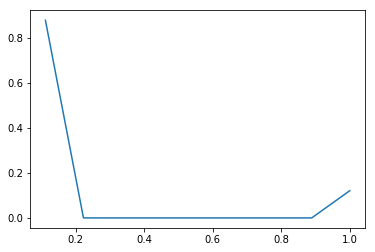

num15
[ 7.61901342  0.          0.          0.          0.          0.          0.
  0.          1.38098658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.84655705  0.84655705  0.84655705  0.84655705  0.84655705  0.84655705
  0.84655705  0.84655705  1.        ]


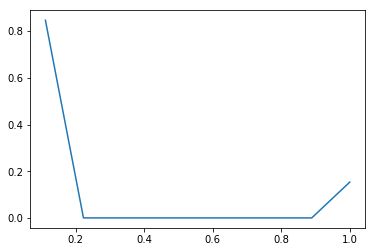

num16
[ 0.3642953   0.72557047  1.09874161  0.          0.9002349   1.48822148
  1.14088926  0.          4.28204698]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.03642953  0.10898658  0.21886074  0.21886074  0.30888423  0.45770638
  0.5717953   0.5717953   1.        ]


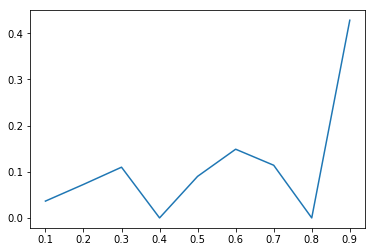

num17
[ 1.01735738  1.76348154  1.08987416  0.17823826  0.30828859  0.33372483
  0.1565604   0.04907718  0.10339765]
[ 0.   0.2  0.4  0.6  0.8  1.   1.2  1.4  1.6  1.8]
[ 0.20347148  0.55616779  0.77414262  0.80979027  0.87144799  0.93819295
  0.96950503  0.97932047  1.        ]


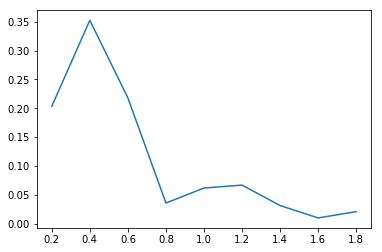

num18
[  1.11996963e-01   1.50383662e+00   4.51606660e-01   1.68504280e-01
   2.48911675e-02   2.12267927e-03   1.82269419e-04   2.27836773e-05
   1.51891182e-05]
[ 0.06123724  0.50309366  0.94495008  1.3868065   1.82866292  2.27051934
  2.71237576  3.15423218  3.5960886   4.03794502]
[ 0.04948658  0.71396644  0.91351174  0.98796644  0.99896477  0.99990268
  0.99998322  0.99999329  1.        ]


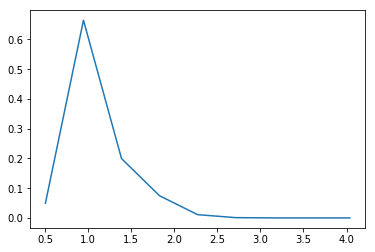

num19
[ 0.13097315  0.          0.          0.30719295  0.          0.
  0.95435235  0.          1.60748154]
[ 0.          0.33333333  0.66666667  1.          1.33333333  1.66666667
  2.          2.33333333  2.66666667  3.        ]
[ 0.04365772  0.04365772  0.04365772  0.14605537  0.14605537  0.14605537
  0.46417282  0.46417282  1.        ]


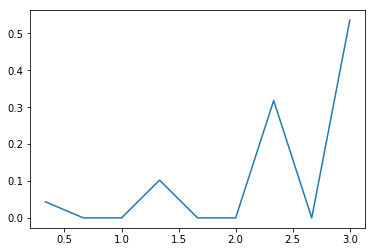

num20
[  7.77776344e-04   2.63714143e+00   4.73178387e+00   3.44140106e-01
   1.00851666e-02   1.49073799e-03   0.00000000e+00   0.00000000e+00
   4.92591684e-04]
[ 0.1         0.22943456  0.35886913  0.48830369  0.61773825  0.74717281
  0.87660738  1.00604194  1.1354765   1.26491106]
[  1.00671141e-04   3.41437919e-01   9.53894295e-01   9.98437919e-01
   9.99743289e-01   9.99936242e-01   9.99936242e-01   9.99936242e-01
   1.00000000e+00]


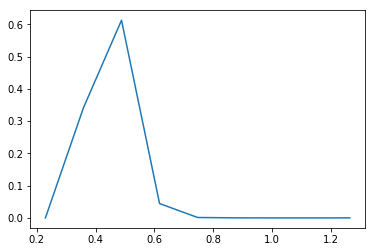

num21
[  4.62205815e-01   1.78143611e+00   2.84879902e-01   5.51630331e-02
   8.08558816e-03   1.47960171e-03   3.48141578e-04   3.48141578e-05
   2.17588487e-05]
[ 0.25061907  0.63617539  1.02173172  1.40728805  1.79284437  2.1784007
  2.56395702  2.94951335  3.33506968  3.720626  ]
[ 0.17820638  0.86505034  0.97488758  0.99615604  0.99927349  0.99984396
  0.99997819  0.99999161  1.        ]


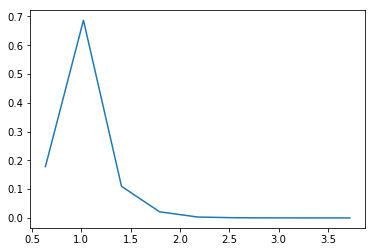

num22
[  2.26430562e-03   1.39584410e-02   1.52482353e-02   3.45842588e+00
   1.02410531e+01   2.74468236e+00   3.68422588e-01   2.36892227e-01
   1.66240159e-03]
[ 0.10954451  0.16808358  0.22662264  0.28516171  0.34370077  0.40223984
  0.46077891  0.51931797  0.57785704  0.6363961 ]
[  1.32550336e-04   9.49664430e-04   1.84228188e-03   2.04295302e-01
   8.03796980e-01   9.64468121e-01   9.86035235e-01   9.99902685e-01
   1.00000000e+00]


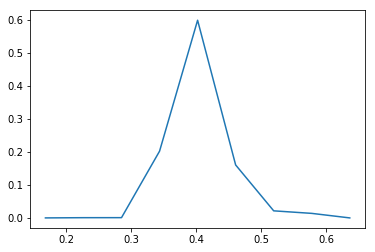

num23
[ 0.05734502  0.          0.0271167   0.02632164  0.09525352  0.1609971
  0.3195283   0.72976175  0.98902713]
[ 0.          0.41573971  0.83147942  1.24721913  1.66295884  2.07869855
  2.49443826  2.91017797  3.32591768  3.74165739]
[ 0.0238406   0.0238406   0.03511409  0.04605705  0.08565772  0.1525906
  0.28543121  0.58882215  1.        ]


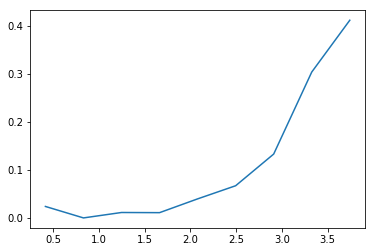

der1
[ 1.00446309  0.99966443  1.99724832  0.          0.99555369  2.00659396
  1.00062081  0.          1.9958557 ]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10044631  0.20041275  0.40013758  0.40013758  0.49969295  0.70035235
  0.80041443  0.80041443  1.        ]


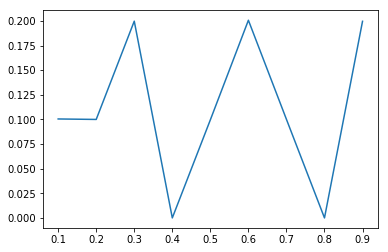

der2
[ 1.00177852  0.99781879  1.99901007  0.          1.00493289  2.00877517
  0.99964765  0.          1.98803691]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10017785  0.19995973  0.39986074  0.39986074  0.50035403  0.70123154
  0.80119631  0.80119631  1.        ]


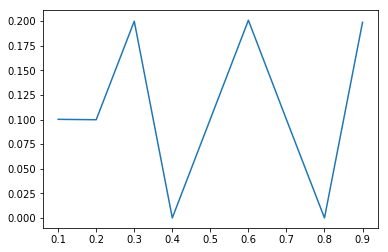

der3
[ 0.99666107  1.00894295  1.99874161  0.          0.99496644  2.005
  0.99758389  0.          1.99810403]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.09966611  0.2005604   0.40043456  0.40043456  0.49993121  0.70043121
  0.8001896   0.8001896   1.        ]


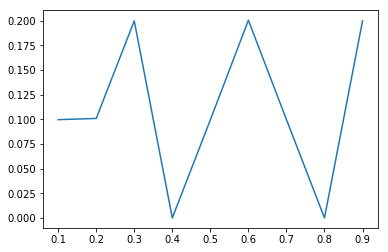

der4
[ 0.07228691  0.32664262  0.          0.58660369  0.          0.53074027
  0.          0.24079228  0.04293423]
[ 0.          0.55555556  1.11111111  1.66666667  2.22222222  2.77777778
  3.33333333  3.88888889  4.44444444  5.        ]
[ 0.0401594   0.22162752  0.22162752  0.54751846  0.54751846  0.84237416
  0.84237416  0.97614765  1.        ]


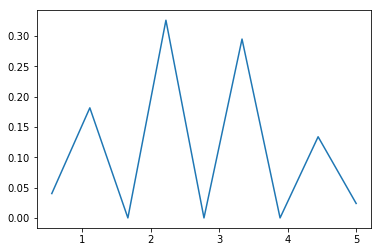

der5
[ 0.15430117  0.43060822  0.          0.49186661  0.30032215  0.
  0.10251091  0.01898406  0.00140688]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.10286745  0.3899396   0.3899396   0.71785067  0.91806544  0.91806544
  0.98640604  0.99906208  1.        ]


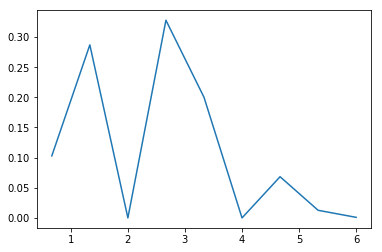

der6
[  1.05704698e-05   1.99328859e-04   1.81208054e-03   1.01431208e-02
   4.02372483e-02   1.11065436e-01   2.11320302e-01   2.64672483e-01
   2.60539430e-01]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[  1.17449664e-05   2.33221477e-04   2.24664430e-03   1.35167785e-02
   5.82248322e-02   1.81630872e-01   4.16431208e-01   7.10511745e-01
   1.00000000e+00]


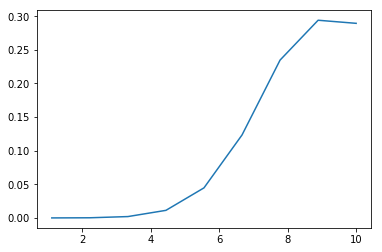

der7
[ 0.02568624  0.11643456  0.23373993  0.27285403  0.20502013  0.10366275
  0.03428356  0.00736074  0.00095805]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.02568624  0.14212081  0.37586074  0.64871477  0.8537349   0.95739765
  0.99168121  0.99904195  1.        ]


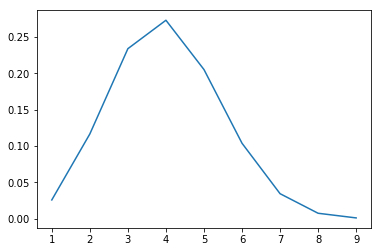

der8
[  1.52516779e-04   1.27147651e-03   6.75151007e-03   2.59716443e-02
   7.49340604e-02   1.55663758e-01   2.29471309e-01   2.28791779e-01
   1.76991946e-01]
[  2.           3.11111111   4.22222222   5.33333333   6.44444444
   7.55555556   8.66666667   9.77777778  10.88888889  12.        ]
[  1.69463087e-04   1.58221477e-03   9.08389262e-03   3.79412752e-02
   1.21201342e-01   2.94161074e-01   5.49129195e-01   8.03342282e-01
   1.00000000e+00]


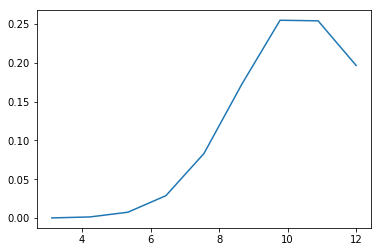

der9
[ 0.07450671  0.26219942  0.39428715  0.33013303  0.          0.16621956
  0.04962943  0.00816731  0.00057167]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.05794966  0.26188255  0.56855034  0.82532047  0.82532047  0.95460235
  0.99320302  0.99955537  1.        ]


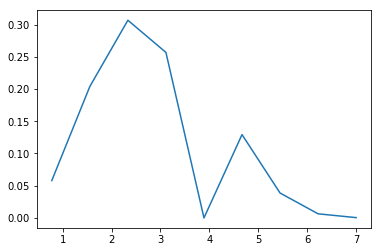

der10
[  3.51181208e-03   5.22344295e-02   1.35866779e-01   1.15905503e-01
   3.48499329e-02   1.54280537e-02   2.03496644e-03   1.61275168e-04
   7.24832215e-06]
[  0.           2.77777778   5.55555556   8.33333333  11.11111111
  13.88888889  16.66666667  19.44444444  22.22222222  25.        ]
[ 0.00975503  0.15485067  0.53225839  0.85421812  0.95102349  0.99387919
  0.99953188  0.99997987  1.        ]


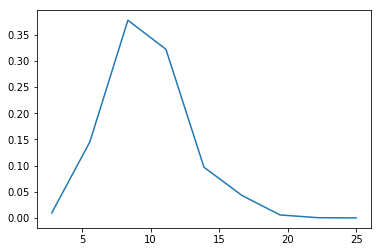

der11
[  4.36592194e-02   1.30036648e-01   1.55696662e-01   9.64893147e-02
   3.66580714e-02   9.15657012e-03   1.75565171e-03   2.05051219e-04
   2.70222536e-05]
[  0.           2.11111111   4.22222222   6.33333333   8.44444444
  10.55555556  12.66666667  14.77777778  16.88888889  19.        ]
[ 0.09216946  0.36669128  0.69538423  0.89908389  0.97647315  0.99580369
  0.99951007  0.99994295  1.        ]


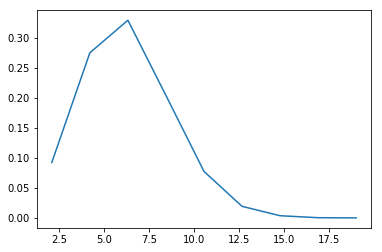

der12
[  5.20559396e-01   2.19741946e-01   1.06382718e-01   3.89808725e-02
   1.10234899e-02   2.60486577e-03   5.85906040e-04   9.96644295e-05
   2.11409396e-05]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[ 0.57839933  0.82255705  0.94076007  0.98407215  0.99632047  0.99921477
  0.99986577  0.99997651  1.        ]


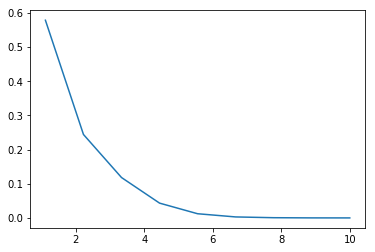

der13
[  1.51566598e-01   1.62077827e-01   2.65374548e-01   6.34588281e-02
   4.34295302e-02   4.51393908e-03   1.75632421e-03   1.02219928e-04
   2.78781621e-05]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.21892953  0.45304195  0.83636074  0.92802349  0.99075503  0.99727517
  0.99981208  0.99995973  1.        ]


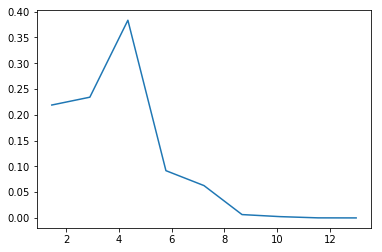

der14
[  7.65997957e-03   8.51040998e-02   1.10167275e-01   1.33256201e-01
   3.78521301e-02   1.53534432e-02   1.57834841e-03   3.17114094e-04
   1.57572221e-05]
[  0.           2.55555556   5.11111111   7.66666667  10.22222222
  12.77777778  15.33333333  17.88888889  20.44444444  23.        ]
[ 0.0195755   0.23706376  0.51860235  0.85914597  0.95587919  0.99511577
  0.99914933  0.99995973  1.        ]


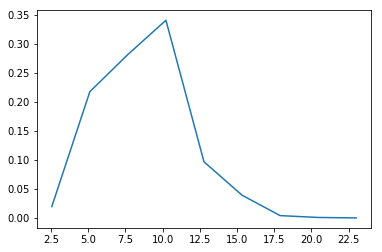

der15
[ 7.89813423  0.          0.          0.          0.          0.          0.
  0.          1.10186577]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87757047  0.87757047  0.87757047  0.87757047  0.87757047  0.87757047
  0.87757047  0.87757047  1.        ]


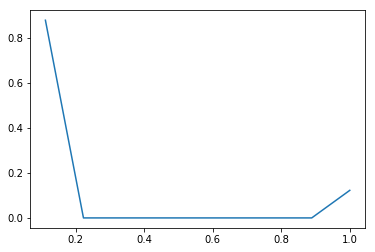

der16
[ 3.34988758  0.          0.          0.          0.          0.          0.
  0.          5.65011242]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.37220973  0.37220973  0.37220973  0.37220973  0.37220973  0.37220973
  0.37220973  0.37220973  1.        ]


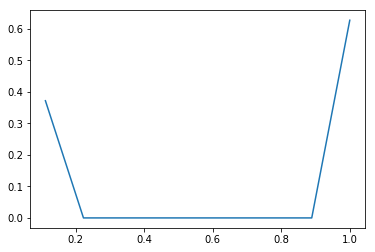

der17
[ 4.01236913  0.          0.          0.          0.          0.          0.
  0.          4.98763087]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.44581879  0.44581879  0.44581879  0.44581879  0.44581879  0.44581879
  0.44581879  0.44581879  1.        ]


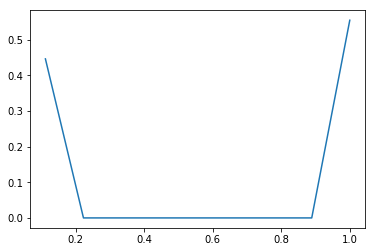

der18
[ 6.41493121  0.          0.          0.          0.          0.          0.
  0.          2.58506879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.71277013  0.71277013  0.71277013  0.71277013  0.71277013  0.71277013
  0.71277013  0.71277013  1.        ]


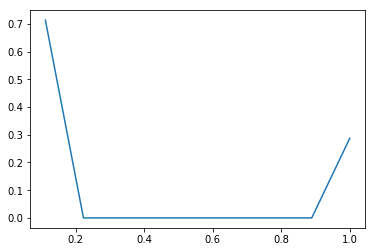

der19
[ 5.85918121  0.          0.          0.          0.          0.          0.
  0.          3.14081879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.65102013  0.65102013  0.65102013  0.65102013  0.65102013  0.65102013
  0.65102013  0.65102013  1.        ]


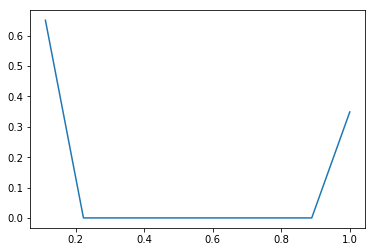

cat1
[ 2.17775336  0.          0.          0.62283221  0.          0.
  0.14207215  0.          0.05734228]
[ 1.          1.33333333  1.66666667  2.          2.33333333  2.66666667
  3.          3.33333333  3.66666667  4.        ]
[ 0.72591779  0.72591779  0.72591779  0.93352852  0.93352852  0.93352852
  0.98088591  0.98088591  1.        ]


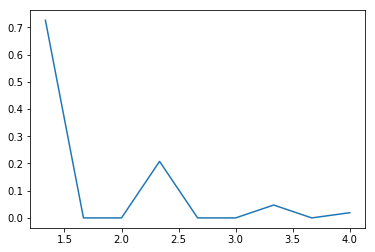

cat2
[ 5.24739262  0.          0.          0.          0.          0.          0.
  0.          3.75260738]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.58304362  0.58304362  0.58304362  0.58304362  0.58304362  0.58304362
  0.58304362  0.58304362  1.        ]


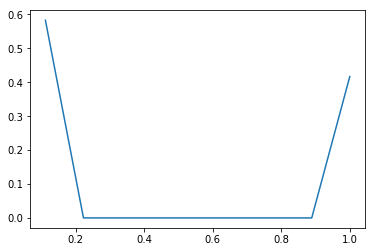

cat3
[ 1.34526342  0.02096728  0.          0.01053523  0.02074581  0.
  0.04623826  0.00415772  0.05209228]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.89684228  0.91082047  0.91082047  0.91784396  0.9316745   0.9316745
  0.9625      0.96527181  1.        ]


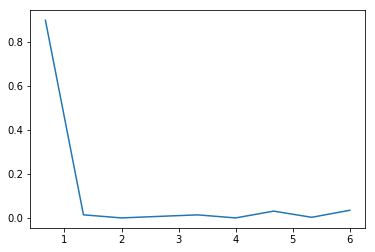

cat4
[ 0.00999939  0.00294326  0.00915101  0.03598627  0.11070439  0.24649375
  0.02074146  0.02798154  0.35418075]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.01222148  0.01581879  0.02700336  0.07098658  0.20629195  0.50756208
  0.53291275  0.56711242  1.        ]


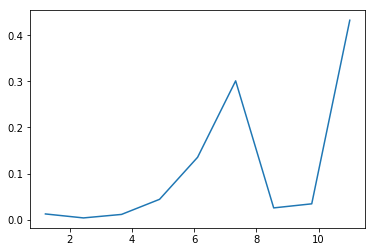

cat5
[ 1.53019631  0.          0.          0.          0.          0.          0.
  0.          7.46980369]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.17002181  0.17002181  0.17002181  0.17002181  0.17002181  0.17002181
  0.17002181  0.17002181  1.        ]


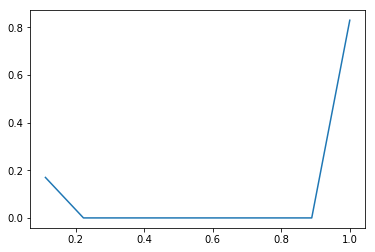

cat7
[  8.34305369e-01   5.39496644e-02   3.99395973e-02   1.07382550e-03
   3.85906040e-04   9.17785235e-04   2.61912752e-03   2.33221477e-04
   6.65755034e-02]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.83430537  0.88825503  0.92819463  0.92926846  0.92965436  0.93057215
  0.93319128  0.9334245   1.        ]


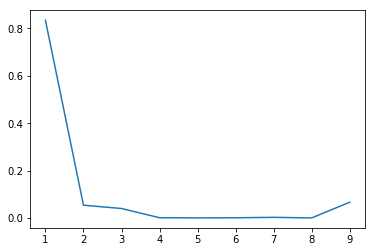

cat8
[ 2.35855872  0.          0.          0.          0.          0.          0.
  0.          6.64144128]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.26206208  0.26206208  0.26206208  0.26206208  0.26206208  0.26206208
  0.26206208  0.26206208  1.        ]


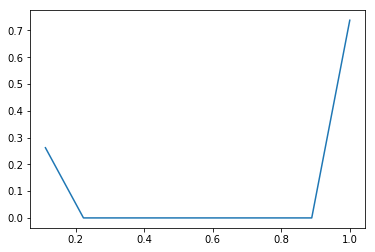

cat9
[ 0.20352685  0.01210008  0.02893999  0.03300296  0.01692252  0.14675987
  0.00767647  0.07201865  0.00846437]
[  0.           1.88888889   3.77777778   5.66666667   7.55555556
   9.44444444  11.33333333  13.22222222  15.11111111  17.        ]
[ 0.3844396   0.4072953   0.46195973  0.52429866  0.55626342  0.83347651
  0.84797651  0.98401174  1.        ]


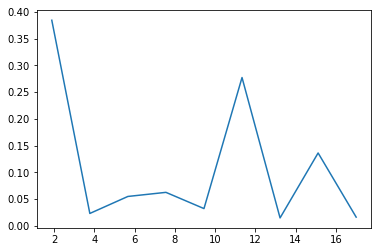

cat10
[ 0.46242785  0.          0.          0.          0.          0.          0.
  0.          8.53757215]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.05138087  0.05138087  0.05138087  0.05138087  0.05138087  0.05138087
  0.05138087  0.05138087  1.        ]


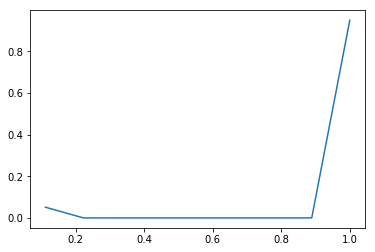

cat11
[ 1.51130537  0.          0.          0.          0.          0.          0.
  0.          7.48869463]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.16792282  0.16792282  0.16792282  0.16792282  0.16792282  0.16792282
  0.16792282  0.16792282  1.        ]


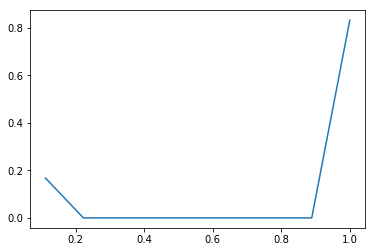

cat12
[ 0.73525923  0.          0.10993289  0.          1.33841779  0.          0.0557781
  0.          0.010612  ]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.32678188  0.32678188  0.37564094  0.37564094  0.97049329  0.97049329
  0.99528356  0.99528356  1.        ]


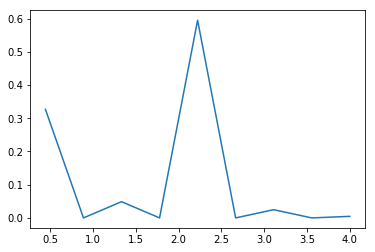

cat13
[  3.67172819e-02   0.00000000e+00   0.00000000e+00   0.00000000e+00
   4.46195386e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.32885906e-03]
[ 0.          0.22222222  0.44444444  0.66666667  0.88888889  1.11111111
  1.33333333  1.55555556  1.77777778  2.        ]
[ 0.0081594  0.0081594  0.0081594  0.0081594  0.9997047  0.9997047
  0.9997047  0.9997047  1.       ]


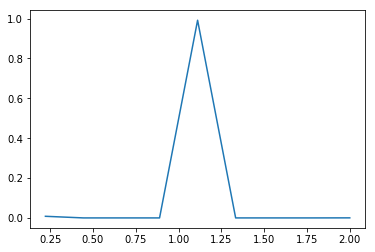

cat14
[ 0.00861647  0.00578971  0.00905043  0.00790982  0.00615521  0.01029235
  0.00628261  0.01103859  0.02224344]
[   1.           12.44444444   23.88888889   35.33333333   46.77777778
   58.22222222   69.66666667   81.11111111   92.55555556  104.        ]
[ 0.09861074  0.16487081  0.26844799  0.35897148  0.42941443  0.5472047
  0.6191057   0.74543624  1.        ]


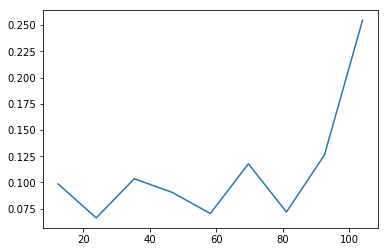

num1_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


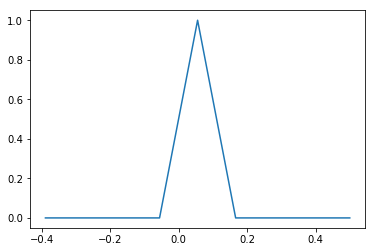

num2_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


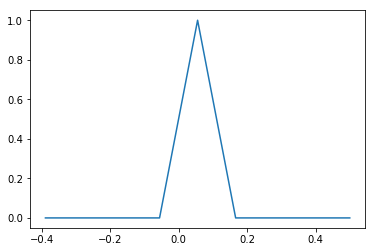

num3_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


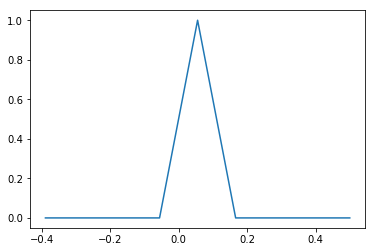

num4_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


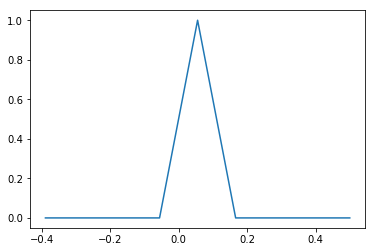

num5_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


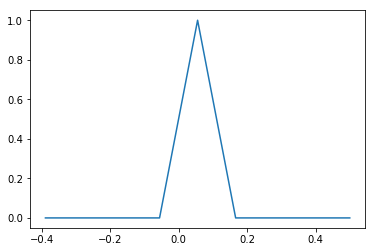

num6_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


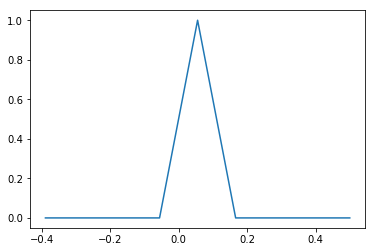

num7_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


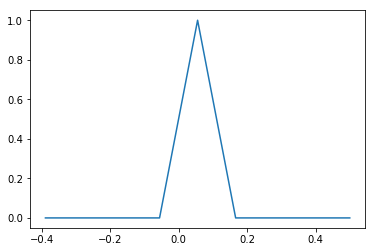

num8_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


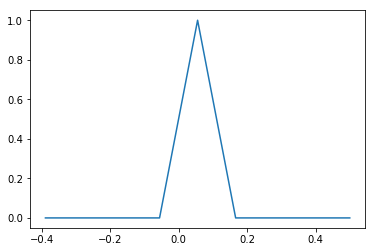

num9_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


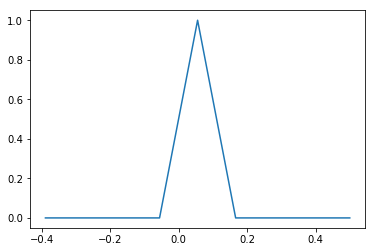

num10_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


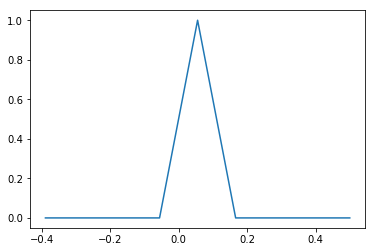

num11_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


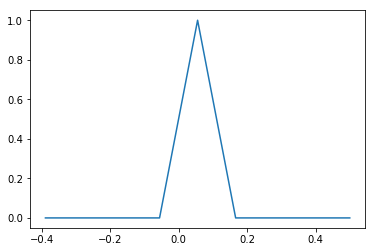

num12_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


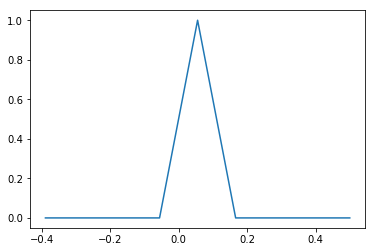

num13_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


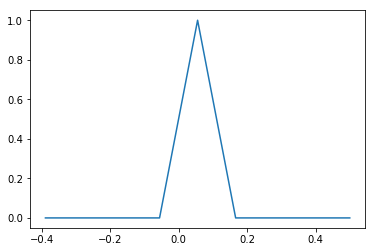

num14_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


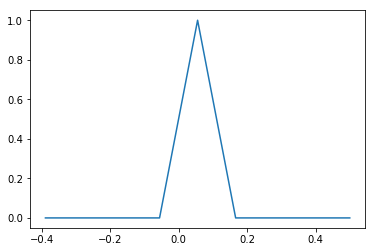

num15_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


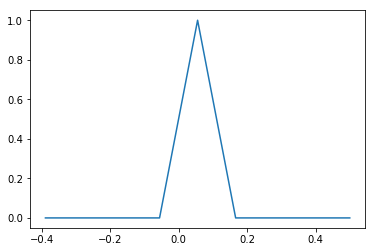

num16_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


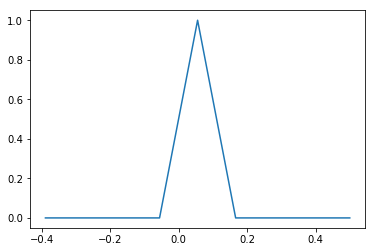

num17_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


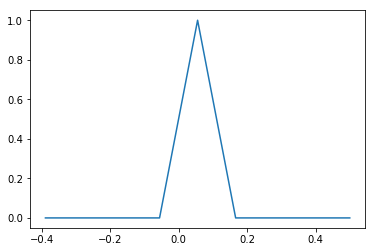

num18_
[ 7.37050168  0.          0.          0.          0.          0.          0.
  0.          1.62949832]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.81894463  0.81894463  0.81894463  0.81894463  0.81894463  0.81894463
  0.81894463  0.81894463  1.        ]


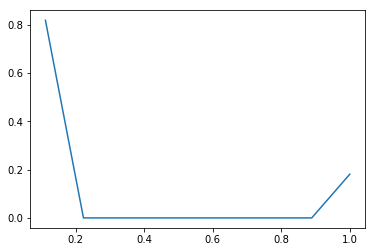

num19_
[  8.99992450e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   7.55033557e-05]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99999161  0.99999161  0.99999161  0.99999161  0.99999161  0.99999161
  0.99999161  0.99999161  1.        ]


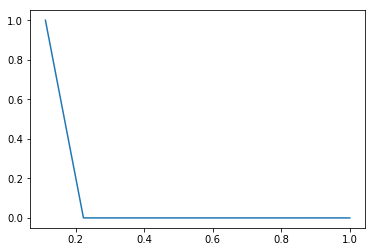

num20_
[  8.99998490e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.51006711e-05]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99999832  0.99999832  0.99999832  0.99999832  0.99999832  0.99999832
  0.99999832  0.99999832  1.        ]


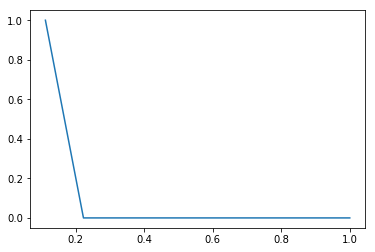

num21_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


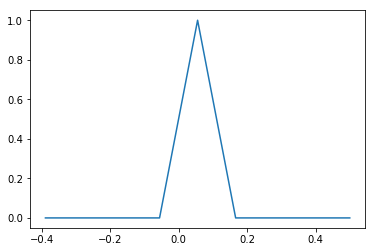

num22_
[ 8.35569966  0.          0.          0.          0.          0.          0.
  0.          0.64430034]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.92841107  0.92841107  0.92841107  0.92841107  0.92841107  0.92841107
  0.92841107  0.92841107  1.        ]


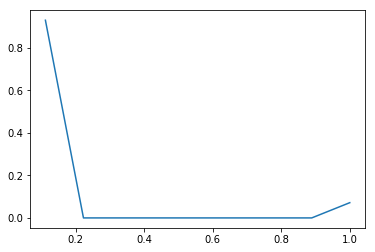

num23_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


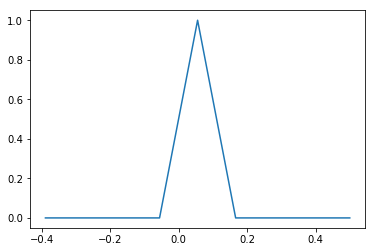

der1_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


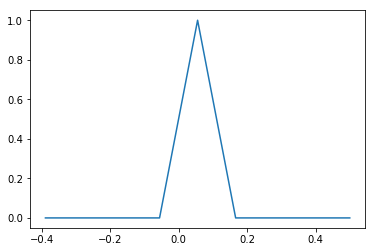

der2_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


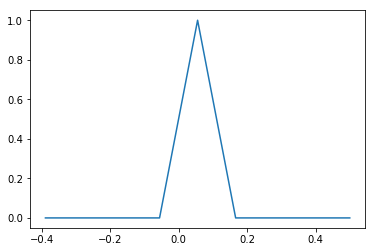

der3_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


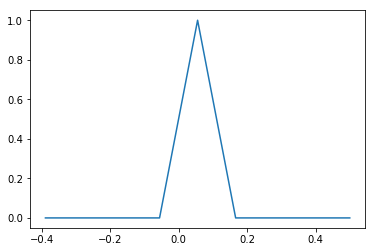

der4_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


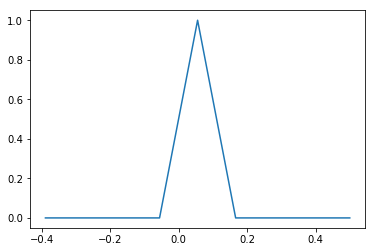

der5_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


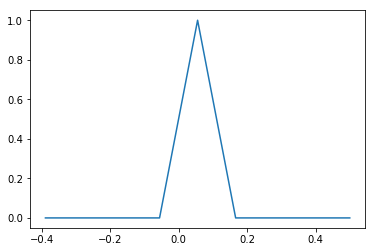

der6_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


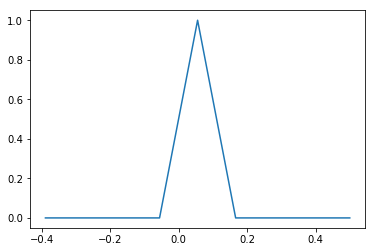

der7_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


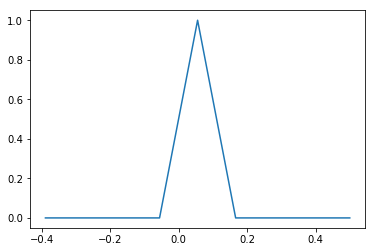

der8_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


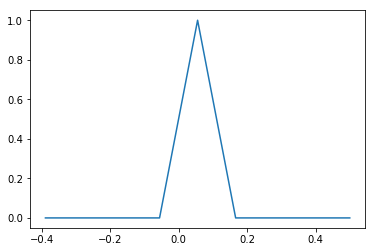

der9_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


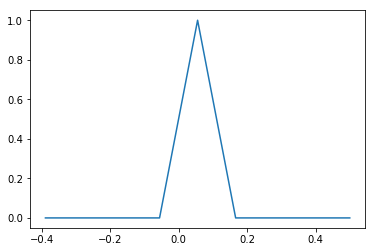

der10_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


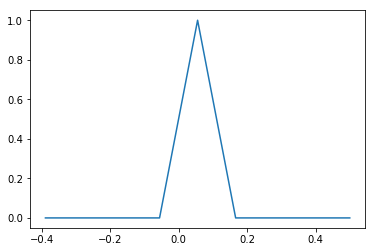

der11_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


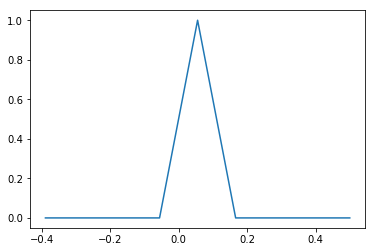

der12_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


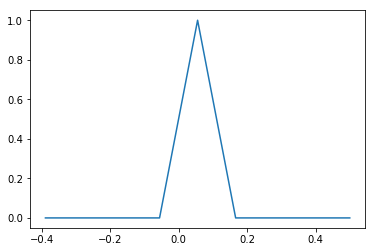

der13_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


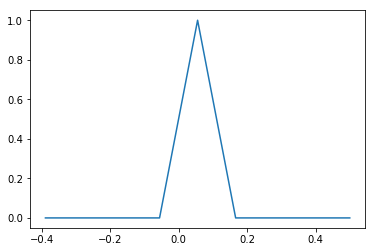

der14_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


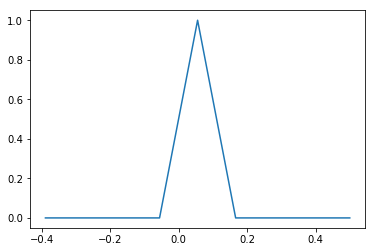

der15_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


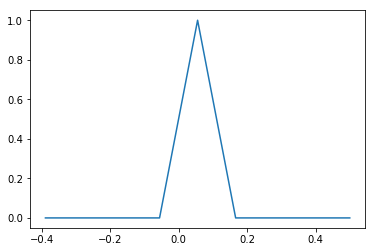

der16_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


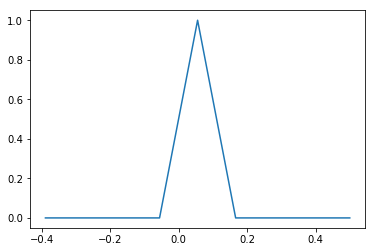

der17_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


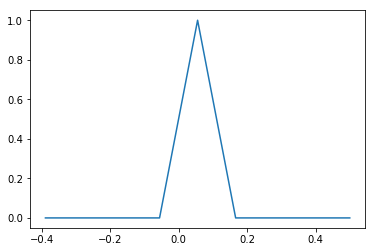

der18_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


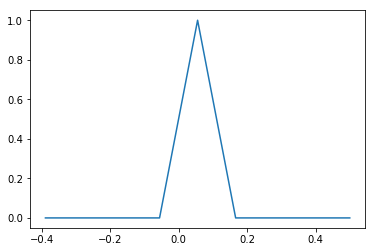

der19_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


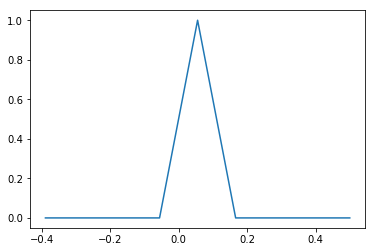

cat1_
[  8.99672315e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.27684564e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99963591  0.99963591  0.99963591  0.99963591  0.99963591  0.99963591
  0.99963591  0.99963591  1.        ]


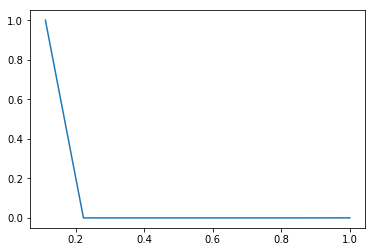

cat2_
[  8.99874664e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.25335570e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99986074  0.99986074  0.99986074  0.99986074  0.99986074  0.99986074
  0.99986074  0.99986074  1.        ]


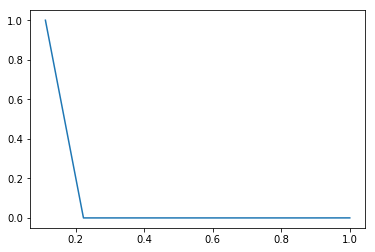

cat3_
[ 8.9122047  0.         0.         0.         0.         0.         0.         0.
  0.0877953]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99024497  0.99024497  0.99024497  0.99024497  0.99024497  0.99024497
  0.99024497  0.99024497  1.        ]


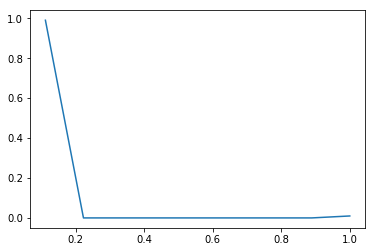

cat4_
[  8.99838423e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.61577181e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99982047  0.99982047  0.99982047  0.99982047  0.99982047  0.99982047
  0.99982047  0.99982047  1.        ]


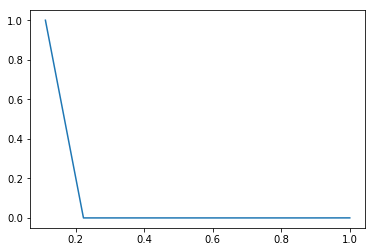

cat5_
[  8.99992450e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   7.55033557e-05]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99999161  0.99999161  0.99999161  0.99999161  0.99999161  0.99999161
  0.99999161  0.99999161  1.        ]


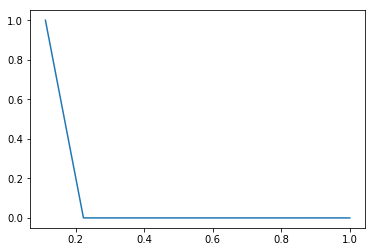

cat7_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


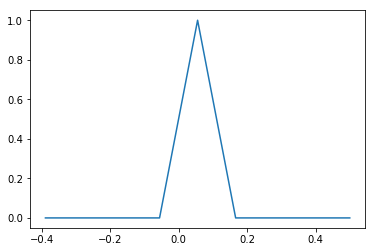

cat8_
[ 4.96920805  0.          0.          0.          0.          0.          0.
  0.          4.03079195]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.55213423  0.55213423  0.55213423  0.55213423  0.55213423  0.55213423
  0.55213423  0.55213423  1.        ]


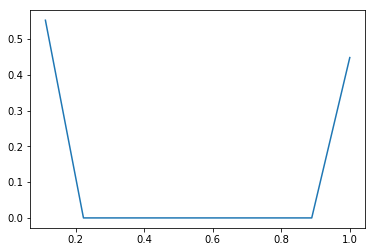

cat9_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


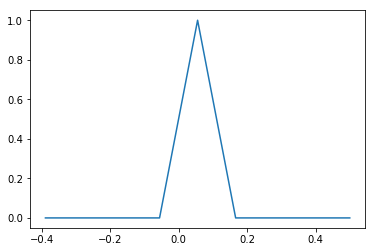

cat10_
[ 8.82629698  0.          0.          0.          0.          0.          0.
  0.          0.17370302]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.98069966  0.98069966  0.98069966  0.98069966  0.98069966  0.98069966
  0.98069966  0.98069966  1.        ]


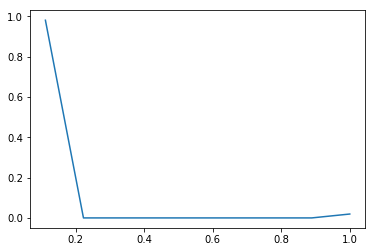

cat11_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


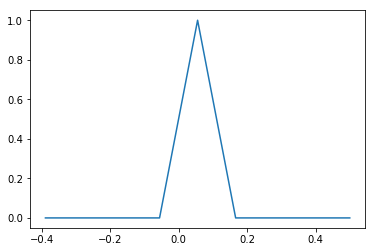

cat12_
[  8.99139262e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   8.60738255e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99904362  0.99904362  0.99904362  0.99904362  0.99904362  0.99904362
  0.99904362  0.99904362  1.        ]


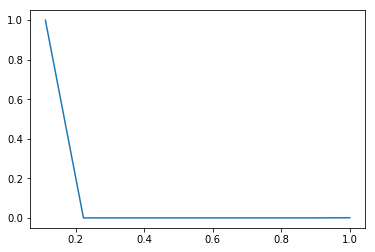

cat13_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


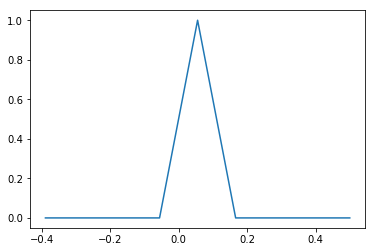

cat14_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


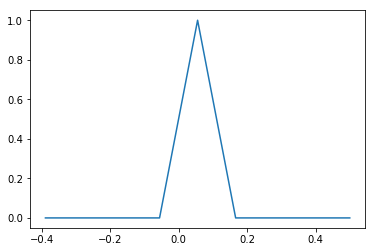

num1
[ 0.40519847  0.3110652   0.17810594  0.11058437  0.          0.07242066
  0.13274569  0.03819823  0.03739573]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.31515436  0.55709396  0.69562081  0.78163087  0.78163087  0.83795805
  0.9412047   0.97091443  1.        ]


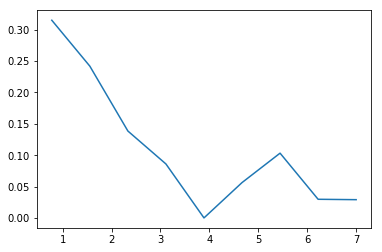

num2
[ 0.11478981  0.13208832  0.11269219  0.09240787  0.16936638  0.07197254
  0.05453264  0.03496492  0.03536714]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.14029866  0.30173993  0.43947483  0.55241779  0.75942114  0.84738758
  0.91403859  0.95677349  1.        ]


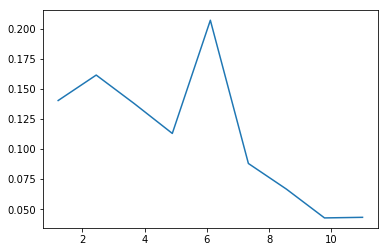

num3
[ 5.4563104  0.         0.         0.         0.         0.         0.         0.
  3.5436896]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.60625671  0.60625671  0.60625671  0.60625671  0.60625671  0.60625671
  0.60625671  0.60625671  1.        ]


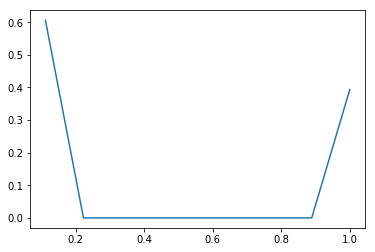

num4
[ 6.68686409  0.          0.          0.          0.          0.          0.
  0.          2.31313591]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.7429849  0.7429849  0.7429849  0.7429849  0.7429849  0.7429849
  0.7429849  0.7429849  1.       ]


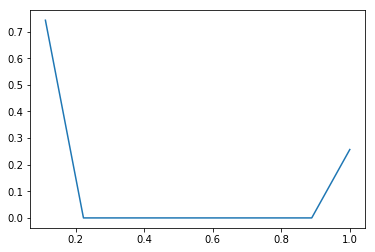

num5
[ 7.52460403  0.          0.          0.          0.          0.          0.
  0.          1.47539597]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.83606711  0.83606711  0.83606711  0.83606711  0.83606711  0.83606711
  0.83606711  0.83606711  1.        ]


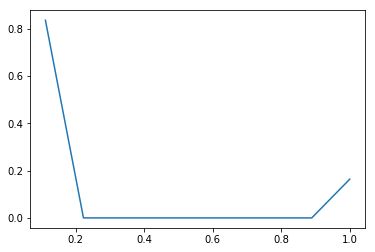

num6
[ 7.33222148  0.          0.          0.          0.          0.          0.
  0.          1.66777852]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.81469128  0.81469128  0.81469128  0.81469128  0.81469128  0.81469128
  0.81469128  0.81469128  1.        ]


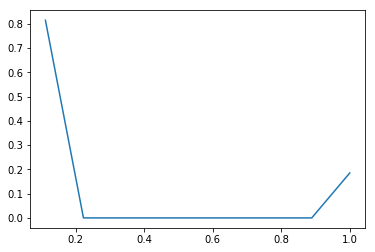

num7
[  8.99663255e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.36744966e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99962584  0.99962584  0.99962584  0.99962584  0.99962584  0.99962584
  0.99962584  0.99962584  1.        ]


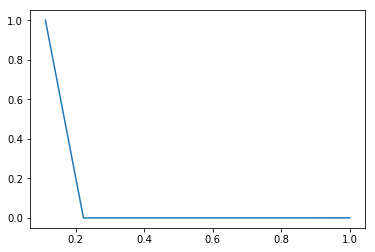

num8
[ 8.98476342  0.          0.          0.          0.          0.          0.
  0.          0.01523658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99830705  0.99830705  0.99830705  0.99830705  0.99830705  0.99830705
  0.99830705  0.99830705  1.        ]


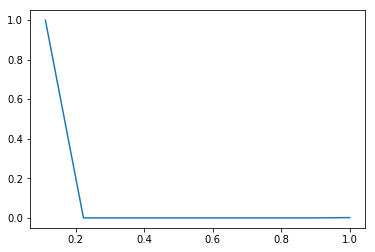

num9
[ 8.91508893  0.          0.          0.          0.          0.          0.
  0.          0.08491107]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99056544  0.99056544  0.99056544  0.99056544  0.99056544  0.99056544
  0.99056544  0.99056544  1.        ]


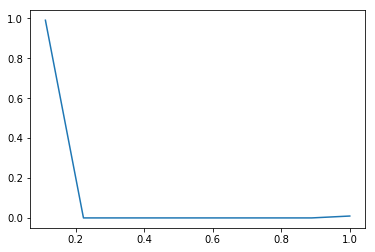

num10
[  8.99146812e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   8.53187919e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99905201  0.99905201  0.99905201  0.99905201  0.99905201  0.99905201
  0.99905201  0.99905201  1.        ]


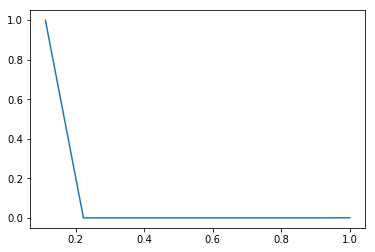

num11
[  2.22589178e+00   0.00000000e+00   2.07596477e-02   0.00000000e+00
   2.81250000e-03   0.00000000e+00   5.17197987e-04   0.00000000e+00
   1.88758389e-05]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.98928523  0.98928523  0.99851174  0.99851174  0.99976174  0.99976174
  0.99999161  0.99999161  1.        ]


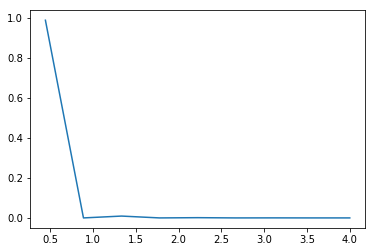

num12
[ 0.05052685  0.02172754  0.08610983  0.04949187  0.14395818  0.06931324
  0.11611371  0.06189068  0.09317579]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.07298322  0.10436745  0.22874832  0.30023658  0.50817617  0.6082953
  0.7760151   0.86541275  1.        ]


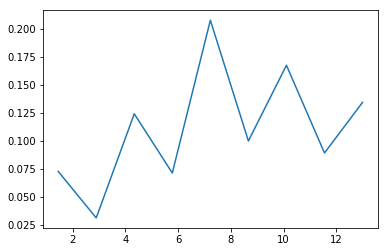

num13
[ 3.05244966  0.          0.          0.          0.          0.          0.
  0.          5.94755034]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.33916107  0.33916107  0.33916107  0.33916107  0.33916107  0.33916107
  0.33916107  0.33916107  1.        ]


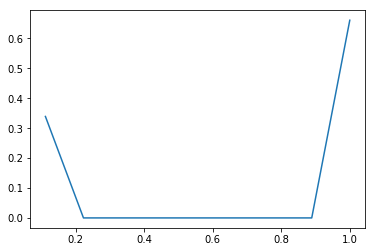

num14
[ 7.91039597  0.          0.          0.          0.          0.          0.
  0.          1.08960403]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87893289  0.87893289  0.87893289  0.87893289  0.87893289  0.87893289
  0.87893289  0.87893289  1.        ]


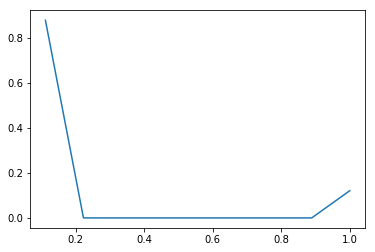

num15
[ 7.61901342  0.          0.          0.          0.          0.          0.
  0.          1.38098658]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.84655705  0.84655705  0.84655705  0.84655705  0.84655705  0.84655705
  0.84655705  0.84655705  1.        ]


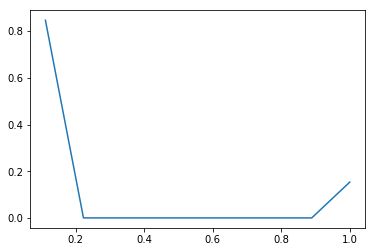

num16
[ 0.3642953   0.72557047  1.09874161  0.          0.9002349   1.48822148
  1.14088926  0.          4.28204698]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.03642953  0.10898658  0.21886074  0.21886074  0.30888423  0.45770638
  0.5717953   0.5717953   1.        ]


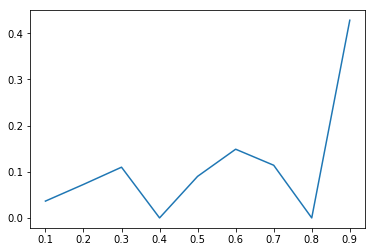

num17
[ 1.01735738  1.76348154  1.08987416  0.17823826  0.30828859  0.33372483
  0.1565604   0.04907718  0.10339765]
[ 0.   0.2  0.4  0.6  0.8  1.   1.2  1.4  1.6  1.8]
[ 0.20347148  0.55616779  0.77414262  0.80979027  0.87144799  0.93819295
  0.96950503  0.97932047  1.        ]


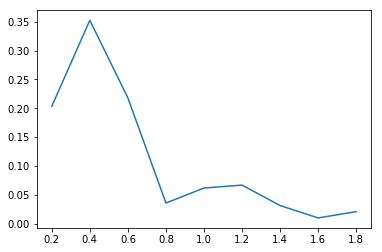

num18
[  1.11996963e-01   1.50383662e+00   4.51606660e-01   1.68504280e-01
   2.48911675e-02   2.12267927e-03   1.82269419e-04   2.27836773e-05
   1.51891182e-05]
[ 0.06123724  0.50309366  0.94495008  1.3868065   1.82866292  2.27051934
  2.71237576  3.15423218  3.5960886   4.03794502]
[ 0.04948658  0.71396644  0.91351174  0.98796644  0.99896477  0.99990268
  0.99998322  0.99999329  1.        ]


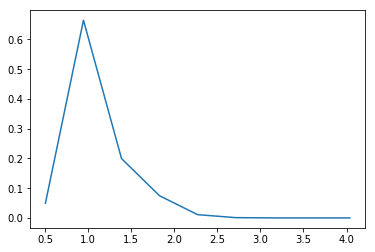

num19
[ 0.13097315  0.          0.          0.30719295  0.          0.
  0.95435235  0.          1.60748154]
[ 0.          0.33333333  0.66666667  1.          1.33333333  1.66666667
  2.          2.33333333  2.66666667  3.        ]
[ 0.04365772  0.04365772  0.04365772  0.14605537  0.14605537  0.14605537
  0.46417282  0.46417282  1.        ]


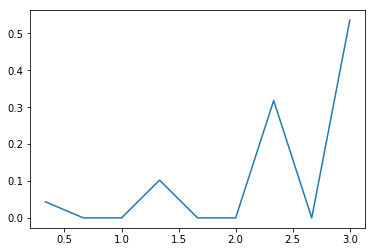

num20
[  7.77776344e-04   2.63715440e+00   4.73177091e+00   3.44140106e-01
   1.00851666e-02   1.49073799e-03   0.00000000e+00   0.00000000e+00
   4.92591684e-04]
[ 0.1         0.22943456  0.35886913  0.48830369  0.61773825  0.74717281
  0.87660738  1.00604194  1.1354765   1.26491106]
[  1.00671141e-04   3.41439597e-01   9.53894295e-01   9.98437919e-01
   9.99743289e-01   9.99936242e-01   9.99936242e-01   9.99936242e-01
   1.00000000e+00]


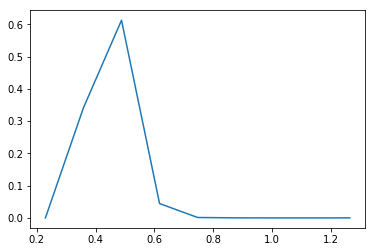

num21
[  4.62205815e-01   1.78143611e+00   2.84879902e-01   5.51630331e-02
   8.08558816e-03   1.47960171e-03   3.48141578e-04   3.48141578e-05
   2.17588487e-05]
[ 0.25061907  0.63617539  1.02173172  1.40728805  1.79284437  2.1784007
  2.56395702  2.94951335  3.33506968  3.720626  ]
[ 0.17820638  0.86505034  0.97488758  0.99615604  0.99927349  0.99984396
  0.99997819  0.99999161  1.        ]


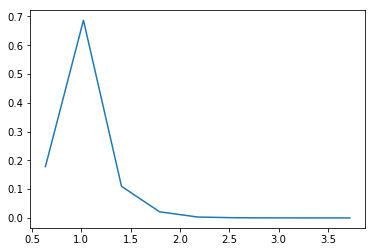

num22
[  2.26430562e-03   1.39584410e-02   1.52482353e-02   3.45842588e+00
   1.02410531e+01   2.74468236e+00   3.68422588e-01   2.36892227e-01
   1.66240159e-03]
[ 0.10954451  0.16808358  0.22662264  0.28516171  0.34370077  0.40223984
  0.46077891  0.51931797  0.57785704  0.6363961 ]
[  1.32550336e-04   9.49664430e-04   1.84228188e-03   2.04295302e-01
   8.03796980e-01   9.64468121e-01   9.86035235e-01   9.99902685e-01
   1.00000000e+00]


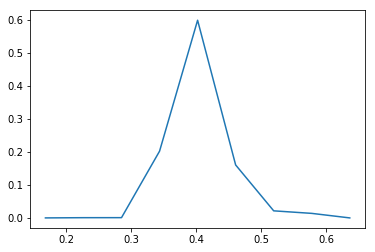

num23
[ 0.05734502  0.          0.0271167   0.02632164  0.09525352  0.1609971
  0.3195283   0.72976175  0.98902713]
[ 0.          0.41573971  0.83147942  1.24721913  1.66295884  2.07869855
  2.49443826  2.91017797  3.32591768  3.74165739]
[ 0.0238406   0.0238406   0.03511409  0.04605705  0.08565772  0.1525906
  0.28543121  0.58882215  1.        ]


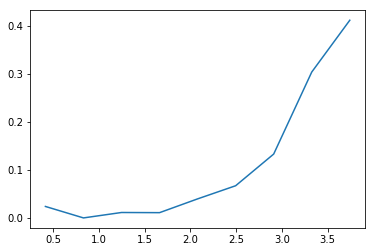

der1
[ 1.00446309  0.99966443  1.99724832  0.          0.99555369  2.00659396
  1.00062081  0.          1.9958557 ]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10044631  0.20041275  0.40013758  0.40013758  0.49969295  0.70035235
  0.80041443  0.80041443  1.        ]


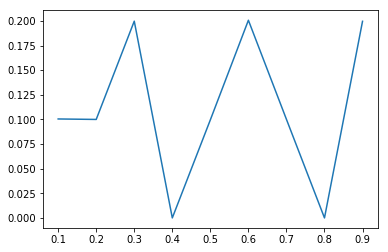

der2
[ 1.00177852  0.99781879  1.99901007  0.          1.00493289  2.00877517
  0.99964765  0.          1.98803691]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.10017785  0.19995973  0.39986074  0.39986074  0.50035403  0.70123154
  0.80119631  0.80119631  1.        ]


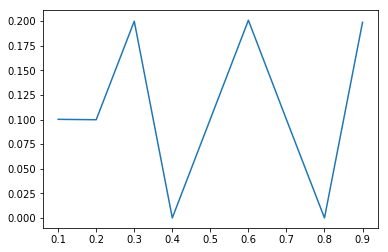

der3
[ 0.99666107  1.00894295  1.99874161  0.          0.99496644  2.005
  0.99758389  0.          1.99810403]
[ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
[ 0.09966611  0.2005604   0.40043456  0.40043456  0.49993121  0.70043121
  0.8001896   0.8001896   1.        ]


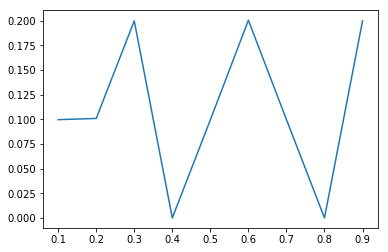

der4
[ 0.07228691  0.32664262  0.          0.58660369  0.          0.53074027
  0.          0.24079228  0.04293423]
[ 0.          0.55555556  1.11111111  1.66666667  2.22222222  2.77777778
  3.33333333  3.88888889  4.44444444  5.        ]
[ 0.0401594   0.22162752  0.22162752  0.54751846  0.54751846  0.84237416
  0.84237416  0.97614765  1.        ]


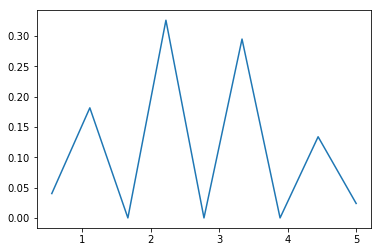

der5
[ 0.15430117  0.43060822  0.          0.49186661  0.30032215  0.
  0.10251091  0.01898406  0.00140688]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.10286745  0.3899396   0.3899396   0.71785067  0.91806544  0.91806544
  0.98640604  0.99906208  1.        ]


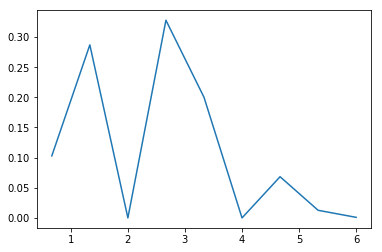

der6
[  1.05704698e-05   1.99328859e-04   1.81208054e-03   1.01431208e-02
   4.02372483e-02   1.11065436e-01   2.11320302e-01   2.64672483e-01
   2.60539430e-01]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[  1.17449664e-05   2.33221477e-04   2.24664430e-03   1.35167785e-02
   5.82248322e-02   1.81630872e-01   4.16431208e-01   7.10511745e-01
   1.00000000e+00]


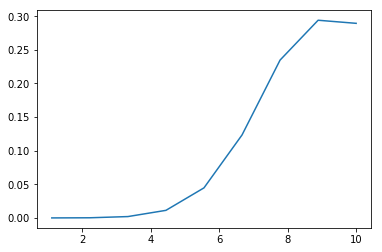

der7
[ 0.02568624  0.11643456  0.23373993  0.27285403  0.20502013  0.10366275
  0.03428356  0.00736074  0.00095805]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.02568624  0.14212081  0.37586074  0.64871477  0.8537349   0.95739765
  0.99168121  0.99904195  1.        ]


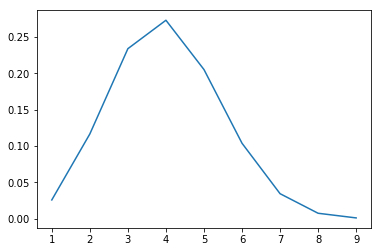

der8
[  1.52516779e-04   1.27147651e-03   6.75151007e-03   2.59716443e-02
   7.49340604e-02   1.55663758e-01   2.29471309e-01   2.28791779e-01
   1.76991946e-01]
[  2.           3.11111111   4.22222222   5.33333333   6.44444444
   7.55555556   8.66666667   9.77777778  10.88888889  12.        ]
[  1.69463087e-04   1.58221477e-03   9.08389262e-03   3.79412752e-02
   1.21201342e-01   2.94161074e-01   5.49129195e-01   8.03342282e-01
   1.00000000e+00]


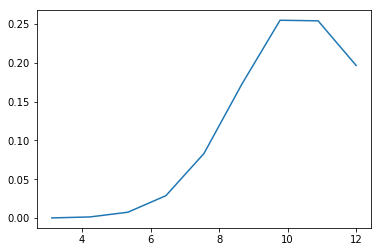

der9
[ 0.07450671  0.26219942  0.39428715  0.33013303  0.          0.16621956
  0.04962943  0.00816731  0.00057167]
[ 0.          0.77777778  1.55555556  2.33333333  3.11111111  3.88888889
  4.66666667  5.44444444  6.22222222  7.        ]
[ 0.05794966  0.26188255  0.56855034  0.82532047  0.82532047  0.95460235
  0.99320302  0.99955537  1.        ]


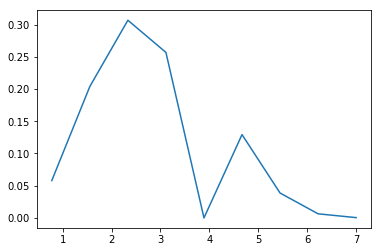

der10
[  3.51181208e-03   5.22344295e-02   1.35866779e-01   1.15905503e-01
   3.48499329e-02   1.54280537e-02   2.03496644e-03   1.61275168e-04
   7.24832215e-06]
[  0.           2.77777778   5.55555556   8.33333333  11.11111111
  13.88888889  16.66666667  19.44444444  22.22222222  25.        ]
[ 0.00975503  0.15485067  0.53225839  0.85421812  0.95102349  0.99387919
  0.99953188  0.99997987  1.        ]


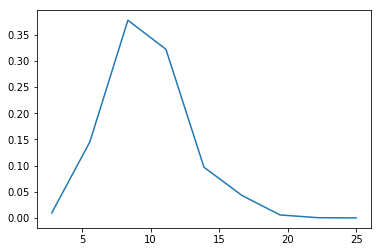

der11
[  4.36592194e-02   1.30036648e-01   1.55696662e-01   9.64893147e-02
   3.66580714e-02   9.15657012e-03   1.75565171e-03   2.05051219e-04
   2.70222536e-05]
[  0.           2.11111111   4.22222222   6.33333333   8.44444444
  10.55555556  12.66666667  14.77777778  16.88888889  19.        ]
[ 0.09216946  0.36669128  0.69538423  0.89908389  0.97647315  0.99580369
  0.99951007  0.99994295  1.        ]


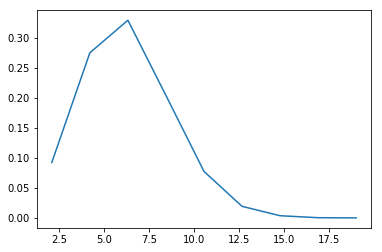

der12
[  5.20559396e-01   2.19741946e-01   1.06382718e-01   3.89808725e-02
   1.10234899e-02   2.60486577e-03   5.85906040e-04   9.96644295e-05
   2.11409396e-05]
[  0.           1.11111111   2.22222222   3.33333333   4.44444444
   5.55555556   6.66666667   7.77777778   8.88888889  10.        ]
[ 0.57839933  0.82255705  0.94076007  0.98407215  0.99632047  0.99921477
  0.99986577  0.99997651  1.        ]


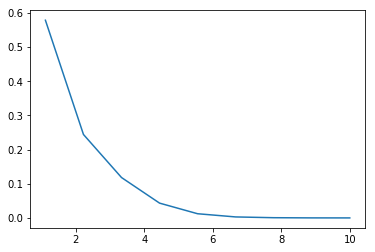

der13
[  1.51566598e-01   1.62077827e-01   2.65374548e-01   6.34588281e-02
   4.34295302e-02   4.51393908e-03   1.75632421e-03   1.02219928e-04
   2.78781621e-05]
[  0.           1.44444444   2.88888889   4.33333333   5.77777778
   7.22222222   8.66666667  10.11111111  11.55555556  13.        ]
[ 0.21892953  0.45304195  0.83636074  0.92802349  0.99075503  0.99727517
  0.99981208  0.99995973  1.        ]


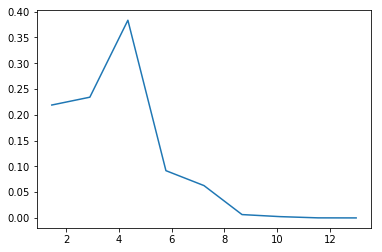

der14
[  7.65997957e-03   8.51040998e-02   1.10167275e-01   1.33256201e-01
   3.78521301e-02   1.53534432e-02   1.57834841e-03   3.17114094e-04
   1.57572221e-05]
[  0.           2.55555556   5.11111111   7.66666667  10.22222222
  12.77777778  15.33333333  17.88888889  20.44444444  23.        ]
[ 0.0195755   0.23706376  0.51860235  0.85914597  0.95587919  0.99511577
  0.99914933  0.99995973  1.        ]


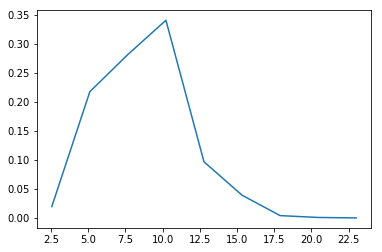

der15
[ 7.89813423  0.          0.          0.          0.          0.          0.
  0.          1.10186577]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.87757047  0.87757047  0.87757047  0.87757047  0.87757047  0.87757047
  0.87757047  0.87757047  1.        ]


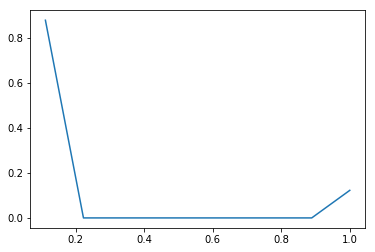

der16
[ 3.34988758  0.          0.          0.          0.          0.          0.
  0.          5.65011242]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.37220973  0.37220973  0.37220973  0.37220973  0.37220973  0.37220973
  0.37220973  0.37220973  1.        ]


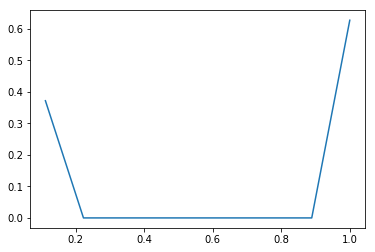

der17
[ 4.01236913  0.          0.          0.          0.          0.          0.
  0.          4.98763087]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.44581879  0.44581879  0.44581879  0.44581879  0.44581879  0.44581879
  0.44581879  0.44581879  1.        ]


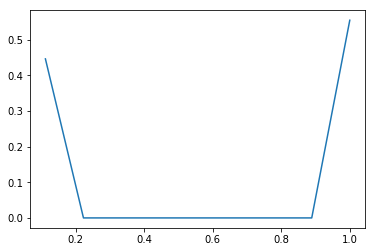

der18
[ 6.41493121  0.          0.          0.          0.          0.          0.
  0.          2.58506879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.71277013  0.71277013  0.71277013  0.71277013  0.71277013  0.71277013
  0.71277013  0.71277013  1.        ]


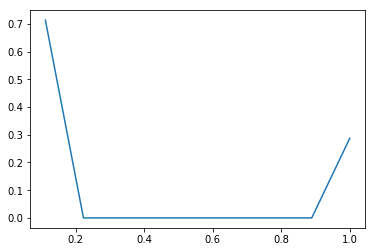

der19
[ 5.85918121  0.          0.          0.          0.          0.          0.
  0.          3.14081879]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.65102013  0.65102013  0.65102013  0.65102013  0.65102013  0.65102013
  0.65102013  0.65102013  1.        ]


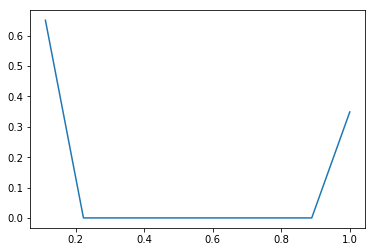

cat1
[ 2.17775336  0.          0.          0.62283221  0.          0.
  0.14207215  0.          0.05734228]
[ 1.          1.33333333  1.66666667  2.          2.33333333  2.66666667
  3.          3.33333333  3.66666667  4.        ]
[ 0.72591779  0.72591779  0.72591779  0.93352852  0.93352852  0.93352852
  0.98088591  0.98088591  1.        ]


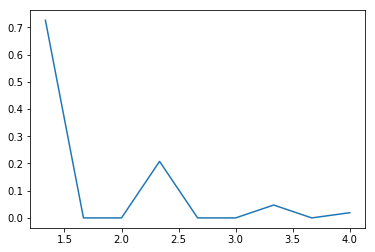

cat2
[ 5.24739262  0.          0.          0.          0.          0.          0.
  0.          3.75260738]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.58304362  0.58304362  0.58304362  0.58304362  0.58304362  0.58304362
  0.58304362  0.58304362  1.        ]


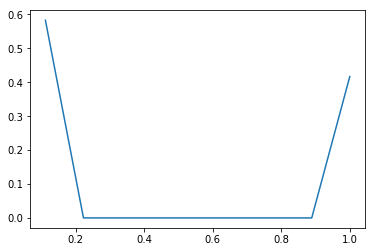

cat3
[ 1.34526342  0.02096728  0.          0.01053523  0.02074581  0.
  0.04623826  0.00415772  0.05209228]
[ 0.          0.66666667  1.33333333  2.          2.66666667  3.33333333
  4.          4.66666667  5.33333333  6.        ]
[ 0.89684228  0.91082047  0.91082047  0.91784396  0.9316745   0.9316745
  0.9625      0.96527181  1.        ]


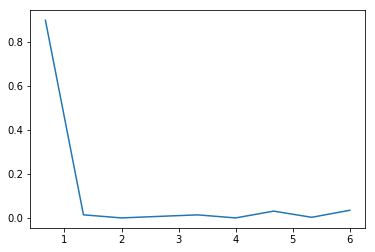

cat4
[ 0.00999939  0.00294326  0.00915101  0.03598627  0.11070439  0.24639353
  0.02074146  0.02793487  0.35432764]
[  0.           1.22222222   2.44444444   3.66666667   4.88888889
   6.11111111   7.33333333   8.55555556   9.77777778  11.        ]
[ 0.01222148  0.01581879  0.02700336  0.07098658  0.20629195  0.5074396
  0.53279027  0.56693289  1.        ]


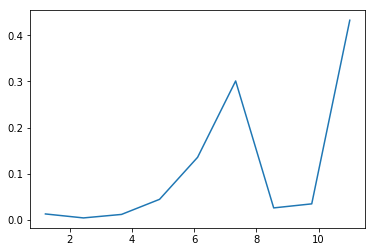

cat5
[ 1.53019631  0.          0.          0.          0.          0.          0.
  0.          7.46980369]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.17002181  0.17002181  0.17002181  0.17002181  0.17002181  0.17002181
  0.17002181  0.17002181  1.        ]


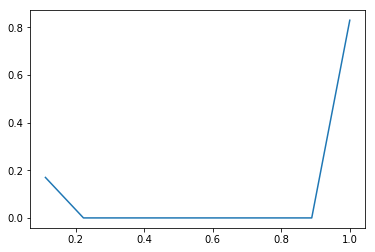

cat7
[  8.34305369e-01   5.39496644e-02   3.99395973e-02   1.07382550e-03
   3.85906040e-04   9.17785235e-04   2.61912752e-03   2.33221477e-04
   6.65755034e-02]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9.]
[ 0.83430537  0.88825503  0.92819463  0.92926846  0.92965436  0.93057215
  0.93319128  0.9334245   1.        ]


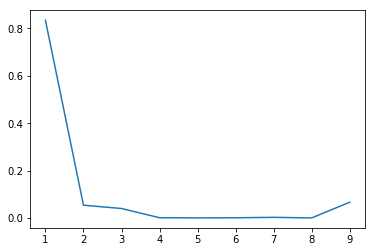

cat8
[ 2.35855872  0.          0.          0.          0.          0.          0.
  0.          6.64144128]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.26206208  0.26206208  0.26206208  0.26206208  0.26206208  0.26206208
  0.26206208  0.26206208  1.        ]


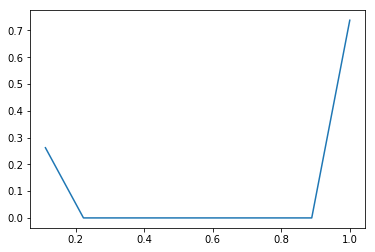

cat9
[ 0.20352685  0.01210008  0.02893999  0.03300296  0.01692252  0.14675987
  0.00767647  0.07201865  0.00846437]
[  0.           1.88888889   3.77777778   5.66666667   7.55555556
   9.44444444  11.33333333  13.22222222  15.11111111  17.        ]
[ 0.3844396   0.4072953   0.46195973  0.52429866  0.55626342  0.83347651
  0.84797651  0.98401174  1.        ]


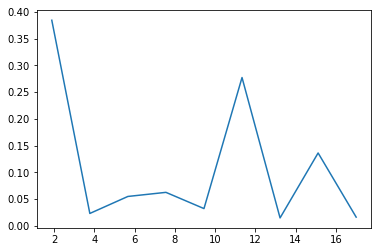

cat10
[ 0.46242785  0.          0.          0.          0.          0.          0.
  0.          8.53757215]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.05138087  0.05138087  0.05138087  0.05138087  0.05138087  0.05138087
  0.05138087  0.05138087  1.        ]


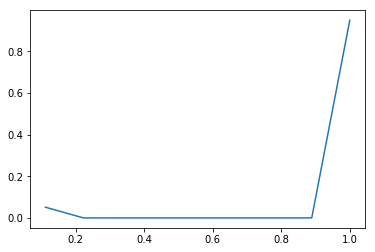

cat11
[ 1.51130537  0.          0.          0.          0.          0.          0.
  0.          7.48869463]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.16792282  0.16792282  0.16792282  0.16792282  0.16792282  0.16792282
  0.16792282  0.16792282  1.        ]


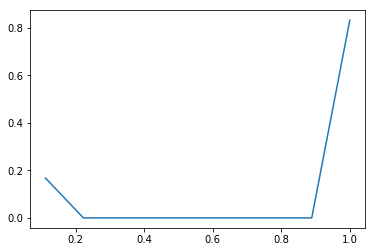

cat12
[ 0.73525923  0.          0.10993289  0.          1.33841779  0.          0.0557781
  0.          0.010612  ]
[ 0.          0.44444444  0.88888889  1.33333333  1.77777778  2.22222222
  2.66666667  3.11111111  3.55555556  4.        ]
[ 0.32678188  0.32678188  0.37564094  0.37564094  0.97049329  0.97049329
  0.99528356  0.99528356  1.        ]


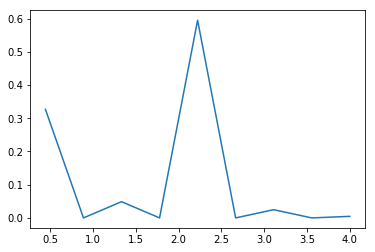

cat13
[  3.67172819e-02   0.00000000e+00   0.00000000e+00   0.00000000e+00
   4.46195386e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.32885906e-03]
[ 0.          0.22222222  0.44444444  0.66666667  0.88888889  1.11111111
  1.33333333  1.55555556  1.77777778  2.        ]
[ 0.0081594  0.0081594  0.0081594  0.0081594  0.9997047  0.9997047
  0.9997047  0.9997047  1.       ]


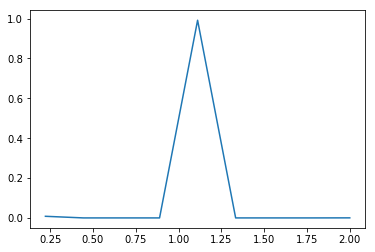

cat14
[ 0.00861647  0.00578971  0.00905043  0.00790982  0.00615521  0.01029235
  0.00628261  0.01103859  0.02224344]
[   1.           12.44444444   23.88888889   35.33333333   46.77777778
   58.22222222   69.66666667   81.11111111   92.55555556  104.        ]
[ 0.09861074  0.16487081  0.26844799  0.35897148  0.42941443  0.5472047
  0.6191057   0.74543624  1.        ]


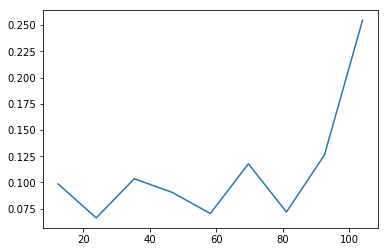

num1_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


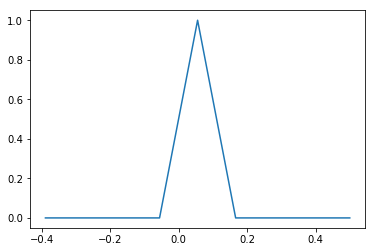

num2_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


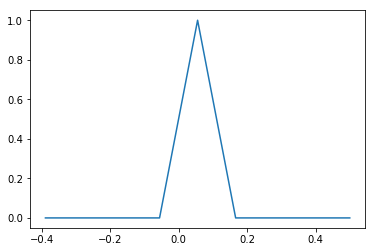

num3_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


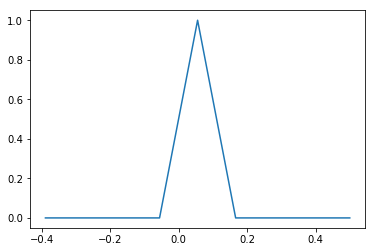

num4_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


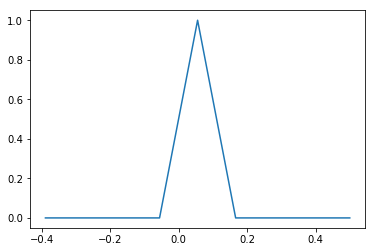

num5_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


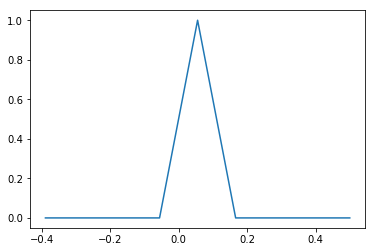

num6_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


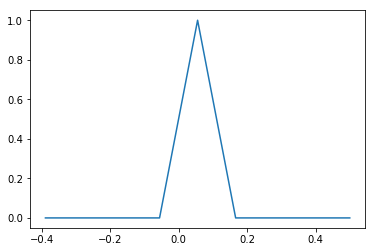

num7_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


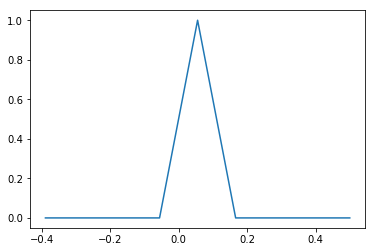

num8_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


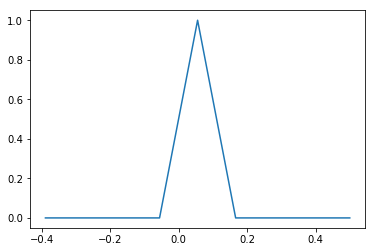

num9_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


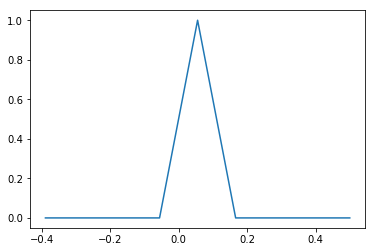

num10_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


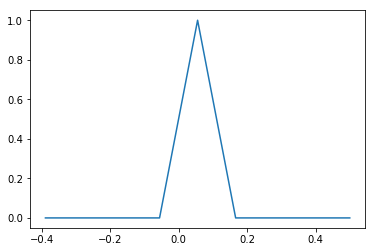

num11_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


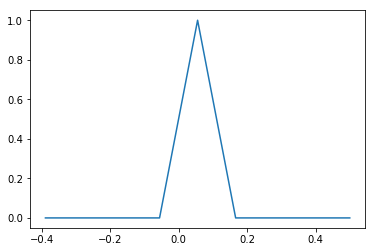

num12_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


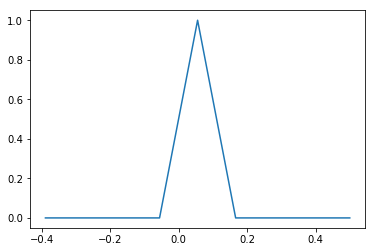

num13_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


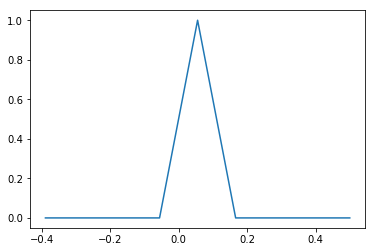

num14_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


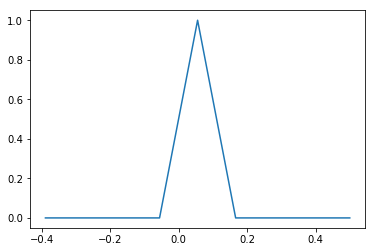

num15_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


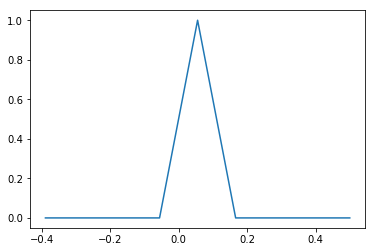

num16_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


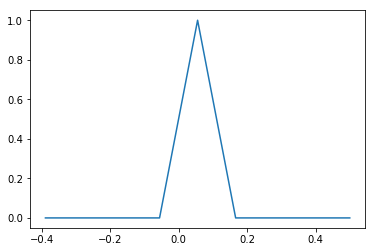

num17_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


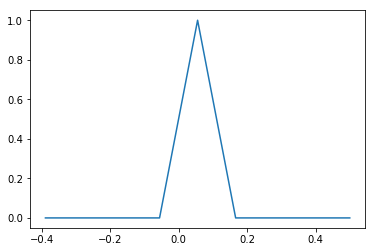

num18_
[ 7.37050168  0.          0.          0.          0.          0.          0.
  0.          1.62949832]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.81894463  0.81894463  0.81894463  0.81894463  0.81894463  0.81894463
  0.81894463  0.81894463  1.        ]


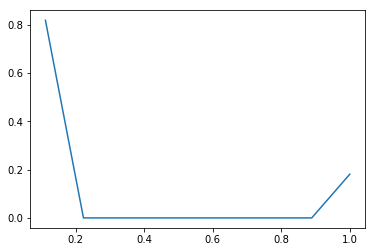

num19_
[  8.99992450e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   7.55033557e-05]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99999161  0.99999161  0.99999161  0.99999161  0.99999161  0.99999161
  0.99999161  0.99999161  1.        ]


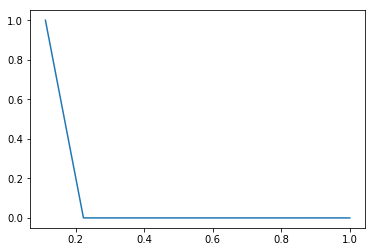

num20_
[  8.99998490e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.51006711e-05]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99999832  0.99999832  0.99999832  0.99999832  0.99999832  0.99999832
  0.99999832  0.99999832  1.        ]


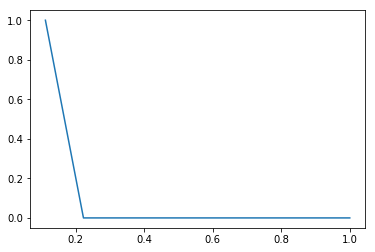

num21_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


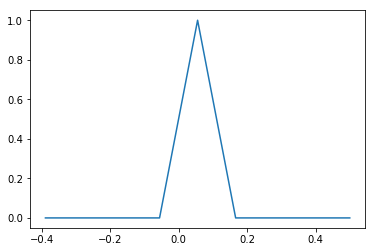

num22_
[ 8.35569966  0.          0.          0.          0.          0.          0.
  0.          0.64430034]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.92841107  0.92841107  0.92841107  0.92841107  0.92841107  0.92841107
  0.92841107  0.92841107  1.        ]


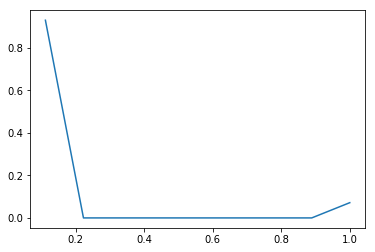

num23_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


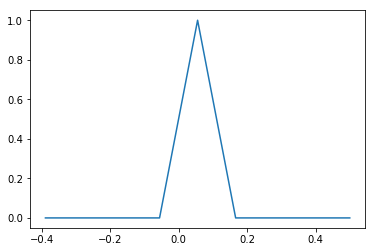

der1_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


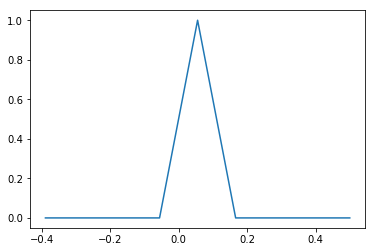

der2_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


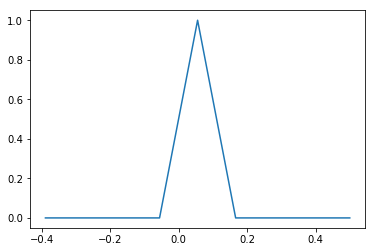

der3_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


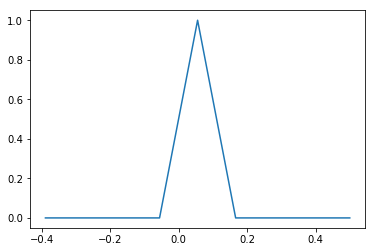

der4_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


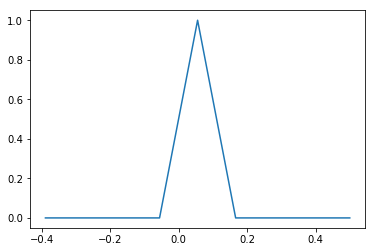

der5_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


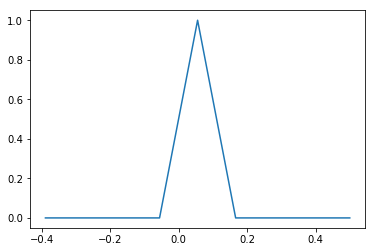

der6_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


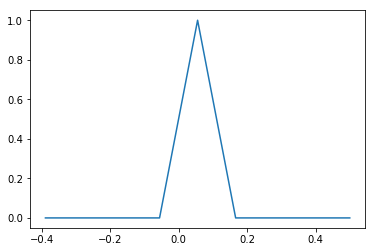

der7_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


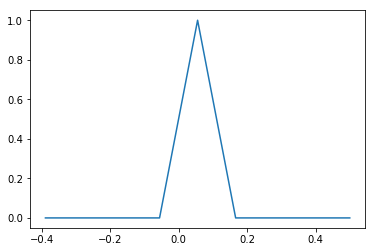

der8_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


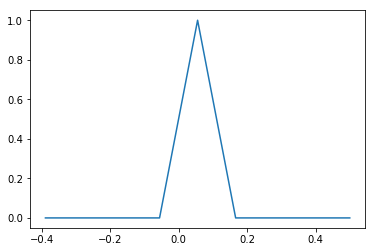

der9_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


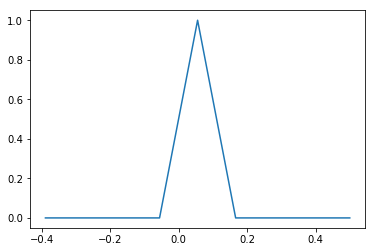

der10_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


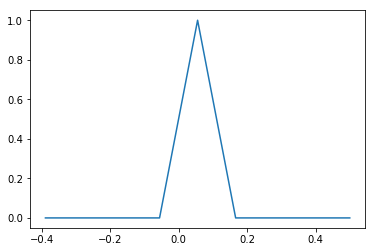

der11_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


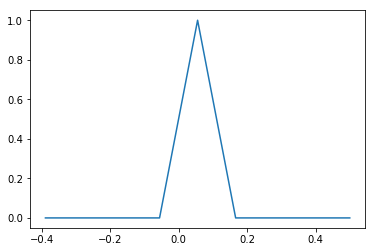

der12_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


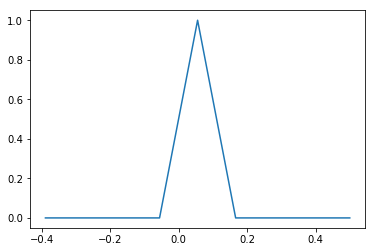

der13_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


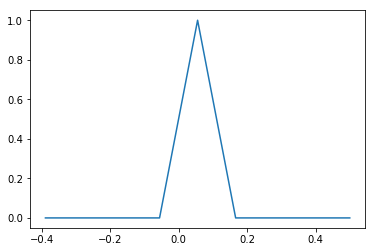

der14_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


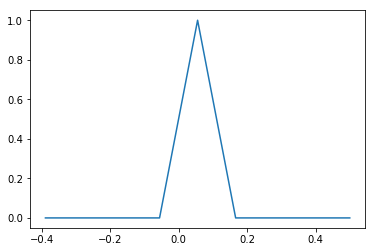

der15_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


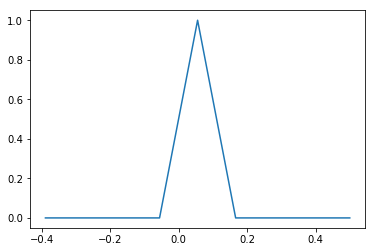

der16_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


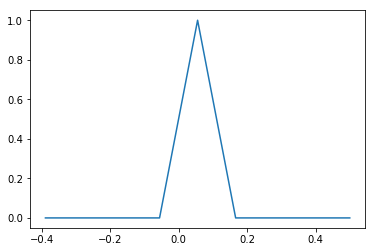

der17_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


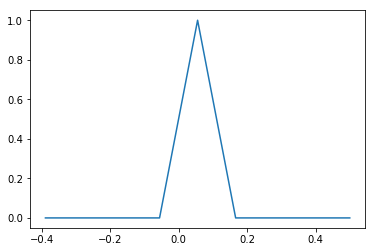

der18_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


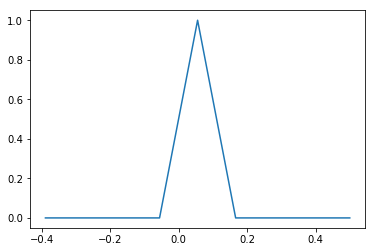

der19_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


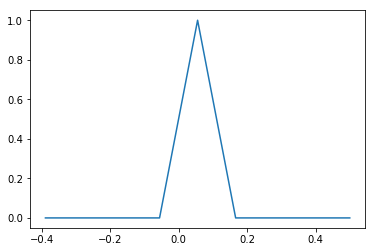

cat1_
[  8.99672315e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   3.27684564e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99963591  0.99963591  0.99963591  0.99963591  0.99963591  0.99963591
  0.99963591  0.99963591  1.        ]


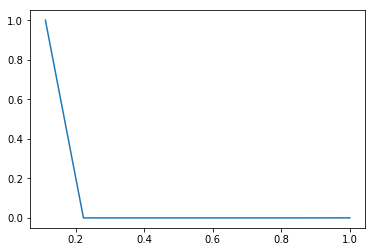

cat2_
[  8.99874664e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.25335570e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99986074  0.99986074  0.99986074  0.99986074  0.99986074  0.99986074
  0.99986074  0.99986074  1.        ]


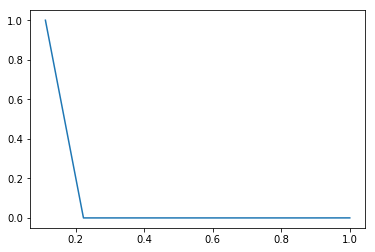

cat3_
[ 8.9122047  0.         0.         0.         0.         0.         0.         0.
  0.0877953]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99024497  0.99024497  0.99024497  0.99024497  0.99024497  0.99024497
  0.99024497  0.99024497  1.        ]


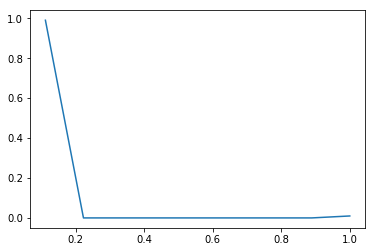

cat4_
[  8.99838423e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   1.61577181e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99982047  0.99982047  0.99982047  0.99982047  0.99982047  0.99982047
  0.99982047  0.99982047  1.        ]


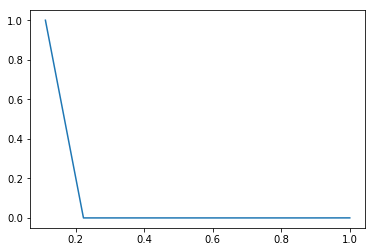

cat5_
[  8.99992450e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   7.55033557e-05]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99999161  0.99999161  0.99999161  0.99999161  0.99999161  0.99999161
  0.99999161  0.99999161  1.        ]


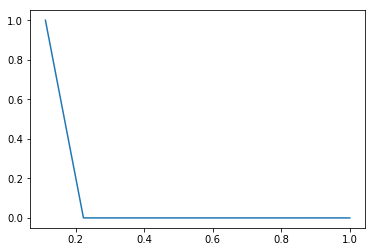

cat7_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


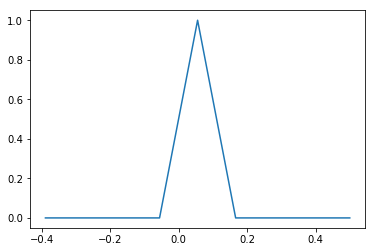

cat8_
[ 4.96920805  0.          0.          0.          0.          0.          0.
  0.          4.03079195]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.55213423  0.55213423  0.55213423  0.55213423  0.55213423  0.55213423
  0.55213423  0.55213423  1.        ]


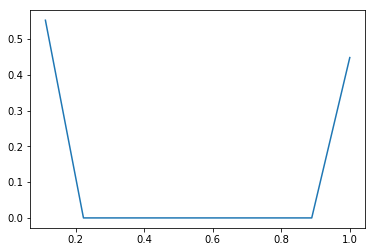

cat9_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


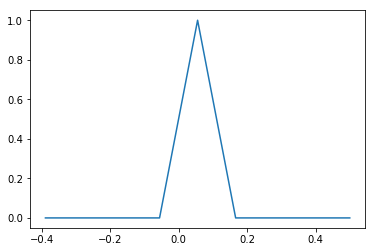

cat10_
[ 8.82629698  0.          0.          0.          0.          0.          0.
  0.          0.17370302]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.98069966  0.98069966  0.98069966  0.98069966  0.98069966  0.98069966
  0.98069966  0.98069966  1.        ]


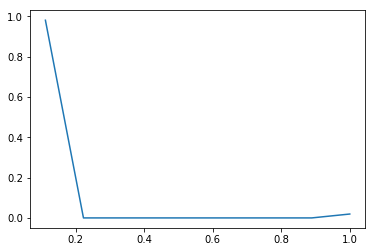

cat11_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


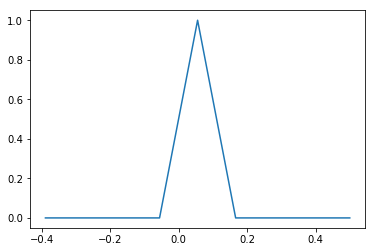

cat12_
[  8.99139262e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
   8.60738255e-03]
[ 0.          0.11111111  0.22222222  0.33333333  0.44444444  0.55555556
  0.66666667  0.77777778  0.88888889  1.        ]
[ 0.99904362  0.99904362  0.99904362  0.99904362  0.99904362  0.99904362
  0.99904362  0.99904362  1.        ]


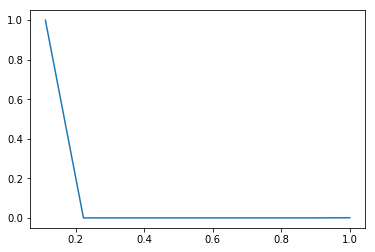

cat13_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


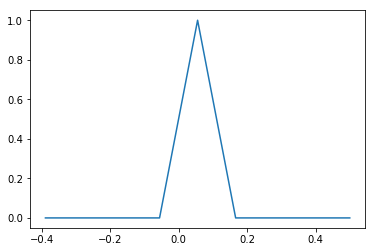

cat14_
[ 0.  0.  0.  0.  9.  0.  0.  0.  0.]
[-0.5        -0.38888889 -0.27777778 -0.16666667 -0.05555556  0.05555556
  0.16666667  0.27777778  0.38888889  0.5       ]
[ 0.  0.  0.  0.  1.  1.  1.  1.  1.]


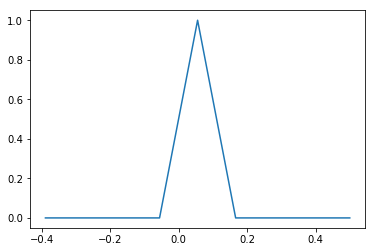

In [13]:
#for approach 1 mean,median,mode
print 'Approach 1 mean median mode'
for x in data_set_train.columns[1:len(data_set_train)-1]:
    counts, bin_edges = np.histogram(data_set_train_approach_1_mean[x], bins=9, 
                               density = True)
    print x
    print counts
    pdf = counts/(sum(counts))
    print(bin_edges)
    cdf = np.cumsum(pdf)
    print cdf
    mat.plot(bin_edges[1:],pdf)
    mat.show()
for x in data_set_train.columns[1:len(data_set_train)-1]:
    counts, bin_edges = np.histogram(data_set_train_approach_1_median[x], bins=9, 
                              density = True)
    print counts
    print x
    pdf = counts/(sum(counts))
    print(bin_edges)
    cdf = np.cumsum(pdf)
    print cdf
    mat.plot(bin_edges[1:],pdf)
    mat.show()
for x in data_set_train.columns[1:len(data_set_train)-1]:
    counts, bin_edges = np.histogram(data_set_train_approach_1_mode[x], bins=9, 
                               density = True)
    print x
    print counts
    pdf = counts/(sum(counts))
    print(bin_edges)
    cdf = np.cumsum(pdf)
    print cdf
    mat.plot(bin_edges[1:],pdf)
    mat.show()
print 'Approach 2 mean median mode'
for x in data_set_train.columns[1:len(data_set_train)-1]:
    counts, bin_edges = np.histogram(data_set_train_approach_2_mean[x], bins=9, 
                              density = True)
    print x
    print counts
    pdf = counts/(sum(counts))
    print(bin_edges)
    cdf = np.cumsum(pdf)
    print cdf
    mat.plot(bin_edges[1:],pdf)
    mat.show()
for x in data_set_train.columns[1:len(data_set_train)-1]:
    counts, bin_edges = np.histogram(data_set_train_approach_2_median[x], bins=9, 
                               density = True)
    print x
    print counts
    pdf = counts/(sum(counts))
    print(bin_edges)
    cdf = np.cumsum(pdf)
    print cdf
    mat.plot(bin_edges[1:],pdf)
    mat.show()
for x in data_set_train.columns[1:len(data_set_train)-1]:
    counts, bin_edges = np.histogram(data_set_train_approach_2_mode[x], bins=9, 
                               density = True)
    print x
    print counts
    pdf = counts/(sum(counts))
    print(bin_edges)
    cdf = np.cumsum(pdf)
    print cdf
    mat.plot(bin_edges[1:],pdf)
    mat.show()
print 'Approach number 3 mean median mode'
for x in data_set_train_add_on_features_approach3_mean.columns:
    if x!='target' and x!='id':
        counts, bin_edges = np.histogram(data_set_train_add_on_features_approach3_mean[x], bins=9, 
                               density = True)
        print x
        print counts
        pdf = counts/(sum(counts))
        print(bin_edges)
        cdf = np.cumsum(pdf)
        print cdf
        mat.plot(bin_edges[1:],pdf)
        mat.show()
for x in data_set_train_add_on_features_approach3_mean.columns:
    if x!='target' and x!='id':
        counts, bin_edges = np.histogram(data_set_train_add_on_features_approach3_median[x], bins=9, 
                               density = True)
        print x
        print counts
        pdf = counts/(sum(counts))
        print(bin_edges)
        cdf = np.cumsum(pdf)
        print cdf
        mat.plot(bin_edges[1:],pdf)
        mat.show()
for x in data_set_train_add_on_features_approach3_mean.columns:
    if x!='target' and x!='id':
        counts, bin_edges = np.histogram(data_set_train_add_on_features_approach3_mode[x], bins=9, 
                               density = True)
        print x
        print counts
        pdf = counts/(sum(counts))
        print(bin_edges)
        cdf = np.cumsum(pdf)
        print cdf
        mat.plot(bin_edges[1:],pdf)
        mat.show()
print 'Approach number 4 mean median mode'
for x in data_set_train_add_on_features_approach4_mean.columns:
    if x!='target' and x!='id':
        counts, bin_edges = np.histogram(data_set_train_add_on_features_approach4_mean[x], bins=9, 
                               density = True)
        print x
        print counts
        pdf = counts/(sum(counts))
        print(bin_edges)
        cdf = np.cumsum(pdf)
        print cdf
        mat.plot(bin_edges[1:],pdf)
        mat.show()
for x in data_set_train_add_on_features_approach4_mean.columns:
    if x!='target' and x!='id':
        counts, bin_edges = np.histogram(data_set_train_add_on_features_approach4_median[x], bins=9, 
                               density = True)
        
        print x
        print counts
        pdf = counts/(sum(counts))
        print(bin_edges)
        cdf = np.cumsum(pdf)
        print cdf
        mat.plot(bin_edges[1:],pdf)
        mat.show()
for x in data_set_train_add_on_features_approach4_mean.columns:
    if x!='target' and x!='id':
        counts, bin_edges = np.histogram(data_set_train_add_on_features_approach4_mode[x], bins=9, 
                               density = True)
        print x
        print counts
        pdf = counts/(sum(counts))
        print(bin_edges)
        cdf = np.cumsum(pdf)
        print cdf
        mat.plot(bin_edges[1:],pdf)
        mat.show()

#### from the approachs we didnt see any regular kind of distribution patterns 
#### we couldnt derive any gaussian from the above
#### conclusion the features doesnt contain any kind of regular distribution patters

# visualization techniques
## is the features corresponding to the labels  are linearly separable does top two eigen_vectors have more variance?
### let us visualize the features 
### 1st approach pca
###  2nd approach tsne


In [14]:
# remove the target from the columns
data_train_target=data_set_train['target']
data_set_train_approach_1_mean.drop('target',axis=1,inplace=True)
data_set_train_approach_1_mode.drop('target',axis=1,inplace=True)
data_set_train_approach_1_median.drop('target',axis=1,inplace=True)
data_set_train_approach_2_mean.drop('target',axis=1,inplace=True)
data_set_train_approach_2_median.drop('target',axis=1,inplace=True)
data_set_train_approach_2_mode.drop('target',axis=1,inplace=True)
data_set_train_add_on_features_approach3_mean.drop('target',axis=1,inplace=True)
data_set_train_add_on_features_approach3_mode.drop('target',axis=1,inplace=True)
data_set_train_add_on_features_approach3_median.drop('target',axis=1,inplace=True)
data_set_train_add_on_features_approach4_mean.drop('target',axis=1,inplace=True)
data_set_train_add_on_features_approach4_mode.drop('target',axis=1,inplace=True)
data_set_train_add_on_features_approach4_median.drop('target',axis=1,inplace=True)

##  2D Visualization using PCA 

In [15]:
#standardizing all the dataset data
standardized_data_approach1_mean = StandardScaler().fit_transform(data_set_train_approach_1_mean)
standardized_data_approach1_mode=StandardScaler().fit_transform(data_set_train_approach_1_mode)
standardized_data_approach1_median=StandardScaler().fit_transform(data_set_train_approach_1_median)
standardized_data_approach2_mean = StandardScaler().fit_transform(data_set_train_approach_2_mean)
standardized_data_approach2_mode=StandardScaler().fit_transform(data_set_train_approach_2_mode)
standardized_data_approach2_median=StandardScaler().fit_transform(data_set_train_approach_2_median)
standardized_data_approach3_mean = StandardScaler().fit_transform(data_set_train_add_on_features_approach3_mean)
standardized_data_approach3_mode=StandardScaler().fit_transform(data_set_train_add_on_features_approach3_mode)
standardized_data_approach3_median=StandardScaler().fit_transform(data_set_train_add_on_features_approach3_median)
standardized_data_approach4_mean = StandardScaler().fit_transform(data_set_train_add_on_features_approach4_mean)
standardized_data_approach4_mode=StandardScaler().fit_transform(data_set_train_add_on_features_approach4_mode)
standardized_data_approach4_median=StandardScaler().fit_transform(data_set_train_add_on_features_approach4_median)


In [16]:
standardized_data_approach1_mean

array([[-1.7320479 ,  0.05019382,  0.21358315, ..., -1.3637879 ,
         0.08584082, -1.52112727],
       [-1.73204209, -0.45387564,  0.95436269, ...,  0.68523282,
         0.08584082, -1.30908365],
       [-1.73203628,  1.5624022 ,  1.69514223, ...,  0.68523282,
         0.08584082, -0.06711394],
       ..., 
       [ 1.73203628,  0.05019382,  0.95436269, ...,  0.68523282,
         0.08584082, -1.73317088],
       [ 1.73204209, -0.45387564,  0.21358315, ..., -1.3637879 ,
         0.08584082,  0.75076856],
       [ 1.7320479 ,  0.55426328,  0.58397292, ...,  0.68523282,
         0.08584082,  1.08397995]])

In [17]:
#find the co-variance matrix which is : A^T * A
#matrix multiplication using numpy
covar_matrix_approach1_mean = np.matmul(standardized_data_approach1_mean.T , standardized_data_approach1_mean)
covar_matrix_approach1_median = np.matmul(standardized_data_approach1_median.T , standardized_data_approach1_median)
covar_matrix_approach1_mode = np.matmul(standardized_data_approach1_mode.T , standardized_data_approach1_mode)
covar_matrix_approach2_mean = np.matmul(standardized_data_approach2_mean.T , standardized_data_approach2_mean)
covar_matrix_approach2_median = np.matmul(standardized_data_approach2_median.T , standardized_data_approach2_median)
covar_matrix_approach2_mode = np.matmul(standardized_data_approach2_mode.T , standardized_data_approach2_mode)
covar_matrix_approach3_mean = np.matmul(standardized_data_approach3_mean.T , standardized_data_approach3_mean)
covar_matrix_approach3_median = np.matmul(standardized_data_approach3_median.T , standardized_data_approach3_median)
covar_matrix_approach3_mode = np.matmul(standardized_data_approach3_mode.T , standardized_data_approach3_mode)
covar_matrix_approach4_mean = np.matmul(standardized_data_approach4_mean.T , standardized_data_approach4_mean)
covar_matrix_approach4_median = np.matmul(standardized_data_approach4_median.T , standardized_data_approach4_median)
covar_matrix_approach4_mode = np.matmul(standardized_data_approach4_mode.T , standardized_data_approach4_mode)

print ( "The shape of variance matrix = ", covar_matrix_approach1_mean.shape)
print ( "The shape of variance matrix = ", covar_matrix_approach1_median.shape)
print ( "The shape of variance matrix = ", covar_matrix_approach1_mode.shape)
print ( "The shape of variance matrix = ", covar_matrix_approach2_mean.shape)
print ( "The shape of variance matrix = ", covar_matrix_approach2_median.shape)
print ( "The shape of variance matrix = ", covar_matrix_approach2_mode.shape)
print ( "The shape of variance matrix = ", covar_matrix_approach3_mean.shape)
print ( "The shape of variance matrix = ", covar_matrix_approach3_median.shape)
print ( "The shape of variance matrix = ", covar_matrix_approach3_mode.shape)
print ( "The shape of variance matrix = ", covar_matrix_approach4_mean.shape)
print ( "The shape of variance matrix = ", covar_matrix_approach4_median.shape)
print ( "The shape of variance matrix = ", covar_matrix_approach4_mode.shape)


('The shape of variance matrix = ', (56, 56))
('The shape of variance matrix = ', (56, 56))
('The shape of variance matrix = ', (56, 56))
('The shape of variance matrix = ', (56, 56))
('The shape of variance matrix = ', (56, 56))
('The shape of variance matrix = ', (56, 56))
('The shape of variance matrix = ', (111, 111))
('The shape of variance matrix = ', (111, 111))
('The shape of variance matrix = ', (111, 111))
('The shape of variance matrix = ', (111, 111))
('The shape of variance matrix = ', (111, 111))
('The shape of variance matrix = ', (111, 111))


In [18]:
# finding the top two eigen-values and corresponding eigen-vectors 
# for projecting onto a 2-Dim space.


# the parameter 'eigvals' is defined (low value to heigh value) 
# eigh function will return the eigen values in asending order
# this code generates only the top 2 (782 and 783) eigenvalues.
values_approach1_mean, vectors_approach1_mean = eigh(covar_matrix_approach1_mean, eigvals=(54,55))
values_approach1_median, vectors_approach1_median = eigh(covar_matrix_approach1_median, eigvals=(54,55))
values_approach1_mode, vectors_approach1_mode = eigh(covar_matrix_approach1_mode, eigvals=(54,55))

values_approach2_mean, vectors_approach2_mean = eigh(covar_matrix_approach2_mean, eigvals=(54,55))
values_approach2_median, vectors_approach2_median = eigh(covar_matrix_approach2_median, eigvals=(54,55))
values_approach2_mode, vectors_approach2_mode = eigh(covar_matrix_approach2_mode, eigvals=(54,55))

values_approach3_mean, vectors_approach3_mean = eigh(covar_matrix_approach3_mean, eigvals=(109,110))
values_approach3_median, vectors_approach3_median = eigh(covar_matrix_approach3_median, eigvals=(109,110))
values_approach3_mode, vectors_approach3_mode = eigh(covar_matrix_approach3_mode, eigvals=(109,110))

values_approach4_mean, vectors_approach4_mean = eigh(covar_matrix_approach4_mean, eigvals=(109,110))
values_approach4_median, vectors_approach4_median = eigh(covar_matrix_approach4_median, eigvals=(109,110))
values_approach4_mode, vectors_approach4_mode = eigh(covar_matrix_approach4_mode, eigvals=(109,110))

print("Shape of eigen vectors = ",vectors_approach1_mean.shape)
print("Shape of eigen vectors = ",vectors_approach1_median.shape)
print("Shape of eigen vectors = ",vectors_approach1_mode.shape)
print("Shape of eigen vectors = ",vectors_approach2_mean.shape)
print("Shape of eigen vectors = ",vectors_approach2_median.shape)
print("Shape of eigen vectors = ",vectors_approach2_mode.shape)
print("Shape of eigen vectors = ",vectors_approach3_mean.shape)
print("Shape of eigen vectors = ",vectors_approach3_median.shape)
print("Shape of eigen vectors = ",vectors_approach3_mode.shape)
print("Shape of eigen vectors = ",vectors_approach4_mean.shape)
print("Shape of eigen vectors = ",vectors_approach4_median.shape)
print("Shape of eigen vectors = ",vectors_approach4_mode.shape)

# converting the eigen vectors into (2,d) shape for easyness of further computations
vectors_approach1_mean = vectors_approach1_mean.T
vectors_approach1_median=vectors_approach1_median.T
vectors_approach1_mode=vectors_approach1_mode.T
vectors_approach2_mean=vectors_approach2_mean.T
vectors_approach2_median=vectors_approach2_median.T
vectors_approach2_mode=vectors_approach2_mode.T
vectors_approach3_mean=vectors_approach3_mean.T
vectors_approach3_median=vectors_approach3_median.T
vectors_approach3_mode=vectors_approach3_mode.T
vectors_approach4_mean=vectors_approach4_mean.T
vectors_approach4_median=vectors_approach4_median.T
vectors_approach4_mode=vectors_approach4_mode.T
print 'the shape of transposed eigen vectors '
print("Shape of eigen vectors = ",vectors_approach1_mean.shape)
print("Shape of eigen vectors = ",vectors_approach1_median.shape)
print("Shape of eigen vectors = ",vectors_approach1_mode.shape)
print("Shape of eigen vectors = ",vectors_approach2_mean.shape)
print("Shape of eigen vectors = ",vectors_approach2_median.shape)
print("Shape of eigen vectors = ",vectors_approach2_mode.shape)
print("Shape of eigen vectors = ",vectors_approach3_mean.shape)
print("Shape of eigen vectors = ",vectors_approach3_median.shape)
print("Shape of eigen vectors = ",vectors_approach3_mode.shape)
print("Shape of eigen vectors = ",vectors_approach4_mean.shape)
print("Shape of eigen vectors = ",vectors_approach4_median.shape)
print("Shape of eigen vectors = ",vectors_approach4_mode.shape)
# here the vectors[1] represent the eigen vector corresponding 1st principal eigen vector
# here the vectors[0] represent the eigen vector corresponding 2nd principal eigen vector

('Shape of eigen vectors = ', (56, 2))
('Shape of eigen vectors = ', (56, 2))
('Shape of eigen vectors = ', (56, 2))
('Shape of eigen vectors = ', (56, 2))
('Shape of eigen vectors = ', (56, 2))
('Shape of eigen vectors = ', (56, 2))
('Shape of eigen vectors = ', (111, 2))
('Shape of eigen vectors = ', (111, 2))
('Shape of eigen vectors = ', (111, 2))
('Shape of eigen vectors = ', (111, 2))
('Shape of eigen vectors = ', (111, 2))
('Shape of eigen vectors = ', (111, 2))
the shape of transposed eigen vectors 
('Shape of eigen vectors = ', (2, 56))
('Shape of eigen vectors = ', (2, 56))
('Shape of eigen vectors = ', (2, 56))
('Shape of eigen vectors = ', (2, 56))
('Shape of eigen vectors = ', (2, 56))
('Shape of eigen vectors = ', (2, 56))
('Shape of eigen vectors = ', (2, 111))
('Shape of eigen vectors = ', (2, 111))
('Shape of eigen vectors = ', (2, 111))
('Shape of eigen vectors = ', (2, 111))
('Shape of eigen vectors = ', (2, 111))
('Shape of eigen vectors = ', (2, 111))


In [19]:
# projecting the original data sample on the plane 
#formed by two principal eigen vectors by vector-vector multiplication.

import matplotlib.pyplot as plt
new_coordinates_approach1_mean = np.matmul(vectors_approach1_mean, standardized_data_approach1_mean.T)
new_coordinates_approach1_median = np.matmul(vectors_approach1_median, standardized_data_approach1_median.T)
new_coordinates_approach1_mode = np.matmul(vectors_approach1_mode, standardized_data_approach1_mode.T)
new_coordinates_approach2_mean = np.matmul(vectors_approach2_mean, standardized_data_approach2_mean.T)
new_coordinates_approach2_median = np.matmul(vectors_approach2_median, standardized_data_approach2_median.T)
new_coordinates_approach2_mode = np.matmul(vectors_approach2_mode, standardized_data_approach2_mode.T)
new_coordinates_approach3_mean = np.matmul(vectors_approach3_mean, standardized_data_approach3_mean.T)
new_coordinates_approach3_median = np.matmul(vectors_approach3_median, standardized_data_approach3_median.T)
new_coordinates_approach3_mode = np.matmul(vectors_approach3_mode, standardized_data_approach3_mode.T)
new_coordinates_approach4_mean = np.matmul(vectors_approach4_mean, standardized_data_approach4_mean.T)
new_coordinates_approach4_median = np.matmul(vectors_approach4_median, standardized_data_approach4_median.T)
new_coordinates_approach4_mode = np.matmul(vectors_approach4_mode, standardized_data_approach4_mode.T)

print (" resultanat new data points' shape ", vectors_approach1_mean.shape, "X", standardized_data_approach1_mean.T.shape," = ", new_coordinates_approach1_mean.shape)
print (" resultanat new data points' shape ", vectors_approach1_median.shape, "X", standardized_data_approach1_median.T.shape," = ", new_coordinates_approach1_median.shape)
print (" resultanat new data points' shape ", vectors_approach1_mode.shape, "X", standardized_data_approach1_mode.T.shape," = ", new_coordinates_approach1_mode.shape)
print (" resultanat new data points' shape ", vectors_approach2_mean.shape, "X", standardized_data_approach2_mean.T.shape," = ", new_coordinates_approach2_mean.shape)
print (" resultanat new data points' shape ", vectors_approach2_median.shape, "X", standardized_data_approach2_median.T.shape," = ", new_coordinates_approach2_median.shape)
print (" resultanat new data points' shape ", vectors_approach2_mode.shape, "X", standardized_data_approach2_mode.T.shape," = ", new_coordinates_approach2_mode.shape)
print (" resultanat new data points' shape ", vectors_approach3_mean.shape, "X", standardized_data_approach3_mean.T.shape," = ", new_coordinates_approach3_mean.shape)
print (" resultanat new data points' shape ", vectors_approach3_median.shape, "X", standardized_data_approach3_median.T.shape," = ", new_coordinates_approach3_median.shape)
print (" resultanat new data points' shape ", vectors_approach3_mode.shape, "X", standardized_data_approach3_mode.T.shape," = ", new_coordinates_approach3_mode.shape)
print (" resultanat new data points' shape ", vectors_approach4_mean.shape, "X", standardized_data_approach4_mean.T.shape," = ", new_coordinates_approach4_mean.shape)
print (" resultanat new data points' shape ", vectors_approach4_median.shape, "X", standardized_data_approach4_median.T.shape," = ", new_coordinates_approach4_median.shape)
print (" resultanat new data points' shape ", vectors_approach4_mode.shape, "X", standardized_data_approach4_mode.T.shape," = ", new_coordinates_approach4_mode.shape)


(" resultanat new data points' shape ", (2, 56), 'X', (56, 596000), ' = ', (2, 596000))
(" resultanat new data points' shape ", (2, 56), 'X', (56, 596000), ' = ', (2, 596000))
(" resultanat new data points' shape ", (2, 56), 'X', (56, 596000), ' = ', (2, 596000))
(" resultanat new data points' shape ", (2, 56), 'X', (56, 596000), ' = ', (2, 596000))
(" resultanat new data points' shape ", (2, 56), 'X', (56, 596000), ' = ', (2, 596000))
(" resultanat new data points' shape ", (2, 56), 'X', (56, 596000), ' = ', (2, 596000))
(" resultanat new data points' shape ", (2, 111), 'X', (111, 596000), ' = ', (2, 596000))
(" resultanat new data points' shape ", (2, 111), 'X', (111, 596000), ' = ', (2, 596000))
(" resultanat new data points' shape ", (2, 111), 'X', (111, 596000), ' = ', (2, 596000))
(" resultanat new data points' shape ", (2, 111), 'X', (111, 596000), ' = ', (2, 596000))
(" resultanat new data points' shape ", (2, 111), 'X', (111, 596000), ' = ', (2, 596000))
(" resultanat new data

## visualization using PCA

In [20]:
# appending label to the 2d projected data
new_coordinates_approach1_mean = np.vstack((new_coordinates_approach1_mean, np.array(data_set_target_train))).T
new_coordinates_approach1_median = np.vstack((new_coordinates_approach1_median, np.array(data_set_target_train))).T
new_coordinates_approach1_mode = np.vstack((new_coordinates_approach1_mode, np.array(data_set_target_train))).T
new_coordinates_approach2_mean = np.vstack((new_coordinates_approach2_mean, np.array(data_set_target_train))).T
new_coordinates_approach2_median = np.vstack((new_coordinates_approach2_median, np.array(data_set_target_train))).T
new_coordinates_approach2_mode = np.vstack((new_coordinates_approach2_mode, np.array(data_set_target_train))).T
new_coordinates_approach3_mean = np.vstack((new_coordinates_approach3_mean, np.array(data_set_target_train))).T
new_coordinates_approach3_median = np.vstack((new_coordinates_approach3_median, np.array(data_set_target_train))).T
new_coordinates_approach3_mode = np.vstack((new_coordinates_approach3_mode, np.array(data_set_target_train))).T
new_coordinates_approach4_mean = np.vstack((new_coordinates_approach4_mean, np.array(data_set_target_train))).T
new_coordinates_approach4_median = np.vstack((new_coordinates_approach4_median, np.array(data_set_target_train))).T
new_coordinates_approach4_mode = np.vstack((new_coordinates_approach4_mode, np.array(data_set_target_train))).T

# creating a new data frame for ploting the labeled points.
dataframe_approach1_mean = pd.DataFrame(data=new_coordinates_approach1_mean, columns=("1st_principal", "2nd_principal", "label"))
dataframe_approach1_median = pd.DataFrame(data=new_coordinates_approach1_median, columns=("1st_principal", "2nd_principal", "label"))
dataframe_approach1_mode = pd.DataFrame(data=new_coordinates_approach1_mode, columns=("1st_principal", "2nd_principal", "label"))
dataframe_approach2_mean = pd.DataFrame(data=new_coordinates_approach2_mean, columns=("1st_principal", "2nd_principal", "label"))
dataframe_approach2_median = pd.DataFrame(data=new_coordinates_approach2_median, columns=("1st_principal", "2nd_principal", "label"))
dataframe_approach2_mode = pd.DataFrame(data=new_coordinates_approach2_mode, columns=("1st_principal", "2nd_principal", "label"))
dataframe_approach3_mean = pd.DataFrame(data=new_coordinates_approach3_mean, columns=("1st_principal", "2nd_principal", "label"))
dataframe_approach3_median = pd.DataFrame(data=new_coordinates_approach3_median, columns=("1st_principal", "2nd_principal", "label"))
dataframe_approach3_mode = pd.DataFrame(data=new_coordinates_approach3_mode, columns=("1st_principal", "2nd_principal", "label"))
dataframe_approach4_mean = pd.DataFrame(data=new_coordinates_approach4_mean, columns=("1st_principal", "2nd_principal", "label"))
dataframe_approach4_median = pd.DataFrame(data=new_coordinates_approach4_median, columns=("1st_principal", "2nd_principal", "label"))
dataframe_approach4_mode= pd.DataFrame(data=new_coordinates_approach4_mode, columns=("1st_principal", "2nd_principal", "label"))



approach one mean


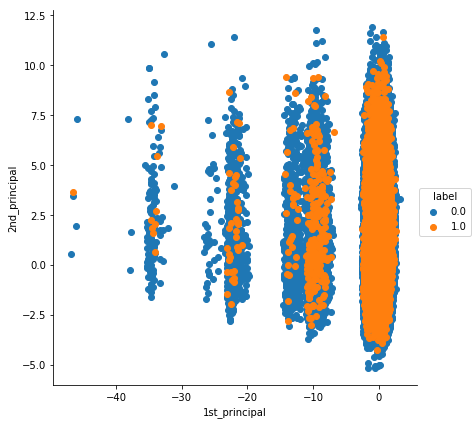

approach one median


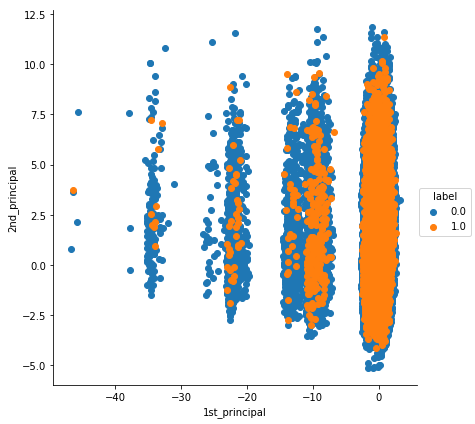

approach one mode


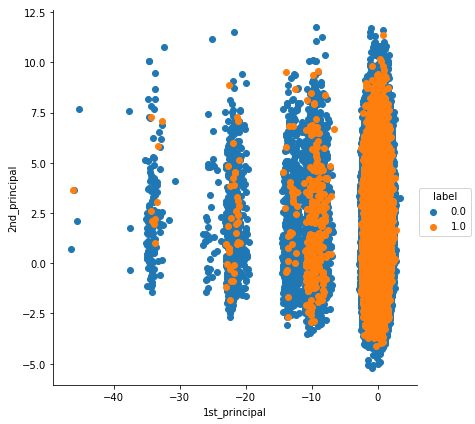

approach two mean


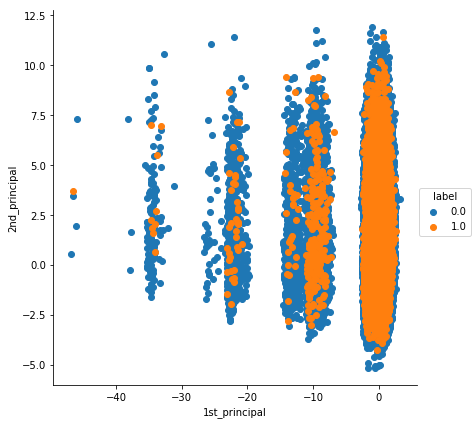

approach two median


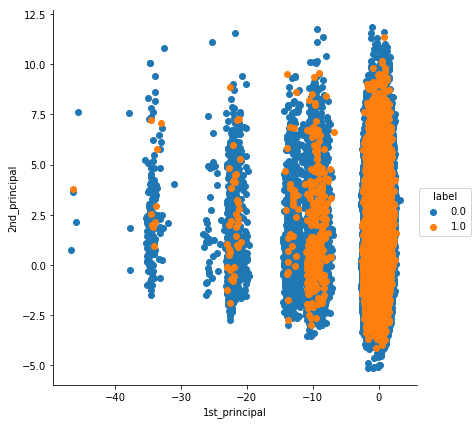

approach two mode


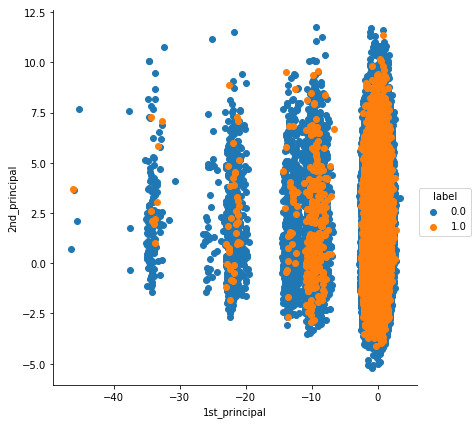

approach three mean


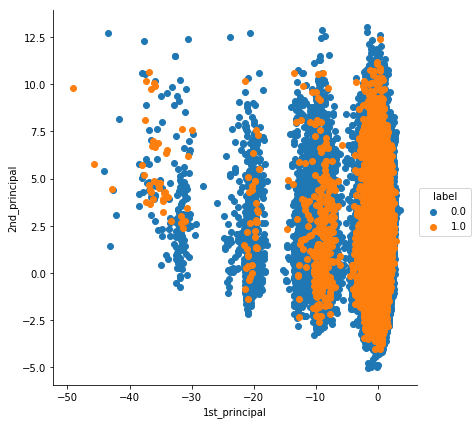

approach three median


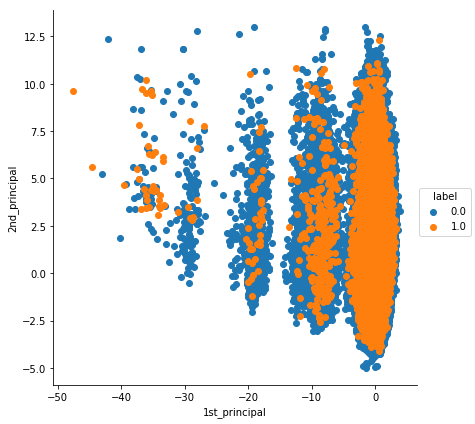

approach three mode


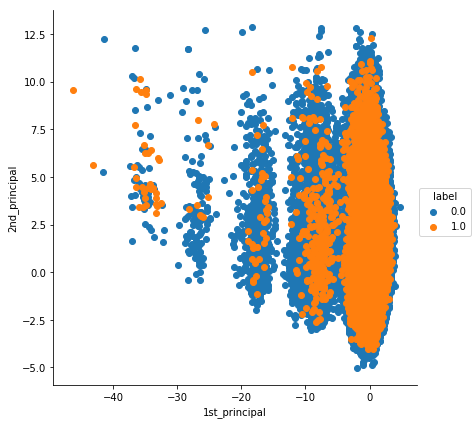

approach four mean


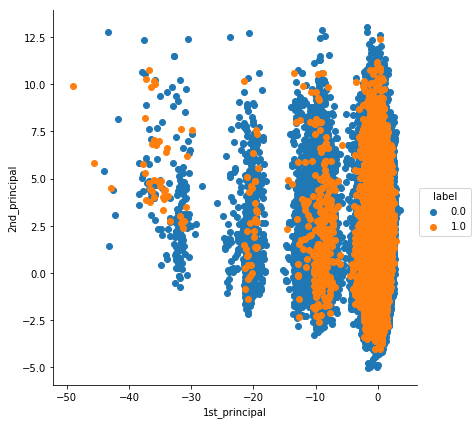

approach four median


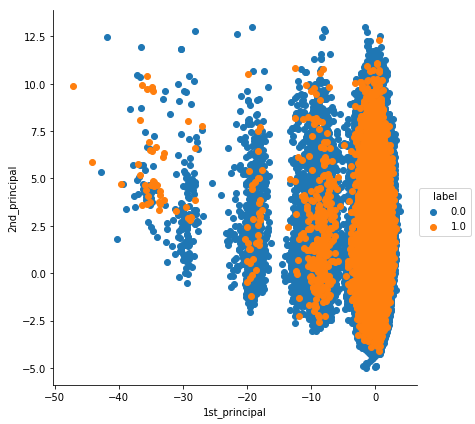

approach four mode


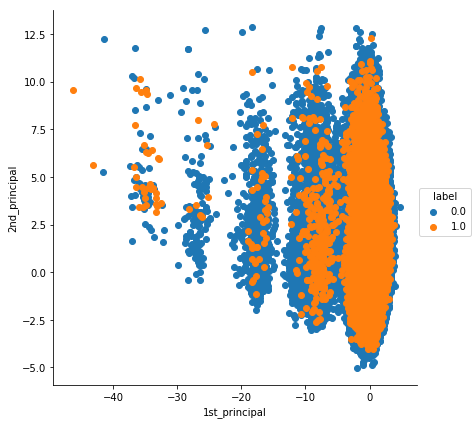

In [21]:
import seaborn as sn
print 'approach one mean'
sn.FacetGrid(dataframe_approach1_mean, hue="label", size=6).map(plt.scatter, '1st_principal', '2nd_principal').add_legend()
plt.show()
print 'approach one median'
sn.FacetGrid(dataframe_approach1_median, hue="label", size=6).map(plt.scatter, '1st_principal', '2nd_principal').add_legend()
plt.show()
print 'approach one mode'
sn.FacetGrid(dataframe_approach1_mode, hue="label", size=6).map(plt.scatter, '1st_principal', '2nd_principal').add_legend()
plt.show()
print 'approach two mean'
sn.FacetGrid(dataframe_approach2_mean, hue="label", size=6).map(plt.scatter, '1st_principal', '2nd_principal').add_legend()
plt.show()
print 'approach two median'
sn.FacetGrid(dataframe_approach2_median, hue="label", size=6).map(plt.scatter, '1st_principal', '2nd_principal').add_legend()
plt.show()
print 'approach two mode'
sn.FacetGrid(dataframe_approach2_mode, hue="label", size=6).map(plt.scatter, '1st_principal', '2nd_principal').add_legend()
plt.show()
print 'approach three mean'
sn.FacetGrid(dataframe_approach3_mean, hue="label", size=6).map(plt.scatter, '1st_principal', '2nd_principal').add_legend()
plt.show()
print 'approach three median'
sn.FacetGrid(dataframe_approach3_median, hue="label", size=6).map(plt.scatter, '1st_principal', '2nd_principal').add_legend()
plt.show()
print 'approach three mode'
sn.FacetGrid(dataframe_approach3_mode, hue="label", size=6).map(plt.scatter, '1st_principal', '2nd_principal').add_legend()
plt.show()
print 'approach four mean'
sn.FacetGrid(dataframe_approach4_mean, hue="label", size=6).map(plt.scatter, '1st_principal', '2nd_principal').add_legend()
plt.show()
print 'approach four median'
sn.FacetGrid(dataframe_approach4_median, hue="label", size=6).map(plt.scatter, '1st_principal', '2nd_principal').add_legend()
plt.show()
print 'approach four mode'

sn.FacetGrid(dataframe_approach4_mode, hue="label", size=6).map(plt.scatter, '1st_principal', '2nd_principal').add_legend()
plt.show()


### from the above visualization we can say that there is no linear seperation in the data and there is a overlap in points of both the labels.
### the eigen vectors doesnt have more variance.

## TSNE visualization 
### let us take 2000 data points as tsne takes a longer time for visualization

approach one mean


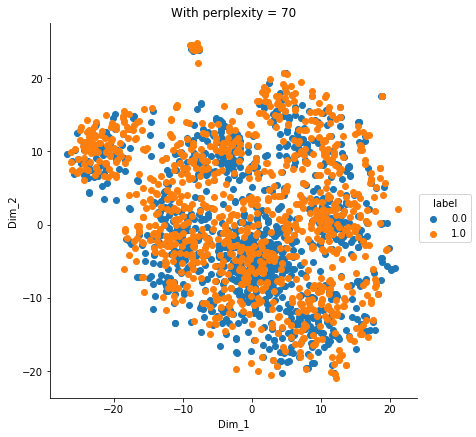

approach one median


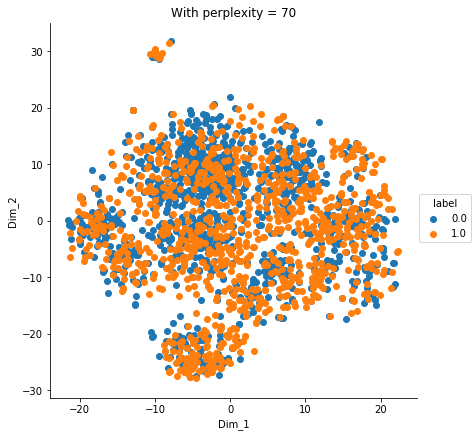

approach one mode


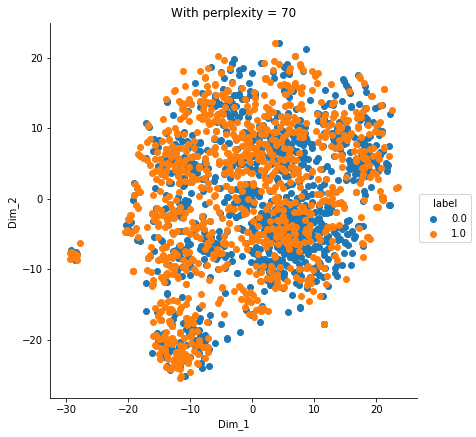

approach two mean


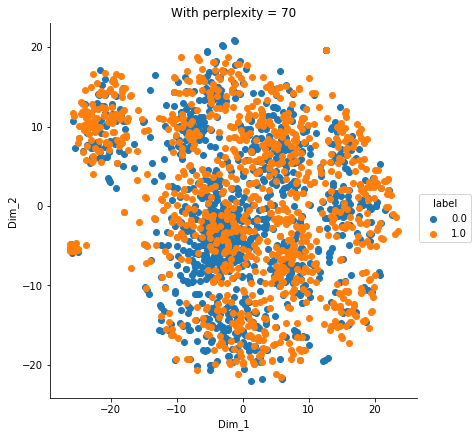

approach two median


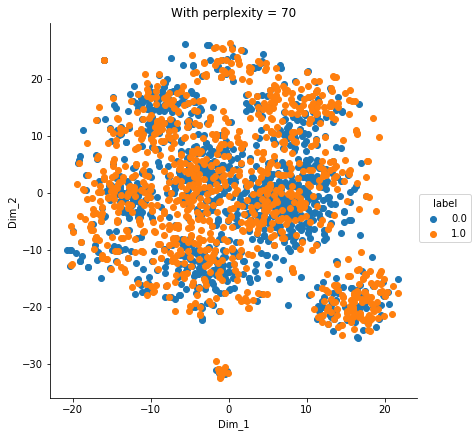

approach two mode


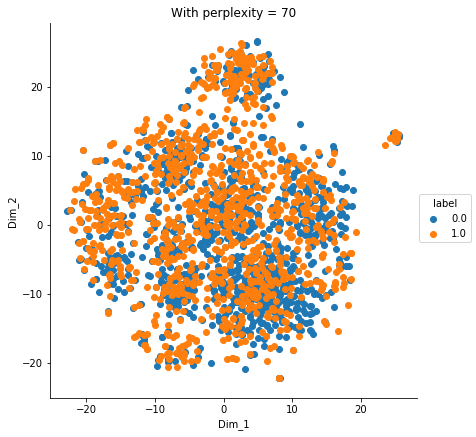

approach three mean


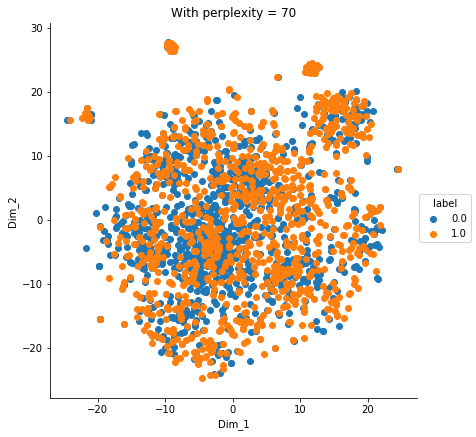

approach three median


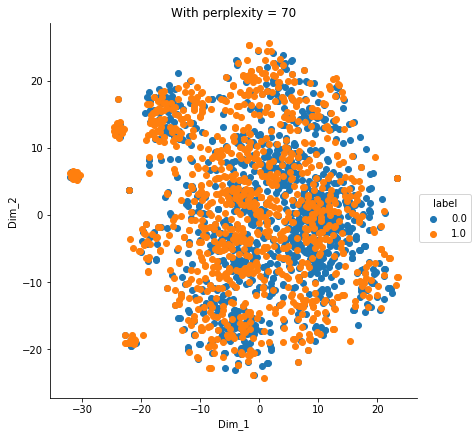

approach three mode


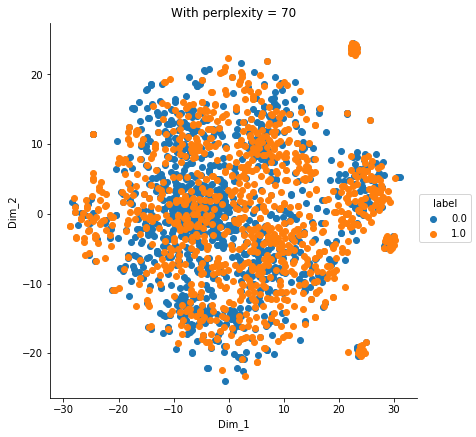

approach four mean


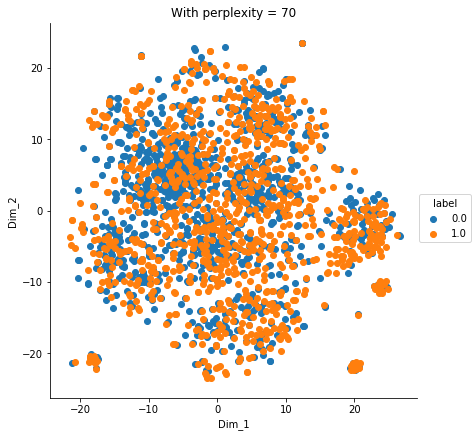

approach four median


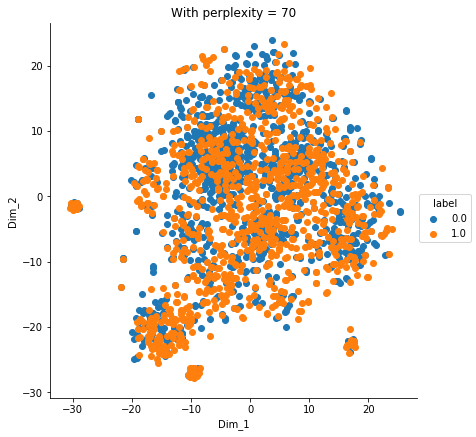

approach four mode


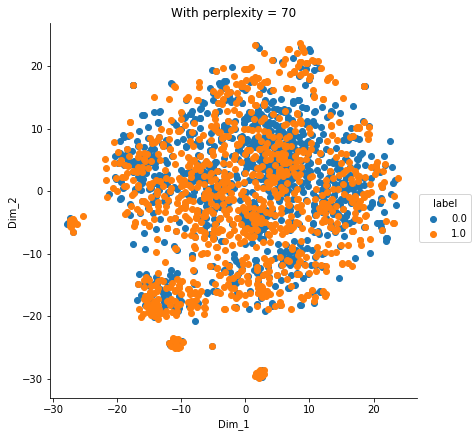

In [22]:
print 'approach one mean'

k=pd.DataFrame(standardized_data_approach1_mean,columns=data_set_train_approach_1_mean.columns)
k['target']=data_set_target_train
first_1000_0=k[k['target']==0][:1000]
first_1000_1=k[k['target']==1][:1000]
k=pd.concat([first_1000_0,first_1000_1])
labels_2000=k['target']
k.drop('target',axis=1,inplace=True)
data_2000=np.array(k)
model = TSNE(n_components=2, random_state=0,perplexity=70)
# configuring the parameteres
# the number of components = 2
# default perplexity = 30
# default learning rate = 200
# default Maximum number of iterations for the optimization = 1000

tsne_data = model.fit_transform(data_2000)


# creating a new data frame which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, labels_2000)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

# Ploting the result of tsne
sn.FacetGrid(tsne_df, hue="label", size=6).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.title('With perplexity = 70')

plt.show()

print 'approach one median'

k=pd.DataFrame(standardized_data_approach1_median,columns=data_set_train_approach_1_mean.columns)
k['target']=data_set_target_train
first_1000_0=k[k['target']==0][:1000]
first_1000_1=k[k['target']==1][:1000]
k=pd.concat([first_1000_0,first_1000_1])
labels_2000=k['target']
k.drop('target',axis=1,inplace=True)
data_2000=np.array(k)
model = TSNE(n_components=2, random_state=0,perplexity=70)
# configuring the parameteres
# the number of components = 2
# default perplexity = 30
# default learning rate = 200
# default Maximum number of iterations for the optimization = 1000

tsne_data = model.fit_transform(data_2000)


# creating a new data frame which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, labels_2000)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

# Ploting the result of tsne
sn.FacetGrid(tsne_df, hue="label", size=6).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.title('With perplexity = 70')

plt.show()

print 'approach one mode'

k=pd.DataFrame(standardized_data_approach1_mode,columns=data_set_train_approach_1_mean.columns)
k['target']=data_set_target_train
first_1000_0=k[k['target']==0][:1000]
first_1000_1=k[k['target']==1][:1000]
k=pd.concat([first_1000_0,first_1000_1])
labels_2000=k['target']
k.drop('target',axis=1,inplace=True)
data_2000=np.array(k)
model = TSNE(n_components=2, random_state=0,perplexity=70)
# configuring the parameteres
# the number of components = 2
# default perplexity = 30
# default learning rate = 200
# default Maximum number of iterations for the optimization = 1000

tsne_data = model.fit_transform(data_2000)


# creating a new data frame which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, labels_2000)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

# Ploting the result of tsne
sn.FacetGrid(tsne_df, hue="label", size=6).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.title('With perplexity = 70')

plt.show()

print 'approach two mean'


k=pd.DataFrame(standardized_data_approach2_mean,columns=data_set_train_approach_1_mean.columns)
k['target']=data_set_target_train
first_1000_0=k[k['target']==0][:1000]
first_1000_1=k[k['target']==1][:1000]
k=pd.concat([first_1000_0,first_1000_1])
labels_2000=k['target']
k.drop('target',axis=1,inplace=True)
data_2000=np.array(k)
model = TSNE(n_components=2, random_state=0,perplexity=70)
# configuring the parameteres
# the number of components = 2
# default perplexity = 30
# default learning rate = 200
# default Maximum number of iterations for the optimization = 1000

tsne_data = model.fit_transform(data_2000)


# creating a new data frame which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, labels_2000)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

# Ploting the result of tsne
sn.FacetGrid(tsne_df, hue="label", size=6).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.title('With perplexity = 70')

plt.show()

print 'approach two median'


k=pd.DataFrame(standardized_data_approach2_median,columns=data_set_train_approach_1_mean.columns)
k['target']=data_set_target_train
first_1000_0=k[k['target']==0][:1000]
first_1000_1=k[k['target']==1][:1000]
k=pd.concat([first_1000_0,first_1000_1])
labels_2000=k['target']
k.drop('target',axis=1,inplace=True)
data_2000=np.array(k)
model = TSNE(n_components=2, random_state=0,perplexity=70)
# configuring the parameteres
# the number of components = 2
# default perplexity = 30
# default learning rate = 200
# default Maximum number of iterations for the optimization = 1000

tsne_data = model.fit_transform(data_2000)


# creating a new data frame which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, labels_2000)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

# Ploting the result of tsne
sn.FacetGrid(tsne_df, hue="label", size=6).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.title('With perplexity = 70')

plt.show()

print 'approach two mode'


k=pd.DataFrame(standardized_data_approach2_mode,columns=data_set_train_approach_1_mean.columns)
k['target']=data_set_target_train
first_1000_0=k[k['target']==0][:1000]
first_1000_1=k[k['target']==1][:1000]
k=pd.concat([first_1000_0,first_1000_1])
labels_2000=k['target']
k.drop('target',axis=1,inplace=True)
data_2000=np.array(k)
model = TSNE(n_components=2, random_state=0,perplexity=70)
# configuring the parameteres
# the number of components = 2
# default perplexity = 30
# default learning rate = 200
# default Maximum number of iterations for the optimization = 1000

tsne_data = model.fit_transform(data_2000)


# creating a new data frame which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, labels_2000)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

# Ploting the result of tsne
sn.FacetGrid(tsne_df, hue="label", size=6).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.title('With perplexity = 70')

plt.show()

print 'approach three mean'


k=pd.DataFrame(standardized_data_approach3_mean,columns=data_set_test_add_on_features_approach3_mean.columns)
k['target']=data_set_target_train
first_1000_0=k[k['target']==0][:1000]
first_1000_1=k[k['target']==1][:1000]
k=pd.concat([first_1000_0,first_1000_1])
labels_2000=k['target']
k.drop('target',axis=1,inplace=True)
data_2000=np.array(k)
model = TSNE(n_components=2, random_state=0,perplexity=70)
# configuring the parameteres
# the number of components = 2
# default perplexity = 30
# default learning rate = 200
# default Maximum number of iterations for the optimization = 1000

tsne_data = model.fit_transform(data_2000)


# creating a new data frame which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, labels_2000)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

# Ploting the result of tsne
sn.FacetGrid(tsne_df, hue="label", size=6).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.title('With perplexity = 70')

plt.show()


print 'approach three median'

k=pd.DataFrame(standardized_data_approach3_median,columns=data_set_test_add_on_features_approach3_mean.columns)
k['target']=data_set_target_train
first_1000_0=k[k['target']==0][:1000]
first_1000_1=k[k['target']==1][:1000]
k=pd.concat([first_1000_0,first_1000_1])
labels_2000=k['target']
k.drop('target',axis=1,inplace=True)
data_2000=np.array(k)
model = TSNE(n_components=2, random_state=0,perplexity=70)
# configuring the parameteres
# the number of components = 2
# default perplexity = 30
# default learning rate = 200
# default Maximum number of iterations for the optimization = 1000

tsne_data = model.fit_transform(data_2000)


# creating a new data frame which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, labels_2000)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

# Ploting the result of tsne
sn.FacetGrid(tsne_df, hue="label", size=6).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.title('With perplexity = 70')

plt.show()

print 'approach three mode'

k=pd.DataFrame(standardized_data_approach3_mode,columns=data_set_test_add_on_features_approach3_mean.columns)
k['target']=data_set_target_train
first_1000_0=k[k['target']==0][:1000]
first_1000_1=k[k['target']==1][:1000]
k=pd.concat([first_1000_0,first_1000_1])
labels_2000=k['target']
k.drop('target',axis=1,inplace=True)
data_2000=np.array(k)
model = TSNE(n_components=2, random_state=0,perplexity=70)
# configuring the parameteres
# the number of components = 2
# default perplexity = 30
# default learning rate = 200
# default Maximum number of iterations for the optimization = 1000

tsne_data = model.fit_transform(data_2000)


# creating a new data frame which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, labels_2000)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

# Ploting the result of tsne
sn.FacetGrid(tsne_df, hue="label", size=6).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.title('With perplexity = 70')

plt.show()

print 'approach four mean'

k=pd.DataFrame(standardized_data_approach4_mean,columns=data_set_test_add_on_features_approach3_mean.columns)
k['target']=data_set_target_train
first_1000_0=k[k['target']==0][:1000]
first_1000_1=k[k['target']==1][:1000]
k=pd.concat([first_1000_0,first_1000_1])
labels_2000=k['target']
k.drop('target',axis=1,inplace=True)
data_2000=np.array(k)
model = TSNE(n_components=2, random_state=0,perplexity=70)
# configuring the parameteres
# the number of components = 2
# default perplexity = 30
# default learning rate = 200
# default Maximum number of iterations for the optimization = 1000

tsne_data = model.fit_transform(data_2000)


# creating a new data frame which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, labels_2000)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

# Ploting the result of tsne
sn.FacetGrid(tsne_df, hue="label", size=6).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.title('With perplexity = 70')
plt.show()

print 'approach four median'


k=pd.DataFrame(standardized_data_approach4_median,columns=data_set_test_add_on_features_approach3_mean.columns)
k['target']=data_set_target_train
first_1000_0=k[k['target']==0][:1000]
first_1000_1=k[k['target']==1][:1000]
k=pd.concat([first_1000_0,first_1000_1])
labels_2000=k['target']
k.drop('target',axis=1,inplace=True)
data_2000=np.array(k)
model = TSNE(n_components=2, random_state=0,perplexity=70)
# configuring the parameteres
# the number of components = 2
# default perplexity = 30
# default learning rate = 200
# default Maximum number of iterations for the optimization = 1000

tsne_data = model.fit_transform(data_2000)


# creating a new data frame which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, labels_2000)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

# Ploting the result of tsne
sn.FacetGrid(tsne_df, hue="label", size=6).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.title('With perplexity = 70')
plt.show()

print 'approach four mode'


k=pd.DataFrame(standardized_data_approach4_mode,columns=data_set_test_add_on_features_approach3_mean.columns)
k['target']=data_set_target_train
first_1000_0=k[k['target']==0][:1000]
first_1000_1=k[k['target']==1][:1000]
k=pd.concat([first_1000_0,first_1000_1])
labels_2000=k['target']
k.drop('target',axis=1,inplace=True)
data_2000=np.array(k)
model = TSNE(n_components=2, random_state=0,perplexity=70)
# configuring the parameteres
# the number of components = 2
# default perplexity = 30
# default learning rate = 200
# default Maximum number of iterations for the optimization = 1000

tsne_data = model.fit_transform(data_2000)


# creating a new data frame which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, labels_2000)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

# Ploting the result of tsne
sn.FacetGrid(tsne_df, hue="label", size=6).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.title('With perplexity = 70')
plt.show()


### from the above we conclude that data has no linear separation there is a high overlap in data .

# Distribution of class weights in the dataset
## Is the Dataset is balanced or it is imbalanced?


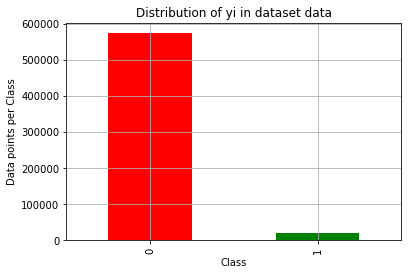

In [20]:
#ploting the class label counts using bar plot
my_colors = 'rgbkymc'
data_set_train['target'].value_counts().plot(kind='bar', color=my_colors)
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in dataset data')
plt.grid()
plt.show()

###  from the above information we can derive that the data distribution is imbalance we don't have more information about the 1st class .

# splitting dataset into train,cv,test 
### since we are having imbalance data we have to split it manually by give 75% of points having class label as 1 to train ,15% to cross validate and 10% to test

In [23]:
data_set_train_approach_1_mean['target']=data_set_target_train
data_set_train_approach_1_mode['target']=data_set_target_train
data_set_train_approach_1_median['target']=data_set_target_train
data_set_train_approach_2_mean['target']=data_set_target_train
data_set_train_approach_2_median['target']=data_set_target_train
data_set_train_approach_2_mode['target']=data_set_target_train
data_set_train_add_on_features_approach3_mean['target']=data_set_target_train
data_set_train_add_on_features_approach3_mode['target']=data_set_target_train
data_set_train_add_on_features_approach3_median['target']=data_set_target_train
data_set_train_add_on_features_approach4_mean['target']=data_set_target_train
data_set_train_add_on_features_approach4_mode['target']=data_set_target_train
data_set_train_add_on_features_approach4_median['target']=data_set_target_train

In [24]:
percent_1_75=int(0.75*sum(data_set_train_approach_1_mean['target']==1))
percent_1_15=int(0.15*sum(data_set_train_approach_1_mean['target']==1))
percent_1_10=int(0.10*sum(data_set_train_approach_1_mean['target']==1))
percent_0_75=int(0.75*sum(data_set_train_approach_1_mean['target']==0))
percent_0_15=int(0.15*sum(data_set_train_approach_1_mean['target']==0))
percent_0_10=int(0.10*sum(data_set_train_approach_1_mean['target']==0))

ds_1_t1=data_set_train_approach_1_mean[data_set_train_approach_1_mean['target']==1][:percent_1_75]
ds_1_t0=data_set_train_approach_1_mean[data_set_train_approach_1_mean['target']==0][:percent_0_75]
data_approach_1_mean_train_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_approach_1_mean[data_set_train_approach_1_mean['target']==1][percent_1_75:percent_1_15+percent_1_75]
ds_1_t0=data_set_train_approach_1_mean[data_set_train_approach_1_mean['target']==0][percent_0_75:percent_0_15+percent_0_75]
data_approach_1_mean_cv_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_approach_1_mean[data_set_train_approach_1_mean['target']==1][percent_1_15+percent_1_75:percent_1_10+percent_1_15+percent_1_75]
ds_1_t0=data_set_train_approach_1_mean[data_set_train_approach_1_mean['target']==0][percent_0_15+percent_0_75:percent_0_15+percent_0_75+percent_0_10]
data_approach_1_mean_test_set=pd.concat([ds_1_t1,ds_1_t0])

ds_1_t1=data_set_train_approach_1_median[data_set_train_approach_1_median['target']==1][:percent_1_75]
ds_1_t0=data_set_train_approach_1_median[data_set_train_approach_1_median['target']==0][:percent_0_75]
data_approach_1_median_train_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_approach_1_median[data_set_train_approach_1_median['target']==1][percent_1_75:percent_1_15+percent_1_75]
ds_1_t0=data_set_train_approach_1_median[data_set_train_approach_1_median['target']==0][percent_0_75:percent_0_15+percent_0_75]
data_approach_1_median_cv_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_approach_1_median[data_set_train_approach_1_median['target']==1][percent_1_15+percent_1_75:percent_1_10+percent_1_15+percent_1_75]
ds_1_t0=data_set_train_approach_1_median[data_set_train_approach_1_median['target']==0][percent_0_15+percent_0_75:percent_0_15+percent_0_75+percent_0_10]
data_approach_1_median_test_set=pd.concat([ds_1_t1,ds_1_t0])

ds_1_t1=data_set_train_approach_1_mode[data_set_train_approach_1_mode['target']==1][:percent_1_75]
ds_1_t0=data_set_train_approach_1_mode[data_set_train_approach_1_mode['target']==0][:percent_0_75]
data_approach_1_mode_train_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_approach_1_mode[data_set_train_approach_1_mode['target']==1][percent_1_75:percent_1_15+percent_1_75]
ds_1_t0=data_set_train_approach_1_mode[data_set_train_approach_1_mode['target']==0][percent_0_75:percent_0_15+percent_0_75]
data_approach_1_mode_cv_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_approach_1_mode[data_set_train_approach_1_mode['target']==1][percent_1_15+percent_1_75:percent_1_10+percent_1_15+percent_1_75]
ds_1_t0=data_set_train_approach_1_mode[data_set_train_approach_1_mode['target']==0][percent_0_15+percent_0_75:percent_0_15+percent_0_75+percent_0_10]
data_approach_1_mode_test_set=pd.concat([ds_1_t1,ds_1_t0])

ds_1_t1=data_set_train_approach_2_mean[data_set_train_approach_2_mean['target']==1][:percent_1_75]
ds_1_t0=data_set_train_approach_2_mean[data_set_train_approach_2_mean['target']==0][:percent_0_75]
data_approach_2_mean_train_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_approach_2_mean[data_set_train_approach_2_mean['target']==1][percent_1_75:percent_1_15+percent_1_75]
ds_1_t0=data_set_train_approach_2_mean[data_set_train_approach_2_mean['target']==0][percent_0_75:percent_0_15+percent_0_75]
data_approach_2_mean_cv_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_approach_2_mean[data_set_train_approach_2_mean['target']==1][percent_1_15+percent_1_75:percent_1_10+percent_1_15+percent_1_75]
ds_1_t0=data_set_train_approach_2_mean[data_set_train_approach_2_mean['target']==0][percent_0_15+percent_0_75:percent_0_15+percent_0_75+percent_0_10]
data_approach_2_mean_test_set=pd.concat([ds_1_t1,ds_1_t0])

ds_1_t1=data_set_train_approach_2_median[data_set_train_approach_2_median['target']==1][:percent_1_75]
ds_1_t0=data_set_train_approach_2_median[data_set_train_approach_2_median['target']==0][:percent_0_75]
data_approach_2_median_train_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_approach_2_median[data_set_train_approach_2_median['target']==1][percent_1_75:percent_1_15+percent_1_75]
ds_1_t0=data_set_train_approach_2_median[data_set_train_approach_2_median['target']==0][percent_0_75:percent_0_15+percent_0_75]
data_approach_2_median_cv_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_approach_2_median[data_set_train_approach_2_median['target']==1][percent_1_15+percent_1_75:percent_1_10+percent_1_15+percent_1_75]
ds_1_t0=data_set_train_approach_2_median[data_set_train_approach_2_median['target']==0][percent_0_15+percent_0_75:percent_0_15+percent_0_75+percent_0_10]
data_approach_2_median_test_set=pd.concat([ds_1_t1,ds_1_t0])

ds_1_t1=data_set_train_approach_2_mode[data_set_train_approach_2_mode['target']==1][:percent_1_75]
ds_1_t0=data_set_train_approach_2_mode[data_set_train_approach_2_mode['target']==0][:percent_0_75]
data_approach_2_mode_train_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_approach_2_mode[data_set_train_approach_2_mode['target']==1][percent_1_75:percent_1_15+percent_1_75]
ds_1_t0=data_set_train_approach_2_mode[data_set_train_approach_2_mode['target']==0][percent_0_75:percent_0_15+percent_0_75]
data_approach_2_mode_cv_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_approach_2_mode[data_set_train_approach_2_mode['target']==1][percent_1_15+percent_1_75:percent_1_10+percent_1_15+percent_1_75]
ds_1_t0=data_set_train_approach_2_mode[data_set_train_approach_2_mode['target']==0][percent_0_15+percent_0_75:percent_0_15+percent_0_75+percent_0_10]
data_approach_2_mode_test_set=pd.concat([ds_1_t1,ds_1_t0])

ds_1_t1=data_set_train_add_on_features_approach3_mean[data_set_train_add_on_features_approach3_mean['target']==1][:percent_1_75]
ds_1_t0=data_set_train_add_on_features_approach3_mean[data_set_train_add_on_features_approach3_mean['target']==0][:percent_0_75]
data_approach_3_mean_train_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_add_on_features_approach3_mean[data_set_train_add_on_features_approach3_mean['target']==1][percent_1_75:percent_1_15+percent_1_75]
ds_1_t0=data_set_train_add_on_features_approach3_mean[data_set_train_add_on_features_approach3_mean['target']==0][percent_0_75:percent_0_15+percent_0_75]
data_approach_3_mean_cv_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_add_on_features_approach3_mean[data_set_train_add_on_features_approach3_mean['target']==1][percent_1_15+percent_1_75:percent_1_10+percent_1_15+percent_1_75]
ds_1_t0=data_set_train_add_on_features_approach3_mean[data_set_train_add_on_features_approach3_mean['target']==0][percent_0_15+percent_0_75:percent_0_15+percent_0_75+percent_0_10]
data_approach_3_mean_test_set=pd.concat([ds_1_t1,ds_1_t0])

ds_1_t1=data_set_train_add_on_features_approach3_median[data_set_train_add_on_features_approach3_median['target']==1][:percent_1_75]
ds_1_t0=data_set_train_add_on_features_approach3_median[data_set_train_add_on_features_approach3_median['target']==0][:percent_0_75]
data_approach_3_median_train_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_add_on_features_approach3_median[data_set_train_add_on_features_approach3_median['target']==1][percent_1_75:percent_1_15+percent_1_75]
ds_1_t0=data_set_train_add_on_features_approach3_median[data_set_train_add_on_features_approach3_median['target']==0][percent_0_75:percent_0_15+percent_0_75]
data_approach_3_median_cv_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_add_on_features_approach3_median[data_set_train_add_on_features_approach3_median['target']==1][percent_1_15+percent_1_75:percent_1_10+percent_1_15+percent_1_75]
ds_1_t0=data_set_train_add_on_features_approach3_median[data_set_train_add_on_features_approach3_median['target']==0][percent_0_15+percent_0_75:percent_0_15+percent_0_75+percent_0_10]
data_approach_3_median_test_set=pd.concat([ds_1_t1,ds_1_t0])

ds_1_t1=data_set_train_add_on_features_approach3_mode[data_set_train_add_on_features_approach3_mode['target']==1][:percent_1_75]
ds_1_t0=data_set_train_add_on_features_approach3_mode[data_set_train_add_on_features_approach3_mode['target']==0][:percent_0_75]
data_approach_3_mode_train_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_add_on_features_approach3_mode[data_set_train_add_on_features_approach3_mode['target']==1][percent_1_75:percent_1_15+percent_1_75]
ds_1_t0=data_set_train_add_on_features_approach3_mode[data_set_train_add_on_features_approach3_mode['target']==0][percent_0_75:percent_0_15+percent_0_75]
data_approach_3_mode_cv_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_add_on_features_approach3_mode[data_set_train_add_on_features_approach3_mode['target']==1][percent_1_15+percent_1_75:percent_1_10+percent_1_15+percent_1_75]
ds_1_t0=data_set_train_add_on_features_approach3_mode[data_set_train_add_on_features_approach3_mode['target']==0][percent_0_15+percent_0_75:percent_0_15+percent_0_75+percent_0_10]
data_approach_3_mode_test_set=pd.concat([ds_1_t1,ds_1_t0])

ds_1_t1=data_set_train_add_on_features_approach4_mean[data_set_train_add_on_features_approach4_mean['target']==1][:percent_1_75]
ds_1_t0=data_set_train_add_on_features_approach4_mean[data_set_train_add_on_features_approach4_mean['target']==0][:percent_0_75]
data_approach_4_mean_train_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_add_on_features_approach4_mean[data_set_train_add_on_features_approach4_mean['target']==1][percent_1_75:percent_1_15+percent_1_75]
ds_1_t0=data_set_train_add_on_features_approach4_mean[data_set_train_add_on_features_approach4_mean['target']==0][percent_0_75:percent_0_15+percent_0_75]
data_approach_4_mean_cv_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_add_on_features_approach4_mean[data_set_train_add_on_features_approach4_mean['target']==1][percent_1_15+percent_1_75:percent_1_10+percent_1_15+percent_1_75]
ds_1_t0=data_set_train_add_on_features_approach4_mean[data_set_train_add_on_features_approach4_mean['target']==0][percent_0_15+percent_0_75:percent_0_15+percent_0_75+percent_0_10]
data_approach_4_mean_test_set=pd.concat([ds_1_t1,ds_1_t0])

ds_1_t1=data_set_train_add_on_features_approach4_median[data_set_train_add_on_features_approach4_median['target']==1][:percent_1_75]
ds_1_t0=data_set_train_add_on_features_approach4_median[data_set_train_add_on_features_approach4_median['target']==0][:percent_0_75]
data_approach_4_median_train_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_add_on_features_approach4_median[data_set_train_add_on_features_approach4_median['target']==1][percent_1_75:percent_1_15+percent_1_75]
ds_1_t0=data_set_train_add_on_features_approach4_median[data_set_train_add_on_features_approach4_median['target']==0][percent_0_75:percent_0_15+percent_0_75]
data_approach_4_median_cv_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_add_on_features_approach4_median[data_set_train_add_on_features_approach4_median['target']==1][percent_1_15+percent_1_75:percent_1_10+percent_1_15+percent_1_75]
ds_1_t0=data_set_train_add_on_features_approach4_median[data_set_train_add_on_features_approach4_median['target']==0][percent_0_15+percent_0_75:percent_0_15+percent_0_75+percent_0_10]
data_approach_4_median_test_set=pd.concat([ds_1_t1,ds_1_t0])

ds_1_t1=data_set_train_add_on_features_approach4_mode[data_set_train_add_on_features_approach4_mode['target']==1][:percent_1_75]
ds_1_t0=data_set_train_add_on_features_approach4_mode[data_set_train_add_on_features_approach4_mode['target']==0][:percent_0_75]
data_approach_4_mode_train_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_add_on_features_approach4_mode[data_set_train_add_on_features_approach4_mode['target']==1][percent_1_75:percent_1_15+percent_1_75]
ds_1_t0=data_set_train_add_on_features_approach4_mode[data_set_train_add_on_features_approach4_mode['target']==0][percent_0_75:percent_0_15+percent_0_75]
data_approach_4_mode_cv_set=pd.concat([ds_1_t1,ds_1_t0])
ds_1_t1=data_set_train_add_on_features_approach4_mode[data_set_train_add_on_features_approach4_mode['target']==1][percent_1_15+percent_1_75:percent_1_10+percent_1_15+percent_1_75]
ds_1_t0=data_set_train_add_on_features_approach4_mode[data_set_train_add_on_features_approach4_mode['target']==0][percent_0_15+percent_0_75:percent_0_15+percent_0_75+percent_0_10]
data_approach_4_mode_test_set=pd.concat([ds_1_t1,ds_1_t0])



## visualization of class label distribution across train test cv
### let us visualize only for one dataset out of 12 the same distribution holds for all

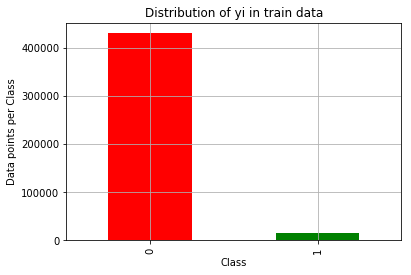

the percentge of points in the class label 0 in approach 1 mean train is   96.3563758389 percent
the percentge of points in the class label 1 in approach 1 mean train is   3.64362416107 percent


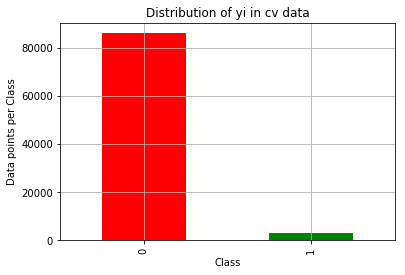

the percentge of points in the class label 0 in approach 1 mean cv is   96.3567825143 percent
the percentge of points in the class label 1 in approach 1 mean train is   3.64321748565 percent


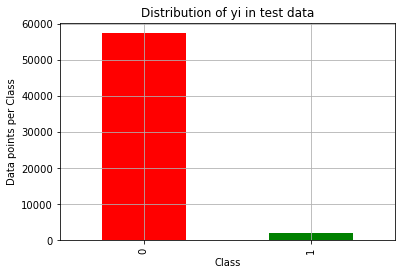

the percentge of points in the class label 0 in approach 1 mean test is   96.3573214316 percent
the percentge of points in the class label 1 in approach 1 mean train is   3.64267856843 percent


In [23]:
my_colors = 'rgbkymc'
data_approach_1_mean_train_set['target'].value_counts().plot(kind='bar', color=my_colors)
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in train data')
plt.grid()
plt.show()
print 'the percentge of points in the class label 0 in approach 1 mean train is  ',str(float(data_approach_1_mean_train_set['target'].value_counts()[0])/float(len(data_approach_1_mean_train_set))*100)+' percent'
print 'the percentge of points in the class label 1 in approach 1 mean train is  ',str(float(data_approach_1_mean_train_set['target'].value_counts()[1])/float(len(data_approach_1_mean_train_set))*100)+' percent'
my_colors = 'rgbkymc'
data_approach_1_mean_cv_set['target'].value_counts().plot(kind='bar', color=my_colors)
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in cv data')
plt.grid()
plt.show()
print 'the percentge of points in the class label 0 in approach 1 mean cv is  ',str(float(data_approach_1_mean_cv_set['target'].value_counts()[0])/float(len(data_approach_1_mean_cv_set))*100)+' percent'
print 'the percentge of points in the class label 1 in approach 1 mean train is  ',str(float(data_approach_1_mean_cv_set['target'].value_counts()[1])/float(len(data_approach_1_mean_cv_set))*100)+' percent'

my_colors = 'rgbkymc'
data_approach_1_mean_test_set['target'].value_counts().plot(kind='bar', color=my_colors)
plt.xlabel('Class')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in test data')
plt.grid()
plt.show()
print 'the percentge of points in the class label 0 in approach 1 mean test is  ',str(float(data_approach_1_mean_test_set['target'].value_counts()[0])/float(len(data_approach_1_mean_test_set))*100)+' percent'
print 'the percentge of points in the class label 1 in approach 1 mean train is  ',str(float(data_approach_1_mean_test_set['target'].value_counts()[1])/float(len(data_approach_1_mean_test_set))*100)+' percent'



## highly imbalance in nature from the above visualization 
## the problem here is almost 96% has label 0 if the model we built predicts everything as 0 it will give 96% accuracy so from the above problem we have to take precision value has a serious parameter check up

# let us start building baseline models
## 1.)Knn 
## 2.)naive bayes
## 3.)svm
## 4.)logistic regression
## 5.)decision tree 
## 6.)random forest
## 7.)essemble modelling

In [25]:
# This function plots the confusion matrices given y_i, y_i_hat.
def plot_confusion_matrix(test_y, predict_y):
    C = confusion_matrix(test_y, predict_y)
    # C = 9,9 matrix, each cell (i,j) represents number of points of class i are predicted class j
    C=np.array(C,np.float32)
    A =(((C.T)/(C.sum(axis=1))).T)

    
    B =((C)/(C.sum(axis=0)))
    
    labels = [0,1]
    # representing A in heatmap format
    print("-"*20, "Confusion matrix", "-"*20)
    plt.figure(figsize=(20,7))
    sns.heatmap(C, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()

    print("-"*20, "Precision matrix (Columm Sum=1)", "-"*20)
    plt.figure(figsize=(20,7))
    sns.heatmap(B, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()
    
    # representing B in heatmap format
    print("-"*20, "Recall matrix (Row sum=1)", "-"*20)
    plt.figure(figsize=(20,7))
    sns.heatmap(A, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()

def predict_and_plot_confusion_matrix_knn(train_x, train_y,test_x, test_y, clf):
    clf.fit(train_x, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x, train_y)
    pred_y = sig_clf.predict(test_x)
    value=sum(np.array(pred_y)==np.array(test_y))
    print("Log loss :",log_loss(test_y, sig_clf.predict_proba(test_x)))
    # calculating the number of data points that are misclassified
    print("Number of mis-classified points :", len(pred_y)-value)
    plot_confusion_matrix(test_y, pred_y)
    predicted_cls = sig_clf.predict(test_x[0].reshape(1,-1))
    print("Predicted Class :", pred_y[0])
    print("Actual Class :", test_y[0])
    neighbors = clf.kneighbors(test_x[0].reshape(1, -1), 20)
    print("The ",20," nearest neighbours of the test points belongs to classes",train_y[neighbors[1][0]])
    print("Fequency of nearest points :",Counter(train_y[neighbors[1][0]]))
    return sig_clf
def predict_and_plot_confusion_matrix(train_x, train_y,test_x, test_y, clf):
    clf.fit(train_x, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x, train_y)
    pred_y = sig_clf.predict(test_x)
    value=sum(np.array(pred_y)==np.array(test_y))
    print("Log loss :",log_loss(test_y, sig_clf.predict_proba(test_x)))
    # calculating the number of data points that are misclassified
    print("Number of mis-classified points :", len(pred_y)-value)
    plot_confusion_matrix(test_y, pred_y)
    return sig_clf
def write_to_csv(classifier,test_x,model_name):
    probabilty_value=classifier.predict_proba(test_x)
    print probabilty_value
    pd.DataFrame(probabilty_value,columns=['class0','class1']).to_csv(model_name+'.csv')

#### let us seprate the features and targets

In [26]:
#ys in train test cv
target_y_train=data_approach_1_mean_train_set['target']
target_cv_train=data_approach_1_mean_cv_set['target']
target_test_train=data_approach_1_mean_test_set['target']


In [27]:
#the x data we must train machine learning base models 
data_approach_1_mean_train_set.drop(['id','target'],axis=1,inplace=True)
data_approach_1_mean_cv_set.drop(['id','target'],axis=1,inplace=True)
data_approach_1_mean_test_set.drop(['id','target'],axis=1,inplace=True)

data_approach_1_median_train_set.drop(['id','target'],axis=1,inplace=True)
data_approach_1_median_cv_set.drop(['id','target'],axis=1,inplace=True)
data_approach_1_median_test_set.drop(['id','target'],axis=1,inplace=True)

data_approach_1_mode_train_set.drop(['id','target'],axis=1,inplace=True)
data_approach_1_mode_cv_set.drop(['id','target'],axis=1,inplace=True)
data_approach_1_mode_test_set.drop(['id','target'],axis=1,inplace=True)

data_approach_2_mean_train_set.drop(['id','target'],axis=1,inplace=True)
data_approach_2_mean_cv_set.drop(['id','target'],axis=1,inplace=True)
data_approach_2_mean_test_set.drop(['id','target'],axis=1,inplace=True)

data_approach_2_median_train_set.drop(['id','target'],axis=1,inplace=True)
data_approach_2_median_cv_set.drop(['id','target'],axis=1,inplace=True)
data_approach_2_median_test_set.drop(['id','target'],axis=1,inplace=True)

data_approach_2_mode_train_set.drop(['id','target'],axis=1,inplace=True)
data_approach_2_mode_cv_set.drop(['id','target'],axis=1,inplace=True)
data_approach_2_mode_test_set.drop(['id','target'],axis=1,inplace=True)

data_approach_3_mean_train_set.drop(['id','target'],axis=1,inplace=True)
data_approach_3_mean_cv_set.drop(['id','target'],axis=1,inplace=True)
data_approach_3_mean_test_set.drop(['id','target'],axis=1,inplace=True)


data_approach_3_median_train_set.drop(['id','target'],axis=1,inplace=True)
data_approach_3_median_cv_set.drop(['id','target'],axis=1,inplace=True)
data_approach_3_median_test_set.drop(['id','target'],axis=1,inplace=True)

data_approach_3_mode_train_set.drop(['id','target'],axis=1,inplace=True)
data_approach_3_mode_cv_set.drop(['id','target'],axis=1,inplace=True)
data_approach_3_mode_test_set.drop(['id','target'],axis=1,inplace=True)

data_approach_4_mean_train_set.drop(['id','target'],axis=1,inplace=True)
data_approach_4_mean_cv_set.drop(['id','target'],axis=1,inplace=True)
data_approach_4_mean_test_set.drop(['id','target'],axis=1,inplace=True)

data_approach_4_median_train_set.drop(['id','target'],axis=1,inplace=True)
data_approach_4_median_cv_set.drop(['id','target'],axis=1,inplace=True)
data_approach_4_median_test_set.drop(['id','target'],axis=1,inplace=True)

data_approach_4_mode_train_set.drop(['id','target'],axis=1,inplace=True)
data_approach_4_mode_cv_set.drop(['id','target'],axis=1,inplace=True)
data_approach_4_mode_test_set.drop(['id','target'],axis=1,inplace=True)

In [28]:
a_1=StandardScaler()
a_2=StandardScaler()
a_3=StandardScaler()
a_4=StandardScaler()
standardized_data_approach1_mean_train = a_1.fit_transform(data_approach_1_mean_train_set)
standardized_data_approach2_median_train=a_2.fit_transform(data_approach_2_median_train_set)
standardized_data_approach3_mode_train=a_3.fit_transform(data_approach_3_mode_train_set)
standardized_data_approach4_mean_train =a_4.fit_transform(data_approach_4_mean_train_set)
standardized_data_approach1_mean_cv = a_1.transform(data_approach_1_mean_cv_set)
standardized_data_approach2_median_cv=a_2.transform(data_approach_2_median_cv_set)
standardized_data_approach3_mode_cv=a_3.transform(data_approach_3_mode_cv_set)
standardized_data_approach4_mean_cv = a_4.transform(data_approach_4_mean_cv_set)
standardized_data_approach1_mean_test = a_1.transform(data_approach_1_mean_test_set)
standardized_data_approach2_median_test=a_2.transform(data_approach_2_median_test_set)
standardized_data_approach3_mode_test=a_3.transform(data_approach_3_mode_test_set)
standardized_data_approach4_mean_test = a_4.transform(data_approach_4_mean_test_set)


In [ ]:
data_approach_1_mean_train_set=pd.read_csv('a_1.csv')
data_approach_1_mean_cv_set=pd.read_csv('a_2.csv')
data_approach_1_mean_test_set=pd.read_csv('a_3.csv')
a_1=StandardScaler()
standardized_data_approach1_mean_train = a_1.fit_transform(data_approach_1_mean_train_set)
standardized_data_approach1_mean_test = a_1.transform(data_approach_1_mean_test_set)
standardized_data_approach1_mean_cv = a_1.transform(data_approach_1_mean_cv_set)

### applying models are time consuming without high speed computing  so planning was done in applying models for the above four but due to high time consuming tasks we will apply only for simple approach_number_1_mean but in search of better results we have to apply models for all the 12 datasets which we provided above.

# k-nn classifier 


#### A case is classified by a majority vote of its neighbors, with the case being assigned to the class most common amongst its K nearest neighbors measured by a distance function. 

In [29]:
data_set_test_approach_1_mean.drop(['id'],axis=1,inplace=True)
test=data_set_test_approach_1_mean

('Log Loss :', 5, 0.38018099385856319)
('Log Loss :', 6, 0.38003238070376683)
('Log Loss :', 7, 0.38002902972912606)
('Log Loss :', 8, 0.37999205115423051)
('Log Loss :', 11, 0.37983507529544724)
('Log Loss :', 15, 0.37953944378783172)
('Log Loss :', 20, 0.37923053904967585)


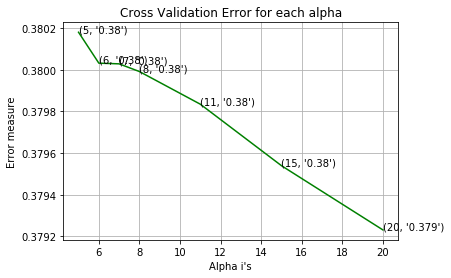

In [34]:
alpha = [5,6,7,8,11,15,20]
cv_log_error_array = []
for i in alpha:
    print("for alpha =", i)
    clf = KNeighborsClassifier(n_neighbors=i)
    clf.fit(standardized_data_approach1_mean_train[:80000], target_y_train[:80000])
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(standardized_data_approach1_mean_train[:80000], target_y_train[:80000])
    sig_clf_probs = sig_clf.predict_proba(standardized_data_approach1_mean_cv[:50000])
    cv_log_error_array.append(log_loss(target_cv_train[:50000], sig_clf_probs, labels=clf.classes_, eps=1e-15))
    # to avoid rounding error while multiplying probabilites we use log-probability estimates

for i,x in enumerate(cv_log_error_array):
    print 'Log Loss :',alpha[i],x
fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()

best_alpha = np.argmin(cv_log_error_array)

('Log loss :', 0.38291559999832292)
('Number of mis-classified points :', 2171)
('--------------------', 'Confusion matrix', '--------------------')


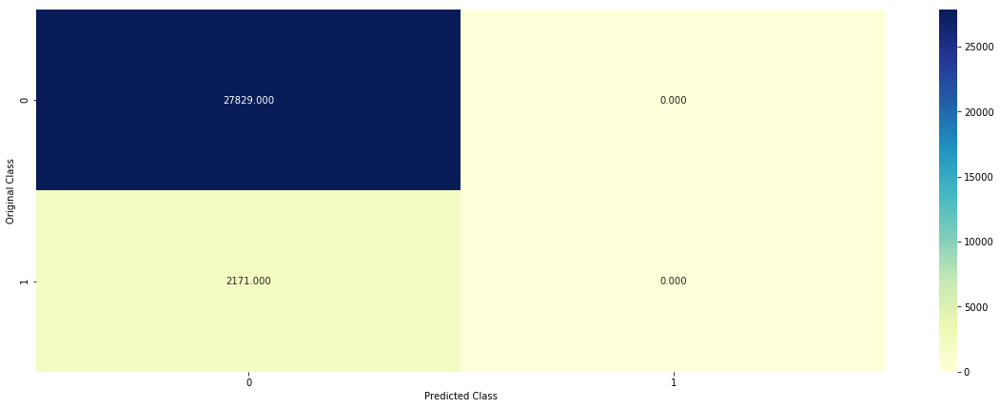

('--------------------', 'Precision matrix (Columm Sum=1)', '--------------------')


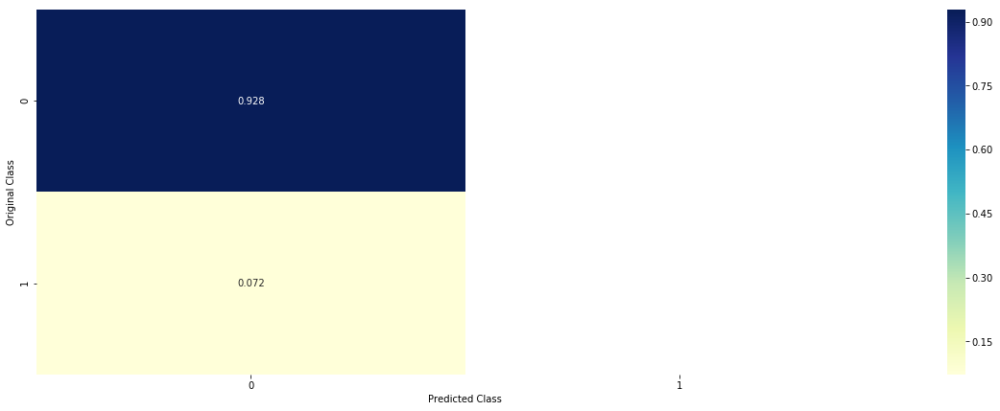

('--------------------', 'Recall matrix (Row sum=1)', '--------------------')


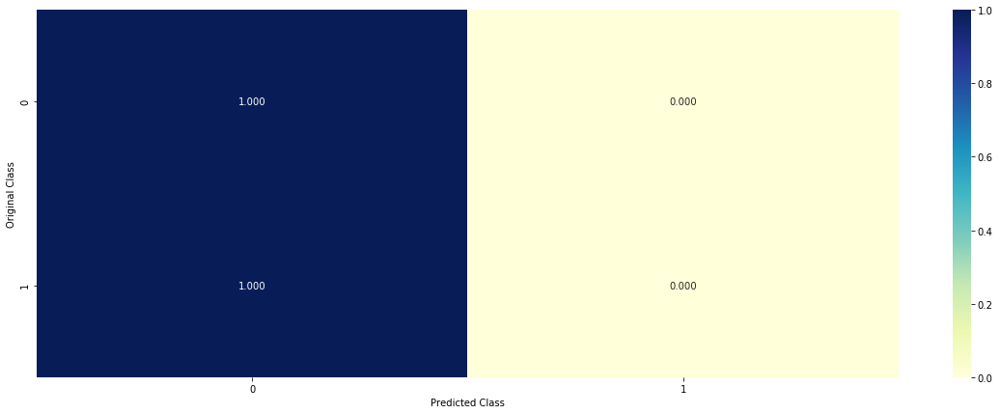

('Predicted Class :', 0)
('Actual Class :', 1)
('The ', 20, ' nearest neighbours of the test points belongs to classes', array([0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]))
('Fequency of nearest points :', Counter({0: 18, 1: 2}))
[[ 0.78280108  0.21719892]
 [ 0.762937    0.237063  ]
 [ 0.71225313  0.28774687]
 ..., 
 [ 0.73302084  0.26697916]
 [ 0.80159814  0.19840186]
 [ 0.74206628  0.25793372]]


In [30]:
clf = KNeighborsClassifier(n_neighbors=20)
clf=predict_and_plot_confusion_matrix_knn(np.array(standardized_data_approach1_mean_train[:60000]), np.array(target_y_train[:60000]),np.array(standardized_data_approach1_mean_test[:30000]), np.array(target_test_train[:30000]), clf)
write_to_csv(clf,np.array(a_1.transform(test)),'knn') 

### complexity 
#### k -NN is in O1) (some people even say it is non-existent  but space complexity of training is O(Nd) since you need to store the data which also takes time).
#### k-NN is in O(Nd) since you have to compare the test point to every data point in your database.

### since we have more data points in class label 0 high class imbalance we are getting more neigbours corresponding to class 0.
### try knn for above 11 datasets in order to know it better

#  NaiveBayes

#### A naive Bayes classifier is an algorithm that uses Bayes theorem to classify objects. Naive Bayes classifiers assume strong or naive  independence between attributes of data points. Popular uses of naive Bayes classifiers include spam filters, text analysis and medical diagnosis.

('for alpha =', 3)
('Log Loss :', 0.38098340098545458)
('for alpha =', 1)
('Log Loss :', 0.38092508968142708)
('for alpha =', 1e-100)
('Log Loss :', 0.37561951845517483)
('for alpha =', 1e-19)
('Log Loss :', 0.37561951845517472)
('for alpha =', 1e-10)
('Log Loss :', 0.37561938089655522)
('for alpha =', 100)
('Log Loss :', 0.38100980361827852)
('for alpha =', 1000)
('Log Loss :', 0.38101050467920228)


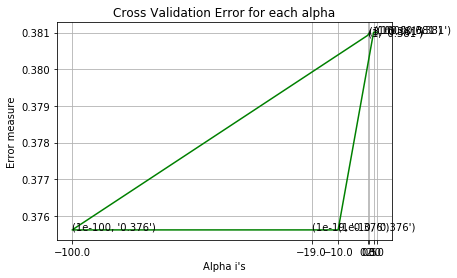

best alpha 1e-10


In [52]:
from sklearn.naive_bayes import GaussianNB
alpha = [3, 1, 1e-100, 1e-19, 1e-10, 100,1000]
cv_log_error_array = []
for i in alpha:
    print("for alpha =", i)
    clf = GaussianNB(var_smoothing=i)
    clf.fit(data_approach_1_mean_train_set[:60000], target_y_train[:60000])
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(data_approach_1_mean_train_set[:60000], target_y_train[:60000])
    sig_clf_probs = sig_clf.predict_proba(data_approach_1_mean_cv_set[:50000])
    cv_log_error_array.append(log_loss(target_cv_train[:50000], sig_clf_probs, labels=clf.classes_, eps=1e-15))
    # to avoid rounding error while multiplying probabilites we use log-probability estimates
    print("Log Loss :",log_loss(target_cv_train[:50000], sig_clf_probs)) 

fig, ax = plt.subplots()
ax.plot(np.log10(alpha), cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (np.log10(alpha[i]),cv_log_error_array[i]))
plt.grid()
plt.xticks(np.log10(alpha))
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()
best_alpha = np.argmin(cv_log_error_array)
print 'best alpha',alpha[best_alpha]

('Log loss :', 0.38254140489577049)
('Number of mis-classified points :', 2171)
('--------------------', 'Confusion matrix', '--------------------')


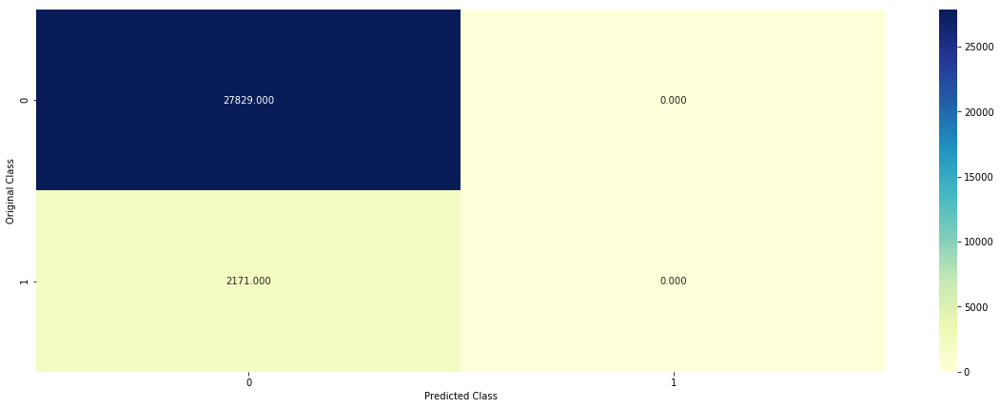

('--------------------', 'Precision matrix (Columm Sum=1)', '--------------------')


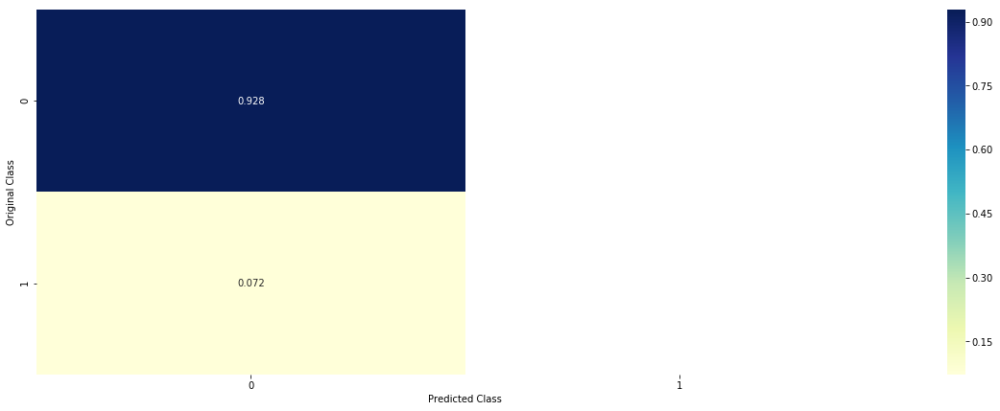

('--------------------', 'Recall matrix (Row sum=1)', '--------------------')


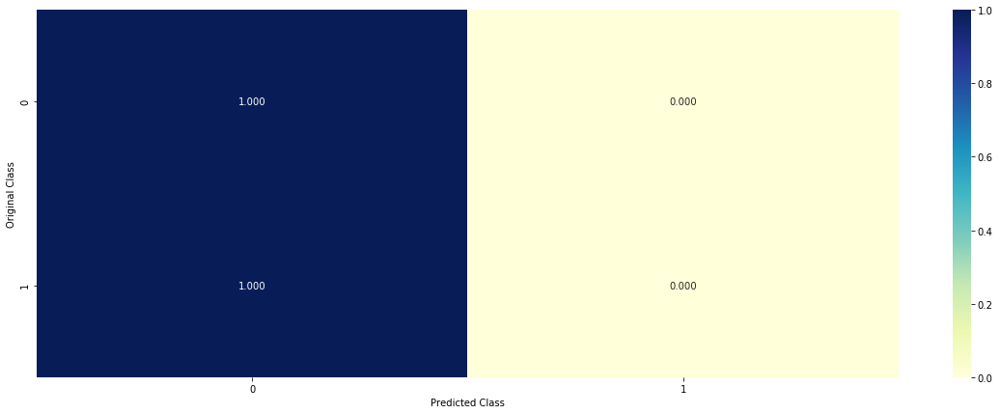

[[ 0.55518045  0.44481955]
 [ 0.55518045  0.44481955]
 [ 0.55518045  0.44481955]
 ..., 
 [ 0.55527632  0.44472368]
 [ 0.55518046  0.44481954]
 [ 0.55518045  0.44481955]]


In [31]:
clf =  clf = GaussianNB(var_smoothing=1e-10)
clf=predict_and_plot_confusion_matrix(np.array(standardized_data_approach1_mean_train[:60000]), np.array(target_y_train[:60000]),np.array(standardized_data_approach1_mean_test[:30000]), np.array(target_test_train[:30000]), clf)
write_to_csv(clf,np.array(test),'Gaussian_naive')


####  Naive Bayes is O(Nd), all it needs to do is computing the frequency of every feature value di for each class.
####  Naive Bayes is in O(cd) since you have to retrieve d feature values for each of the c classes.

###  we have more 0 label datapoints so from this we can say that it has more probability likelyhood of values from each feature infact the probability of p(class_label(0)) itself is very high it is more dominating in probability.

## Logistic regression

#### Logistic regression algorithm also uses a linear equation with independent predictors to predict a value. The predicted value can be anywhere between negative infinity to positive infinity. We need the output of the algorithm to be class variable, 0-no, 1-yes. Therefore, we are squashing the output of the linear equation into a range of [0,1]. To squash the predicted value between 0 and 1, we use the sigmoid function.

('for C =', 1e-05)
('Log Loss :', 0.37930747630574341)
('for C =', 0.0001)
('Log Loss :', 0.37823307698587194)
('for C =', 0.001)
('Log Loss :', 0.37443997654592348)
('for C =', 0.01)
('Log Loss :', 0.37224483214368165)
('for C =', 0.1)
('Log Loss :', 0.37182033078170063)
('for C =', 1)
('Log Loss :', 0.37289884216197422)
('for C =', 10)
('Log Loss :', 0.37375482909478419)
('for C =', 100)
('Log Loss :', 0.37389580525136595)


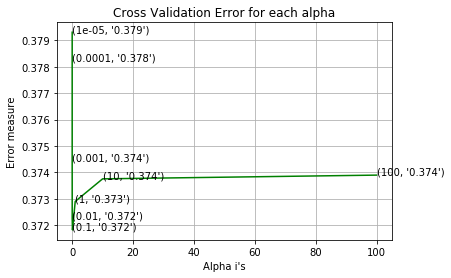

the best alpha value is  0.1


In [55]:
alpha = [10 ** x for x in range(-5, 3)]
cv_log_error_array = []
for i in alpha:
    print("for C =", i)
    clf = SGDClassifier(class_weight='balanced', alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(standardized_data_approach1_mean_train[:60000], target_y_train[:60000])
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(standardized_data_approach1_mean_train[:60000], target_y_train[:60000])
    sig_clf_probs = sig_clf.predict_proba(standardized_data_approach1_mean_cv[:50000])
    cv_log_error_array.append(log_loss(target_cv_train[:50000], sig_clf_probs, labels=clf.classes_, eps=1e-15))
    print("Log Loss :",log_loss(target_cv_train[:50000], sig_clf_probs)) 

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()
print 'the best alpha value is ',alpha[best_alpha]

('Log loss :', 0.37845765939837894)
('Number of mis-classified points :', 2425)
('--------------------', 'Confusion matrix', '--------------------')


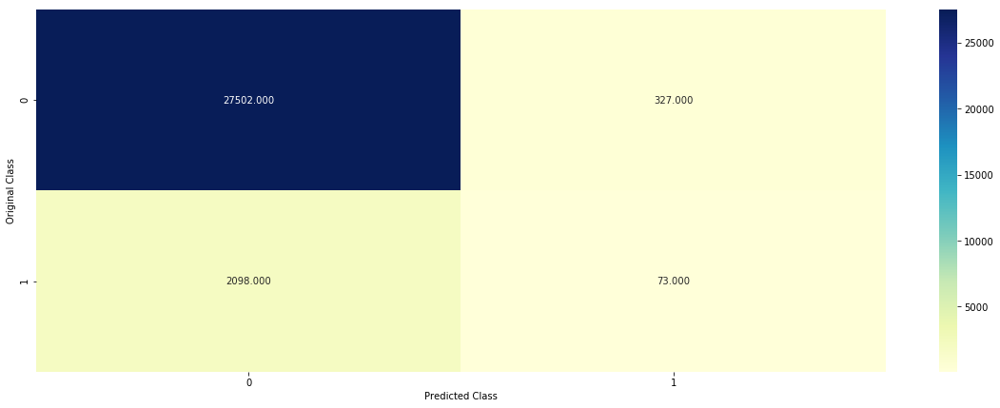

('--------------------', 'Precision matrix (Columm Sum=1)', '--------------------')


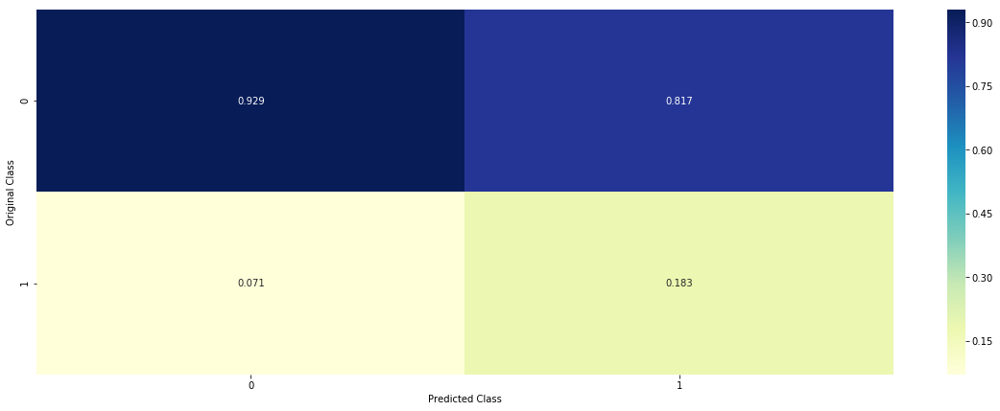

('--------------------', 'Recall matrix (Row sum=1)', '--------------------')


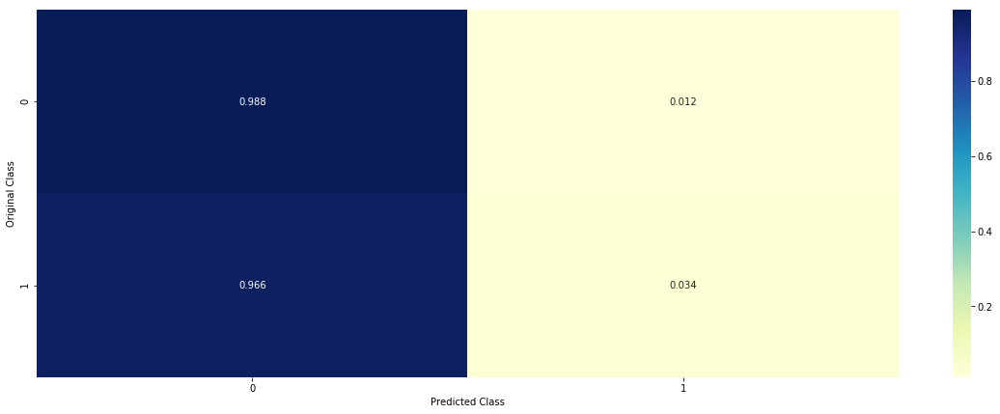

[[ 0.77579625  0.22420375]
 [ 0.76992931  0.23007069]
 [ 0.78607473  0.21392527]
 ..., 
 [ 0.7683591   0.2316409 ]
 [ 0.79909016  0.20090984]
 [ 0.76594698  0.23405302]]


In [32]:
clf =SGDClassifier(class_weight='balanced', alpha=0.1, penalty='l2', loss='log', random_state=42)
clf=predict_and_plot_confusion_matrix(np.array(standardized_data_approach1_mean_train[:60000]), np.array(target_y_train[:60000]),np.array(standardized_data_approach1_mean_test[:30000]), np.array(target_test_train[:30000]), clf)
write_to_csv(clf,np.array(a_1.transform(test)),'logistic')

#### The time complexity is actually independent of the number of samples: SGD can converge before seeing all the examples of the dataset provided they are numerous enough 

#### there is no linear seperation between these two labels

## Random forest

### Random Trees lies in one of those Class of ML Algorithms which does 'ensemble' classification. By Ensemble we mean(In Random Forest Context), Collective Decisions of Different Decision Trees. In RFT(Random Forest Tree), we make a prediction about the class, not simply based on One Decision Trees, but by an (almost) Unanimous Prediction, made by K Decision Trees.

In [57]:
alpha = [100,200,500,1000,2000]
max_depth = [5, 10]
cv_log_error_array = []
for i in alpha:
    for j in max_depth:
        print("for n_estimators =", i,"and max depth = ", j)
        clf = RandomForestClassifier(n_estimators=i, criterion='gini', max_depth=j, random_state=42, n_jobs=-1)
        clf.fit(data_approach_1_mean_train_set[:60000], target_y_train[:60000])
        sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
        sig_clf.fit(data_approach_1_mean_train_set[:60000], target_y_train[:60000])
        sig_clf_probs = sig_clf.predict_proba(data_approach_1_mean_cv_set[:50000])
        cv_log_error_array.append(log_loss(target_cv_train[:50000], sig_clf_probs, labels=clf.classes_, eps=1e-15))
        print("Log Loss :",log_loss(target_cv_train[:50000], sig_clf_probs)) 
best_alpha = np.argmin(cv_log_error_array)


('for n_estimators =', 100, 'and max depth = ', 5)
('Log Loss :', 0.37152843554888598)
('for n_estimators =', 100, 'and max depth = ', 10)
('Log Loss :', 0.37053008616239386)
('for n_estimators =', 200, 'and max depth = ', 5)
('Log Loss :', 0.37146914643149043)
('for n_estimators =', 200, 'and max depth = ', 10)
('Log Loss :', 0.37043404681496422)
('for n_estimators =', 500, 'and max depth = ', 5)
('Log Loss :', 0.37147010373789374)
('for n_estimators =', 500, 'and max depth = ', 10)
('Log Loss :', 0.37027723407033014)
('for n_estimators =', 1000, 'and max depth = ', 5)
('Log Loss :', 0.37147800477829812)
('for n_estimators =', 1000, 'and max depth = ', 10)
('Log Loss :', 0.37024503838120465)
('for n_estimators =', 2000, 'and max depth = ', 5)
('Log Loss :', 0.37150499149070676)
('for n_estimators =', 2000, 'and max depth = ', 10)
('Log Loss :', 0.37026130668093576)


('Log loss :', 0.37959119201041319)
('Number of mis-classified points :', 2633)
('--------------------', 'Confusion matrix', '--------------------')


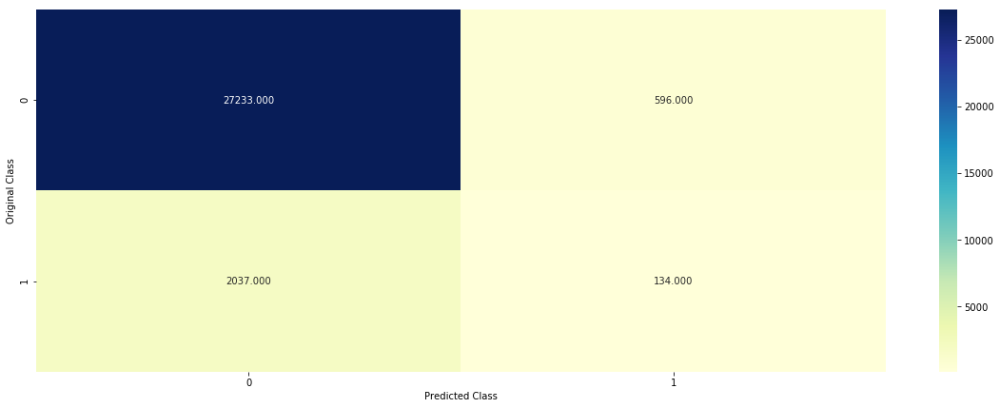

('--------------------', 'Precision matrix (Columm Sum=1)', '--------------------')


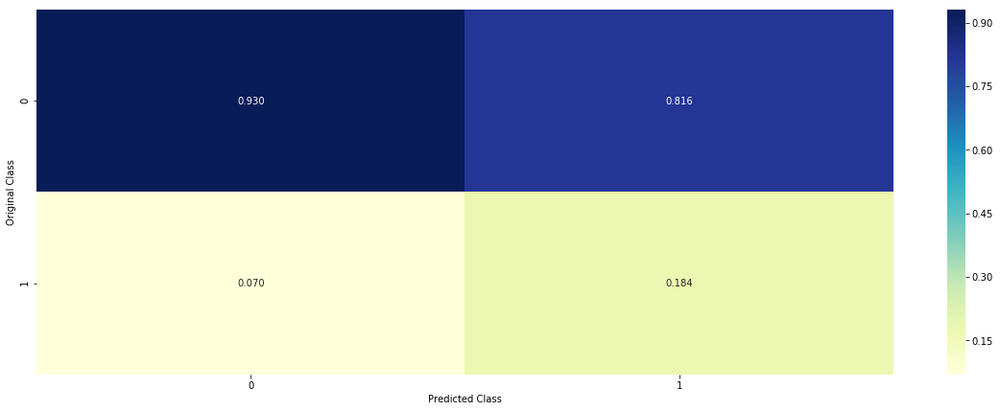

('--------------------', 'Recall matrix (Row sum=1)', '--------------------')


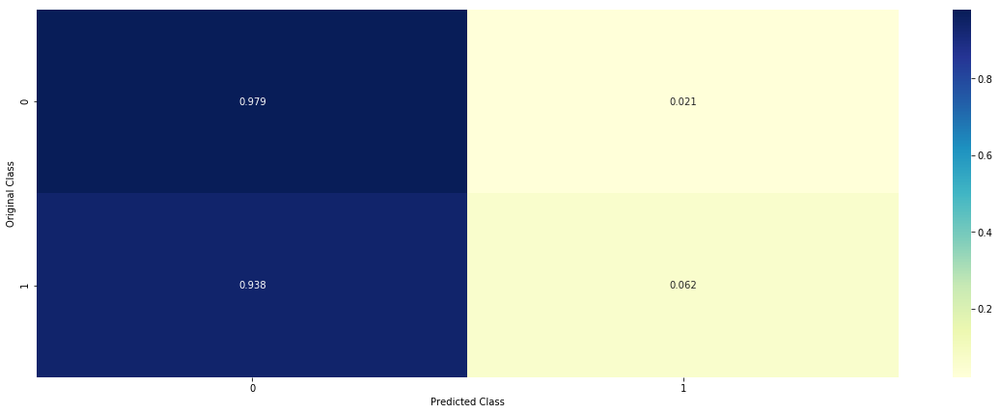

[[ 0.80187553  0.19812447]
 [ 0.80357379  0.19642621]
 [ 0.76374869  0.23625131]
 ..., 
 [ 0.7601364   0.2398636 ]
 [ 0.78813824  0.21186176]
 [ 0.77784821  0.22215179]]


In [33]:
clf =RandomForestClassifier(n_estimators=1000, criterion='gini',  max_depth=10, random_state=42, n_jobs=-1)
clf=predict_and_plot_confusion_matrix(np.array(data_approach_1_mean_train_set[:60000]), np.array(target_y_train[:60000]),np.array(data_approach_1_mean_cv_set[:30000]), np.array(target_test_train[:30000]), clf)
write_to_csv(clf,np.array(test),'Random_forest')

####  Time complexity for building a complete unpruned decision tree is O( v * n log(n) ), where n is the number of records and v is the number of variables/attributes. so random forest is O(k* (v * n log(n) )) where k is the number of trees.

#### this features in the data  doesn't provide us with conditional information .

## xgboost classifier

#### approach where new models are created that predict the residuals or errors of prior models and then added together to make the final prediction. It is called gradient boosting because it uses a gradient descent algorithm to minimize the loss when adding new models.

('log_loss for c = ', 10, 'is', 0.37249238044877997)
('log_loss for c = ', 50, 'is', 0.37030653775651773)
('log_loss for c = ', 100, 'is', 0.36971441604303706)
('log_loss for c = ', 500, 'is', 0.3693468920649724)
('log_loss for c = ', 1000, 'is', 0.36972597085909953)
('log_loss for c = ', 2000, 'is', 0.37077666962830458)
('log_loss for c = ', 3000, 'is', 0.37162275099428721)


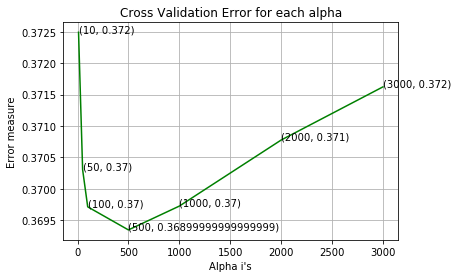

In [64]:
alpha=[10,50,100,500,1000,2000,3000]
cv_log_error_array=[]
for i in alpha:
    x_cfl=XGBClassifier(n_estimators=i)
    x_cfl.fit(standardized_data_approach1_mean_train[:60000], target_y_train[:60000])
    sig_clf = CalibratedClassifierCV(x_cfl, method="sigmoid")
    sig_clf.fit(standardized_data_approach1_mean_train[:60000], target_y_train[:60000])
    predict_y = sig_clf.predict_proba(standardized_data_approach1_mean_cv[:50000])
    cv_log_error_array.append(log_loss(target_cv_train[:50000], predict_y, labels=x_cfl.classes_, eps=1e-15))

for i in range(len(cv_log_error_array)):
    print ('log_loss for c = ',alpha[i],'is',cv_log_error_array[i])


best_alpha = np.argmin(cv_log_error_array)

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


('Log loss :', 0.3749260677632168)
('Number of mis-classified points :', 2497)
('--------------------', 'Confusion matrix', '--------------------')


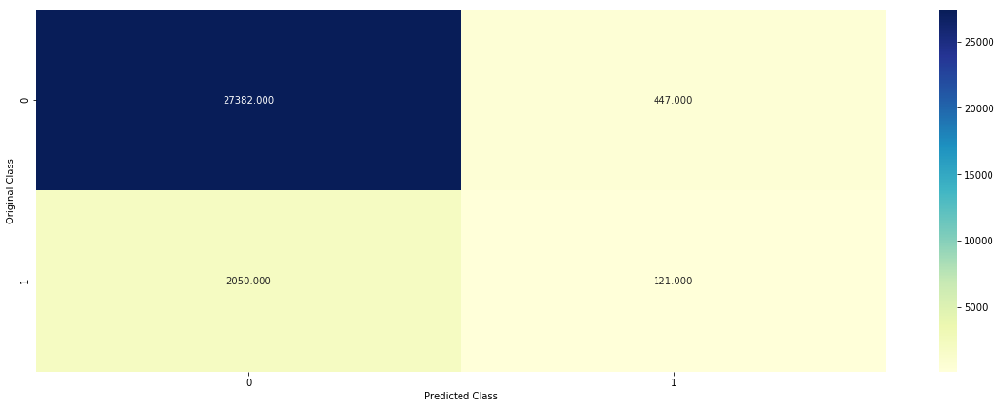

('--------------------', 'Precision matrix (Columm Sum=1)', '--------------------')


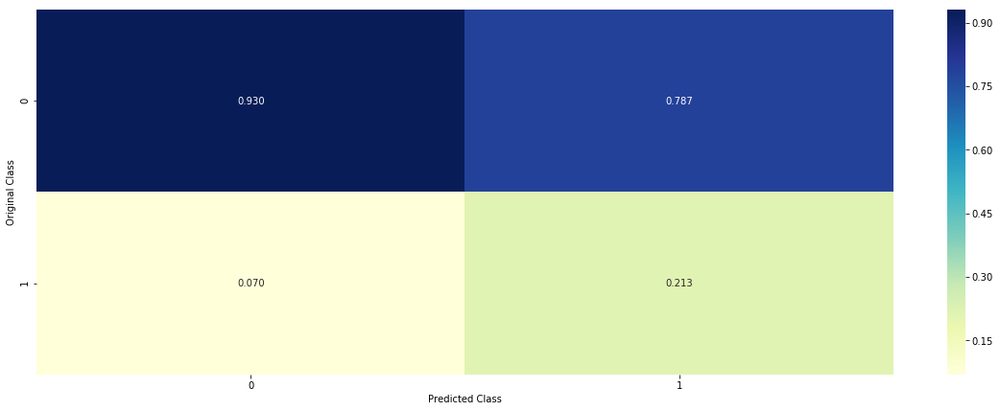

('--------------------', 'Recall matrix (Row sum=1)', '--------------------')


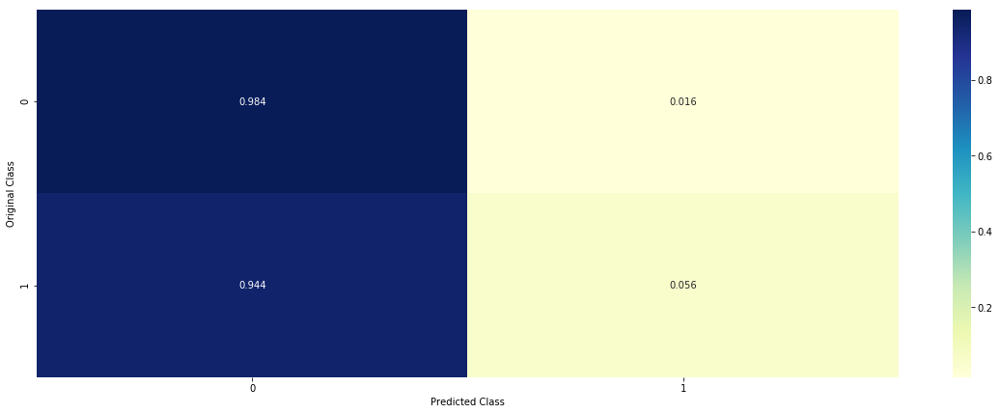

[[ 0.75881111  0.24118889]
 [ 0.7784013   0.2215987 ]
 [ 0.79034315  0.20965685]
 ..., 
 [ 0.72740602  0.27259398]
 [ 0.78696827  0.21303173]
 [ 0.76474479  0.23525521]]


In [34]:
clf=XGBClassifier(n_estimators=500)
clf=predict_and_plot_confusion_matrix(np.array(standardized_data_approach1_mean_train[:60000]), np.array(target_y_train[:60000]),np.array(standardized_data_approach1_mean_test[:30000]), np.array(target_test_train[:30000]), clf)
write_to_csv(clf,np.array(a_1.transform(test)),'xg_boost')

#### The complexity is measured differently across the model classes. We can view tree models as partitioning the feature space into different set of Additive Modelling) instead of greedy search, adding one tree at a time.

## Adaboost

('log_loss for c = ', 10, 'is', 0.3720923718324039)
('log_loss for c = ', 50, 'is', 0.37055001125095027)
('log_loss for c = ', 100, 'is', 0.37071044959782673)
('log_loss for c = ', 500, 'is', 0.37079855565229664)
('log_loss for c = ', 1000, 'is', 0.37095707892182528)
('log_loss for c = ', 2000, 'is', 0.37119241772535011)
('log_loss for c = ', 3000, 'is', 0.37140449545876336)


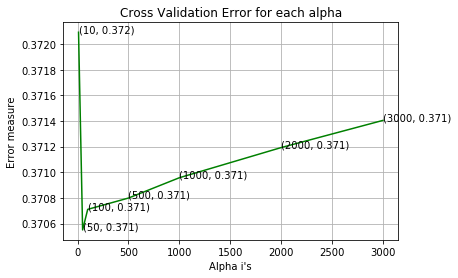

In [66]:
from sklearn.ensemble import AdaBoostClassifier
alpha=[10,50,100,500,1000,2000,3000]
cv_log_error_array=[]
for i in alpha:
    x_cfl=AdaBoostClassifier(n_estimators=i)
    x_cfl.fit(standardized_data_approach1_mean_train[:60000], target_y_train[:60000])
    sig_clf = CalibratedClassifierCV(x_cfl, method="sigmoid")
    sig_clf.fit(standardized_data_approach1_mean_train[:60000], target_y_train[:60000])
    predict_y = sig_clf.predict_proba(standardized_data_approach1_mean_cv[:50000])
    cv_log_error_array.append(log_loss(target_cv_train[:50000], predict_y, labels=x_cfl.classes_, eps=1e-15))

for i in range(len(cv_log_error_array)):
    print ('log_loss for c = ',alpha[i],'is',cv_log_error_array[i])


best_alpha = np.argmin(cv_log_error_array)

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()

('Log loss :', 0.37640250712910905)
('Number of mis-classified points :', 2439)
('--------------------', 'Confusion matrix', '--------------------')


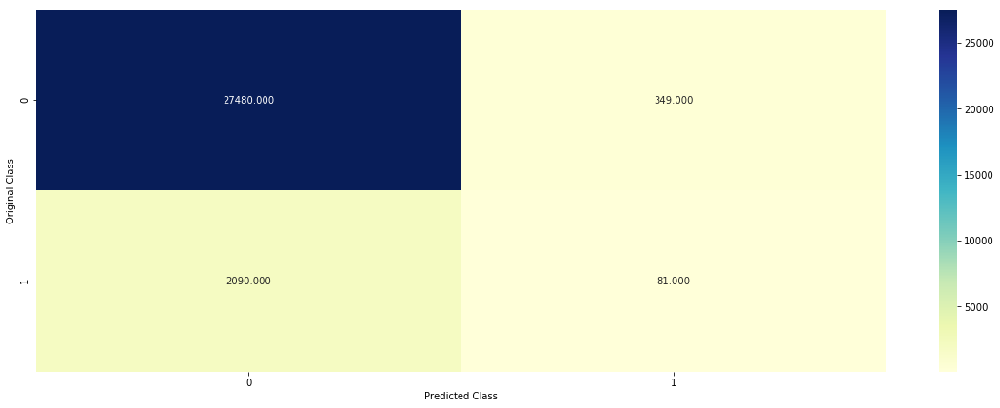

('--------------------', 'Precision matrix (Columm Sum=1)', '--------------------')


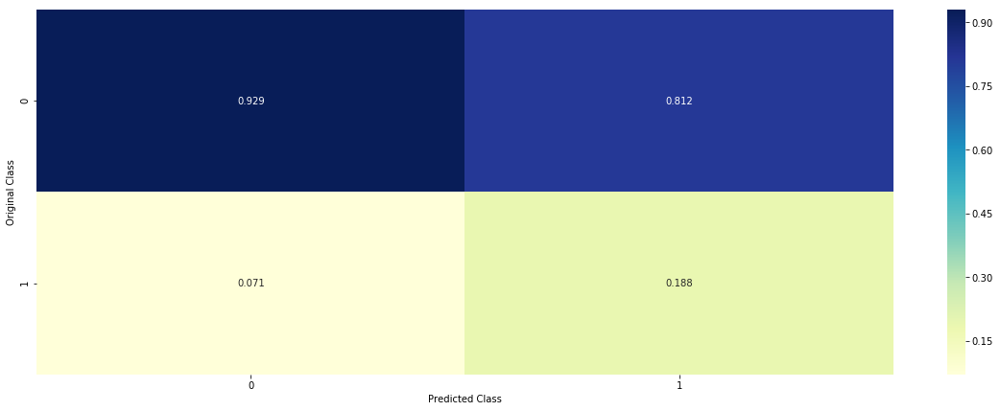

('--------------------', 'Recall matrix (Row sum=1)', '--------------------')


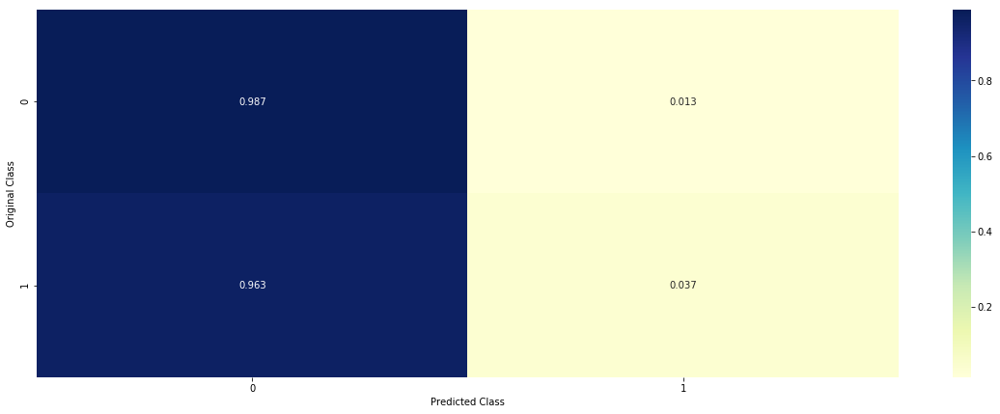

[[ 0.75442805  0.24557195]
 [ 0.7816561   0.2183439 ]
 [ 0.79593551  0.20406449]
 ..., 
 [ 0.7445356   0.2554644 ]
 [ 0.79108915  0.20891085]
 [ 0.79099863  0.20900137]]


In [37]:
clf=AdaBoostClassifier(n_estimators=50)
clf=predict_and_plot_confusion_matrix(np.array(standardized_data_approach1_mean_train[:60000]), np.array(target_y_train[:60000]),np.array(standardized_data_approach1_mean_test[:30000]), np.array(target_test_train[:30000]), clf)
write_to_csv(clf,np.array(a_1.transform(test)),'ada_boost')

## from all the classifiers used xgboost gives us the best precision value 

## MLP (Multi Layer Perceptron)

#### Multilayerperceptron consist of set of input ,hidden and outputlayer where it has parameter weights which is used to map a function for input to the output node.

In [264]:
#let us shuffle the data for better purpose
target_y_train=np.array(target_y_train)
rng_state = np.random.get_state()
np.random.shuffle(standardized_data_approach1_mean_train)
np.random.set_state(rng_state)
np.random.shuffle(target_y_train)



In [239]:
# next batch generation
global_pointer_counter=0
def next_batch(batch_size):
    X_batch=[]
    Y_batch=[]
    global global_pointer_counter
    if global_pointer_counter<=len(standardized_data_approach1_mean_train)-batch_size:
        X_batch=standardized_data_approach1_mean_train[global_pointer_counter:batch_size+global_pointer_counter]
        Y_batch=target_y_train[global_pointer_counter:batch_size+global_pointer_counter]
        global_pointer_counter=global_pointer_counter+1
    else:
        global_pointer_counter=0
        X_batch=standardized_data_approach1_mean_train[global_pointer_counter:batch_size+global_pointer_counter]
        Y_batch=target_y_train[global_pointer_counter:batch_size+global_pointer_counter]
        global_pointer_counter=global_pointer_counter+1
    return X_batch,Y_batch

In [240]:
tf.reset_default_graph()

learning_rate = 0.01
training_epochs = 200
batch_size = 1000
display_step = 1

# Network Parameters
n_hidden_1 = 512 # 1st layer number of features
n_hidden_2 = 256 # 2nd layer number of features
n_hidden_3=256
n_hidden_4=256
n_input = 55 # MNIST data input (img shape: 28*28)
n_classes = 1 # MNIST total classes (0-9 digits)
# tf Graph input
x = tf.placeholder(tf.float32, [None, 55])
y = tf.placeholder(tf.float32, [None, 1])

In [241]:
weights = {
    'h1': tf.Variable(tf.random_normal([n_input, n_hidden_1])),
    'h2': tf.Variable(tf.random_normal([n_hidden_1, n_hidden_2])),
    'h3': tf.Variable(tf.random_normal([n_hidden_2, n_hidden_3])),
    'h4':tf.Variable(tf.random_normal([n_hidden_3, n_hidden_4])),
    'out':tf.Variable(tf.random_normal([n_hidden_4, 1]))
}
biases = {
    'b1': tf.Variable(tf.random_normal([n_hidden_1])),
    'b2': tf.Variable(tf.random_normal([n_hidden_2])),
    'b3':tf.Variable(tf.random_normal([n_hidden_3])),
    'b4':tf.Variable(tf.random_normal([n_hidden_4])),
    'out': tf.Variable(tf.random_normal([n_classes]))
}


In [242]:
#simple ann architecture
layer_1 = tf.add(tf.matmul(x, weights['h1']), biases['b1'])
layer_1 = tf.nn.relu(layer_1)
layer_2 = tf.add(tf.matmul(layer_1, weights['h2']), biases['b2'])
layer_2 = tf.nn.relu(layer_2)
layer_3 = tf.add(tf.matmul(layer_2, weights['h3']), biases['b3'])
layer_3 = tf.nn.relu(layer_3)
layer_4 = tf.add(tf.matmul(layer_3, weights['h4']), biases['b4'])
layer_4 = tf.nn.relu(layer_4)
layer_5 = tf.add(tf.matmul(layer_4, weights['out']), biases['out'])
layer_5 = tf.nn.sigmoid(layer_5)


In [243]:
# Define loss and optimizer and gradient clipping
cost = tf.reduce_mean(tf.reduce_mean(tf.square(tf.subtract(layer_5,y))))
optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate)
gradients = optimizer.compute_gradients(cost)
capped_gradients = [(tf.clip_by_value(grad, -1., 1.), var) for grad, var in gradients if grad is not None]
train_op = optimizer.apply_gradients(capped_gradients)


In [275]:
# Initializing the variables
save_path = 'checkpoints/ann'
saver = tf.train.Saver()
init = tf.global_variables_initializer()
c=0.0
total_batch=len(standardized_data_approach1_mean_train)/batch_size
# Launch the graph
with tf.Session() as sess:
    sess.run(init)

    # Training cycle
    for epoch in range(training_epochs):
        avg_cost = 0.
        num_iterations=100000
        # Loop over all batches
        for i in range(total_batch):
            batch_x, batch_y =next_batch(batch_size=batch_size)
            # Run optimization op (backprop) and cost op (to get loss value)
            loss = sess.run([train_op, cost], feed_dict={x: batch_x,
                                                          y: batch_y.reshape(batch_size,1)})
            print'loss after the epoch ',epoch,' after the iteration number ',int(i),'iterstion','is',loss[1]

            # Compute average loss
            avg_cost += c / total_batch
            if epoch%10:
                loss_cv=sess.run(cost, feed_dict={x: standardized_data_approach1_mean_cv[:60000],
                                                          y: np.array(target_cv_train)[:60000].reshape(60000,1)})
                print'cross validation loss after the epoch ',epoch,' after the iteration number ',int(i),'iterstion','is',loss_cv
            saver.save(sess, save_path)
            print('Model Trained and Saved')
        # Display logs per epoch step
        if epoch % 40 == 0:
            print("Epoch:", '%04d' % (epoch+1), "cost=", \
                "{:.9f}".format(avg_cost))
    print("Optimization Finished!")

    

loss after the epoch  0  after the iteration number  0 iterstion is 0.707
Model Trained and Saved
loss after the epoch  0  after the iteration number  1 iterstion is 0.708
Model Trained and Saved
loss after the epoch  0  after the iteration number  2 iterstion is 0.707
Model Trained and Saved
loss after the epoch  0  after the iteration number  3 iterstion is 0.707
Model Trained and Saved
loss after the epoch  0  after the iteration number  4 iterstion is 0.708
Model Trained and Saved
loss after the epoch  0  after the iteration number  5 iterstion is 0.709
Model Trained and Saved
loss after the epoch  0  after the iteration number  6 iterstion is 0.71
Model Trained and Saved
loss after the epoch  0  after the iteration number  7 iterstion is 0.711
Model Trained and Saved
loss after the epoch  0  after the iteration number  8 iterstion is 0.711
Model Trained and Saved
loss after the epoch  0  after the iteration number  9 iterstion is 0.711
Model Trained and Saved
loss after the epoch 

loss after the epoch  0  after the iteration number  83 iterstion is 0.714
Model Trained and Saved
loss after the epoch  0  after the iteration number  84 iterstion is 0.715
Model Trained and Saved
loss after the epoch  0  after the iteration number  85 iterstion is 0.716
Model Trained and Saved
loss after the epoch  0  after the iteration number  86 iterstion is 0.717
Model Trained and Saved
loss after the epoch  0  after the iteration number  87 iterstion is 0.717
Model Trained and Saved
loss after the epoch  0  after the iteration number  88 iterstion is 0.718
Model Trained and Saved
loss after the epoch  0  after the iteration number  89 iterstion is 0.718
Model Trained and Saved
loss after the epoch  0  after the iteration number  90 iterstion is 0.718
Model Trained and Saved
loss after the epoch  0  after the iteration number  91 iterstion is 0.718
Model Trained and Saved
loss after the epoch  0  after the iteration number  92 iterstion is 0.718
Model Trained and Saved
loss after

Model Trained and Saved
loss after the epoch  0  after the iteration number  166 iterstion is 0.715
Model Trained and Saved
loss after the epoch  0  after the iteration number  167 iterstion is 0.716
Model Trained and Saved
loss after the epoch  0  after the iteration number  168 iterstion is 0.715
Model Trained and Saved
loss after the epoch  0  after the iteration number  169 iterstion is 0.716
Model Trained and Saved
loss after the epoch  0  after the iteration number  170 iterstion is 0.716
Model Trained and Saved
loss after the epoch  0  after the iteration number  171 iterstion is 0.715
Model Trained and Saved
loss after the epoch  0  after the iteration number  172 iterstion is 0.715
Model Trained and Saved
loss after the epoch  0  after the iteration number  173 iterstion is 0.716
Model Trained and Saved
loss after the epoch  0  after the iteration number  174 iterstion is 0.717
Model Trained and Saved
loss after the epoch  0  after the iteration number  175 iterstion is 0.717


Model Trained and Saved
loss after the epoch  0  after the iteration number  248 iterstion is 0.714
Model Trained and Saved
loss after the epoch  0  after the iteration number  249 iterstion is 0.713
Model Trained and Saved
loss after the epoch  0  after the iteration number  250 iterstion is 0.713
Model Trained and Saved
loss after the epoch  0  after the iteration number  251 iterstion is 0.713
Model Trained and Saved
loss after the epoch  0  after the iteration number  252 iterstion is 0.714
Model Trained and Saved
loss after the epoch  0  after the iteration number  253 iterstion is 0.715
Model Trained and Saved
loss after the epoch  0  after the iteration number  254 iterstion is 0.715
Model Trained and Saved
loss after the epoch  0  after the iteration number  255 iterstion is 0.714
Model Trained and Saved
loss after the epoch  0  after the iteration number  256 iterstion is 0.713
Model Trained and Saved
loss after the epoch  0  after the iteration number  257 iterstion is 0.713


Model Trained and Saved
loss after the epoch  0  after the iteration number  332 iterstion is 0.713
Model Trained and Saved
loss after the epoch  0  after the iteration number  333 iterstion is 0.712
Model Trained and Saved
loss after the epoch  0  after the iteration number  334 iterstion is 0.712
Model Trained and Saved
loss after the epoch  0  after the iteration number  335 iterstion is 0.712
Model Trained and Saved
loss after the epoch  0  after the iteration number  336 iterstion is 0.712
Model Trained and Saved
loss after the epoch  0  after the iteration number  337 iterstion is 0.712
Model Trained and Saved
loss after the epoch  0  after the iteration number  338 iterstion is 0.711
Model Trained and Saved
loss after the epoch  0  after the iteration number  339 iterstion is 0.711
Model Trained and Saved
loss after the epoch  0  after the iteration number  340 iterstion is 0.71
Model Trained and Saved
loss after the epoch  0  after the iteration number  341 iterstion is 0.71
Mo

Model Trained and Saved
loss after the epoch  0  after the iteration number  415 iterstion is 0.704
Model Trained and Saved
loss after the epoch  0  after the iteration number  416 iterstion is 0.705
Model Trained and Saved
loss after the epoch  0  after the iteration number  417 iterstion is 0.705
Model Trained and Saved
loss after the epoch  0  after the iteration number  418 iterstion is 0.705
Model Trained and Saved
loss after the epoch  0  after the iteration number  419 iterstion is 0.705
Model Trained and Saved
loss after the epoch  0  after the iteration number  420 iterstion is 0.706
Model Trained and Saved
loss after the epoch  0  after the iteration number  421 iterstion is 0.707
Model Trained and Saved
loss after the epoch  0  after the iteration number  422 iterstion is 0.707
Model Trained and Saved
loss after the epoch  0  after the iteration number  423 iterstion is 0.707
Model Trained and Saved
loss after the epoch  0  after the iteration number  424 iterstion is 0.707


cross validation loss after the epoch  1  after the iteration number  26 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  27 iterstion is 0.706
cross validation loss after the epoch  1  after the iteration number  27 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  28 iterstion is 0.705
cross validation loss after the epoch  1  after the iteration number  28 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  29 iterstion is 0.706
cross validation loss after the epoch  1  after the iteration number  29 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  30 iterstion is 0.706
cross validation loss after the epoch  1  after the iteration number  30 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  31 iterstion is 0.706
cross validation loss after th

cross validation loss after the epoch  1  after the iteration number  69 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  70 iterstion is 0.708
cross validation loss after the epoch  1  after the iteration number  70 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  71 iterstion is 0.708
cross validation loss after the epoch  1  after the iteration number  71 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  72 iterstion is 0.708
cross validation loss after the epoch  1  after the iteration number  72 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  73 iterstion is 0.708
cross validation loss after the epoch  1  after the iteration number  73 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  74 iterstion is 0.709
cross validation loss after th

cross validation loss after the epoch  1  after the iteration number  112 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  113 iterstion is 0.713
cross validation loss after the epoch  1  after the iteration number  113 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  114 iterstion is 0.713
cross validation loss after the epoch  1  after the iteration number  114 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  115 iterstion is 0.712
cross validation loss after the epoch  1  after the iteration number  115 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  116 iterstion is 0.712
cross validation loss after the epoch  1  after the iteration number  116 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  117 iterstion is 0.712
cross validation los

cross validation loss after the epoch  1  after the iteration number  154 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  155 iterstion is 0.715
cross validation loss after the epoch  1  after the iteration number  155 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  156 iterstion is 0.716
cross validation loss after the epoch  1  after the iteration number  156 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  157 iterstion is 0.716
cross validation loss after the epoch  1  after the iteration number  157 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  158 iterstion is 0.716
cross validation loss after the epoch  1  after the iteration number  158 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  159 iterstion is 0.717
cross validation los

cross validation loss after the epoch  1  after the iteration number  196 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  197 iterstion is 0.716
cross validation loss after the epoch  1  after the iteration number  197 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  198 iterstion is 0.715
cross validation loss after the epoch  1  after the iteration number  198 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  199 iterstion is 0.715
cross validation loss after the epoch  1  after the iteration number  199 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  200 iterstion is 0.714
cross validation loss after the epoch  1  after the iteration number  200 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  201 iterstion is 0.713
cross validation los

cross validation loss after the epoch  1  after the iteration number  238 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  239 iterstion is 0.708
cross validation loss after the epoch  1  after the iteration number  239 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  240 iterstion is 0.708
cross validation loss after the epoch  1  after the iteration number  240 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  241 iterstion is 0.707
cross validation loss after the epoch  1  after the iteration number  241 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  242 iterstion is 0.707
cross validation loss after the epoch  1  after the iteration number  242 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  243 iterstion is 0.707
cross validation los

cross validation loss after the epoch  1  after the iteration number  280 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  281 iterstion is 0.708
cross validation loss after the epoch  1  after the iteration number  281 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  282 iterstion is 0.708
cross validation loss after the epoch  1  after the iteration number  282 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  283 iterstion is 0.708
cross validation loss after the epoch  1  after the iteration number  283 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  284 iterstion is 0.708
cross validation loss after the epoch  1  after the iteration number  284 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  285 iterstion is 0.707
cross validation los

cross validation loss after the epoch  1  after the iteration number  322 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  323 iterstion is 0.71
cross validation loss after the epoch  1  after the iteration number  323 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  324 iterstion is 0.71
cross validation loss after the epoch  1  after the iteration number  324 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  325 iterstion is 0.71
cross validation loss after the epoch  1  after the iteration number  325 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  326 iterstion is 0.71
cross validation loss after the epoch  1  after the iteration number  326 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  327 iterstion is 0.709
cross validation loss af

cross validation loss after the epoch  1  after the iteration number  364 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  365 iterstion is 0.711
cross validation loss after the epoch  1  after the iteration number  365 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  366 iterstion is 0.712
cross validation loss after the epoch  1  after the iteration number  366 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  367 iterstion is 0.712
cross validation loss after the epoch  1  after the iteration number  367 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  368 iterstion is 0.711
cross validation loss after the epoch  1  after the iteration number  368 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  369 iterstion is 0.712
cross validation los

cross validation loss after the epoch  1  after the iteration number  406 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  407 iterstion is 0.702
cross validation loss after the epoch  1  after the iteration number  407 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  408 iterstion is 0.702
cross validation loss after the epoch  1  after the iteration number  408 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  409 iterstion is 0.702
cross validation loss after the epoch  1  after the iteration number  409 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  410 iterstion is 0.702
cross validation loss after the epoch  1  after the iteration number  410 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  1  after the iteration number  411 iterstion is 0.702
cross validation los

cross validation loss after the epoch  2  after the iteration number  1 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  2 iterstion is 0.705
cross validation loss after the epoch  2  after the iteration number  2 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  3 iterstion is 0.705
cross validation loss after the epoch  2  after the iteration number  3 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  4 iterstion is 0.705
cross validation loss after the epoch  2  after the iteration number  4 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  5 iterstion is 0.705
cross validation loss after the epoch  2  after the iteration number  5 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  6 iterstion is 0.705
cross validation loss after the epoch  2

cross validation loss after the epoch  2  after the iteration number  44 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  45 iterstion is 0.7
cross validation loss after the epoch  2  after the iteration number  45 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  46 iterstion is 0.701
cross validation loss after the epoch  2  after the iteration number  46 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  47 iterstion is 0.701
cross validation loss after the epoch  2  after the iteration number  47 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  48 iterstion is 0.701
cross validation loss after the epoch  2  after the iteration number  48 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  49 iterstion is 0.701
cross validation loss after the 

cross validation loss after the epoch  2  after the iteration number  87 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  88 iterstion is 0.698
cross validation loss after the epoch  2  after the iteration number  88 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  89 iterstion is 0.699
cross validation loss after the epoch  2  after the iteration number  89 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  90 iterstion is 0.7
cross validation loss after the epoch  2  after the iteration number  90 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  91 iterstion is 0.701
cross validation loss after the epoch  2  after the iteration number  91 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  92 iterstion is 0.7
cross validation loss after the ep

cross validation loss after the epoch  2  after the iteration number  129 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  130 iterstion is 0.696
cross validation loss after the epoch  2  after the iteration number  130 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  131 iterstion is 0.696
cross validation loss after the epoch  2  after the iteration number  131 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  132 iterstion is 0.695
cross validation loss after the epoch  2  after the iteration number  132 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  133 iterstion is 0.695
cross validation loss after the epoch  2  after the iteration number  133 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  134 iterstion is 0.695
cross validation los

cross validation loss after the epoch  2  after the iteration number  171 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  172 iterstion is 0.694
cross validation loss after the epoch  2  after the iteration number  172 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  173 iterstion is 0.694
cross validation loss after the epoch  2  after the iteration number  173 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  174 iterstion is 0.694
cross validation loss after the epoch  2  after the iteration number  174 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  175 iterstion is 0.694
cross validation loss after the epoch  2  after the iteration number  175 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  176 iterstion is 0.693
cross validation los

cross validation loss after the epoch  2  after the iteration number  213 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  214 iterstion is 0.683
cross validation loss after the epoch  2  after the iteration number  214 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  215 iterstion is 0.684
cross validation loss after the epoch  2  after the iteration number  215 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  216 iterstion is 0.684
cross validation loss after the epoch  2  after the iteration number  216 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  217 iterstion is 0.685
cross validation loss after the epoch  2  after the iteration number  217 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  218 iterstion is 0.684
cross validation los

cross validation loss after the epoch  2  after the iteration number  255 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  256 iterstion is 0.69
cross validation loss after the epoch  2  after the iteration number  256 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  257 iterstion is 0.69
cross validation loss after the epoch  2  after the iteration number  257 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  258 iterstion is 0.69
cross validation loss after the epoch  2  after the iteration number  258 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  259 iterstion is 0.689
cross validation loss after the epoch  2  after the iteration number  259 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  260 iterstion is 0.689
cross validation loss a

cross validation loss after the epoch  2  after the iteration number  297 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  298 iterstion is 0.689
cross validation loss after the epoch  2  after the iteration number  298 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  299 iterstion is 0.689
cross validation loss after the epoch  2  after the iteration number  299 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  300 iterstion is 0.689
cross validation loss after the epoch  2  after the iteration number  300 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  301 iterstion is 0.688
cross validation loss after the epoch  2  after the iteration number  301 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  302 iterstion is 0.687
cross validation los

cross validation loss after the epoch  2  after the iteration number  339 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  340 iterstion is 0.686
cross validation loss after the epoch  2  after the iteration number  340 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  341 iterstion is 0.685
cross validation loss after the epoch  2  after the iteration number  341 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  342 iterstion is 0.686
cross validation loss after the epoch  2  after the iteration number  342 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  343 iterstion is 0.686
cross validation loss after the epoch  2  after the iteration number  343 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  344 iterstion is 0.687
cross validation los

cross validation loss after the epoch  2  after the iteration number  381 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  382 iterstion is 0.691
cross validation loss after the epoch  2  after the iteration number  382 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  383 iterstion is 0.691
cross validation loss after the epoch  2  after the iteration number  383 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  384 iterstion is 0.692
cross validation loss after the epoch  2  after the iteration number  384 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  385 iterstion is 0.691
cross validation loss after the epoch  2  after the iteration number  385 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  386 iterstion is 0.691
cross validation los

cross validation loss after the epoch  2  after the iteration number  423 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  424 iterstion is 0.696
cross validation loss after the epoch  2  after the iteration number  424 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  425 iterstion is 0.697
cross validation loss after the epoch  2  after the iteration number  425 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  426 iterstion is 0.698
cross validation loss after the epoch  2  after the iteration number  426 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  427 iterstion is 0.697
cross validation loss after the epoch  2  after the iteration number  427 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  2  after the iteration number  428 iterstion is 0.697
cross validation los

cross validation loss after the epoch  3  after the iteration number  19 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  20 iterstion is 0.695
cross validation loss after the epoch  3  after the iteration number  20 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  21 iterstion is 0.695
cross validation loss after the epoch  3  after the iteration number  21 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  22 iterstion is 0.694
cross validation loss after the epoch  3  after the iteration number  22 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  23 iterstion is 0.694
cross validation loss after the epoch  3  after the iteration number  23 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  24 iterstion is 0.694
cross validation loss after th

cross validation loss after the epoch  3  after the iteration number  62 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  63 iterstion is 0.693
cross validation loss after the epoch  3  after the iteration number  63 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  64 iterstion is 0.693
cross validation loss after the epoch  3  after the iteration number  64 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  65 iterstion is 0.692
cross validation loss after the epoch  3  after the iteration number  65 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  66 iterstion is 0.691
cross validation loss after the epoch  3  after the iteration number  66 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  67 iterstion is 0.692
cross validation loss after th

cross validation loss after the epoch  3  after the iteration number  105 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  106 iterstion is 0.687
cross validation loss after the epoch  3  after the iteration number  106 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  107 iterstion is 0.687
cross validation loss after the epoch  3  after the iteration number  107 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  108 iterstion is 0.686
cross validation loss after the epoch  3  after the iteration number  108 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  109 iterstion is 0.685
cross validation loss after the epoch  3  after the iteration number  109 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  110 iterstion is 0.685
cross validation los

cross validation loss after the epoch  3  after the iteration number  147 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  148 iterstion is 0.69
cross validation loss after the epoch  3  after the iteration number  148 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  149 iterstion is 0.69
cross validation loss after the epoch  3  after the iteration number  149 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  150 iterstion is 0.69
cross validation loss after the epoch  3  after the iteration number  150 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  151 iterstion is 0.689
cross validation loss after the epoch  3  after the iteration number  151 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  152 iterstion is 0.688
cross validation loss a

cross validation loss after the epoch  3  after the iteration number  189 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  190 iterstion is 0.682
cross validation loss after the epoch  3  after the iteration number  190 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  191 iterstion is 0.682
cross validation loss after the epoch  3  after the iteration number  191 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  192 iterstion is 0.683
cross validation loss after the epoch  3  after the iteration number  192 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  193 iterstion is 0.684
cross validation loss after the epoch  3  after the iteration number  193 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  194 iterstion is 0.685
cross validation los

cross validation loss after the epoch  3  after the iteration number  231 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  232 iterstion is 0.678
cross validation loss after the epoch  3  after the iteration number  232 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  233 iterstion is 0.678
cross validation loss after the epoch  3  after the iteration number  233 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  234 iterstion is 0.678
cross validation loss after the epoch  3  after the iteration number  234 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  235 iterstion is 0.678
cross validation loss after the epoch  3  after the iteration number  235 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  236 iterstion is 0.679
cross validation los

cross validation loss after the epoch  3  after the iteration number  273 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  274 iterstion is 0.678
cross validation loss after the epoch  3  after the iteration number  274 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  275 iterstion is 0.677
cross validation loss after the epoch  3  after the iteration number  275 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  276 iterstion is 0.677
cross validation loss after the epoch  3  after the iteration number  276 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  277 iterstion is 0.677
cross validation loss after the epoch  3  after the iteration number  277 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  278 iterstion is 0.676
cross validation los

cross validation loss after the epoch  3  after the iteration number  315 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  316 iterstion is 0.681
cross validation loss after the epoch  3  after the iteration number  316 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  317 iterstion is 0.682
cross validation loss after the epoch  3  after the iteration number  317 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  318 iterstion is 0.682
cross validation loss after the epoch  3  after the iteration number  318 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  319 iterstion is 0.683
cross validation loss after the epoch  3  after the iteration number  319 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  320 iterstion is 0.684
cross validation los

cross validation loss after the epoch  3  after the iteration number  357 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  358 iterstion is 0.682
cross validation loss after the epoch  3  after the iteration number  358 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  359 iterstion is 0.681
cross validation loss after the epoch  3  after the iteration number  359 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  360 iterstion is 0.682
cross validation loss after the epoch  3  after the iteration number  360 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  361 iterstion is 0.683
cross validation loss after the epoch  3  after the iteration number  361 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  362 iterstion is 0.682
cross validation los

cross validation loss after the epoch  3  after the iteration number  399 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  400 iterstion is 0.679
cross validation loss after the epoch  3  after the iteration number  400 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  401 iterstion is 0.678
cross validation loss after the epoch  3  after the iteration number  401 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  402 iterstion is 0.678
cross validation loss after the epoch  3  after the iteration number  402 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  403 iterstion is 0.678
cross validation loss after the epoch  3  after the iteration number  403 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  404 iterstion is 0.679
cross validation los

cross validation loss after the epoch  3  after the iteration number  441 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  442 iterstion is 0.68
cross validation loss after the epoch  3  after the iteration number  442 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  443 iterstion is 0.68
cross validation loss after the epoch  3  after the iteration number  443 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  444 iterstion is 0.679
cross validation loss after the epoch  3  after the iteration number  444 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  445 iterstion is 0.679
cross validation loss after the epoch  3  after the iteration number  445 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  3  after the iteration number  446 iterstion is 0.68
cross validation loss a

cross validation loss after the epoch  4  after the iteration number  37 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  38 iterstion is 0.684
cross validation loss after the epoch  4  after the iteration number  38 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  39 iterstion is 0.685
cross validation loss after the epoch  4  after the iteration number  39 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  40 iterstion is 0.686
cross validation loss after the epoch  4  after the iteration number  40 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  41 iterstion is 0.686
cross validation loss after the epoch  4  after the iteration number  41 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  42 iterstion is 0.686
cross validation loss after th

cross validation loss after the epoch  4  after the iteration number  80 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  81 iterstion is 0.69
cross validation loss after the epoch  4  after the iteration number  81 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  82 iterstion is 0.69
cross validation loss after the epoch  4  after the iteration number  82 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  83 iterstion is 0.689
cross validation loss after the epoch  4  after the iteration number  83 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  84 iterstion is 0.689
cross validation loss after the epoch  4  after the iteration number  84 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  85 iterstion is 0.688
cross validation loss after the 

cross validation loss after the epoch  4  after the iteration number  123 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  124 iterstion is 0.685
cross validation loss after the epoch  4  after the iteration number  124 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  125 iterstion is 0.685
cross validation loss after the epoch  4  after the iteration number  125 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  126 iterstion is 0.685
cross validation loss after the epoch  4  after the iteration number  126 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  127 iterstion is 0.684
cross validation loss after the epoch  4  after the iteration number  127 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  128 iterstion is 0.684
cross validation los

cross validation loss after the epoch  4  after the iteration number  165 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  166 iterstion is 0.682
cross validation loss after the epoch  4  after the iteration number  166 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  167 iterstion is 0.682
cross validation loss after the epoch  4  after the iteration number  167 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  168 iterstion is 0.681
cross validation loss after the epoch  4  after the iteration number  168 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  169 iterstion is 0.681
cross validation loss after the epoch  4  after the iteration number  169 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  170 iterstion is 0.681
cross validation los

cross validation loss after the epoch  4  after the iteration number  207 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  208 iterstion is 0.688
cross validation loss after the epoch  4  after the iteration number  208 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  209 iterstion is 0.688
cross validation loss after the epoch  4  after the iteration number  209 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  210 iterstion is 0.688
cross validation loss after the epoch  4  after the iteration number  210 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  211 iterstion is 0.688
cross validation loss after the epoch  4  after the iteration number  211 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  212 iterstion is 0.688
cross validation los

cross validation loss after the epoch  4  after the iteration number  249 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  250 iterstion is 0.69
cross validation loss after the epoch  4  after the iteration number  250 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  251 iterstion is 0.691
cross validation loss after the epoch  4  after the iteration number  251 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  252 iterstion is 0.691
cross validation loss after the epoch  4  after the iteration number  252 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  253 iterstion is 0.69
cross validation loss after the epoch  4  after the iteration number  253 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  254 iterstion is 0.69
cross validation loss a

cross validation loss after the epoch  4  after the iteration number  291 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  292 iterstion is 0.697
cross validation loss after the epoch  4  after the iteration number  292 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  293 iterstion is 0.697
cross validation loss after the epoch  4  after the iteration number  293 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  294 iterstion is 0.697
cross validation loss after the epoch  4  after the iteration number  294 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  295 iterstion is 0.697
cross validation loss after the epoch  4  after the iteration number  295 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  296 iterstion is 0.698
cross validation los

cross validation loss after the epoch  4  after the iteration number  333 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  334 iterstion is 0.7
cross validation loss after the epoch  4  after the iteration number  334 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  335 iterstion is 0.7
cross validation loss after the epoch  4  after the iteration number  335 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  336 iterstion is 0.7
cross validation loss after the epoch  4  after the iteration number  336 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  337 iterstion is 0.7
cross validation loss after the epoch  4  after the iteration number  337 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  338 iterstion is 0.7
cross validation loss after th

cross validation loss after the epoch  4  after the iteration number  376 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  377 iterstion is 0.696
cross validation loss after the epoch  4  after the iteration number  377 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  378 iterstion is 0.696
cross validation loss after the epoch  4  after the iteration number  378 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  379 iterstion is 0.696
cross validation loss after the epoch  4  after the iteration number  379 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  380 iterstion is 0.696
cross validation loss after the epoch  4  after the iteration number  380 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  381 iterstion is 0.696
cross validation los

cross validation loss after the epoch  4  after the iteration number  418 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  419 iterstion is 0.708
cross validation loss after the epoch  4  after the iteration number  419 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  420 iterstion is 0.708
cross validation loss after the epoch  4  after the iteration number  420 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  421 iterstion is 0.708
cross validation loss after the epoch  4  after the iteration number  421 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  422 iterstion is 0.709
cross validation loss after the epoch  4  after the iteration number  422 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  4  after the iteration number  423 iterstion is 0.708
cross validation los

cross validation loss after the epoch  5  after the iteration number  14 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  15 iterstion is 0.712
cross validation loss after the epoch  5  after the iteration number  15 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  16 iterstion is 0.712
cross validation loss after the epoch  5  after the iteration number  16 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  17 iterstion is 0.711
cross validation loss after the epoch  5  after the iteration number  17 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  18 iterstion is 0.711
cross validation loss after the epoch  5  after the iteration number  18 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  19 iterstion is 0.711
cross validation loss after th

cross validation loss after the epoch  5  after the iteration number  57 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  58 iterstion is 0.707
cross validation loss after the epoch  5  after the iteration number  58 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  59 iterstion is 0.706
cross validation loss after the epoch  5  after the iteration number  59 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  60 iterstion is 0.706
cross validation loss after the epoch  5  after the iteration number  60 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  61 iterstion is 0.705
cross validation loss after the epoch  5  after the iteration number  61 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  62 iterstion is 0.705
cross validation loss after th

cross validation loss after the epoch  5  after the iteration number  100 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  101 iterstion is 0.709
cross validation loss after the epoch  5  after the iteration number  101 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  102 iterstion is 0.71
cross validation loss after the epoch  5  after the iteration number  102 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  103 iterstion is 0.71
cross validation loss after the epoch  5  after the iteration number  103 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  104 iterstion is 0.709
cross validation loss after the epoch  5  after the iteration number  104 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  105 iterstion is 0.709
cross validation loss 

cross validation loss after the epoch  5  after the iteration number  142 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  143 iterstion is 0.716
cross validation loss after the epoch  5  after the iteration number  143 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  144 iterstion is 0.717
cross validation loss after the epoch  5  after the iteration number  144 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  145 iterstion is 0.718
cross validation loss after the epoch  5  after the iteration number  145 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  146 iterstion is 0.719
cross validation loss after the epoch  5  after the iteration number  146 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  147 iterstion is 0.719
cross validation los

cross validation loss after the epoch  5  after the iteration number  184 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  185 iterstion is 0.717
cross validation loss after the epoch  5  after the iteration number  185 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  186 iterstion is 0.717
cross validation loss after the epoch  5  after the iteration number  186 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  187 iterstion is 0.716
cross validation loss after the epoch  5  after the iteration number  187 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  188 iterstion is 0.715
cross validation loss after the epoch  5  after the iteration number  188 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  189 iterstion is 0.715
cross validation los

cross validation loss after the epoch  5  after the iteration number  226 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  227 iterstion is 0.72
cross validation loss after the epoch  5  after the iteration number  227 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  228 iterstion is 0.719
cross validation loss after the epoch  5  after the iteration number  228 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  229 iterstion is 0.719
cross validation loss after the epoch  5  after the iteration number  229 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  230 iterstion is 0.719
cross validation loss after the epoch  5  after the iteration number  230 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  231 iterstion is 0.719
cross validation loss

cross validation loss after the epoch  5  after the iteration number  268 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  269 iterstion is 0.726
cross validation loss after the epoch  5  after the iteration number  269 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  270 iterstion is 0.726
cross validation loss after the epoch  5  after the iteration number  270 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  271 iterstion is 0.725
cross validation loss after the epoch  5  after the iteration number  271 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  272 iterstion is 0.725
cross validation loss after the epoch  5  after the iteration number  272 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  273 iterstion is 0.726
cross validation los

cross validation loss after the epoch  5  after the iteration number  310 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  311 iterstion is 0.73
cross validation loss after the epoch  5  after the iteration number  311 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  312 iterstion is 0.73
cross validation loss after the epoch  5  after the iteration number  312 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  313 iterstion is 0.729
cross validation loss after the epoch  5  after the iteration number  313 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  314 iterstion is 0.728
cross validation loss after the epoch  5  after the iteration number  314 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  315 iterstion is 0.728
cross validation loss 

cross validation loss after the epoch  5  after the iteration number  352 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  353 iterstion is 0.725
cross validation loss after the epoch  5  after the iteration number  353 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  354 iterstion is 0.726
cross validation loss after the epoch  5  after the iteration number  354 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  355 iterstion is 0.726
cross validation loss after the epoch  5  after the iteration number  355 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  356 iterstion is 0.726
cross validation loss after the epoch  5  after the iteration number  356 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  357 iterstion is 0.727
cross validation los

cross validation loss after the epoch  5  after the iteration number  394 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  395 iterstion is 0.729
cross validation loss after the epoch  5  after the iteration number  395 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  396 iterstion is 0.73
cross validation loss after the epoch  5  after the iteration number  396 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  397 iterstion is 0.73
cross validation loss after the epoch  5  after the iteration number  397 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  398 iterstion is 0.73
cross validation loss after the epoch  5  after the iteration number  398 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  399 iterstion is 0.729
cross validation loss a

cross validation loss after the epoch  5  after the iteration number  436 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  437 iterstion is 0.725
cross validation loss after the epoch  5  after the iteration number  437 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  438 iterstion is 0.725
cross validation loss after the epoch  5  after the iteration number  438 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  439 iterstion is 0.724
cross validation loss after the epoch  5  after the iteration number  439 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  440 iterstion is 0.725
cross validation loss after the epoch  5  after the iteration number  440 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  5  after the iteration number  441 iterstion is 0.724
cross validation los

cross validation loss after the epoch  6  after the iteration number  32 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  33 iterstion is 0.726
cross validation loss after the epoch  6  after the iteration number  33 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  34 iterstion is 0.727
cross validation loss after the epoch  6  after the iteration number  34 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  35 iterstion is 0.726
cross validation loss after the epoch  6  after the iteration number  35 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  36 iterstion is 0.727
cross validation loss after the epoch  6  after the iteration number  36 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  37 iterstion is 0.726
cross validation loss after th

cross validation loss after the epoch  6  after the iteration number  75 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  76 iterstion is 0.727
cross validation loss after the epoch  6  after the iteration number  76 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  77 iterstion is 0.727
cross validation loss after the epoch  6  after the iteration number  77 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  78 iterstion is 0.726
cross validation loss after the epoch  6  after the iteration number  78 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  79 iterstion is 0.726
cross validation loss after the epoch  6  after the iteration number  79 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  80 iterstion is 0.725
cross validation loss after th

cross validation loss after the epoch  6  after the iteration number  118 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  119 iterstion is 0.724
cross validation loss after the epoch  6  after the iteration number  119 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  120 iterstion is 0.723
cross validation loss after the epoch  6  after the iteration number  120 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  121 iterstion is 0.723
cross validation loss after the epoch  6  after the iteration number  121 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  122 iterstion is 0.723
cross validation loss after the epoch  6  after the iteration number  122 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  123 iterstion is 0.723
cross validation los

cross validation loss after the epoch  6  after the iteration number  160 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  161 iterstion is 0.724
cross validation loss after the epoch  6  after the iteration number  161 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  162 iterstion is 0.725
cross validation loss after the epoch  6  after the iteration number  162 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  163 iterstion is 0.725
cross validation loss after the epoch  6  after the iteration number  163 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  164 iterstion is 0.725
cross validation loss after the epoch  6  after the iteration number  164 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  165 iterstion is 0.725
cross validation los

cross validation loss after the epoch  6  after the iteration number  202 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  203 iterstion is 0.717
cross validation loss after the epoch  6  after the iteration number  203 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  204 iterstion is 0.718
cross validation loss after the epoch  6  after the iteration number  204 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  205 iterstion is 0.719
cross validation loss after the epoch  6  after the iteration number  205 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  206 iterstion is 0.719
cross validation loss after the epoch  6  after the iteration number  206 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  207 iterstion is 0.718
cross validation los

cross validation loss after the epoch  6  after the iteration number  244 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  245 iterstion is 0.721
cross validation loss after the epoch  6  after the iteration number  245 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  246 iterstion is 0.721
cross validation loss after the epoch  6  after the iteration number  246 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  247 iterstion is 0.722
cross validation loss after the epoch  6  after the iteration number  247 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  248 iterstion is 0.721
cross validation loss after the epoch  6  after the iteration number  248 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  249 iterstion is 0.722
cross validation los

cross validation loss after the epoch  6  after the iteration number  286 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  287 iterstion is 0.723
cross validation loss after the epoch  6  after the iteration number  287 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  288 iterstion is 0.723
cross validation loss after the epoch  6  after the iteration number  288 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  289 iterstion is 0.722
cross validation loss after the epoch  6  after the iteration number  289 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  290 iterstion is 0.722
cross validation loss after the epoch  6  after the iteration number  290 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  291 iterstion is 0.722
cross validation los

cross validation loss after the epoch  6  after the iteration number  328 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  329 iterstion is 0.722
cross validation loss after the epoch  6  after the iteration number  329 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  330 iterstion is 0.722
cross validation loss after the epoch  6  after the iteration number  330 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  331 iterstion is 0.721
cross validation loss after the epoch  6  after the iteration number  331 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  332 iterstion is 0.72
cross validation loss after the epoch  6  after the iteration number  332 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  333 iterstion is 0.721
cross validation loss

cross validation loss after the epoch  6  after the iteration number  370 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  371 iterstion is 0.725
cross validation loss after the epoch  6  after the iteration number  371 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  372 iterstion is 0.724
cross validation loss after the epoch  6  after the iteration number  372 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  373 iterstion is 0.724
cross validation loss after the epoch  6  after the iteration number  373 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  374 iterstion is 0.724
cross validation loss after the epoch  6  after the iteration number  374 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  375 iterstion is 0.725
cross validation los

cross validation loss after the epoch  6  after the iteration number  412 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  413 iterstion is 0.723
cross validation loss after the epoch  6  after the iteration number  413 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  414 iterstion is 0.724
cross validation loss after the epoch  6  after the iteration number  414 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  415 iterstion is 0.724
cross validation loss after the epoch  6  after the iteration number  415 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  416 iterstion is 0.723
cross validation loss after the epoch  6  after the iteration number  416 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  6  after the iteration number  417 iterstion is 0.724
cross validation los

cross validation loss after the epoch  7  after the iteration number  7 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  8 iterstion is 0.723
cross validation loss after the epoch  7  after the iteration number  8 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  9 iterstion is 0.724
cross validation loss after the epoch  7  after the iteration number  9 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  10 iterstion is 0.723
cross validation loss after the epoch  7  after the iteration number  10 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  11 iterstion is 0.722
cross validation loss after the epoch  7  after the iteration number  11 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  12 iterstion is 0.722
cross validation loss after the epo

cross validation loss after the epoch  7  after the iteration number  50 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  51 iterstion is 0.727
cross validation loss after the epoch  7  after the iteration number  51 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  52 iterstion is 0.727
cross validation loss after the epoch  7  after the iteration number  52 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  53 iterstion is 0.727
cross validation loss after the epoch  7  after the iteration number  53 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  54 iterstion is 0.728
cross validation loss after the epoch  7  after the iteration number  54 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  55 iterstion is 0.728
cross validation loss after th

cross validation loss after the epoch  7  after the iteration number  93 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  94 iterstion is 0.729
cross validation loss after the epoch  7  after the iteration number  94 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  95 iterstion is 0.728
cross validation loss after the epoch  7  after the iteration number  95 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  96 iterstion is 0.728
cross validation loss after the epoch  7  after the iteration number  96 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  97 iterstion is 0.728
cross validation loss after the epoch  7  after the iteration number  97 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  98 iterstion is 0.727
cross validation loss after th

cross validation loss after the epoch  7  after the iteration number  135 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  136 iterstion is 0.721
cross validation loss after the epoch  7  after the iteration number  136 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  137 iterstion is 0.722
cross validation loss after the epoch  7  after the iteration number  137 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  138 iterstion is 0.721
cross validation loss after the epoch  7  after the iteration number  138 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  139 iterstion is 0.722
cross validation loss after the epoch  7  after the iteration number  139 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  140 iterstion is 0.722
cross validation los

cross validation loss after the epoch  7  after the iteration number  177 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  178 iterstion is 0.726
cross validation loss after the epoch  7  after the iteration number  178 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  179 iterstion is 0.726
cross validation loss after the epoch  7  after the iteration number  179 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  180 iterstion is 0.726
cross validation loss after the epoch  7  after the iteration number  180 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  181 iterstion is 0.726
cross validation loss after the epoch  7  after the iteration number  181 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  182 iterstion is 0.726
cross validation los

cross validation loss after the epoch  7  after the iteration number  219 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  220 iterstion is 0.723
cross validation loss after the epoch  7  after the iteration number  220 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  221 iterstion is 0.723
cross validation loss after the epoch  7  after the iteration number  221 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  222 iterstion is 0.723
cross validation loss after the epoch  7  after the iteration number  222 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  223 iterstion is 0.723
cross validation loss after the epoch  7  after the iteration number  223 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  224 iterstion is 0.722
cross validation los

cross validation loss after the epoch  7  after the iteration number  261 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  262 iterstion is 0.722
cross validation loss after the epoch  7  after the iteration number  262 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  263 iterstion is 0.723
cross validation loss after the epoch  7  after the iteration number  263 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  264 iterstion is 0.724
cross validation loss after the epoch  7  after the iteration number  264 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  265 iterstion is 0.724
cross validation loss after the epoch  7  after the iteration number  265 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  266 iterstion is 0.723
cross validation los

cross validation loss after the epoch  7  after the iteration number  303 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  304 iterstion is 0.725
cross validation loss after the epoch  7  after the iteration number  304 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  305 iterstion is 0.725
cross validation loss after the epoch  7  after the iteration number  305 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  306 iterstion is 0.725
cross validation loss after the epoch  7  after the iteration number  306 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  307 iterstion is 0.726
cross validation loss after the epoch  7  after the iteration number  307 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  308 iterstion is 0.726
cross validation los

cross validation loss after the epoch  7  after the iteration number  345 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  346 iterstion is 0.724
cross validation loss after the epoch  7  after the iteration number  346 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  347 iterstion is 0.724
cross validation loss after the epoch  7  after the iteration number  347 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  348 iterstion is 0.723
cross validation loss after the epoch  7  after the iteration number  348 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  349 iterstion is 0.723
cross validation loss after the epoch  7  after the iteration number  349 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  350 iterstion is 0.723
cross validation los

cross validation loss after the epoch  7  after the iteration number  387 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  388 iterstion is 0.725
cross validation loss after the epoch  7  after the iteration number  388 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  389 iterstion is 0.725
cross validation loss after the epoch  7  after the iteration number  389 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  390 iterstion is 0.725
cross validation loss after the epoch  7  after the iteration number  390 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  391 iterstion is 0.724
cross validation loss after the epoch  7  after the iteration number  391 iterstion is 0.691604
Model Trained and Saved
loss after the epoch  7  after the iteration number  392 iterstion is 0.724
cross validation los

cross validation loss after the epoch  7  after the iteration number  429 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  7  after the iteration number  430 iterstion is 0.048
cross validation loss after the epoch  7  after the iteration number  430 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  7  after the iteration number  431 iterstion is 0.048
cross validation loss after the epoch  7  after the iteration number  431 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  7  after the iteration number  432 iterstion is 0.048
cross validation loss after the epoch  7  after the iteration number  432 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  7  after the iteration number  433 iterstion is 0.048
cross validation loss after the epoch  7  after the iteration number  433 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  7  after the iteration number  434 iterstion is 0.048
cross validatio

cross validation loss after the epoch  8  after the iteration number  24 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  25 iterstion is 0.048
cross validation loss after the epoch  8  after the iteration number  25 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  26 iterstion is 0.048
cross validation loss after the epoch  8  after the iteration number  26 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  27 iterstion is 0.048
cross validation loss after the epoch  8  after the iteration number  27 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  28 iterstion is 0.048
cross validation loss after the epoch  8  after the iteration number  28 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  29 iterstion is 0.047
cross validation loss aft

cross validation loss after the epoch  8  after the iteration number  67 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  68 iterstion is 0.048
cross validation loss after the epoch  8  after the iteration number  68 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  69 iterstion is 0.048
cross validation loss after the epoch  8  after the iteration number  69 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  70 iterstion is 0.048
cross validation loss after the epoch  8  after the iteration number  70 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  71 iterstion is 0.048
cross validation loss after the epoch  8  after the iteration number  71 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  72 iterstion is 0.048
cross validation loss aft

cross validation loss after the epoch  8  after the iteration number  109 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  110 iterstion is 0.045
cross validation loss after the epoch  8  after the iteration number  110 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  111 iterstion is 0.045
cross validation loss after the epoch  8  after the iteration number  111 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  112 iterstion is 0.045
cross validation loss after the epoch  8  after the iteration number  112 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  113 iterstion is 0.045
cross validation loss after the epoch  8  after the iteration number  113 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  114 iterstion is 0.045
cross validatio

cross validation loss after the epoch  8  after the iteration number  151 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  152 iterstion is 0.046
cross validation loss after the epoch  8  after the iteration number  152 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  153 iterstion is 0.046
cross validation loss after the epoch  8  after the iteration number  153 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  154 iterstion is 0.047
cross validation loss after the epoch  8  after the iteration number  154 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  155 iterstion is 0.047
cross validation loss after the epoch  8  after the iteration number  155 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  156 iterstion is 0.047
cross validatio

cross validation loss after the epoch  8  after the iteration number  193 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  194 iterstion is 0.048
cross validation loss after the epoch  8  after the iteration number  194 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  195 iterstion is 0.047
cross validation loss after the epoch  8  after the iteration number  195 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  196 iterstion is 0.047
cross validation loss after the epoch  8  after the iteration number  196 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  197 iterstion is 0.047
cross validation loss after the epoch  8  after the iteration number  197 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  198 iterstion is 0.047
cross validatio

cross validation loss after the epoch  8  after the iteration number  235 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  236 iterstion is 0.046
cross validation loss after the epoch  8  after the iteration number  236 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  237 iterstion is 0.046
cross validation loss after the epoch  8  after the iteration number  237 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  238 iterstion is 0.046
cross validation loss after the epoch  8  after the iteration number  238 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  239 iterstion is 0.046
cross validation loss after the epoch  8  after the iteration number  239 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  240 iterstion is 0.046
cross validatio

cross validation loss after the epoch  8  after the iteration number  277 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  278 iterstion is 0.045
cross validation loss after the epoch  8  after the iteration number  278 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  279 iterstion is 0.045
cross validation loss after the epoch  8  after the iteration number  279 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  280 iterstion is 0.045
cross validation loss after the epoch  8  after the iteration number  280 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  281 iterstion is 0.044
cross validation loss after the epoch  8  after the iteration number  281 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  282 iterstion is 0.043
cross validatio

cross validation loss after the epoch  8  after the iteration number  319 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  320 iterstion is 0.043
cross validation loss after the epoch  8  after the iteration number  320 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  321 iterstion is 0.043
cross validation loss after the epoch  8  after the iteration number  321 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  322 iterstion is 0.043
cross validation loss after the epoch  8  after the iteration number  322 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  323 iterstion is 0.043
cross validation loss after the epoch  8  after the iteration number  323 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  324 iterstion is 0.043
cross validatio

cross validation loss after the epoch  8  after the iteration number  361 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  362 iterstion is 0.045
cross validation loss after the epoch  8  after the iteration number  362 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  363 iterstion is 0.045
cross validation loss after the epoch  8  after the iteration number  363 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  364 iterstion is 0.045
cross validation loss after the epoch  8  after the iteration number  364 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  365 iterstion is 0.045
cross validation loss after the epoch  8  after the iteration number  365 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  366 iterstion is 0.045
cross validatio

cross validation loss after the epoch  8  after the iteration number  403 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  404 iterstion is 0.042
cross validation loss after the epoch  8  after the iteration number  404 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  405 iterstion is 0.042
cross validation loss after the epoch  8  after the iteration number  405 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  406 iterstion is 0.042
cross validation loss after the epoch  8  after the iteration number  406 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  407 iterstion is 0.042
cross validation loss after the epoch  8  after the iteration number  407 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  408 iterstion is 0.042
cross validatio

cross validation loss after the epoch  8  after the iteration number  445 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  8  after the iteration number  446 iterstion is 0.038
cross validation loss after the epoch  8  after the iteration number  446 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  0 iterstion is 0.038
cross validation loss after the epoch  9  after the iteration number  0 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  1 iterstion is 0.038
cross validation loss after the epoch  9  after the iteration number  1 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  2 iterstion is 0.039
cross validation loss after the epoch  9  after the iteration number  2 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  3 iterstion is 0.039
cross validation loss after t

cross validation loss after the epoch  9  after the iteration number  41 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  42 iterstion is 0.038
cross validation loss after the epoch  9  after the iteration number  42 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  43 iterstion is 0.038
cross validation loss after the epoch  9  after the iteration number  43 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  44 iterstion is 0.038
cross validation loss after the epoch  9  after the iteration number  44 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  45 iterstion is 0.038
cross validation loss after the epoch  9  after the iteration number  45 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  46 iterstion is 0.038
cross validation loss aft

cross validation loss after the epoch  9  after the iteration number  84 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  85 iterstion is 0.039
cross validation loss after the epoch  9  after the iteration number  85 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  86 iterstion is 0.039
cross validation loss after the epoch  9  after the iteration number  86 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  87 iterstion is 0.039
cross validation loss after the epoch  9  after the iteration number  87 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  88 iterstion is 0.039
cross validation loss after the epoch  9  after the iteration number  88 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  89 iterstion is 0.039
cross validation loss aft

cross validation loss after the epoch  9  after the iteration number  126 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  127 iterstion is 0.039
cross validation loss after the epoch  9  after the iteration number  127 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  128 iterstion is 0.039
cross validation loss after the epoch  9  after the iteration number  128 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  129 iterstion is 0.039
cross validation loss after the epoch  9  after the iteration number  129 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  130 iterstion is 0.039
cross validation loss after the epoch  9  after the iteration number  130 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  131 iterstion is 0.038
cross validatio

cross validation loss after the epoch  9  after the iteration number  168 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  169 iterstion is 0.04
cross validation loss after the epoch  9  after the iteration number  169 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  170 iterstion is 0.04
cross validation loss after the epoch  9  after the iteration number  170 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  171 iterstion is 0.04
cross validation loss after the epoch  9  after the iteration number  171 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  172 iterstion is 0.04
cross validation loss after the epoch  9  after the iteration number  172 iterstion is 0.0542833
Model Trained and Saved
loss after the epoch  9  after the iteration number  173 iterstion is 0.04
cross validation los

KeyboardInterrupt: 

In [276]:
sess=tf.InteractiveSession()
saver = tf.train.Saver()
saver.restore(sess,"checkpoints/ann")
y_pred=sess.run(layer_5,feed_dict={x:standardized_data_approach1_mean_cv,y:target_cv_train.reshape(89399,1)})


INFO:tensorflow:Restoring parameters from checkpoints/ann


('--------------------', 'Confusion matrix', '--------------------')


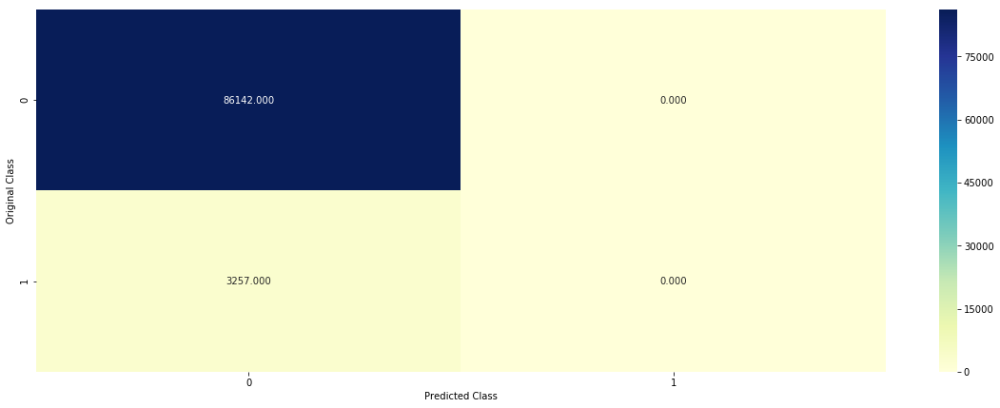

('--------------------', 'Precision matrix (Columm Sum=1)', '--------------------')


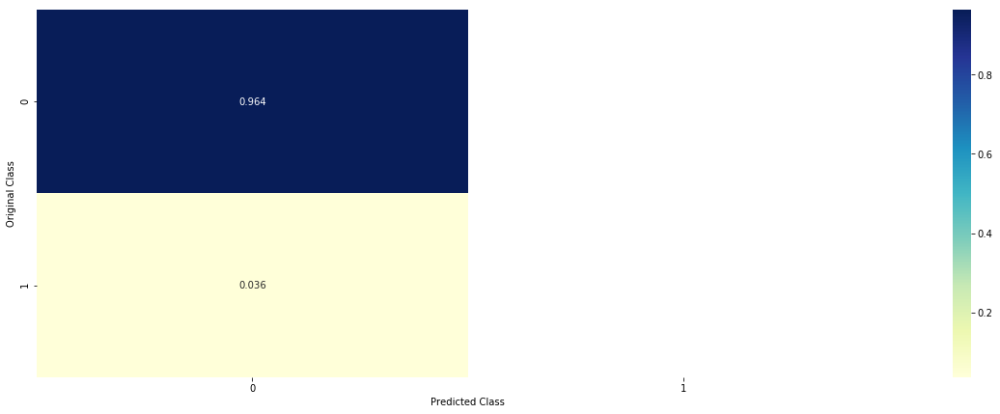

('--------------------', 'Recall matrix (Row sum=1)', '--------------------')


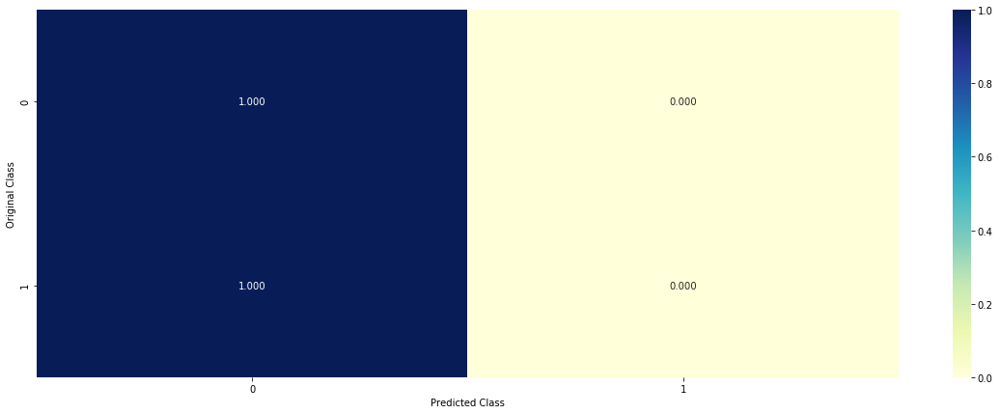

In [280]:
plot_confusion_matrix(target_cv_train,y_pred)

#### imbalance in nature doesn't let the ann to map the function so ann fails

## we used knn in order to look if there is any likelihood of neighbours in high degree space
## we used naive bayes to check whether there is probability likely hood in values of feature column
## we used logistic regression to find whether there is a linear sepration in high dimensional space
## we used random forest  in order to find any conditional information gain is possile for our features
## we used adaboost an essemling technique to correct errors from existing models 
## we used  gradient boosted decision trees 
## we used multilayer perceptron module 
## from the above we got more precision from xgboost classifier 
## due to imbalance set we couldn't get proper influence of models on the label 1 data
## we have to follow the above for 12 datasets in order to find which missing_value replacement mechanism suits our data well